In [1]:
from pathlib import Path
import os.path
import os
import numpy as np
import re
import pandas as pd
import shutil 
import networkx as nx
import dynetx as dn
import powerlaw
#from networkx.algorithms import community
import networkx.algorithms.community as nxcom
import community# as community_louvain
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
#from matplotlib import pyplot
import seaborn as sns
from functools import reduce

import collections
from ast import literal_eval
import powerlaw

In [2]:
# csv_path = 'D:/mm_thesis/D_metrics_all/'

# csv_path = 'D:/mm_thesis/the_files/d_metrics/'
csv_path = 'D:/mm_thesis/Software_graphs/D_graph/all_metrics/'
csv_path_l = os.listdir(csv_path)
c_path = [(os.path.join(csv_path,f)+"/") for f in csv_path_l]

In [48]:
c_path

['D:/mm_thesis/D_graph/all_metrics/Cassandra/',
 'D:/mm_thesis/D_graph/all_metrics/Chukwa/',
 'D:/mm_thesis/D_graph/all_metrics/httpClient/',
 'D:/mm_thesis/D_graph/all_metrics/Ivy/',
 'D:/mm_thesis/D_graph/all_metrics/Jena/']

In [49]:
look_path = 'D:/mm_thesis/Software_graphs/lookup.csv'
Lookup_df = pd.read_csv(look_path)


In [28]:
for i in c_path:
    metrics = os.listdir(i)
    metrics_fix = [i for i in metrics if i.find('metrics')!= -1]
    print(metrics_fix)
    m_file = os.path.join(i,metrics_fix[0])
    print(m_file)
    met_df = pd.read_csv(m_file)
    for i, row in met_df.iterrows():
        ver_name = row['Version']+'.tar.gz'
        stmp = Lookup_df[Lookup_df['tarfile'] == ver_name]['stamp'].values[0]
        print('stamp', stmp)
        row['t_stmp'] = stmp
    met_df.to_csv(m_file,encoding='utf-8',index= False)

['Cassandra_metrics.csv']
D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_metrics.csv
stamp 1254866400
stamp 1253224800
stamp 1260399600
stamp 1239400800
stamp 1263769200
stamp 1266879600
stamp 1269730800
stamp 1271282400
stamp 1274652000
stamp 1277503200
stamp 1280181600
stamp 1282514400
stamp 1287093600
stamp 1286748000
stamp 1289602800
stamp 1301608800
stamp 1306879200
stamp 1295391600
stamp 1296082800
stamp 1317506400
stamp 1297724400
stamp 1297897200
stamp 1301781600
stamp 1322866800
stamp 1302645600
stamp 1303423200
stamp 1305237600
stamp 1305842400
stamp 1306706400
stamp 1308866400
stamp 1309989600
stamp 1311199200
stamp 1311285600
stamp 1302213600
stamp 1318024800
stamp 1314741600
stamp 1304892000
stamp 1316037600
stamp 1304978400
stamp 1320879600
stamp 1319752800
stamp 1320015600
stamp 1302472800
stamp 1321311600
stamp 1322175600
stamp 1322521200
stamp 1297465200
stamp 1323817200
stamp 1321052400
stamp 1326409200
stamp 1343858400
stamp 1329865200
stamp 1330815600
stamp 13

In [50]:
c_files = c_path[4:]
print(c_files)

['D:/mm_thesis/D_graph/all_metrics/Jena/']


In [57]:
# for p in c_files:
 for p in c_path:
    met_files =  os.listdir(p)
    p1 = p[:-1]
    s1 = p1.rfind("/")
    f_save = p1[s1+1:] 
    print(p)
    print(met_files)
    print(30*"__")
    f_m = [(os.path.join(p,i ))for i in met_files]

    soft_m = [f for f in f_m if f.find('metrics.csv')!=-1]
    
    konect_cdot = [f for f in f_m if f.find('Call_mat')!= -1]
    network_cdot = [f for f in f_m if f.find('cdot')!= -1]

    konect_coll = [f for f in f_m if f.find('Coll_mat')!= -1]
    network_coll = [f for f in f_m if f.find('colldot')!= -1]

    konect_Inh = [f for f in f_m if f.find('Inh_mat')!= -1]
    network_Inh = [f for f in f_m if f.find('Inhdot')!= -1]
    
    
    
    
    soft_metric = pd.read_csv(soft_m[0])
#     print(soft_metric.head(2))

    Konect_call = pd.read_csv(konect_cdot[0])
    call_metric = pd.read_csv(network_cdot[0])

    
    Konect_collab = pd.read_csv(konect_coll[0])
    collab_metric = pd.read_csv(network_coll[0])
    
    Konect_Inhert = pd.read_csv(konect_Inh[0])
    Inh_metric = pd.read_csv(network_Inh[0])
    
    soft_metric = soft_metric.sort_values(by=['t_stmp'])
    
    Konect_call = Konect_call.sort_values(by=['t_stmp'])
    call_metric = call_metric.sort_values(by=['t_stmp'])
    
    collab_metric = collab_metric.sort_values(by=['t_stmp'])
    Konect_collab =  Konect_collab.sort_values(by=['t_stmp'])
    
    Konect_Inher = Konect_Inhert.sort_values(by=['t_stmp'])
    Inh_metric =  Inh_metric.sort_values(by=['t_stmp'])
#############################################################################################

#     dfs = [soft_metric, konect_metric, call_metric]


    dfs = [soft_metric, Konect_call, call_metric]

    
    df_final = reduce(lambda left,right: pd.merge(left,right,on=['Version','t_stmp']), dfs)
#     print(df_final.head(2))

#     print(df_final.head(2)) 
#     print(30 * '^')
    df_met = df_final[['class_connn', 'avg_cyclomatic', 'method_loc',
                   'avg_numbermethods', 'cbo', 'dit', 'lcom', 'attr', 'children',
                   'methods', 'public_att', 'public_methods', 'response_class', 'str_comp']]
    df_net = df_final[['squares', 'diameter', 'stars', '2-stars', '3-stars',
                   '4-stars', 'P-gamma','no_nodes', 'no_edges',
                   'avg_degree','no_comm', 'avg_shortest_path',
                   'sub_density','avg_clust','SCC', 'WCC','LWC_nodes','LWC_edgeds']]
#     print(df_met.columns)
#     print(df_net.columns)
#     df =  pd.concat([df_net, df_met], 
#                      axis=1, keys=['df_net','df_met']).corr().loc['df_net','df_met']
    
    df =  pd.concat([df_met,df_net ],
                    axis=1, keys=[ 'df_met','df_net']).corr().loc[ 'df_net','df_met']
#     print(df.head(2))
    
#    # print(df_met.head(2))
    to_save_call = p +f_save+ '_heat_s_call_fixed.png'
    print(to_save_call)
    indexNamesArr = df.index.values
    plt.figure(figsize=(24, 20))
    y_label = list(indexNamesArr)
    corr_heat = sns.heatmap(df,annot=True,xticklabels=df.columns.values,cmap="YlGnBu",)
        #plt.title(f_name)
    corr_heat.set_title(f_save, fontdict={'fontsize':16}, pad=16)
        #corr_heat.set_xticklabels(rotation=30)
    corr_heat.set_xticklabels(corr_heat.get_xticklabels(),rotation=45)
    #corr_1.to_csv((p+f_save+'_cor.csv'))
    figure = corr_heat.get_figure() 
    plt.savefig(to_save_call)
    
    
    
#     df_met = df_final[['class_connn', 'avg_cyclomatic', 'method_loc',
#                    'avg_numbermethods', 'cbo', 'dit', 'lcom', 'attr', 'children',
#                    'methods', 'public_methods', 'response_class', 'str_comp']]
#     df_net = df_final[['squares', 'diameter', 'stars', '2-stars', '3-stars',
#                    '4-stars', 'P-gamma','no_nodes', 'no_edges',
#                    'avg_degree','no_comm', 'avg_shortest_path',
#                    'sub_density','avg_clust','SCC', 'WCC','LWC_nodes','LWC_edgeds']]
    
    
    
    
    
##################################################################################################################


    dfc = [soft_metric, Konect_collab, collab_metric]
    dfc_final = reduce(lambda left,right: pd.merge(left,right,on=['Version','t_stmp']), dfs)


    dfc_met = df_final[['class_connn', 'avg_cyclomatic', 'method_loc',
                   'avg_numbermethods', 'cbo', 'dit', 'lcom', 'attr', 'children',
                   'methods', 'public_att', 'public_methods', 'response_class', 'str_comp']]


# dfc_met_1 = df_final[['class_connn', 'avg_cyclomatic', 'method_loc',
#                    'avg_numbermethods', 'cbo', 'dit', 'lcom' ]]

# dfc_met_2 = df_final[[ 'attr', 'children',
#                    'methods', 'public_att', 'public_methods', 'response_class', 'str_comp']]




    dfc_net = df_final[['squares', 'diameter', 'stars', '2-stars', '3-stars',
                       '4-stars', 'P-gamma','no_nodes', 'no_edges',
                       'avg_degree','no_comm', 'avg_shortest_path',
                       'sub_density','avg_clust','SCC', 'WCC','LWC_nodes','LWC_edgeds']]


# dfc_net_1 = df_final[['squares', 'diameter', 'stars', '2-stars', '3-stars',
#                    '4-stars', 'p_law', 'P-gamma',]]


# dfc_net_2= df_final[['no_nodes', 'no_edges',
#                    'avg_in_degree', 'avg_out_degree']]


# dfc_net_3 = df_final[['no_comm', 'avg_shortest_path',
#                    'sub_density','avg_clust','SCC', 'WCC','LWC_nodes','LWC_edgeds']]


    dfc =  pd.concat([dfc_met, dfc_net],
                     axis=1, keys=['dfc_met', 'dfc_net']).corr().loc['dfc_net', 'dfc_met']

    to_save_coll = p +f_save+ '_heat_s_collab_fixed.png'
    print(to_save_coll)
    indexNamesArr = dfc.index.values
    plt.figure(figsize=(24, 20))
    y_label = list(indexNamesArr)
    corr_heat = sns.heatmap(dfc,annot=True,xticklabels=dfc.columns.values,cmap="YlGnBu",)
    #plt.title(f_name)
    corr_heat.set_title(f_save, fontdict={'fontsize':16}, pad=16)
    #corr_heat.set_xticklabels(rotation=30)
    corr_heat.set_xticklabels(corr_heat.get_xticklabels(),rotation=45)
    #corr_1.to_csv((p+f_save+'_cor.csv'))
    figure = corr_heat.get_figure() 
    plt.savefig(to_save_coll)



# #############################################################################################

# #     dfs = [soft_metric, konect_metric, call_metric]


    dfs = [soft_metric, Konect_Inher, Inh_metric]
    df_final = reduce(lambda left,right: pd.merge(left,right,on=['Version','t_stmp']), dfs)

#     print(df_final.head(2)) 
#     print(30 * '^')
    df_met = df_final[['class_connn', 'avg_cyclomatic', 'method_loc',
                   'avg_numbermethods', 'cbo', 'dit', 'lcom', 'attr', 'children',
                   'methods', 'public_att', 'public_methods', 'response_class', 'str_comp']]
    df_net = df_final[['squares', 'diameter', 'stars', '2-stars', '3-stars',
                   '4-stars', 'P-gamma','no_nodes', 'no_edges',
                   'avg_degree','no_comm', 'avg_shortest_path',
                   'sub_density','avg_clust','SCC', 'WCC','LWC_nodes','LWC_edgeds']]
#     df =  pd.concat([df_net, df_met], 
#                      axis=1, keys=['df_net','df_met']).corr().loc['df_net','df_met']
    
    df =  pd.concat([df_met,df_net ],
                    axis=1, keys=[ 'df_met','df_net']).corr().loc[ 'df_net','df_met']
    
   # print(df_met.head(2))
    to_save_call = p +f_save+ '_heat_s_Inh_fixed.png'
    print(to_save_call)
    indexNamesArr = df.index.values
    plt.figure(figsize=(24, 20))
    y_label = list(indexNamesArr)
    corr_heat = sns.heatmap(df,annot=True,xticklabels=df.columns.values,cmap="YlGnBu",)
        #plt.title(f_name)
    corr_heat.set_title(f_save, fontdict={'fontsize':16}, pad=16)
        #corr_heat.set_xticklabels(rotation=30)
    corr_heat.set_xticklabels(corr_heat.get_xticklabels(),rotation=45)
    #corr_1.to_csv((p+f_save+'_cor.csv'))
    figure = corr_heat.get_figure() 
    plt.savefig(to_save_call)
    
    
    
    df_met = df_final[['class_connn', 'avg_cyclomatic', 'method_loc',
                   'avg_numbermethods', 'cbo', 'dit', 'lcom', 'attr', 'children',
                   'methods', 'public_methods', 'response_class', 'str_comp']]
    df_net = df_final[['squares', 'diameter', 'stars', '2-stars', '3-stars',
                   '4-stars', 'P-gamma','no_nodes', 'no_edges',
                   'avg_degree','no_comm', 'avg_shortest_path',
                   'sub_density','avg_clust','SCC', 'WCC','LWC_nodes','LWC_edgeds']]
    
    
    
    
    
##################################################################################################################


     

D:/mm_thesis/D_graph/all_metrics/Cassandra/
['Cassandra_Call_mat.csv', 'Cassandra_cdot_m.csv', 'Cassandra_colldot_m.csv', 'Cassandra_Coll_mat.csv', 'Cassandra_Inhdot_m.csv', 'Cassandra_Inh_mat.csv', 'Cassandra_metrics.csv']
____________________________________________________________
D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_heat_s_call_fixed.png
D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_heat_s_collab_fixed.png
D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_heat_s_Inh_fixed.png
D:/mm_thesis/D_graph/all_metrics/Chukwa/
['Chukwa_Call_mat.csv', 'chukwa_cdot_m.csv', 'chukwa_colldot_m.csv', 'Chukwa_Coll_mat.csv', 'chukwa_Inhdot_m.csv', 'Chukwa_Inh_mat.csv', 'Chukwa_metrics.csv']
____________________________________________________________
D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_heat_s_call_fixed.png
D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_heat_s_collab_fixed.png
D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_heat_s_Inh_fixed.png
D:/mm_thesis/D_graph

In [65]:
s_path = 'D:/mm_thesis/Software_graphs/D_graph/scatter_plots/'
c_path

['D:/mm_thesis/D_graph/all_metrics/Cassandra/',
 'D:/mm_thesis/D_graph/all_metrics/Chukwa/',
 'D:/mm_thesis/D_graph/all_metrics/httpClient/',
 'D:/mm_thesis/D_graph/all_metrics/Ivy/',
 'D:/mm_thesis/D_graph/all_metrics/Jena/']

____________________________________________________________
files : ['D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_Call_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_cdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_colldot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_Coll_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_heat_s_call_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_heat_s_collab_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_heat_s_Inh_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_Inhdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_Inh_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Cassandra/Cassandra_metrics.csv']
_________________
s_path    ; ['D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/']
83
Colunm Name :  squares
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_class_co

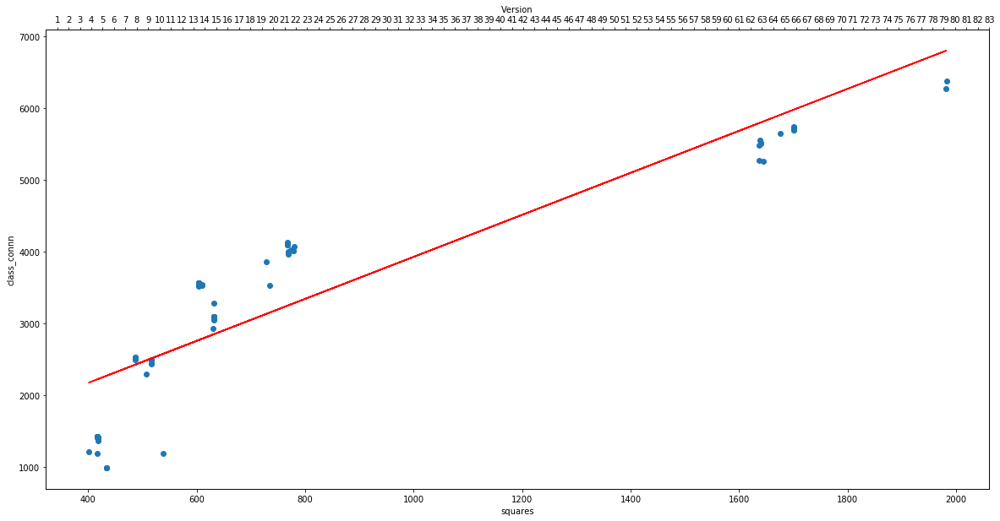

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_avg_cyclomaticInh_mm.png


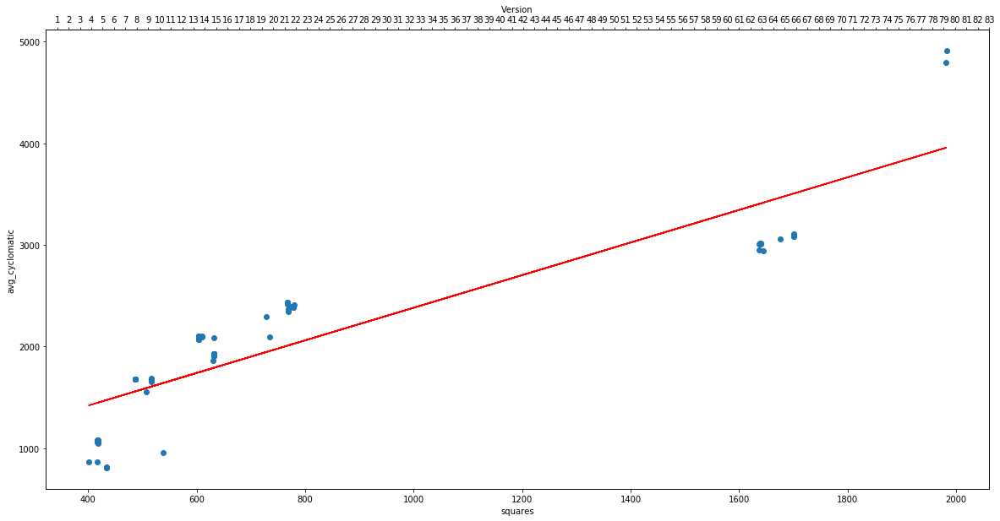

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_cboInh_mm.png


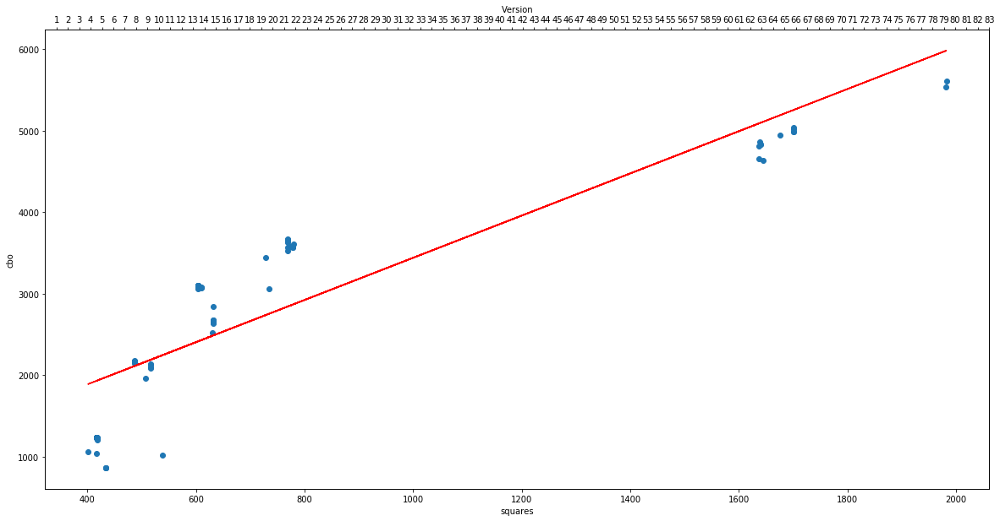

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_ditInh_mm.png


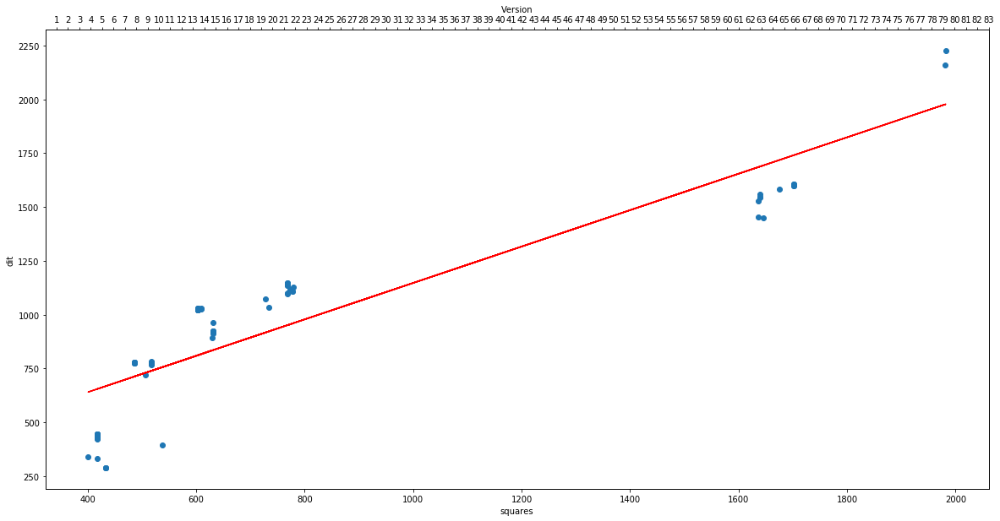

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_lcomInh_mm.png


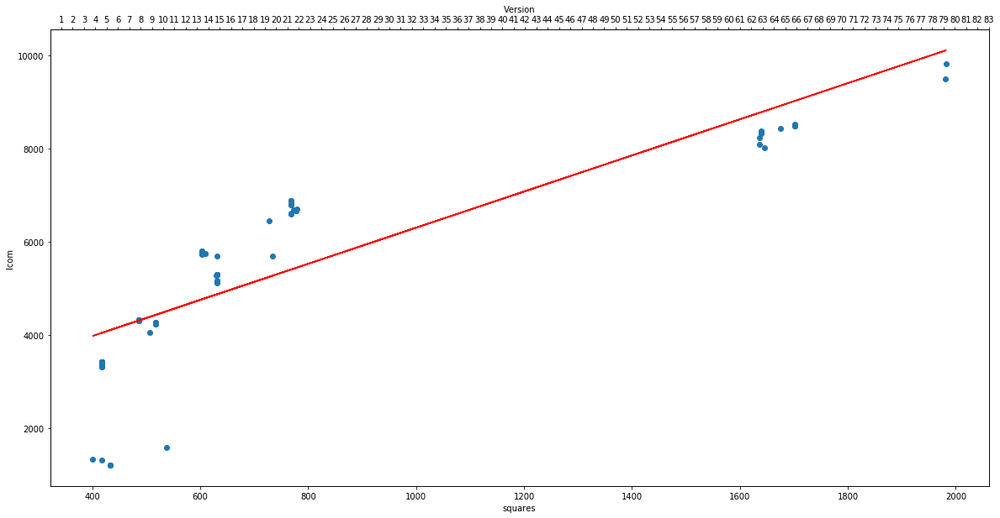

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_childrenInh_mm.png


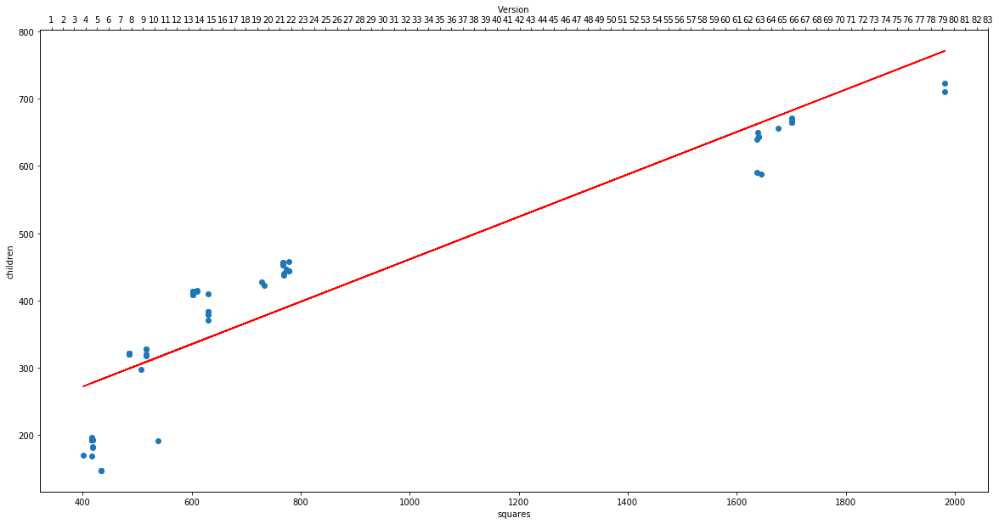

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_response_classInh_mm.png


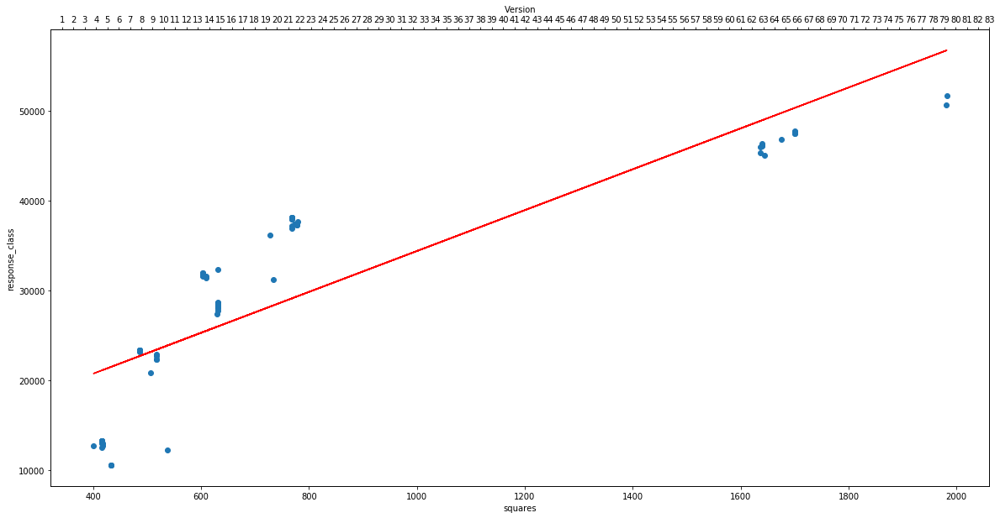

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/squares_str_compInh_mm.png


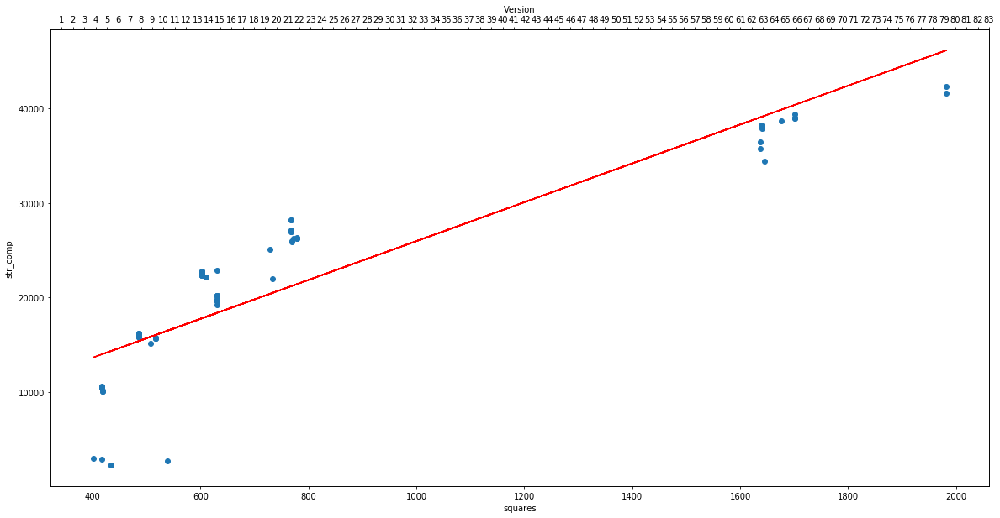

Colunm Name :  P-gamma
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_class_connnInh_mm.png


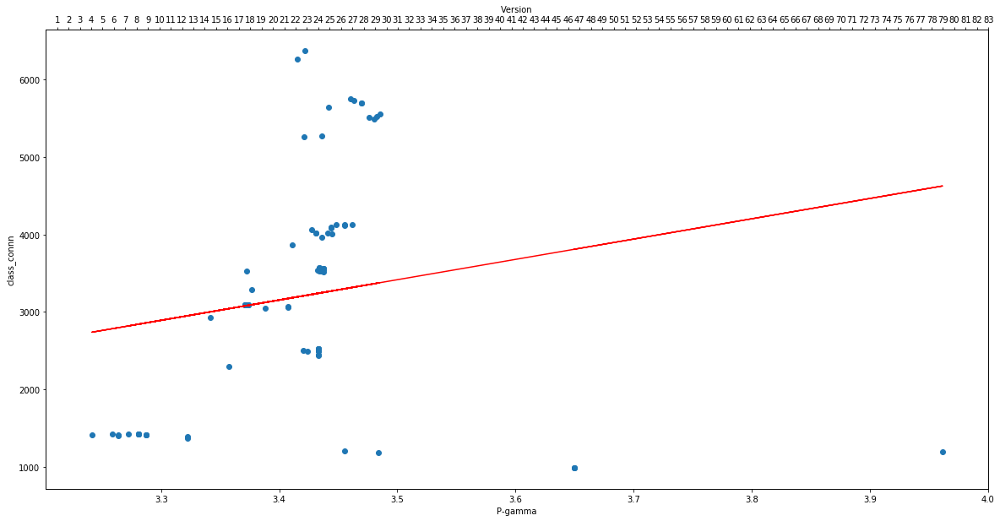

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_avg_cyclomaticInh_mm.png


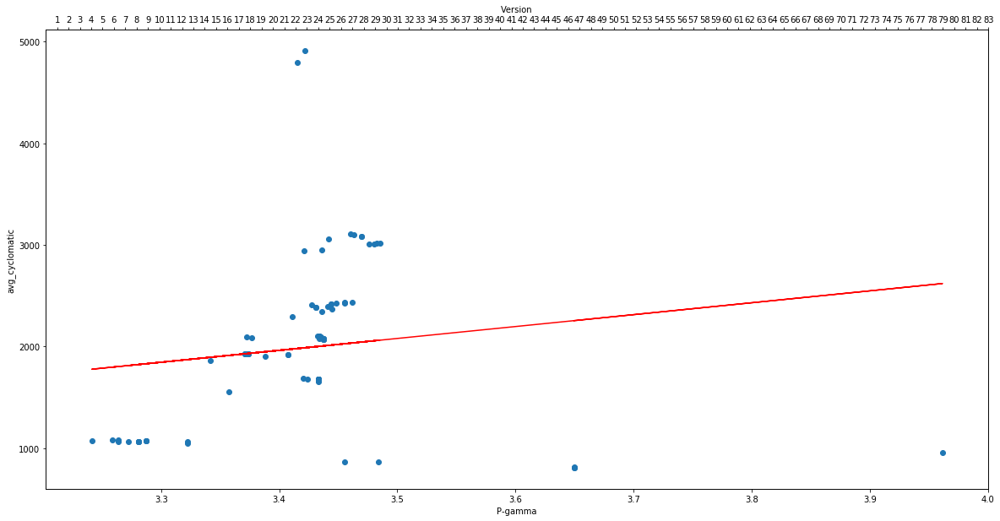

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_cboInh_mm.png


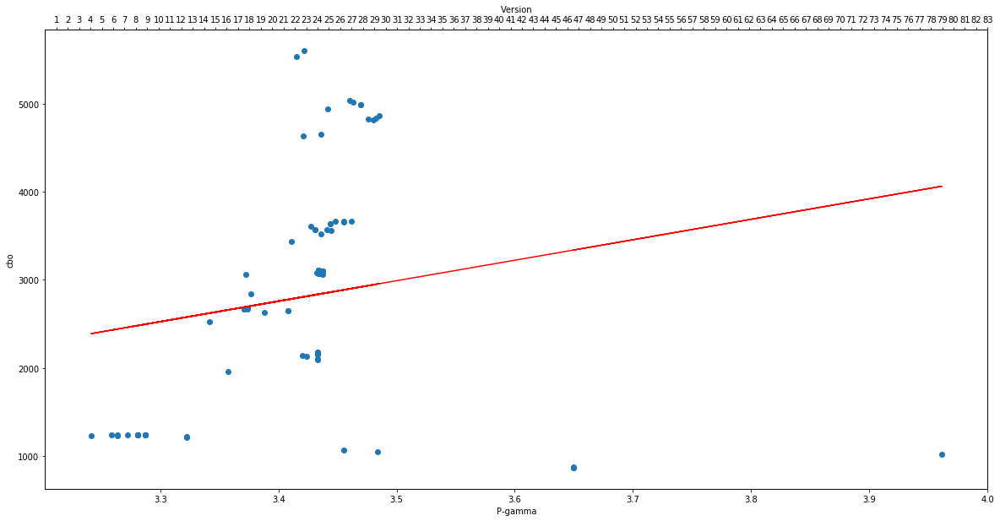

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_ditInh_mm.png


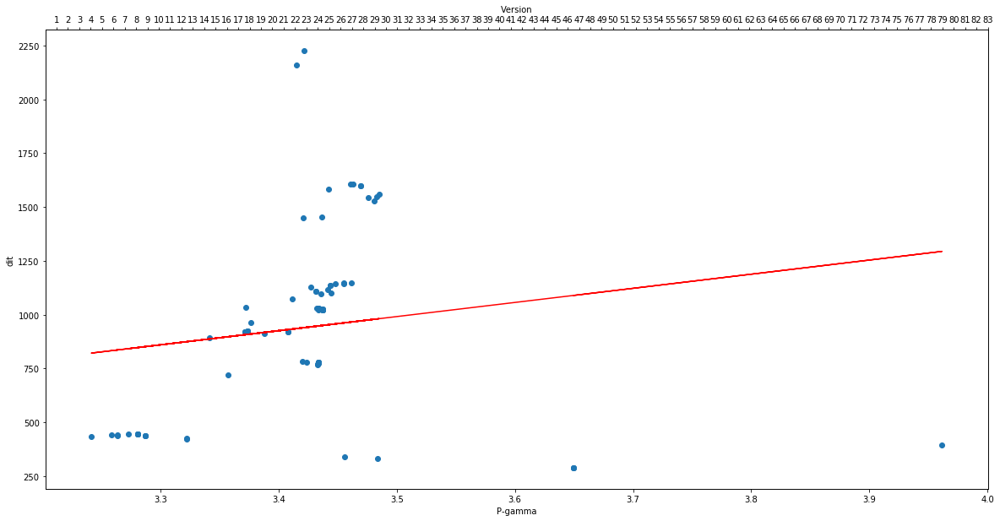

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_lcomInh_mm.png


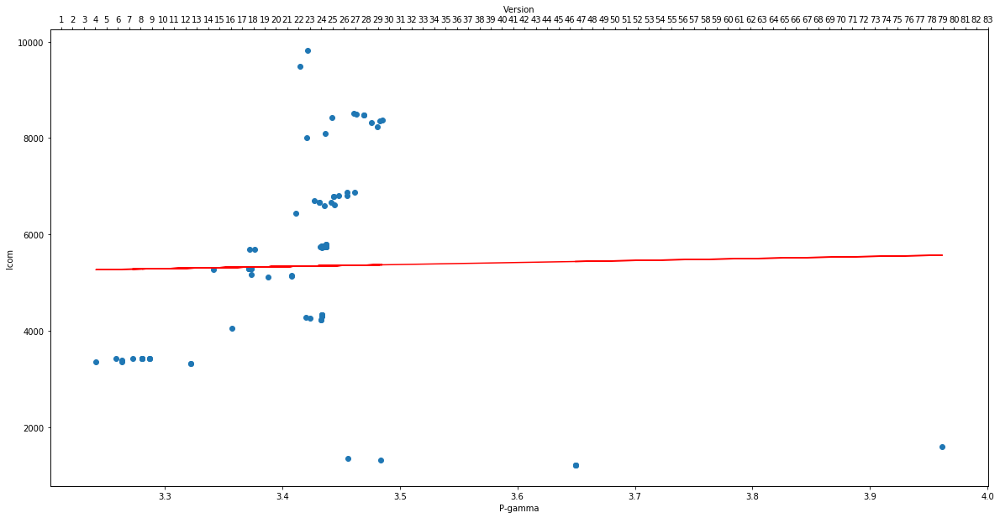

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_childrenInh_mm.png


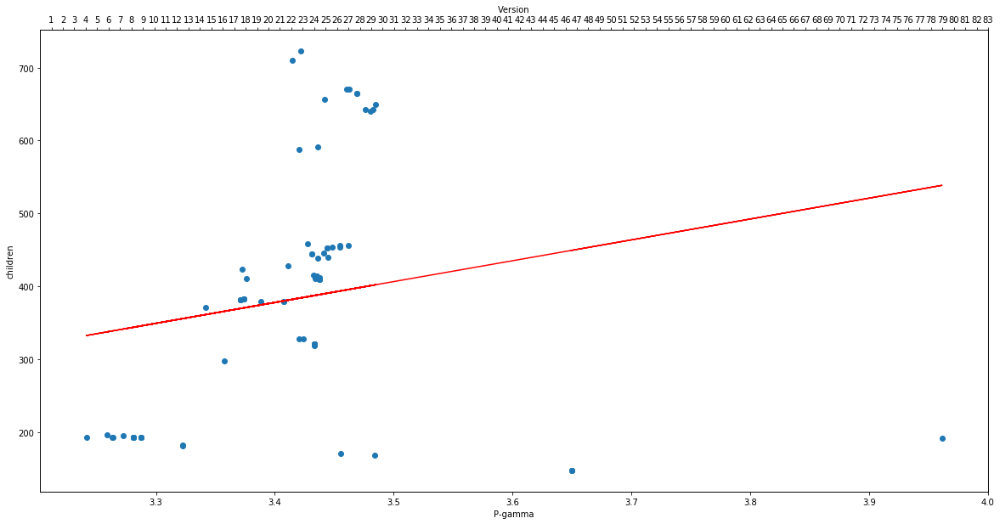

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_response_classInh_mm.png


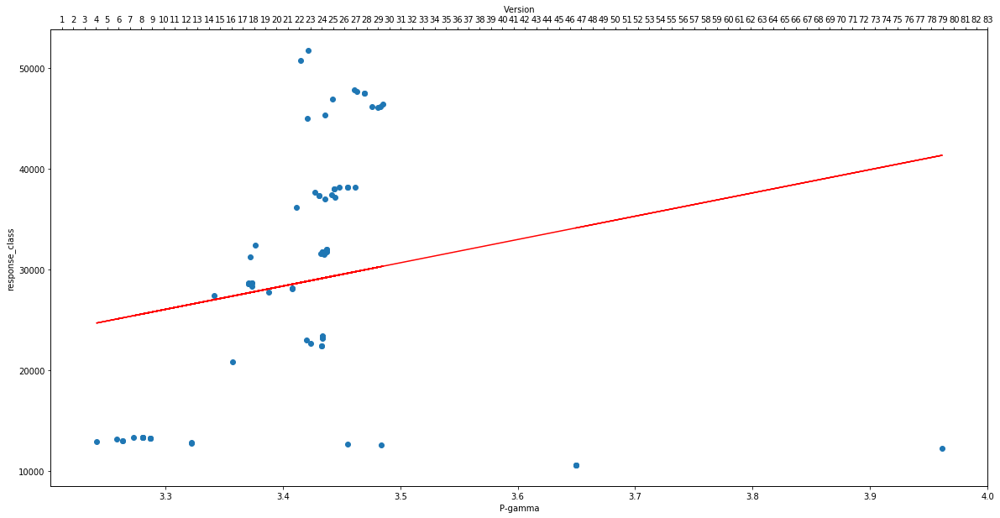

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/P-gamma_str_compInh_mm.png


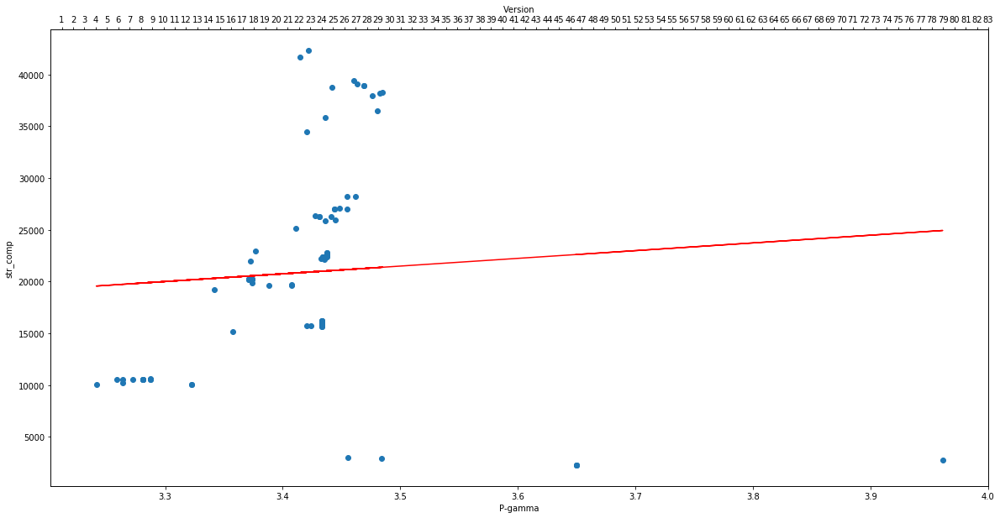

Colunm Name :  avg_degree
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_class_connnInh_mm.png


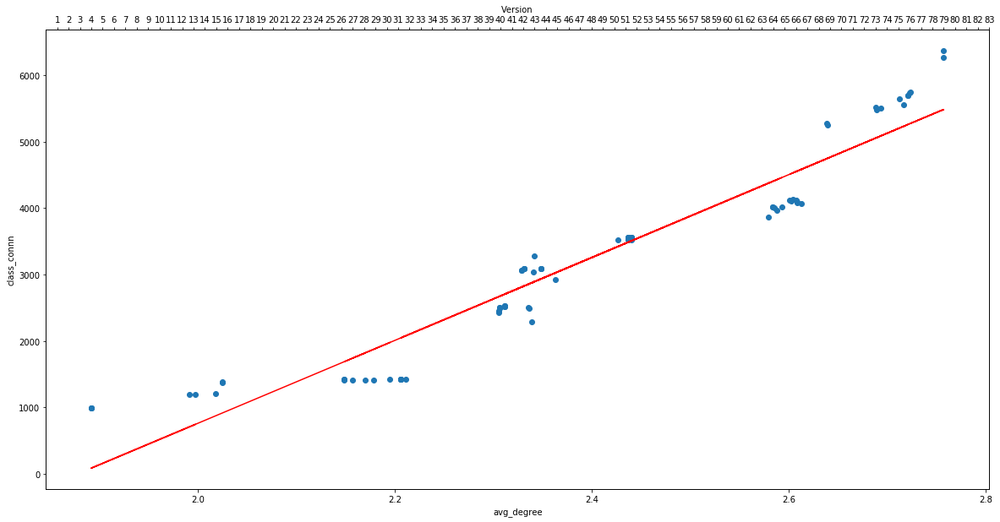

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_avg_cyclomaticInh_mm.png


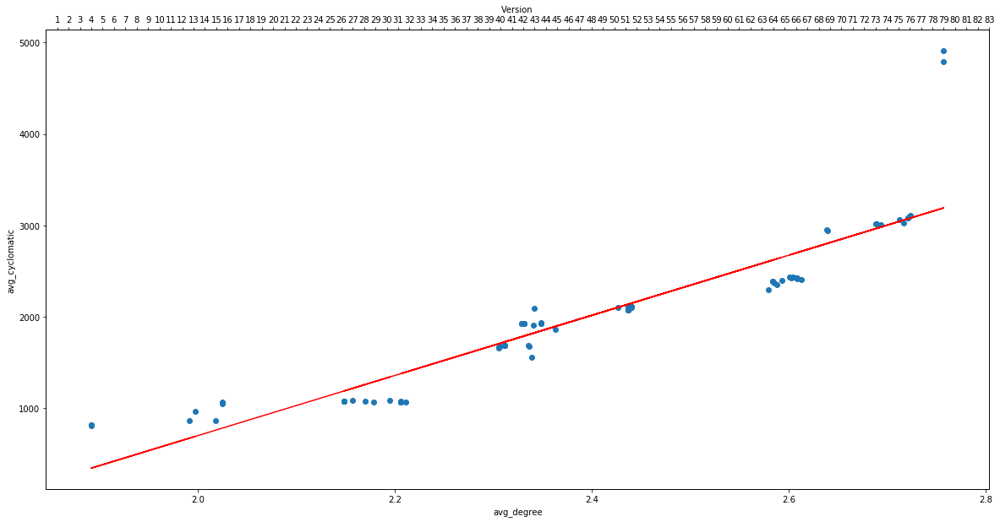

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_cboInh_mm.png


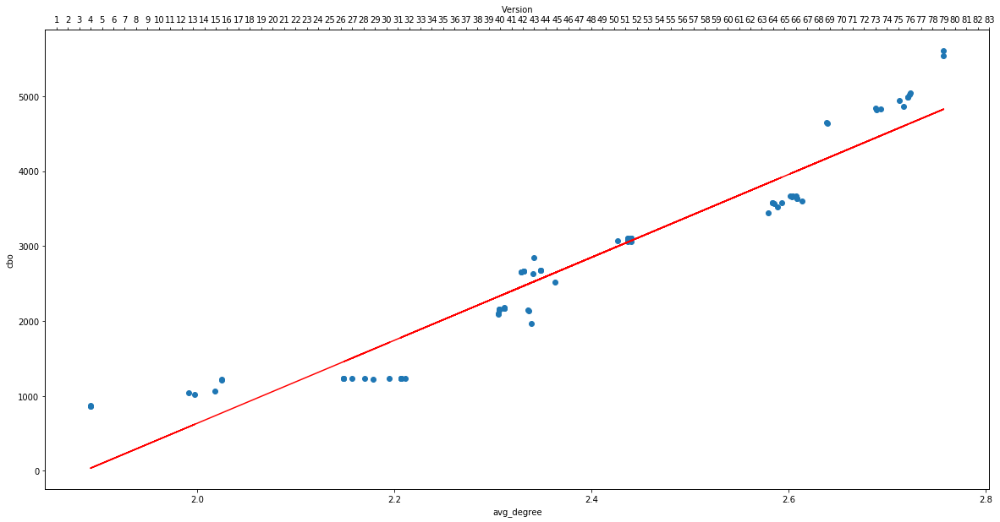

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_ditInh_mm.png


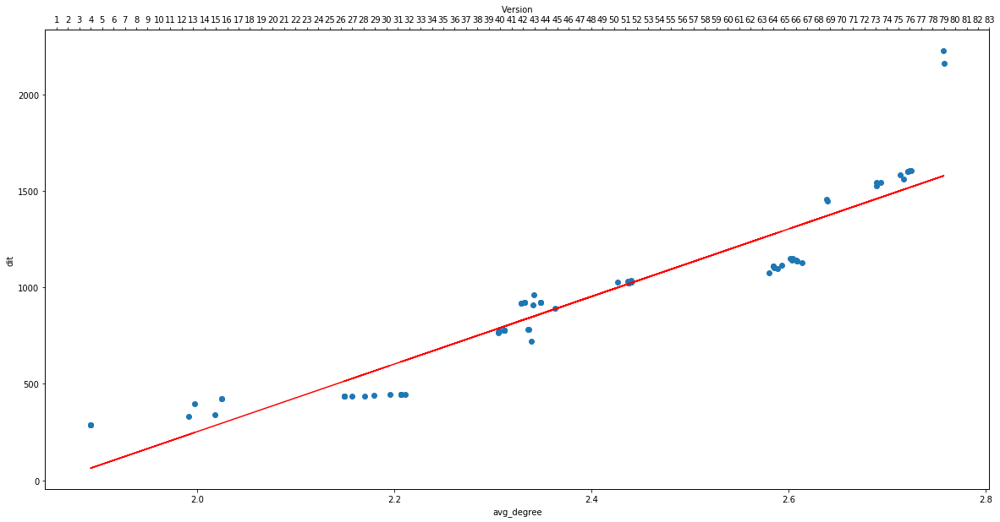

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_lcomInh_mm.png


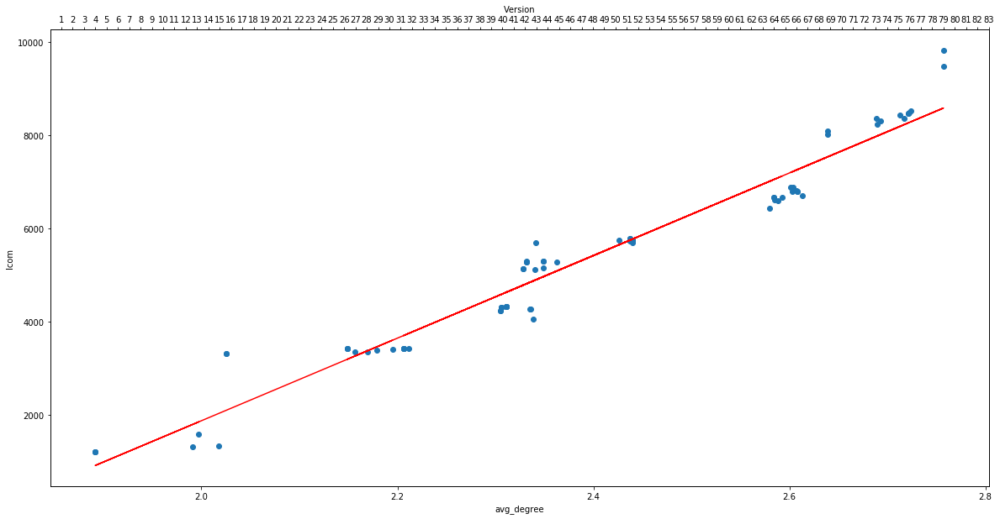

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_childrenInh_mm.png


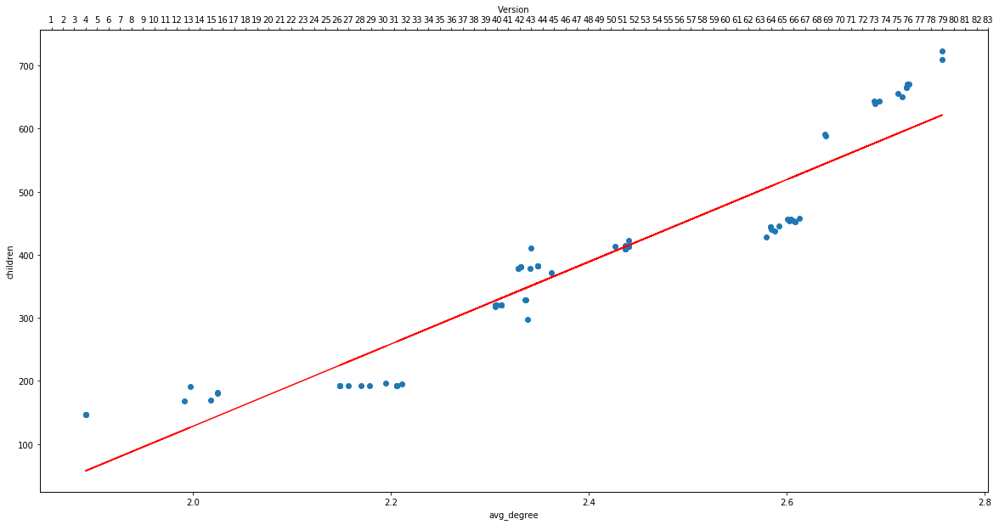

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_response_classInh_mm.png


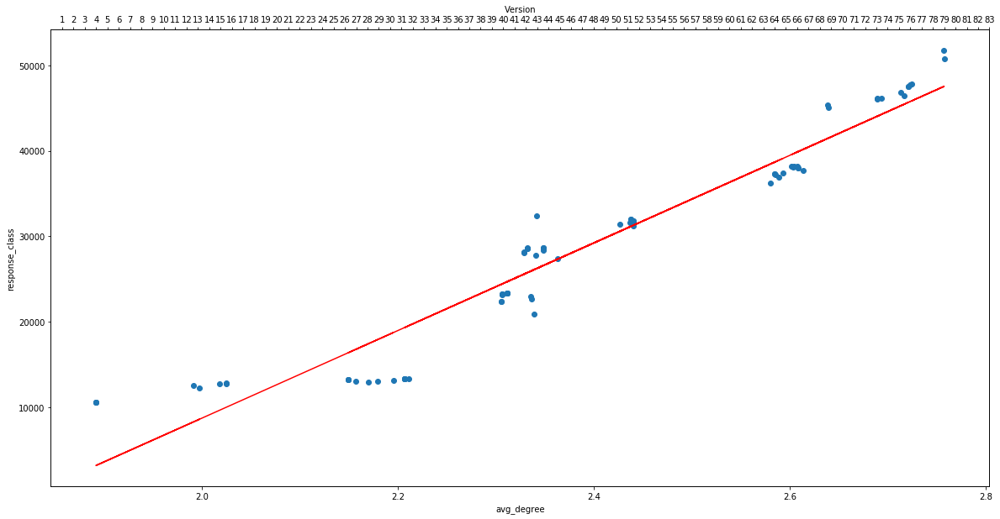

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_degree_str_compInh_mm.png


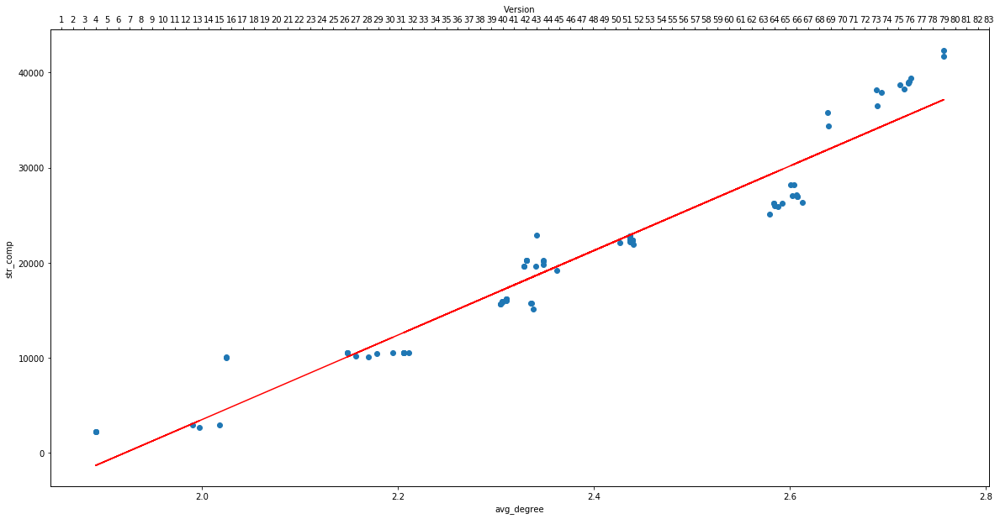

Colunm Name :  no_comm
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_class_connnInh_mm.png


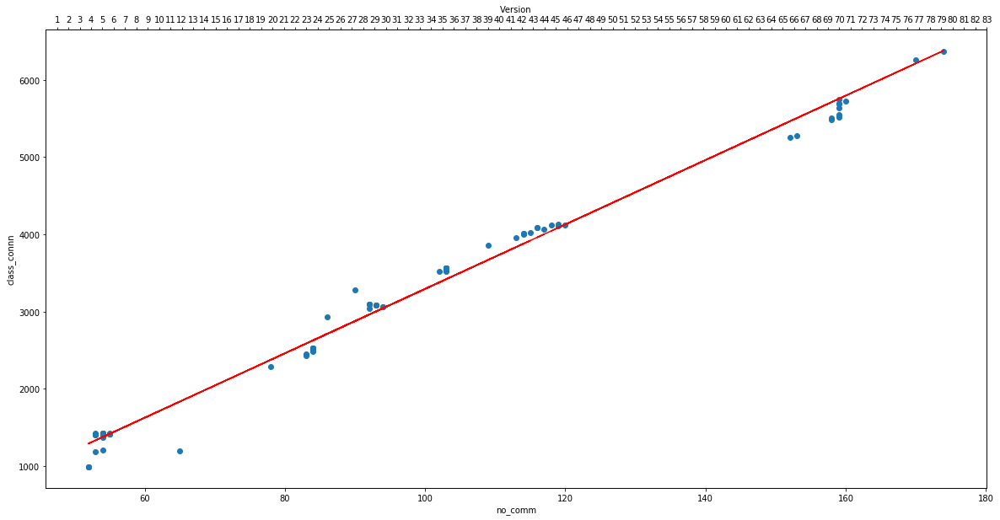

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_avg_cyclomaticInh_mm.png


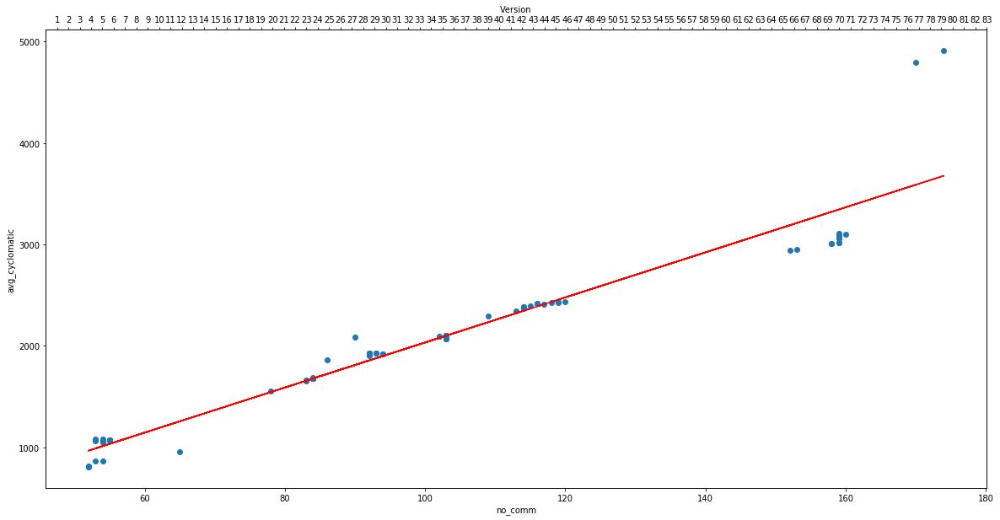

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_cboInh_mm.png


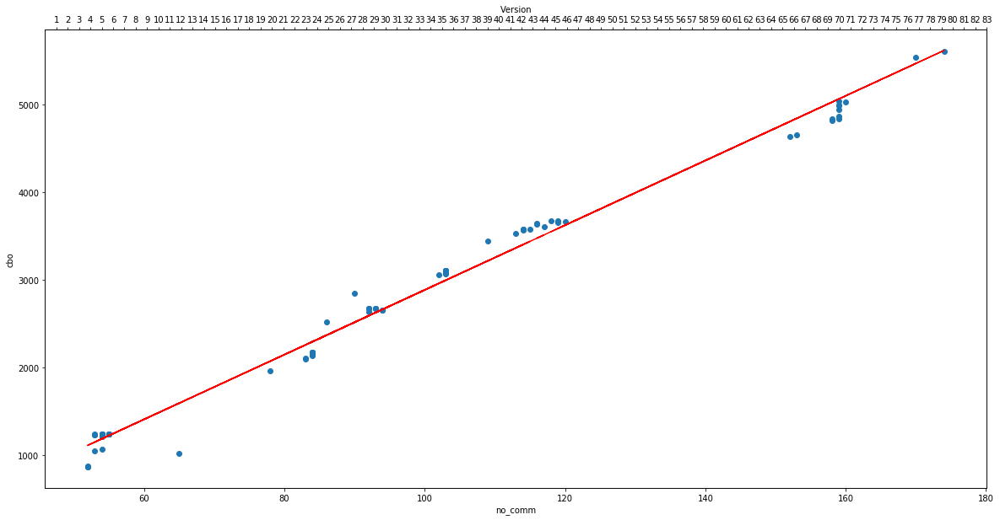

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_ditInh_mm.png


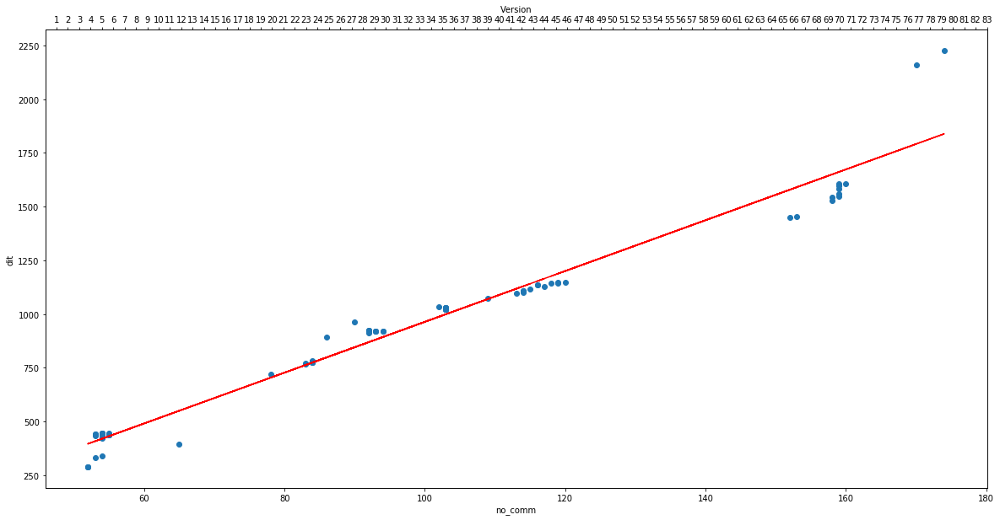

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_lcomInh_mm.png


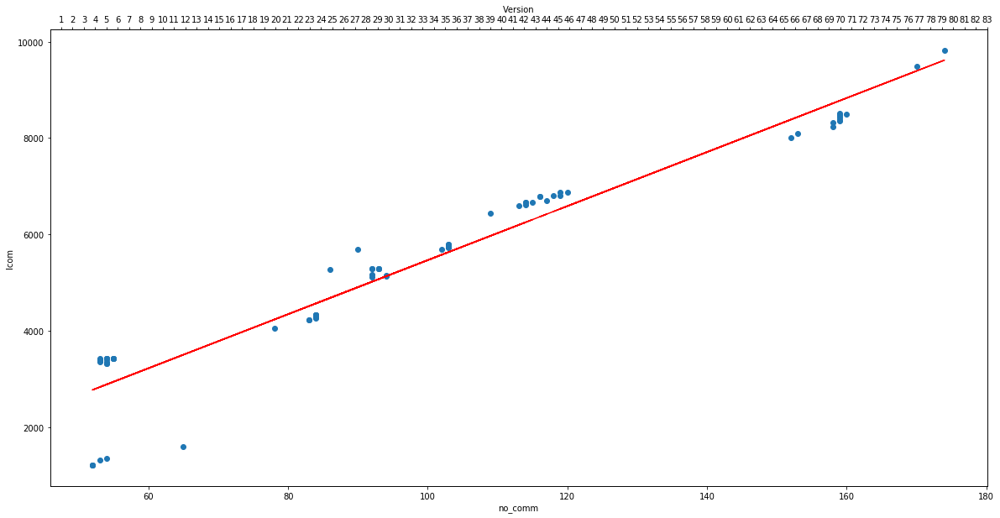

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_childrenInh_mm.png


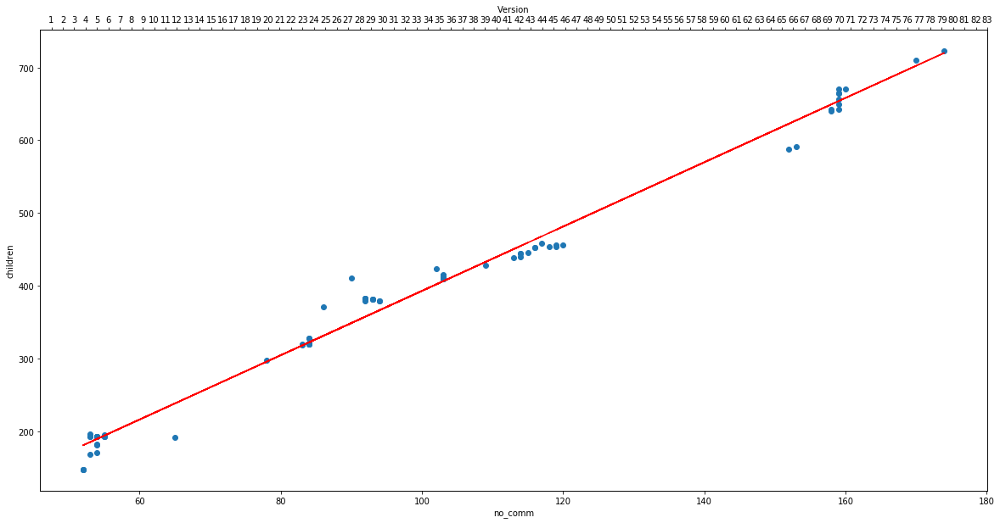

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_response_classInh_mm.png


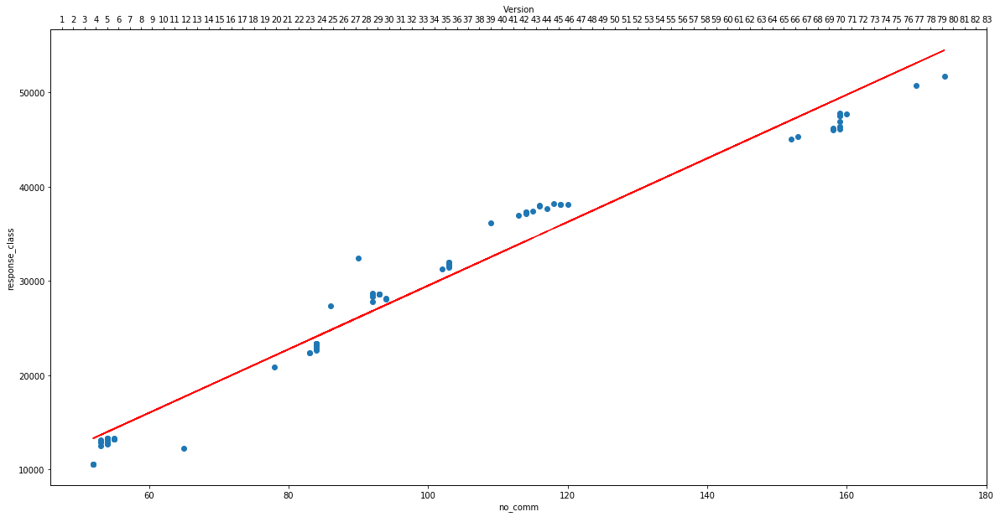

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/no_comm_str_compInh_mm.png


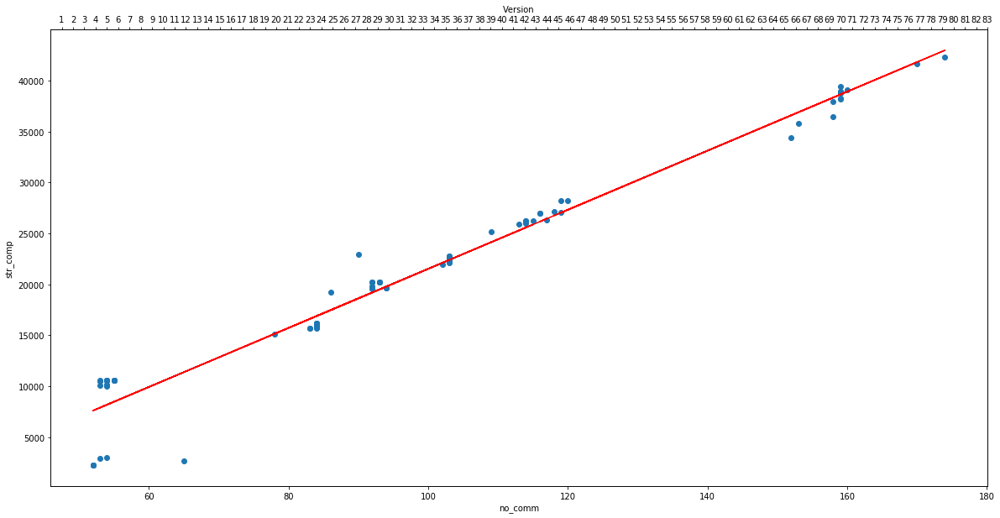

Colunm Name :  avg_shortest_path
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_class_connnInh_mm.png


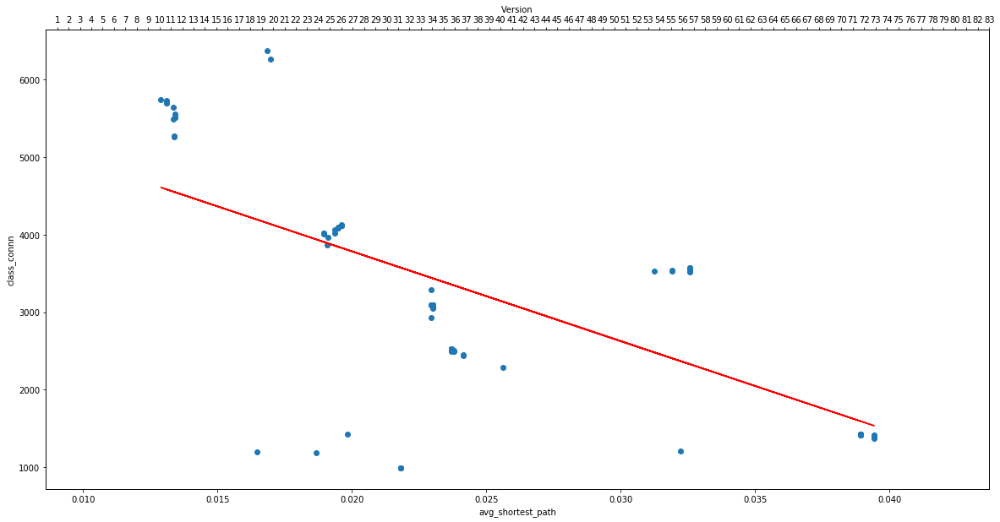

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_avg_cyclomaticInh_mm.png


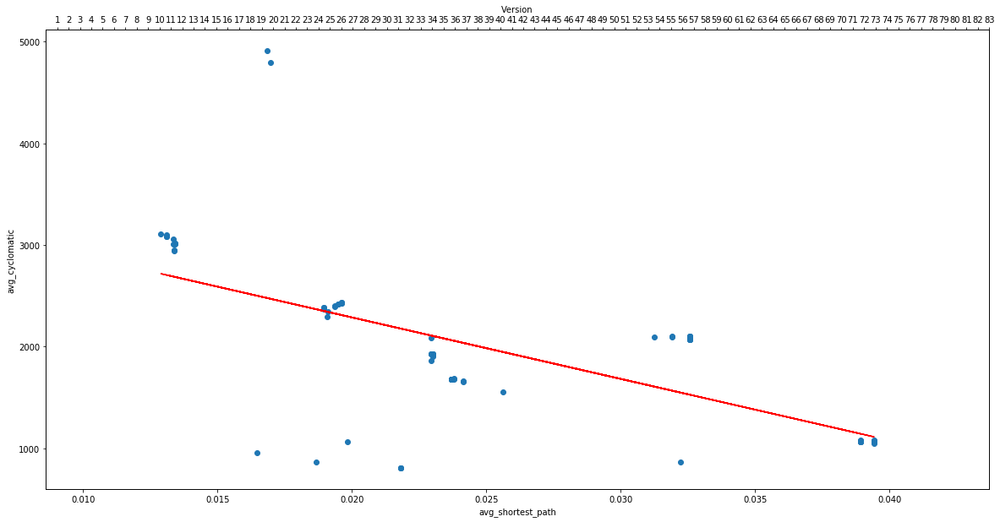

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_cboInh_mm.png


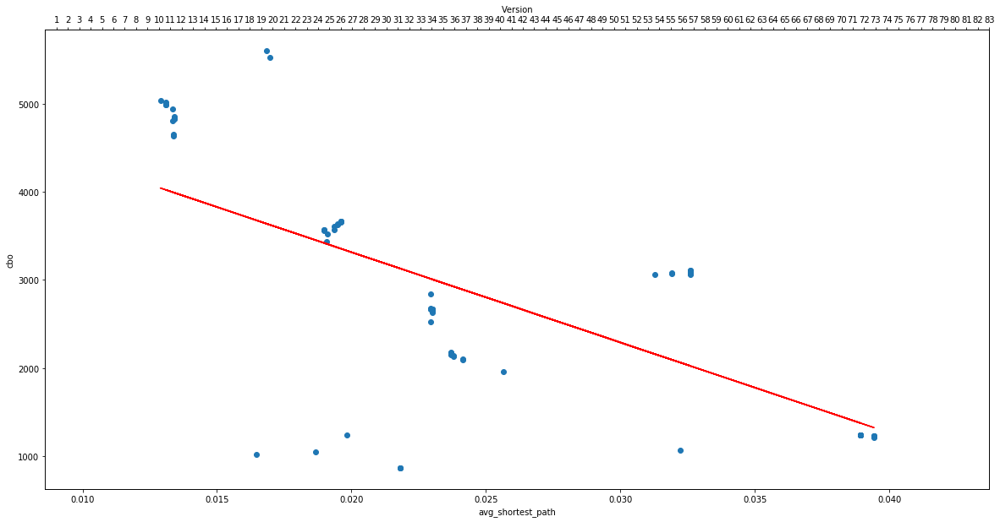

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_ditInh_mm.png


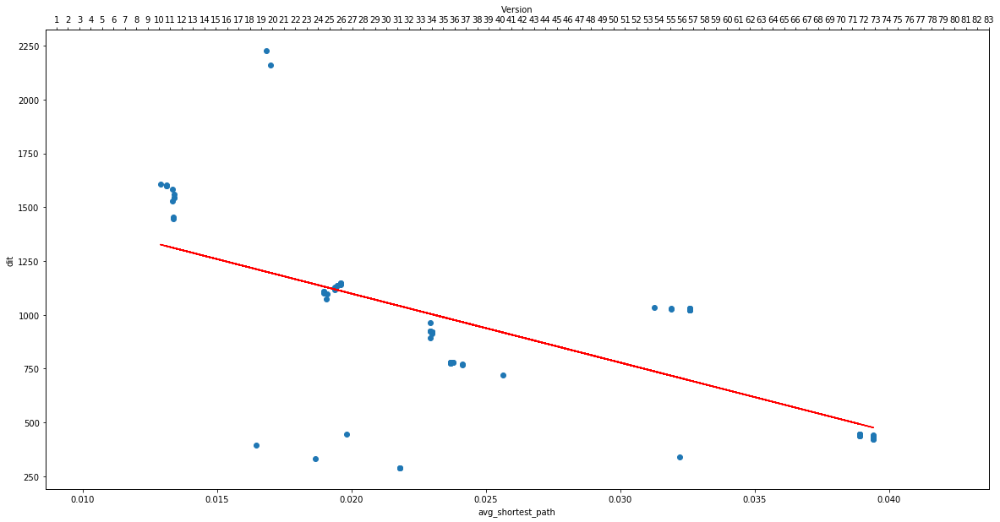

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_lcomInh_mm.png


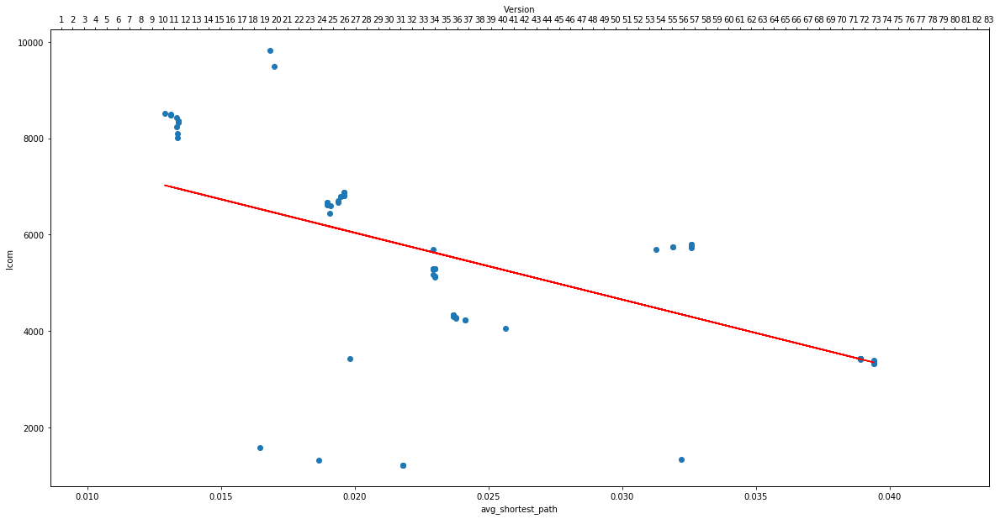

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_childrenInh_mm.png


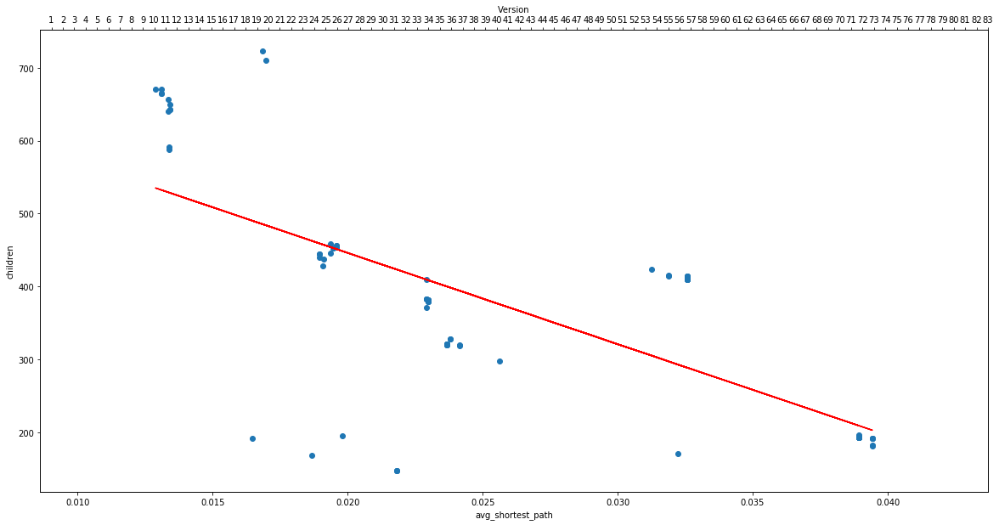

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_response_classInh_mm.png


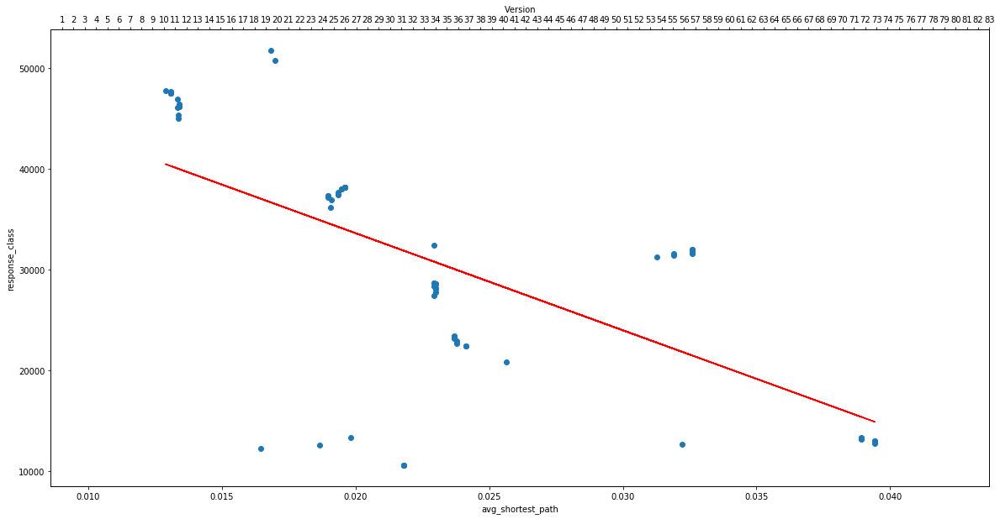

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_shortest_path_str_compInh_mm.png


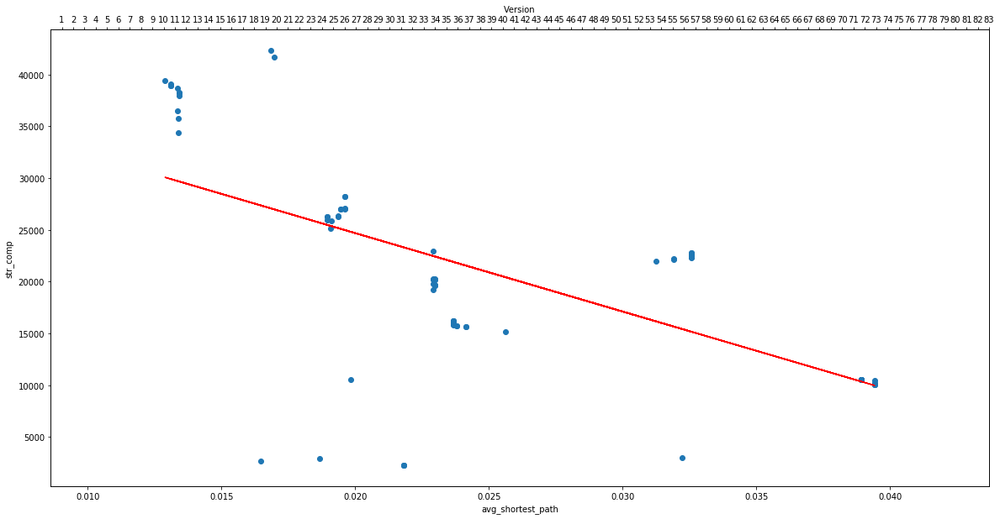

Colunm Name :  sub_density
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_class_connnInh_mm.png


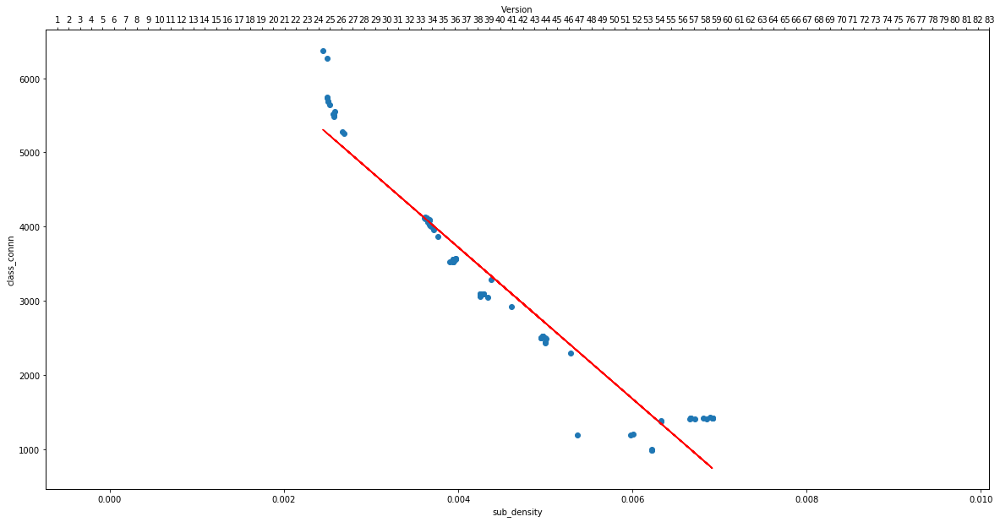

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_avg_cyclomaticInh_mm.png


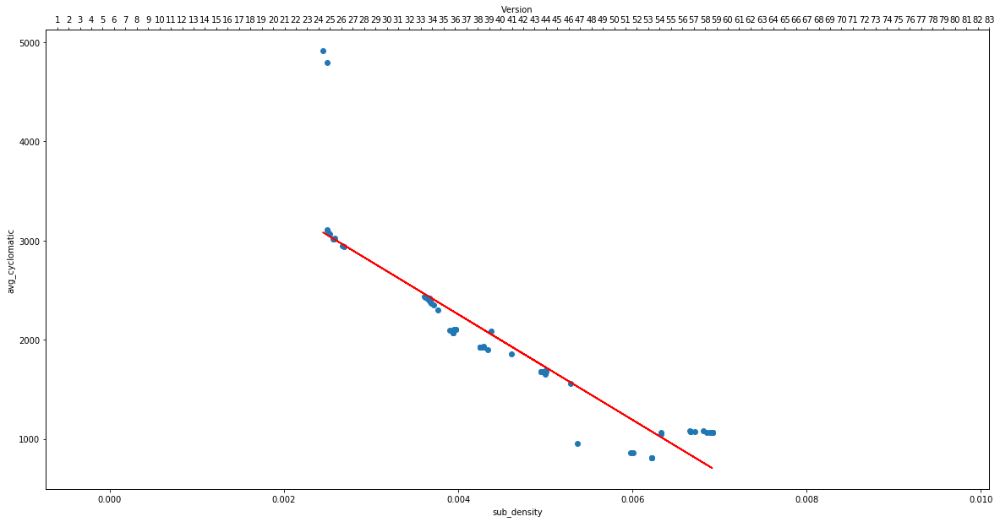

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_cboInh_mm.png


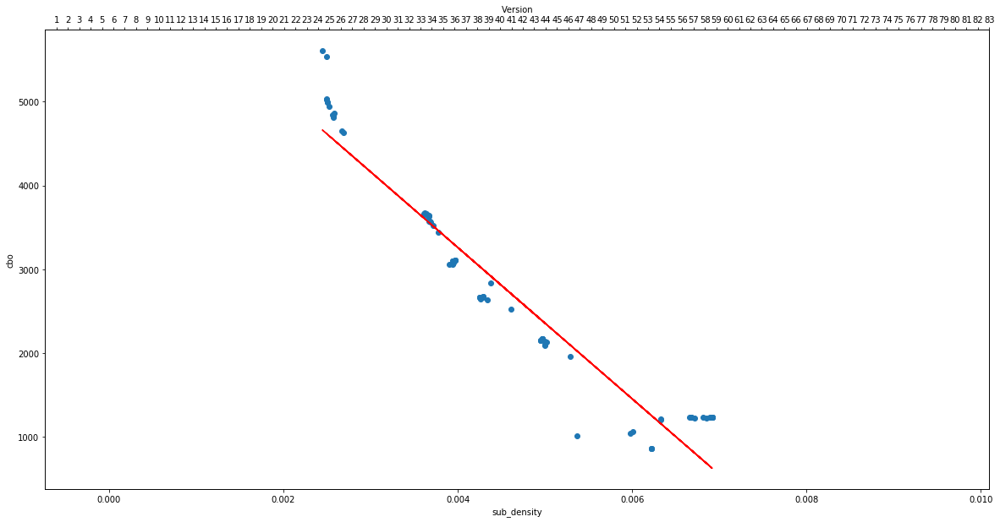

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_ditInh_mm.png


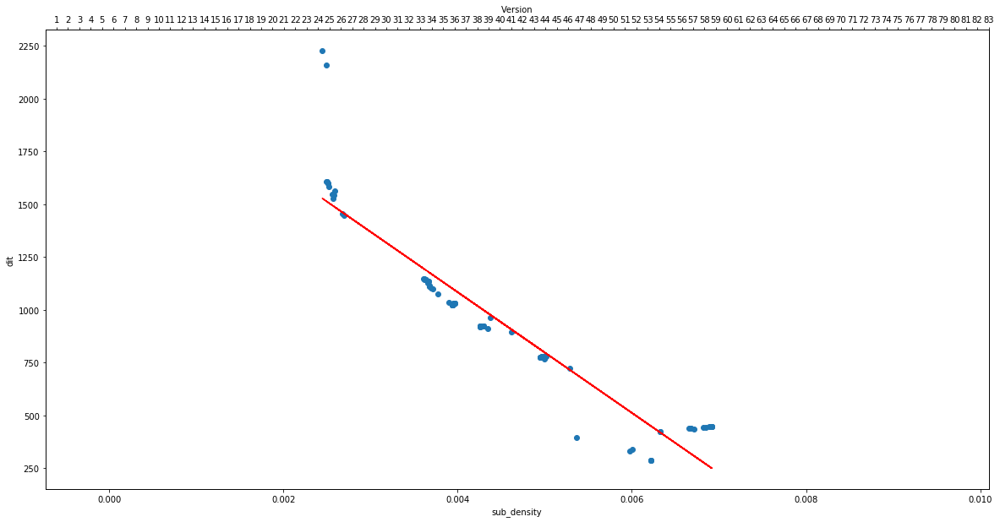

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_lcomInh_mm.png


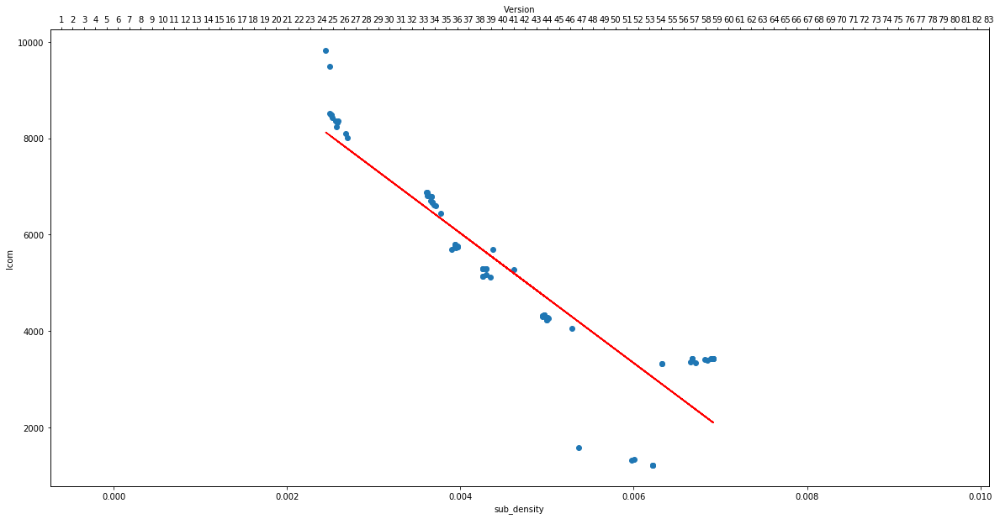

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_childrenInh_mm.png


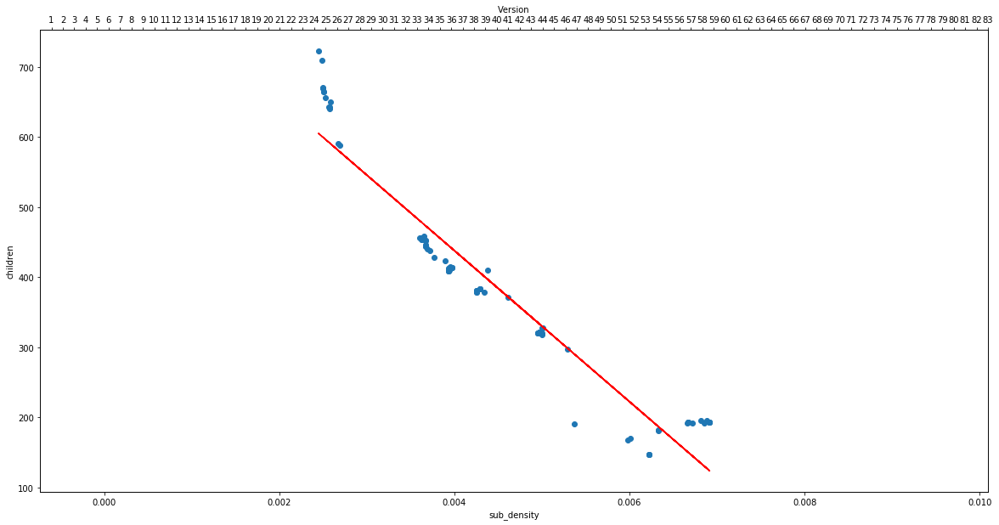

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_response_classInh_mm.png


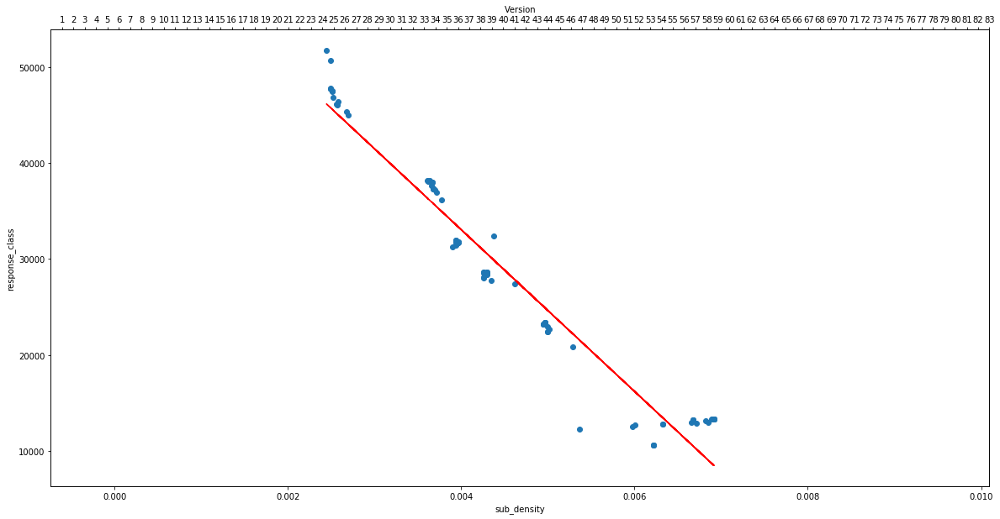

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/sub_density_str_compInh_mm.png


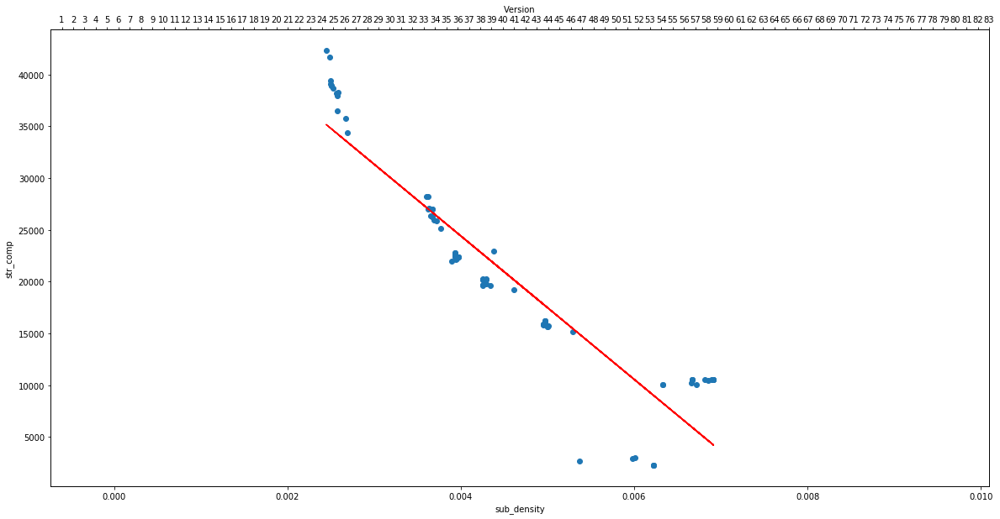

Colunm Name :  avg_clust
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_class_connnInh_mm.png


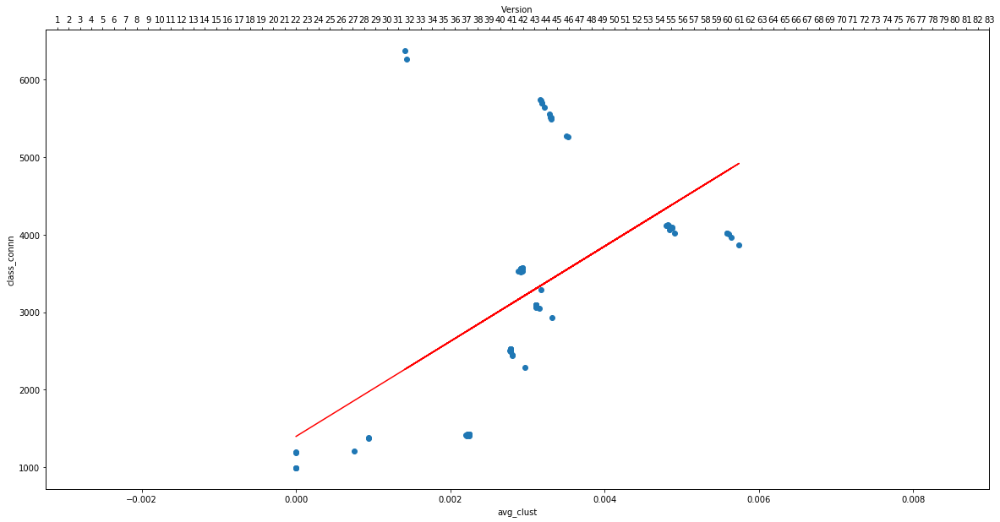

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_avg_cyclomaticInh_mm.png


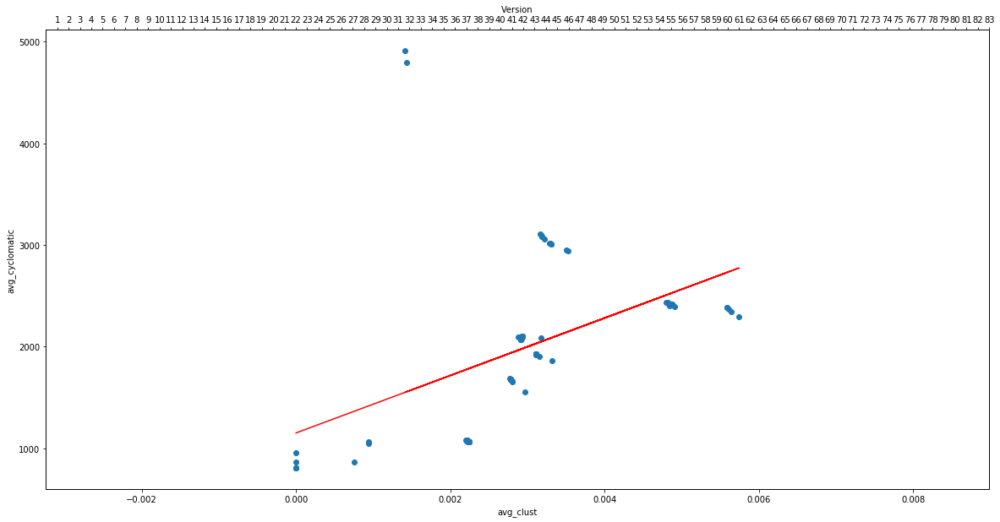

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_cboInh_mm.png


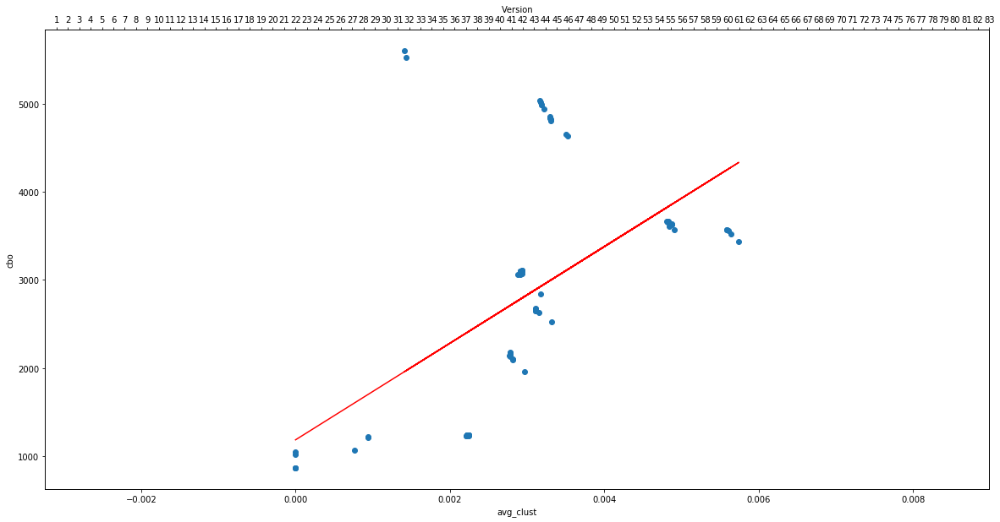

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_ditInh_mm.png


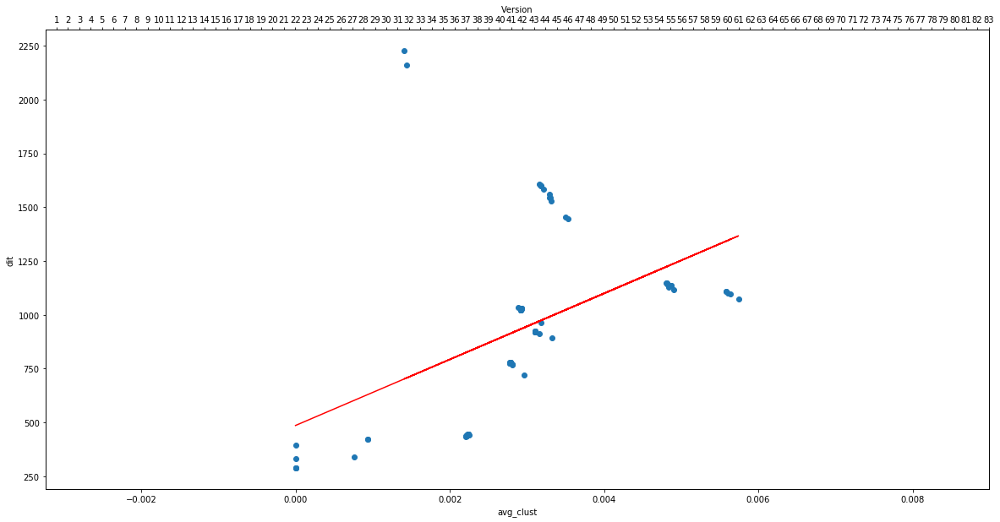

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_lcomInh_mm.png


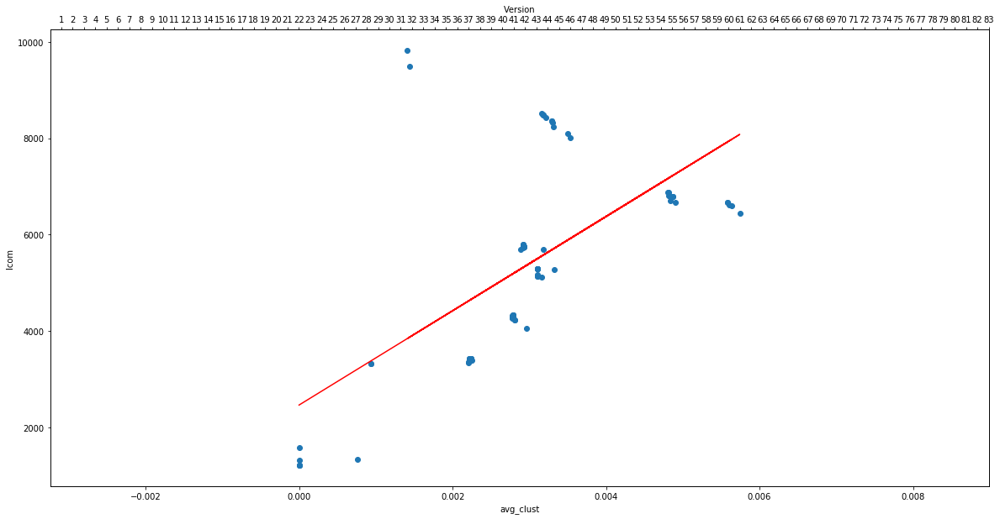

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_childrenInh_mm.png


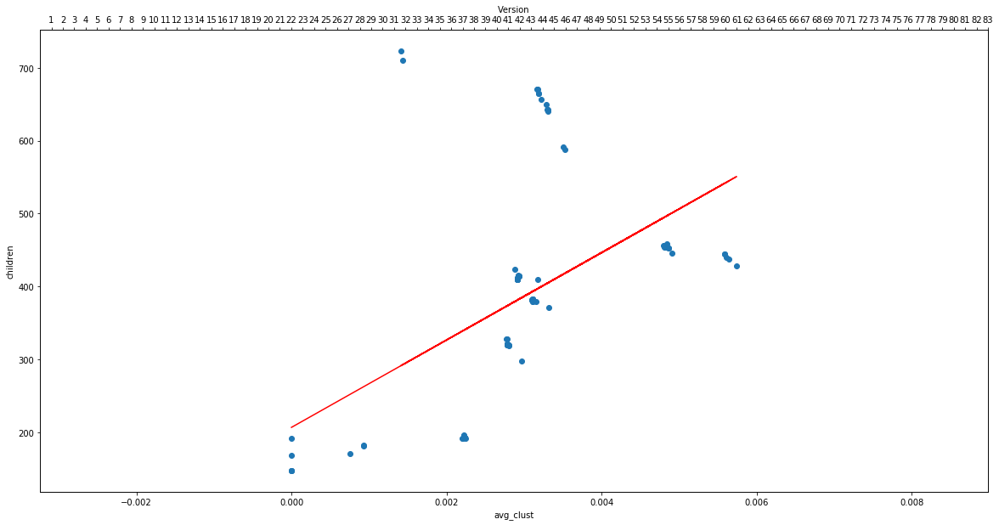

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_response_classInh_mm.png


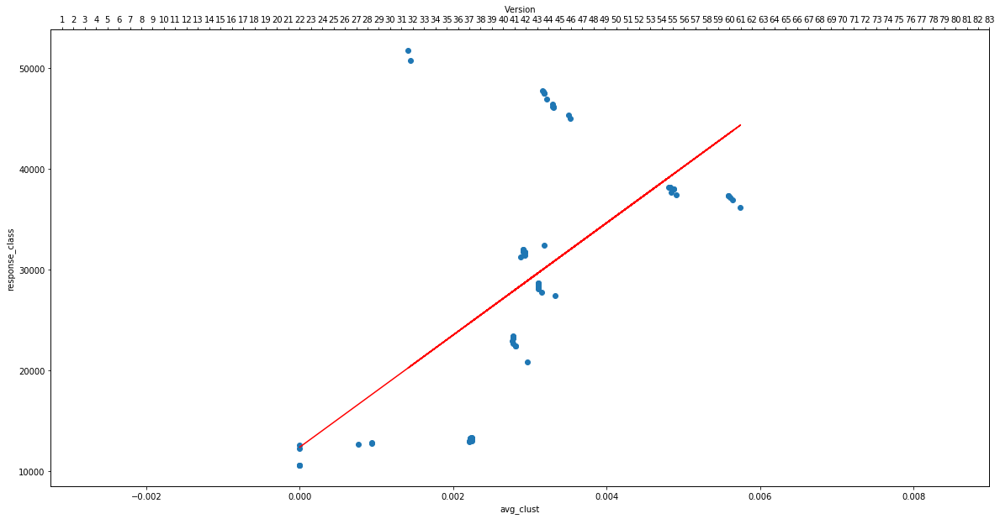

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Cassandra/scatter_plots/avg_clust_str_compInh_mm.png


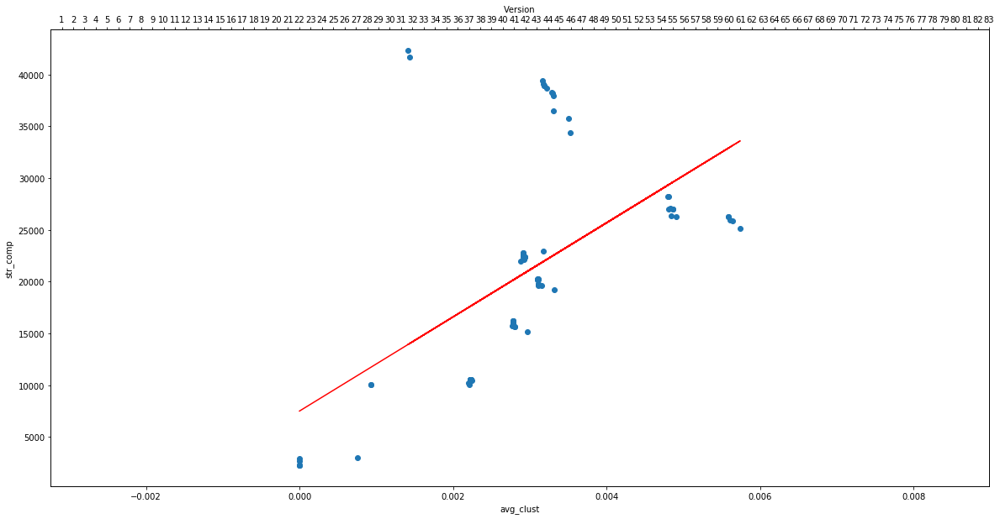

____________________________________________________________
files : ['D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_Call_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/chukwa_cdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/chukwa_colldot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_Coll_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_heat_s_call_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_heat_s_collab_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_heat_s_Inh_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/chukwa_Inhdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_Inh_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Chukwa/Chukwa_metrics.csv']
_________________
s_path    ; ['D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/']
7
Colunm Name :  squares
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_class_connnInh_mm.png


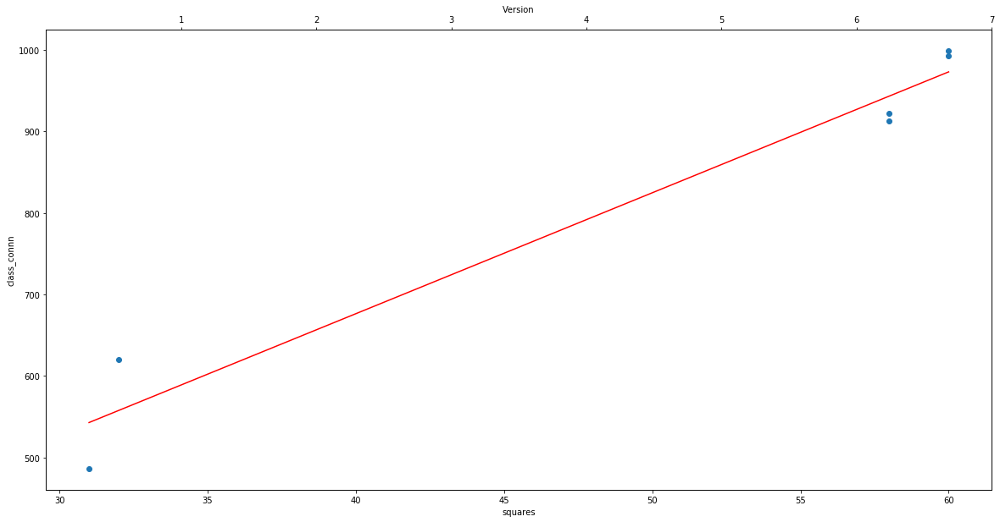

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_avg_cyclomaticInh_mm.png


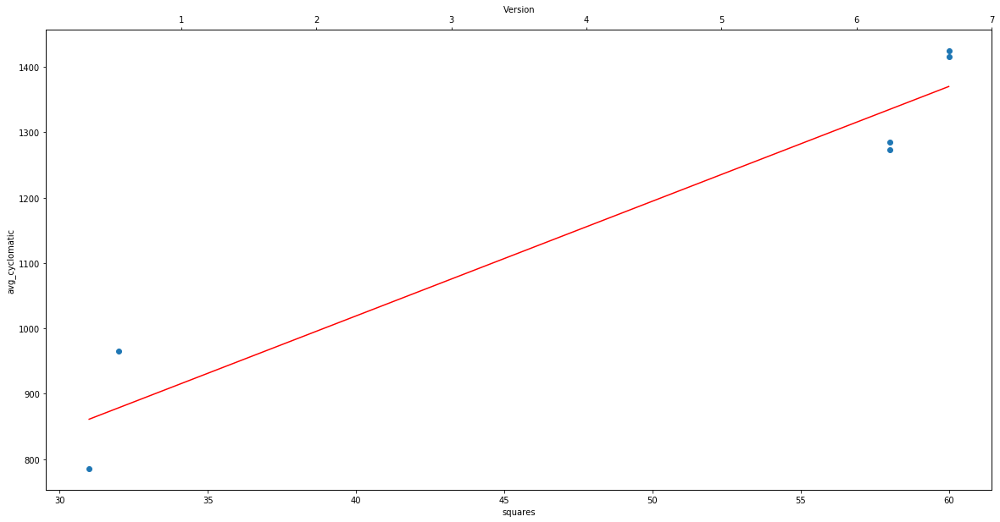

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_cboInh_mm.png


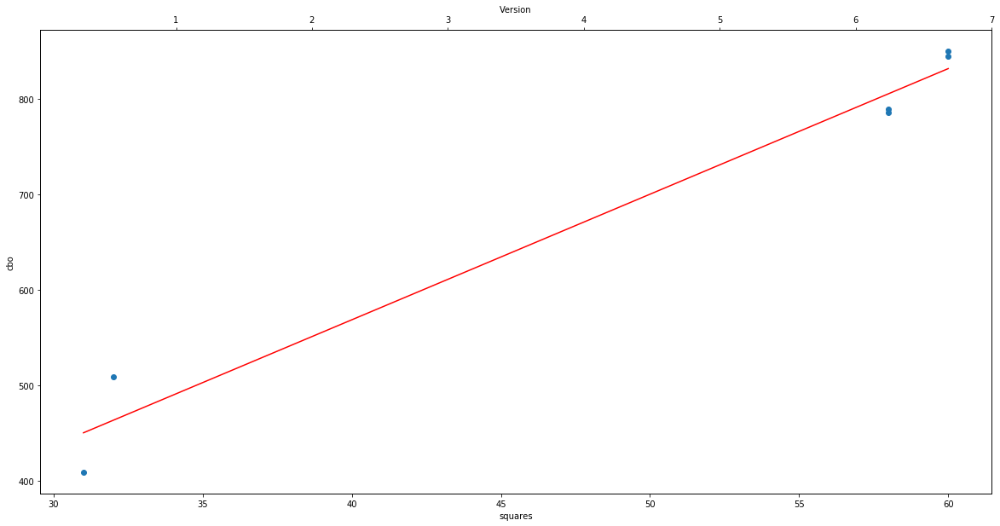

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_ditInh_mm.png


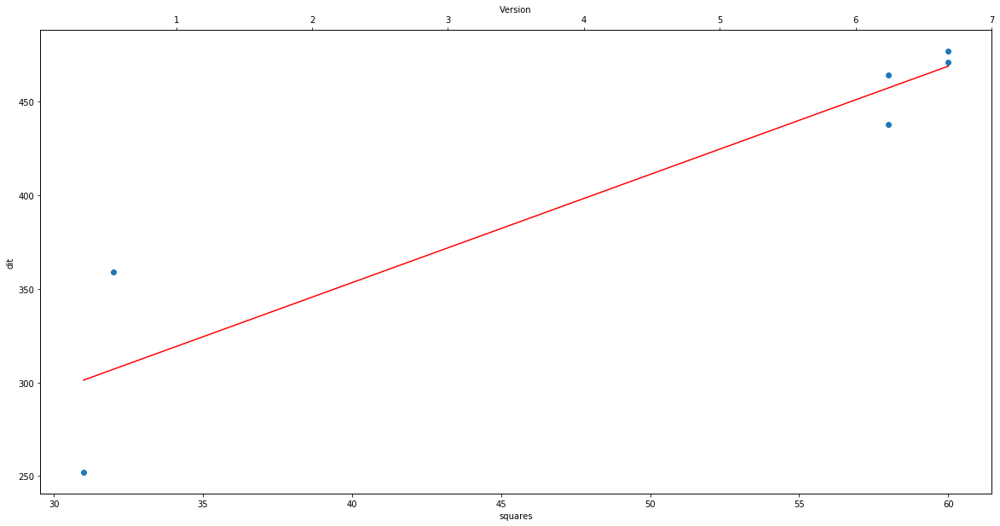

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_lcomInh_mm.png


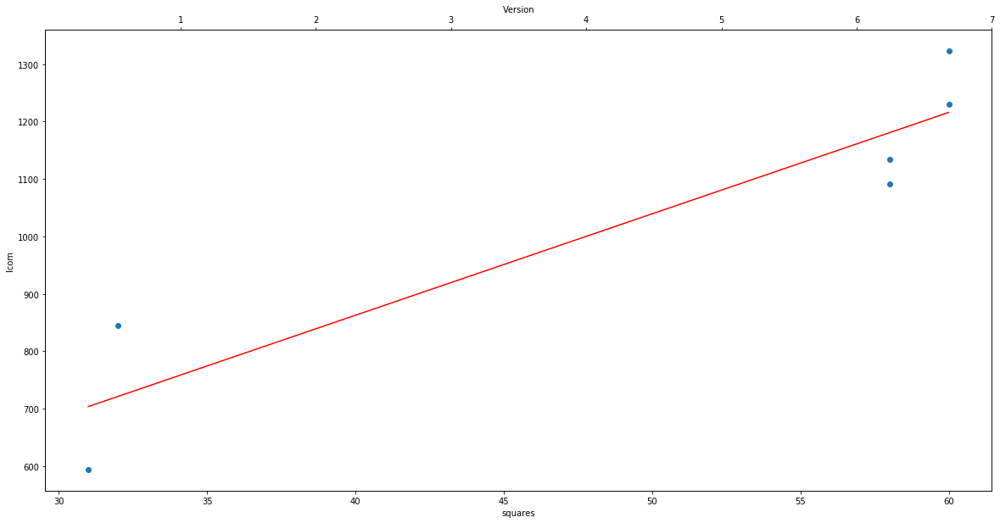

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_childrenInh_mm.png


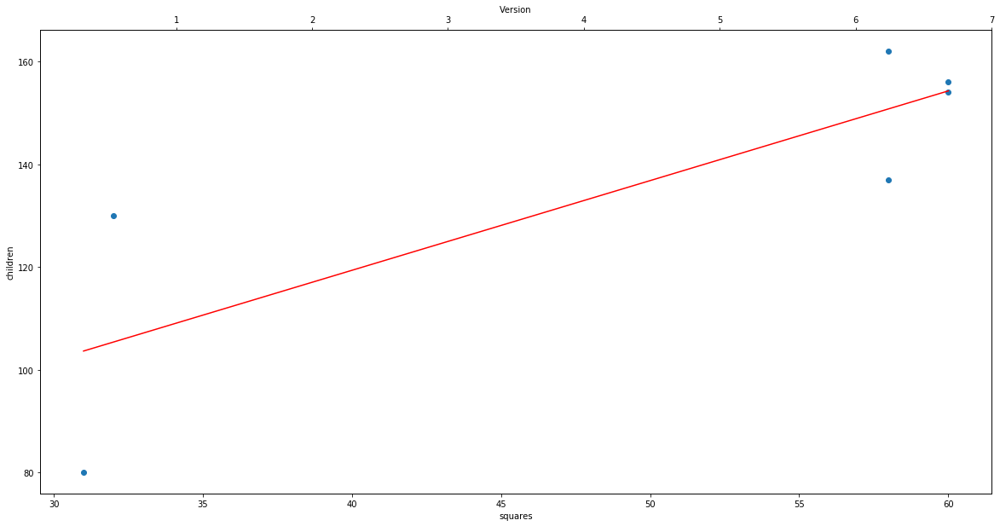

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_response_classInh_mm.png


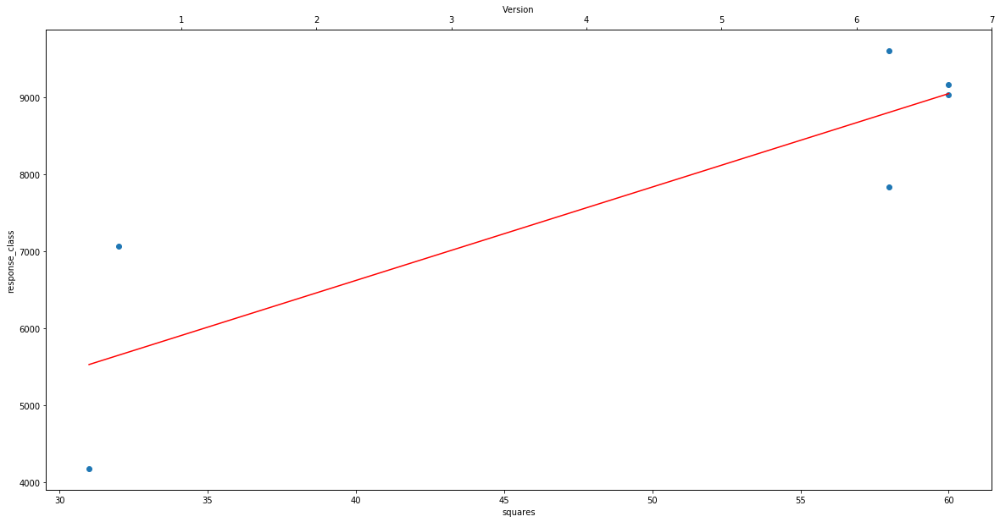

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/squares_str_compInh_mm.png


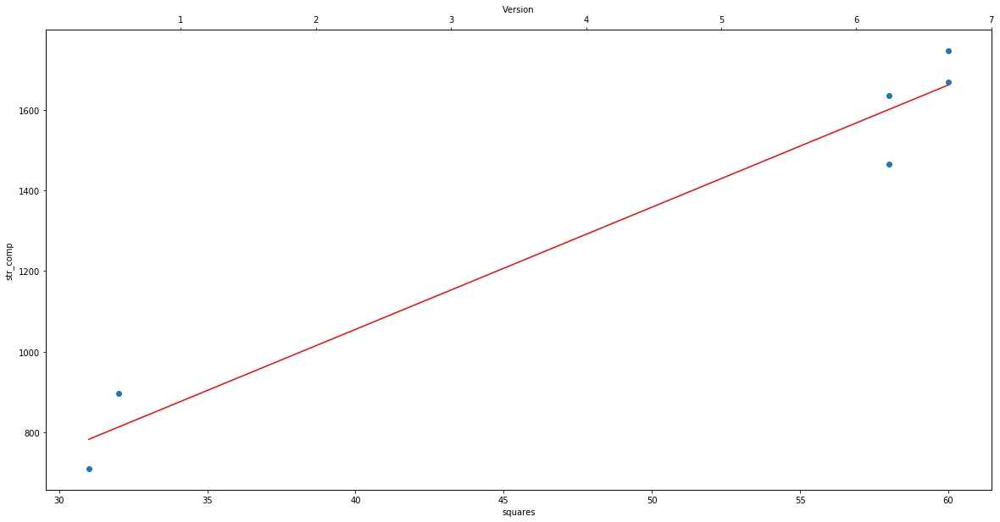

Colunm Name :  P-gamma
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_class_connnInh_mm.png


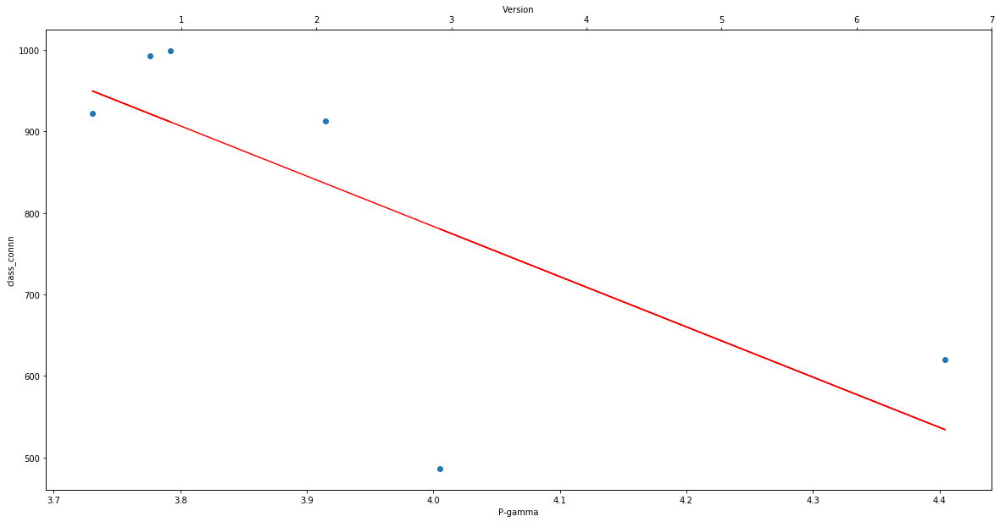

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_avg_cyclomaticInh_mm.png


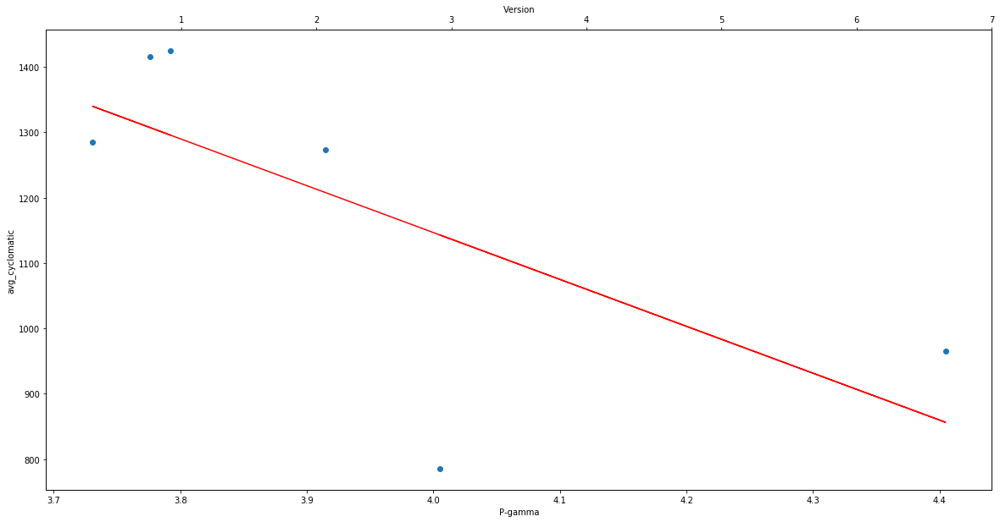

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_cboInh_mm.png


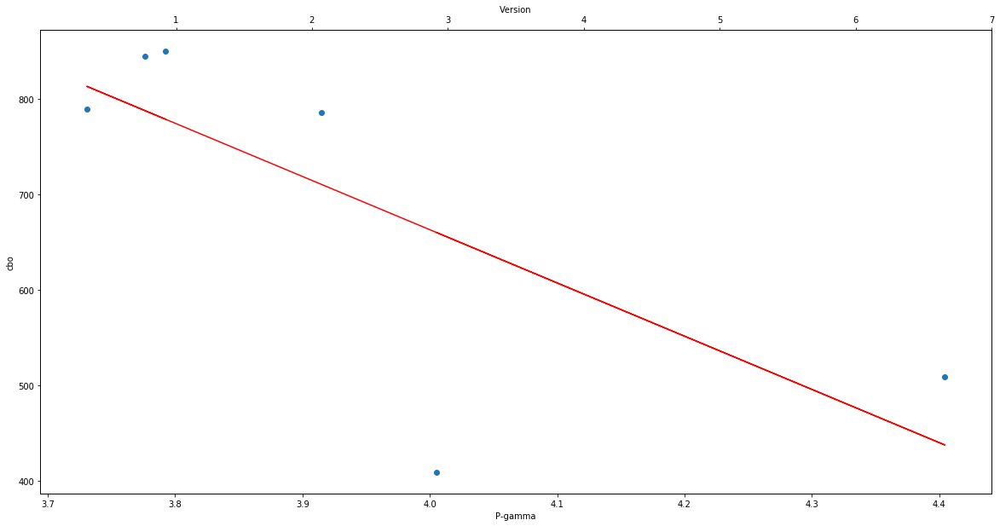

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_ditInh_mm.png


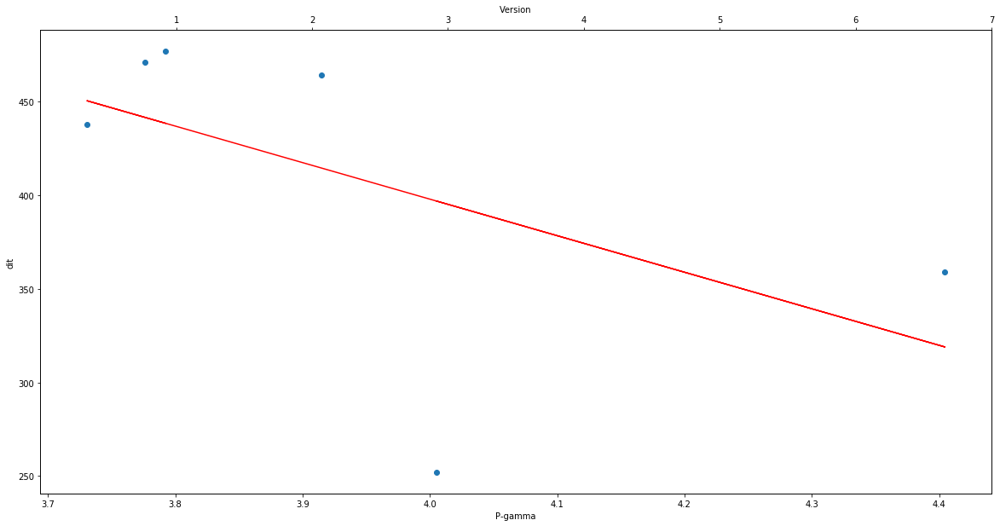

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_lcomInh_mm.png


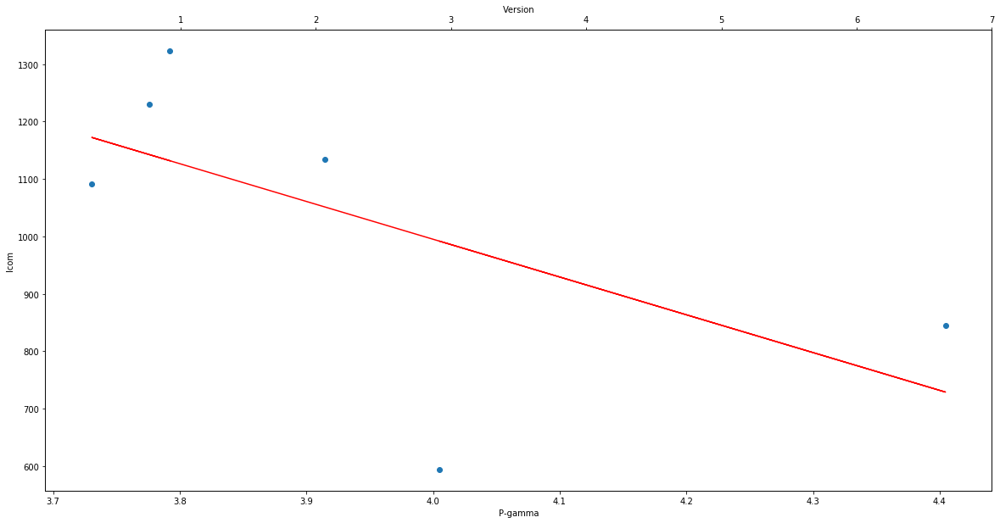

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_childrenInh_mm.png


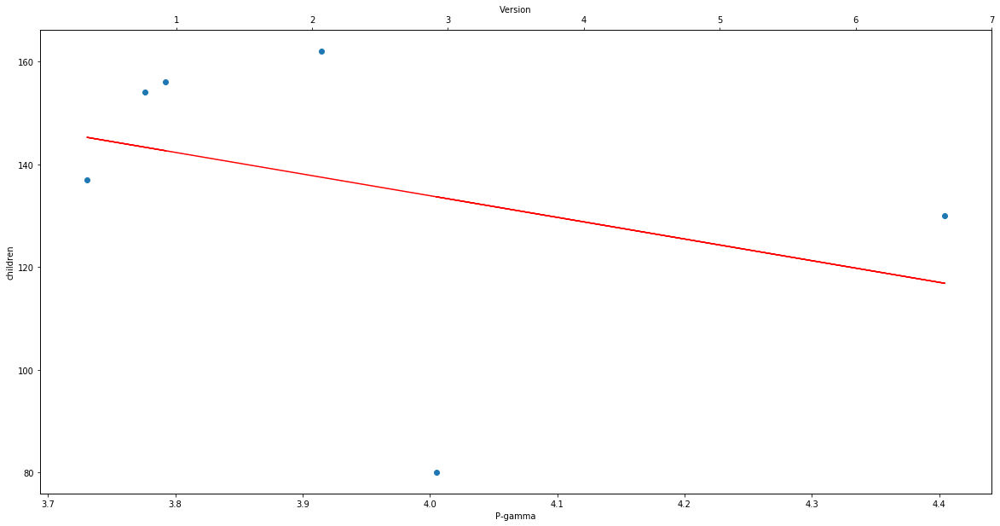

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_response_classInh_mm.png


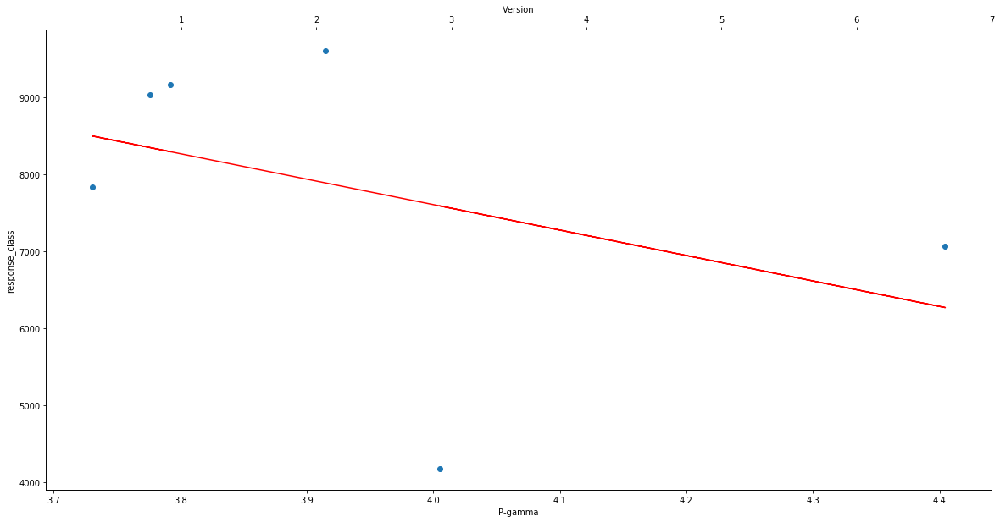

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/P-gamma_str_compInh_mm.png


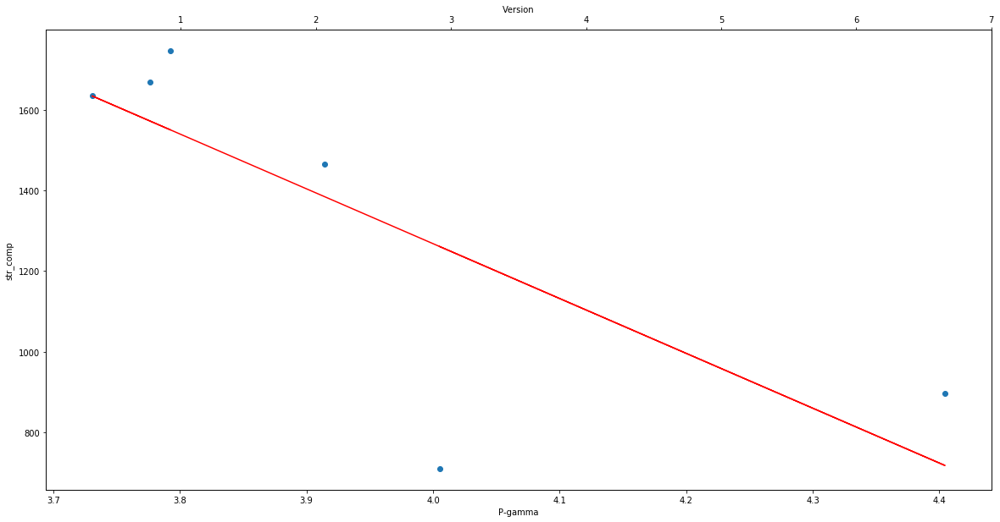

Colunm Name :  avg_degree
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_class_connnInh_mm.png


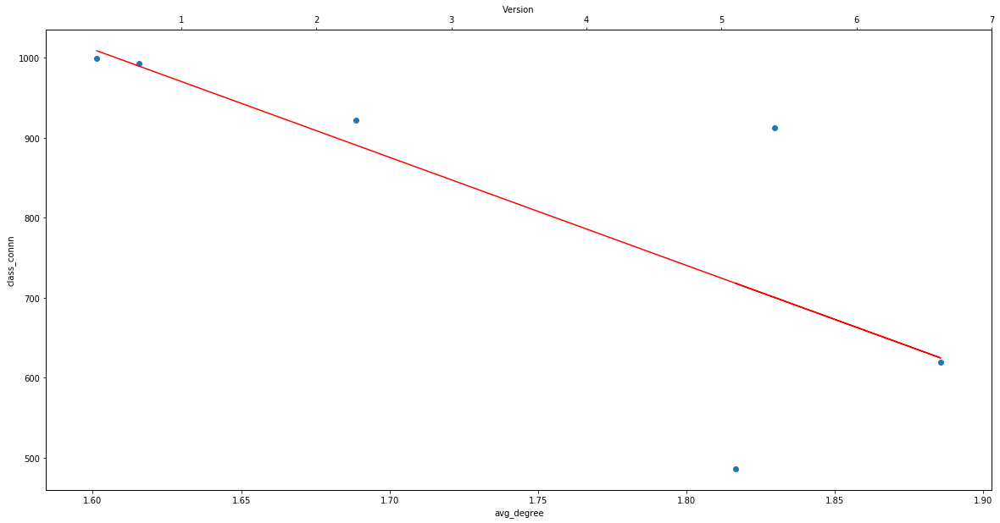

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_avg_cyclomaticInh_mm.png


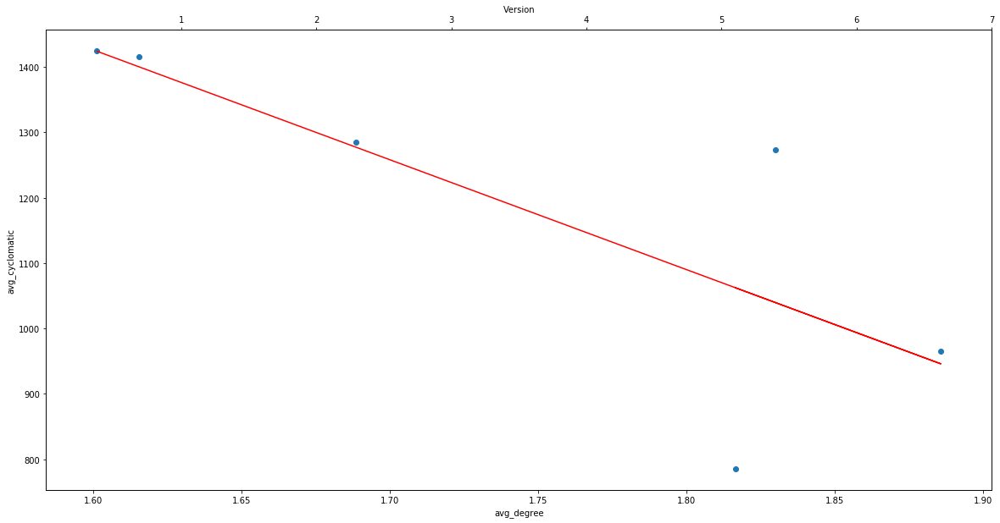

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_cboInh_mm.png


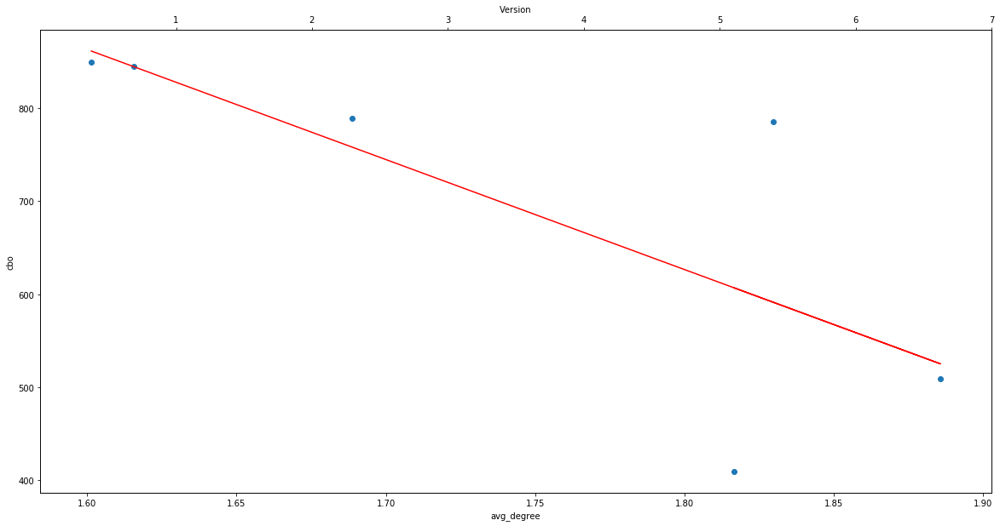

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_ditInh_mm.png


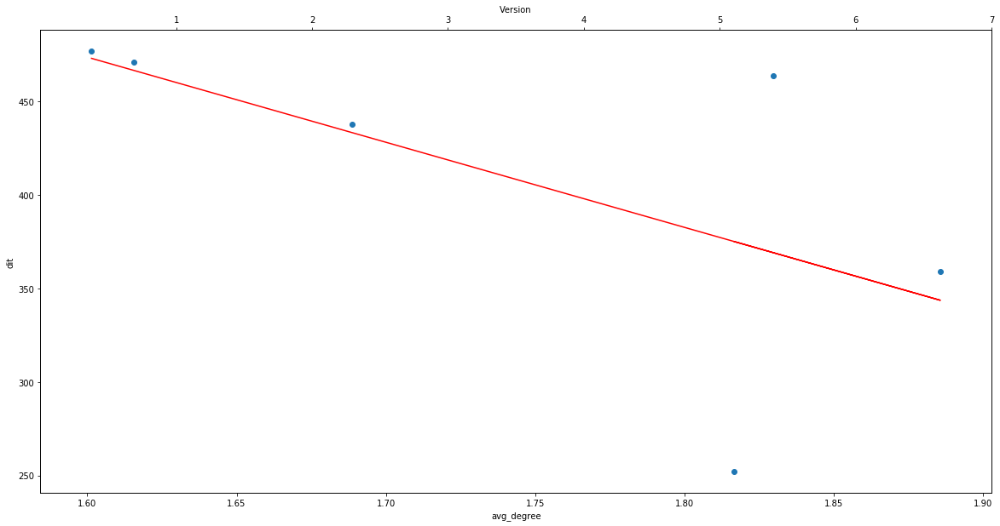

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_lcomInh_mm.png


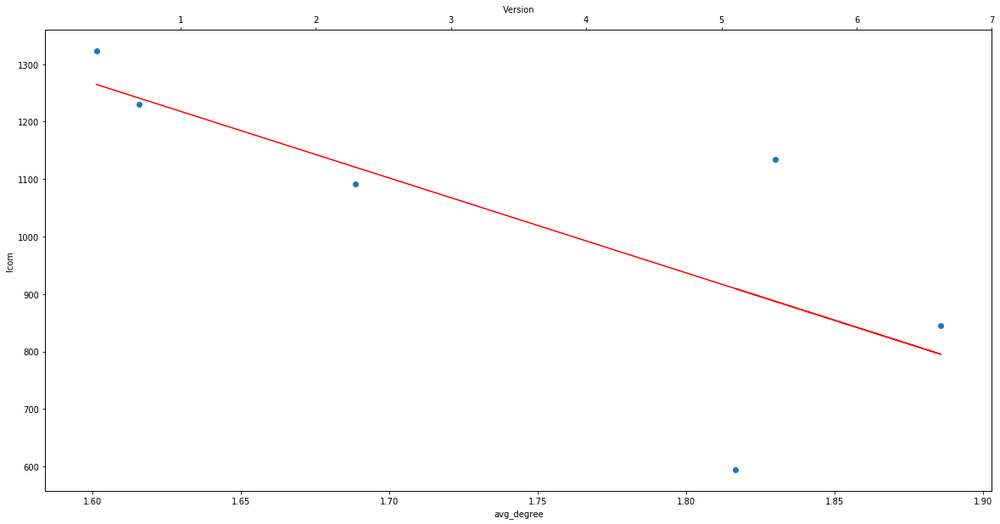

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_childrenInh_mm.png


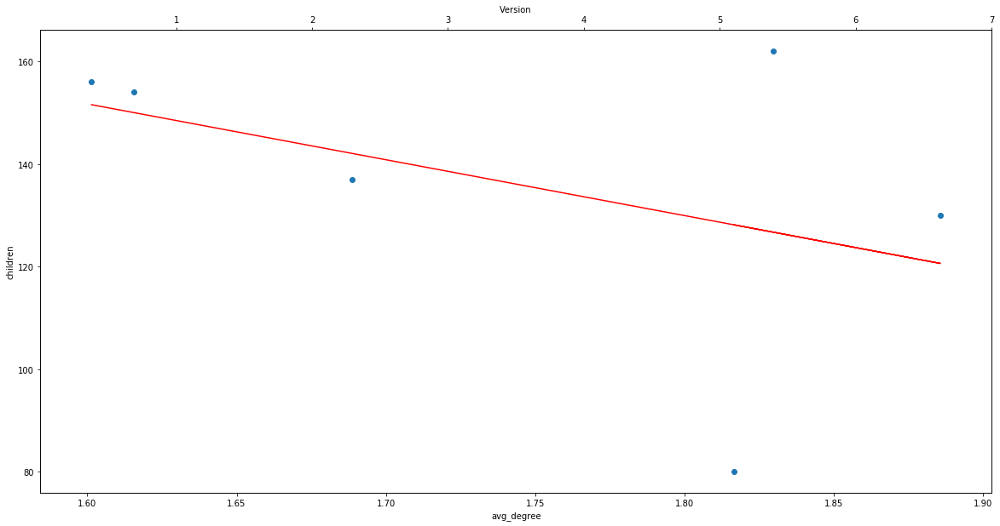

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_response_classInh_mm.png


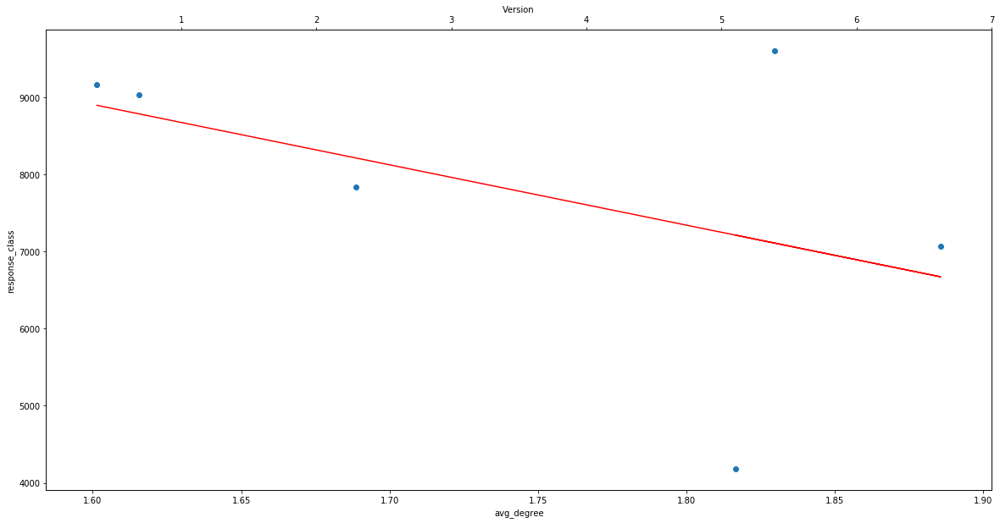

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_degree_str_compInh_mm.png


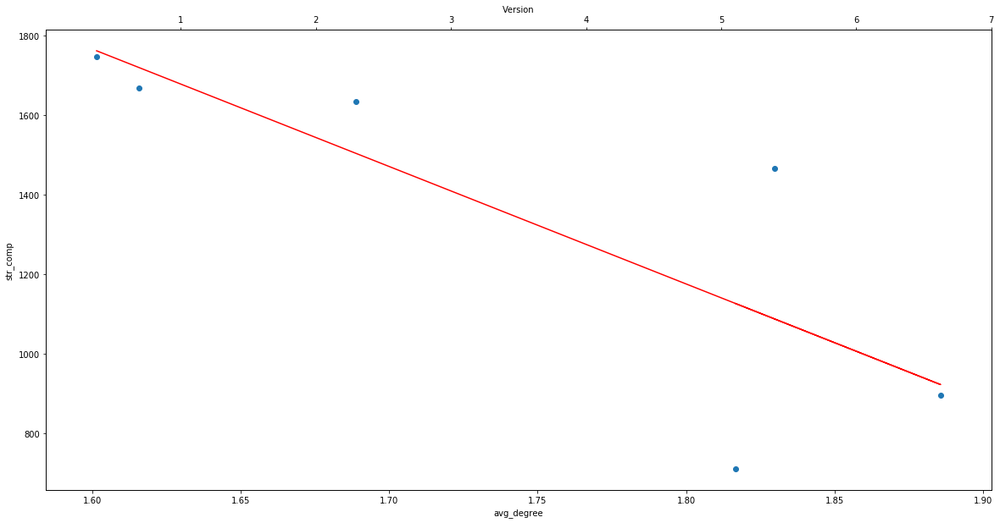

Colunm Name :  no_comm
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_class_connnInh_mm.png


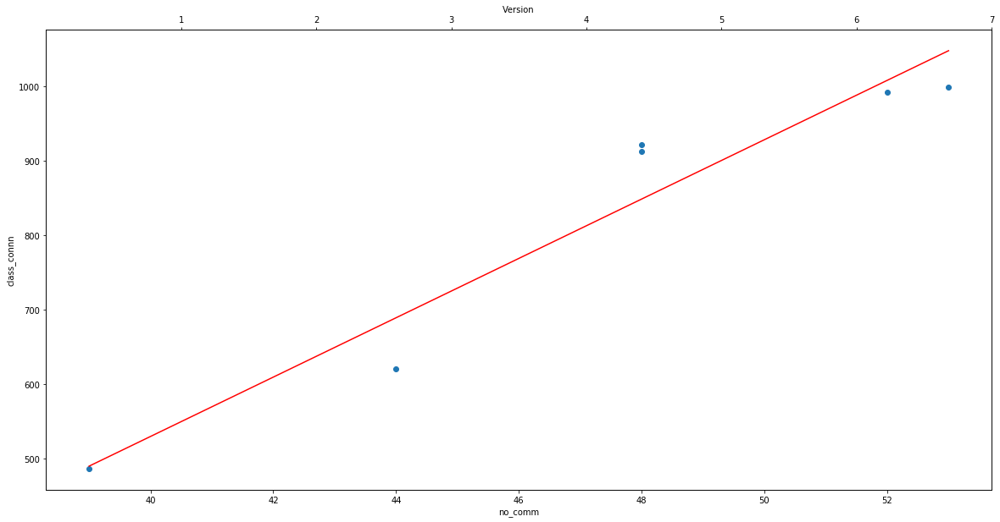

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_avg_cyclomaticInh_mm.png


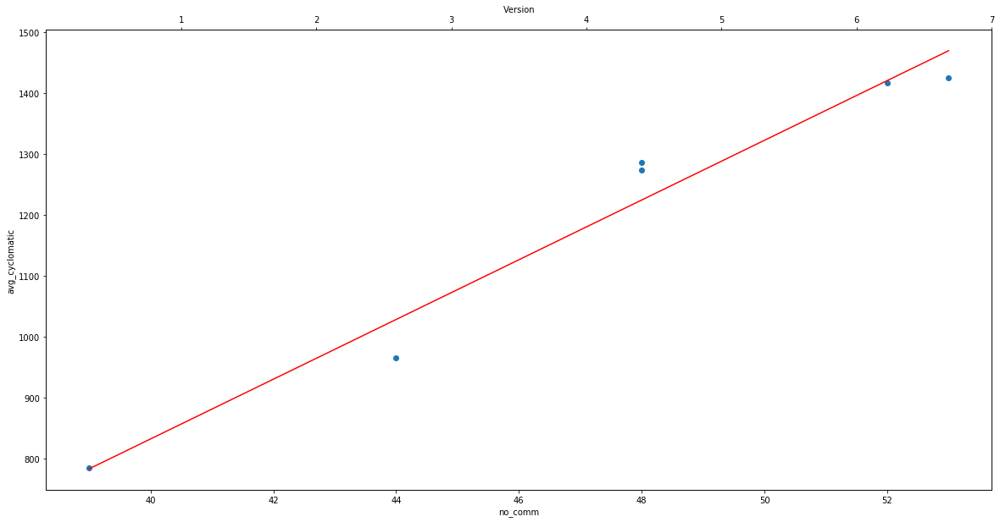

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_cboInh_mm.png


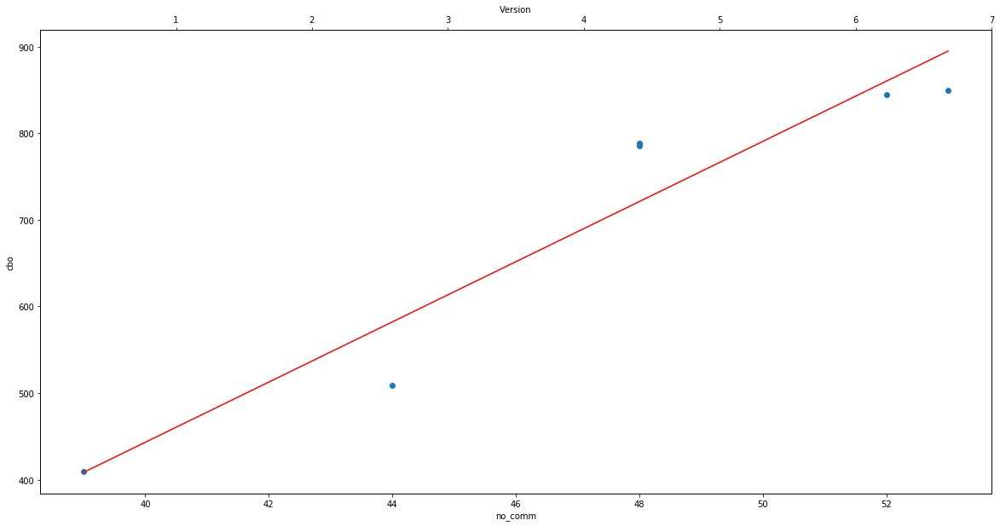

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_ditInh_mm.png


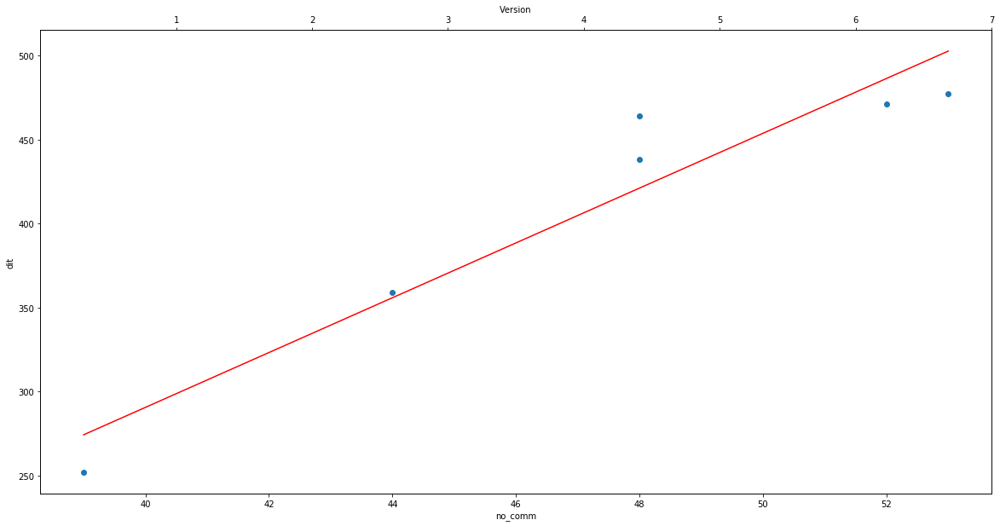

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_lcomInh_mm.png


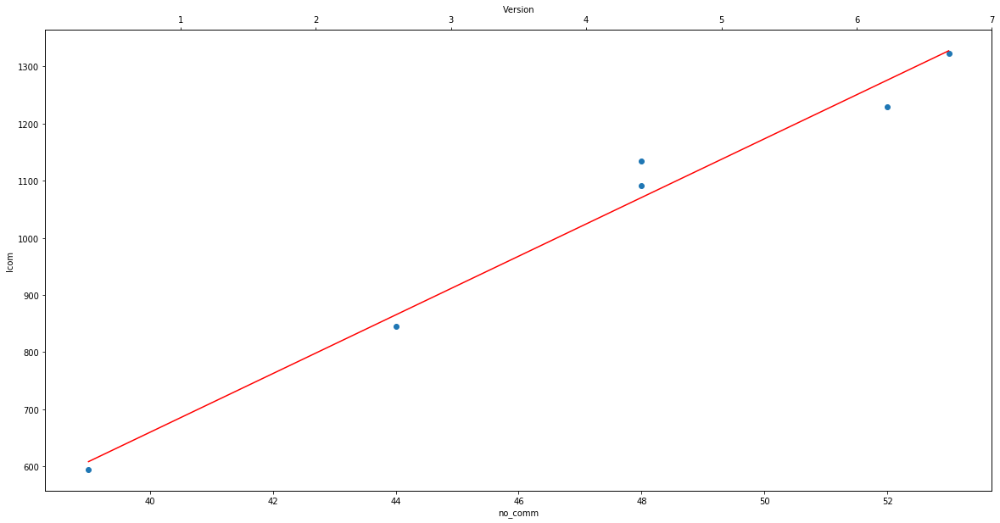

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_childrenInh_mm.png


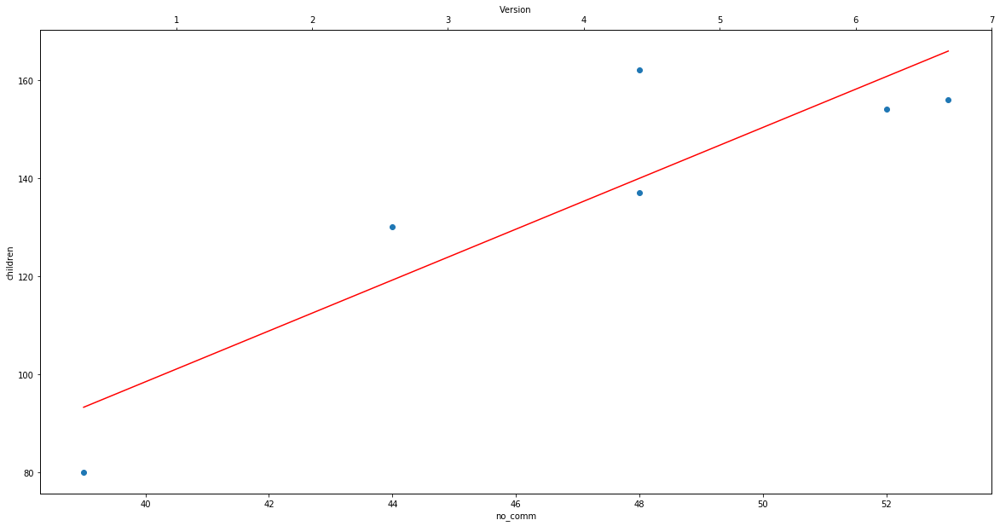

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_response_classInh_mm.png


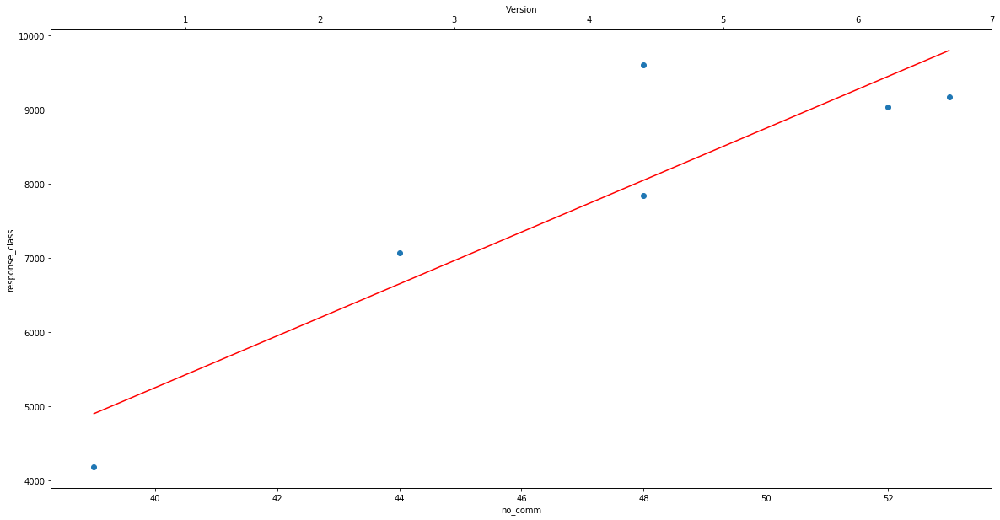

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/no_comm_str_compInh_mm.png


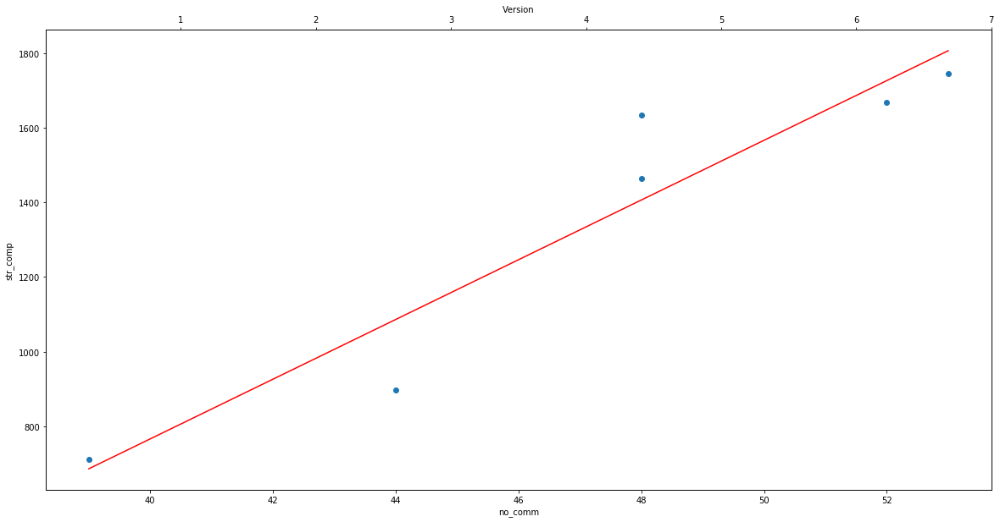

Colunm Name :  avg_shortest_path
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_class_connnInh_mm.png


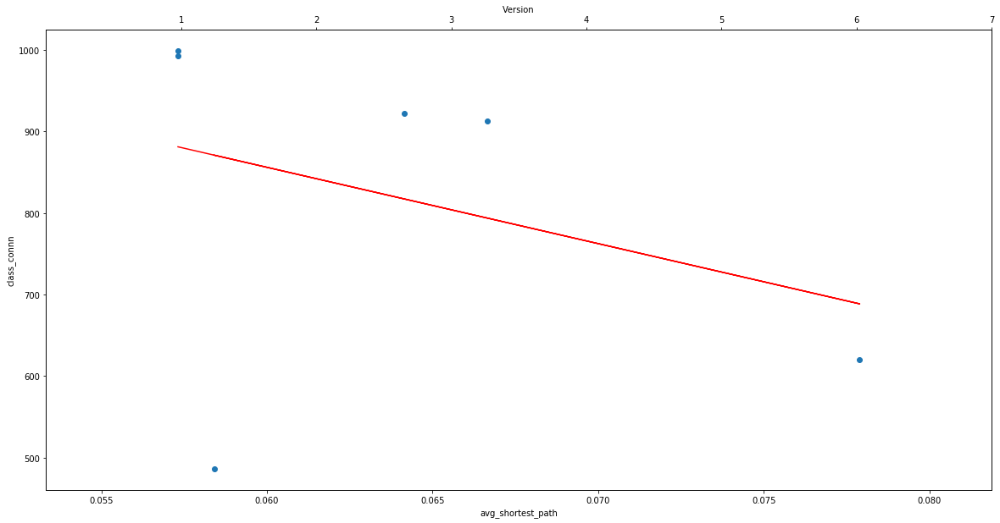

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_avg_cyclomaticInh_mm.png


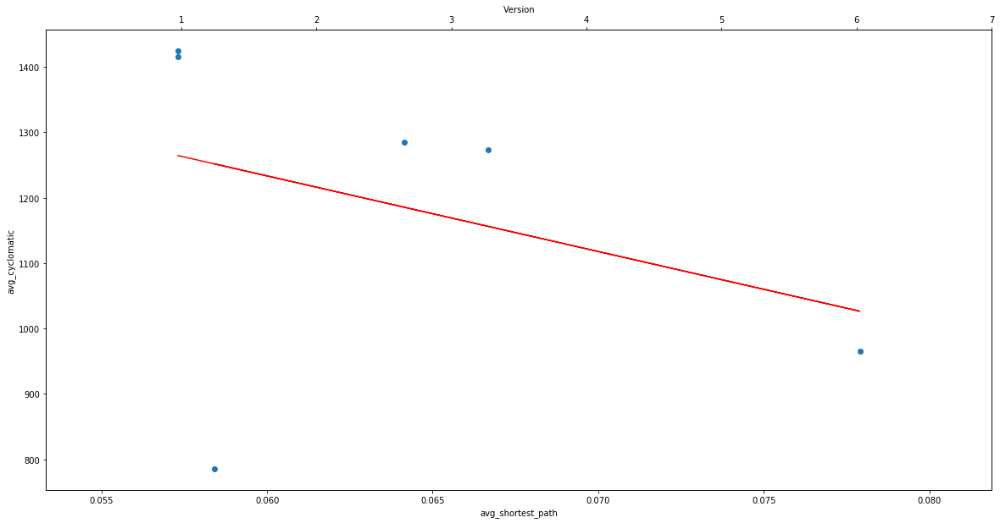

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_cboInh_mm.png


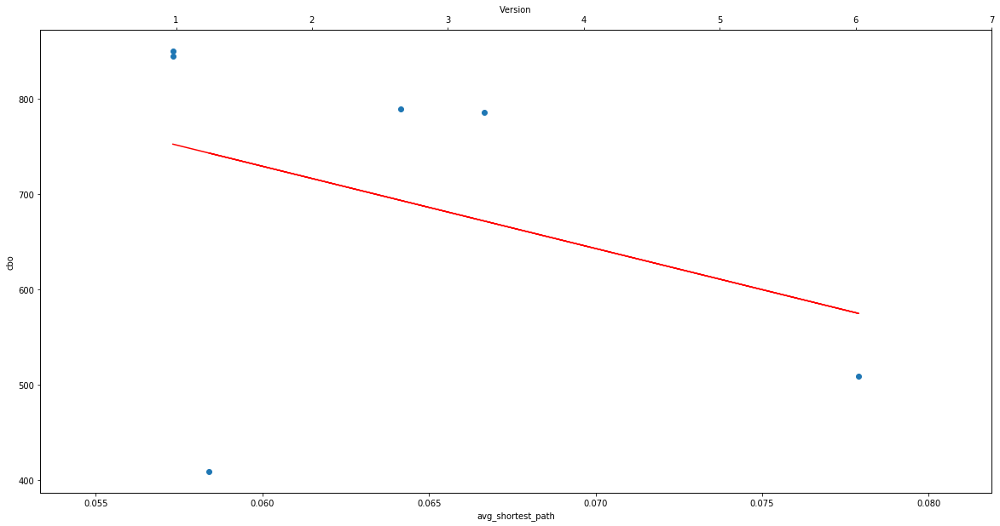

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_ditInh_mm.png


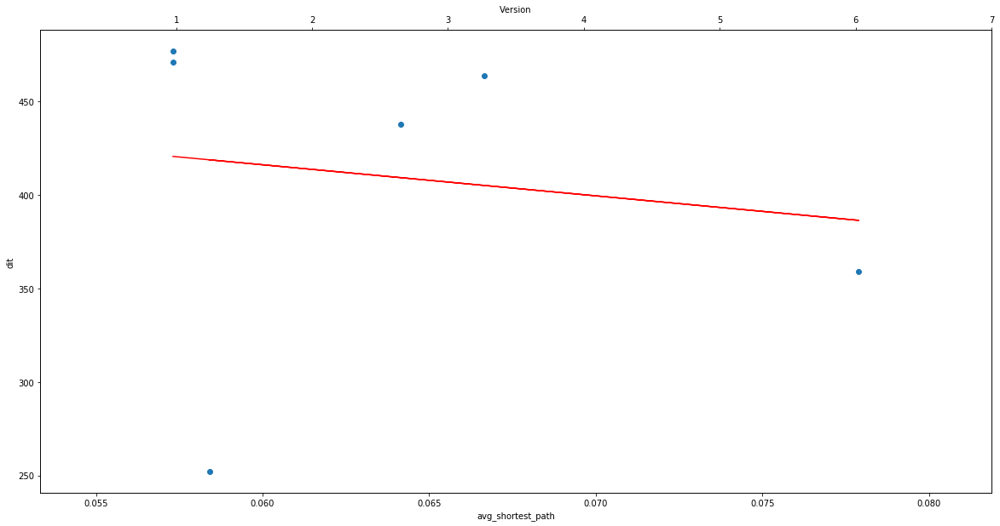

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_lcomInh_mm.png


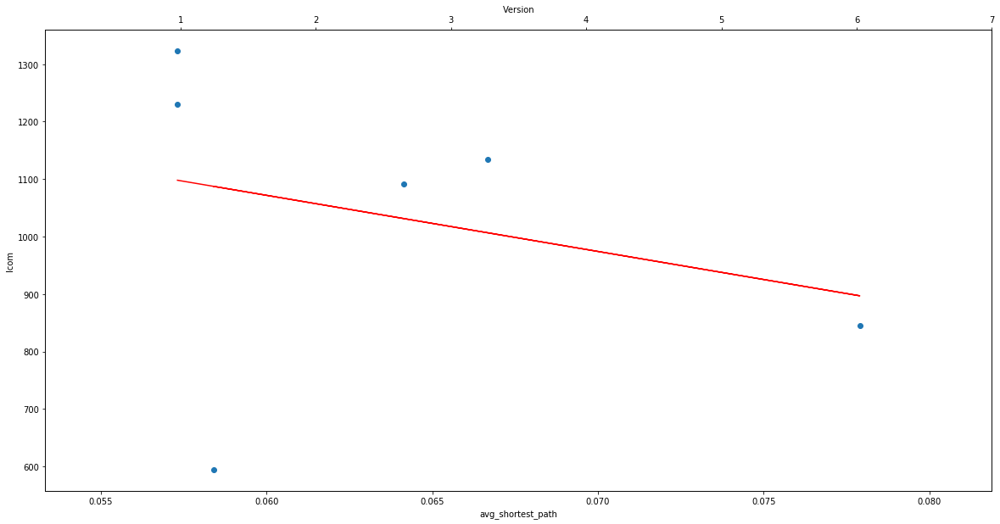

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_childrenInh_mm.png


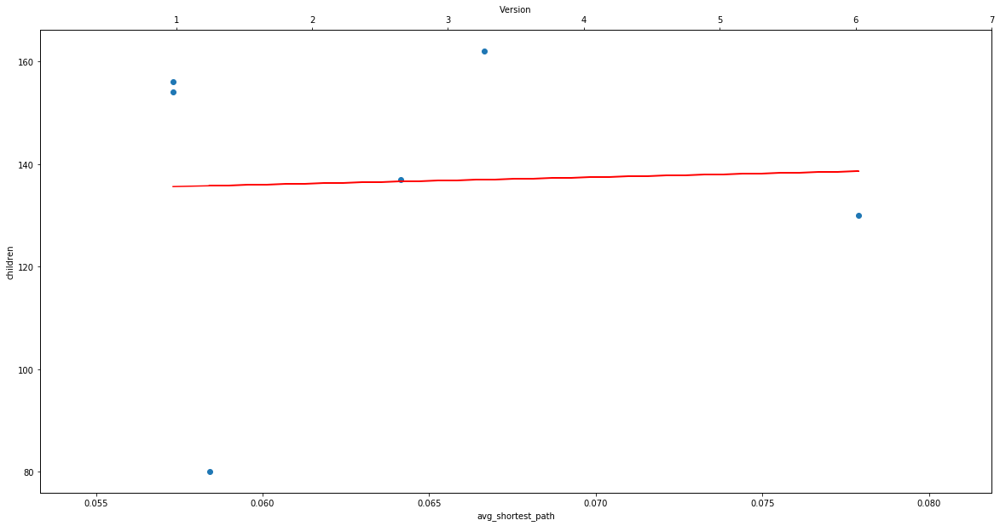

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_response_classInh_mm.png


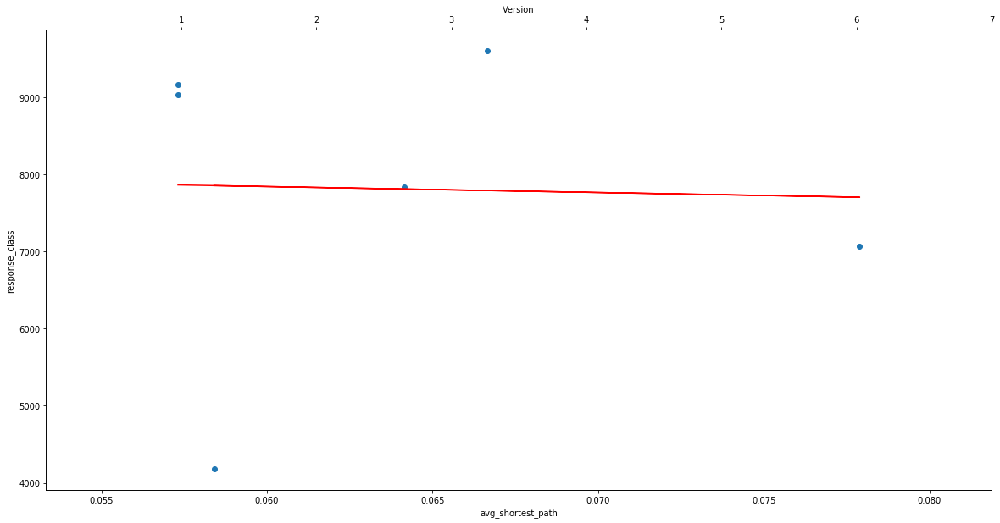

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_shortest_path_str_compInh_mm.png


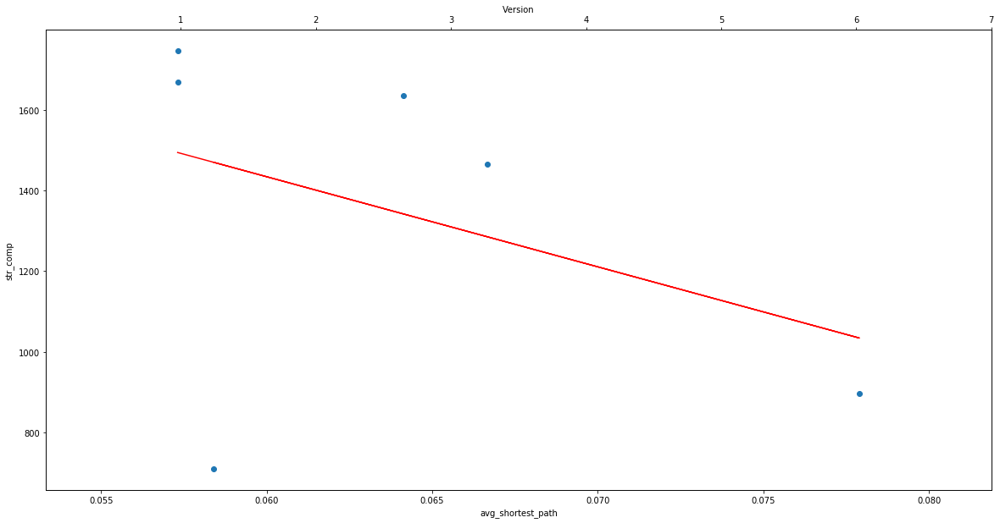

Colunm Name :  sub_density
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_class_connnInh_mm.png


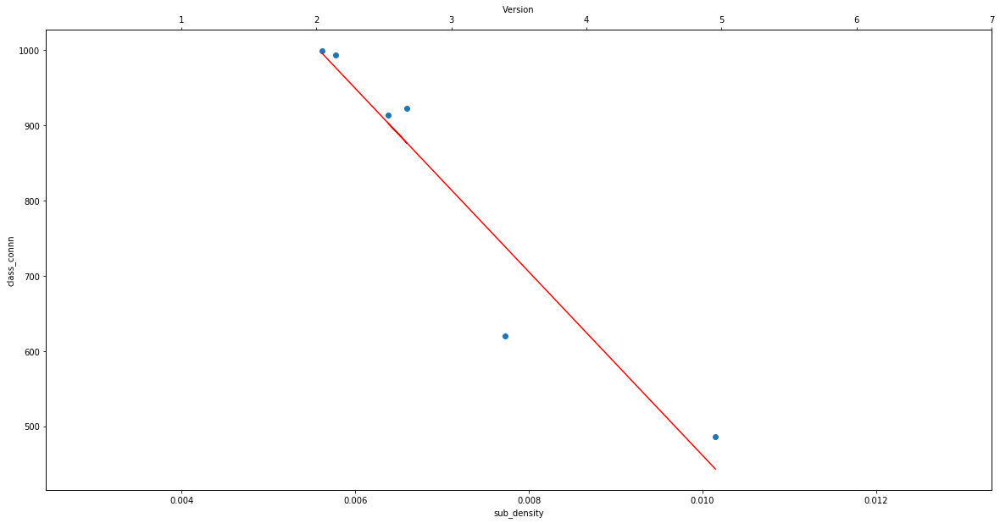

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_avg_cyclomaticInh_mm.png


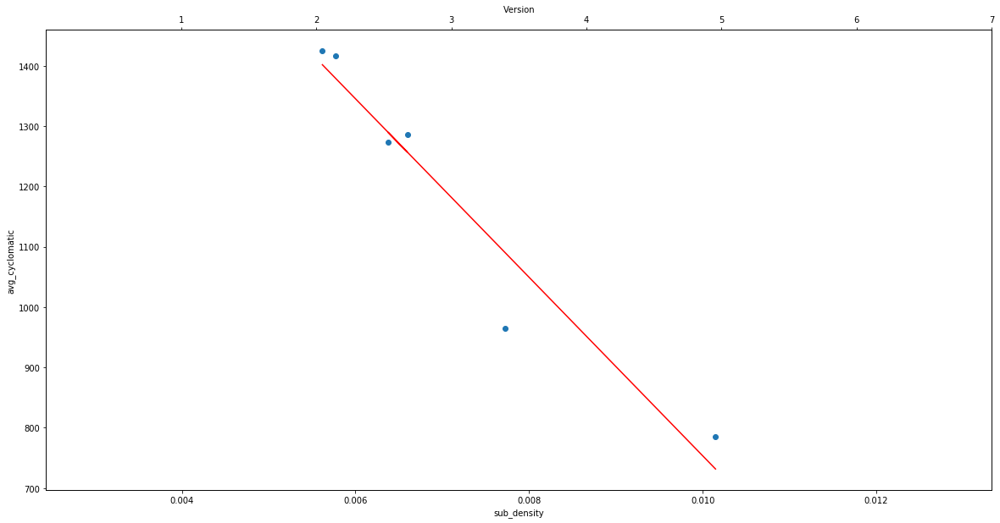

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_cboInh_mm.png


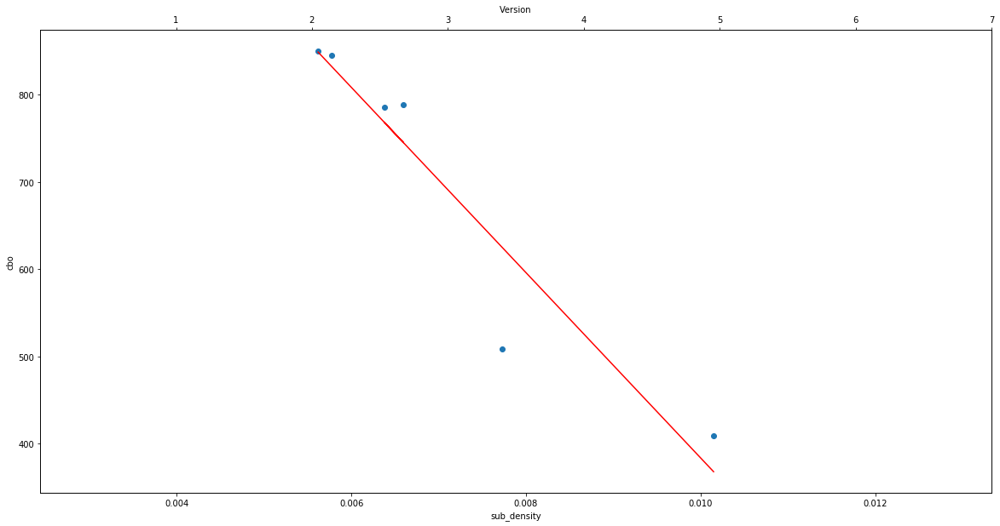

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_ditInh_mm.png


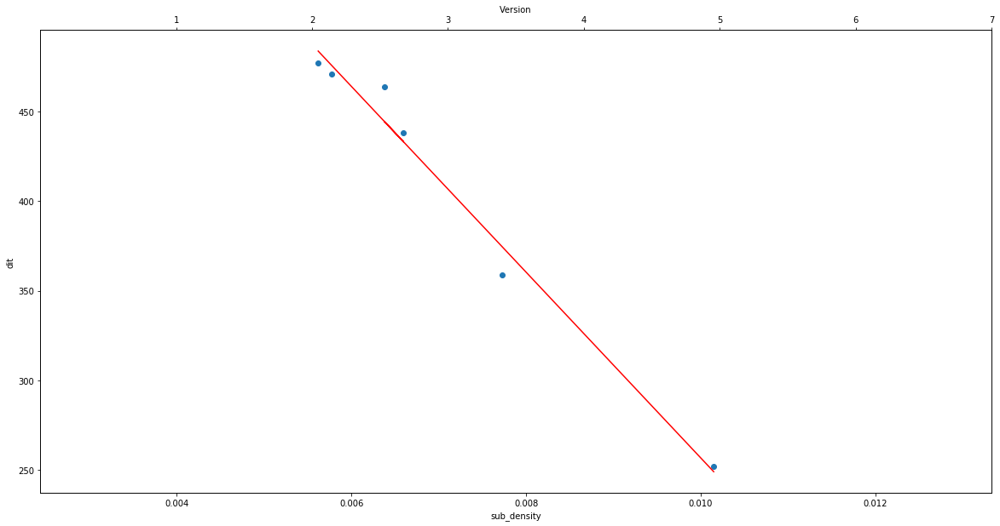

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_lcomInh_mm.png


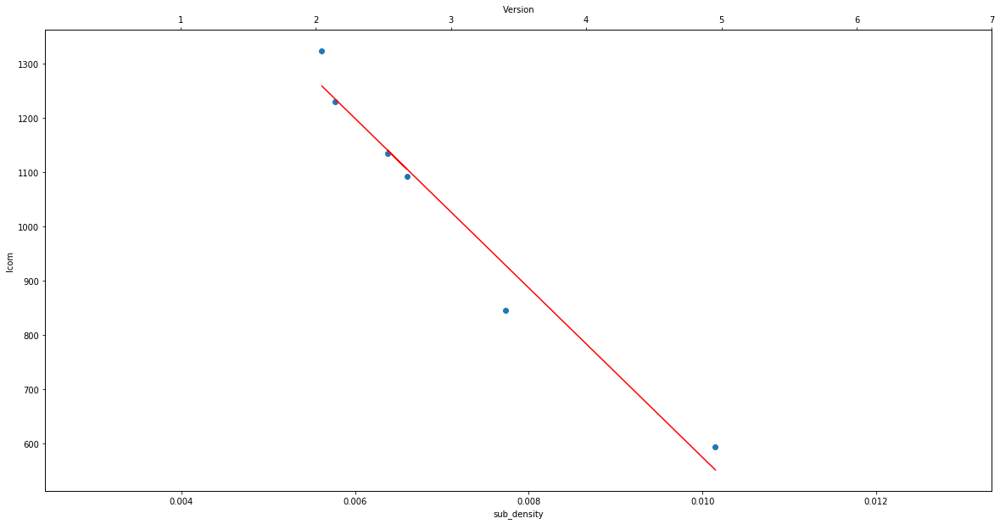

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_childrenInh_mm.png


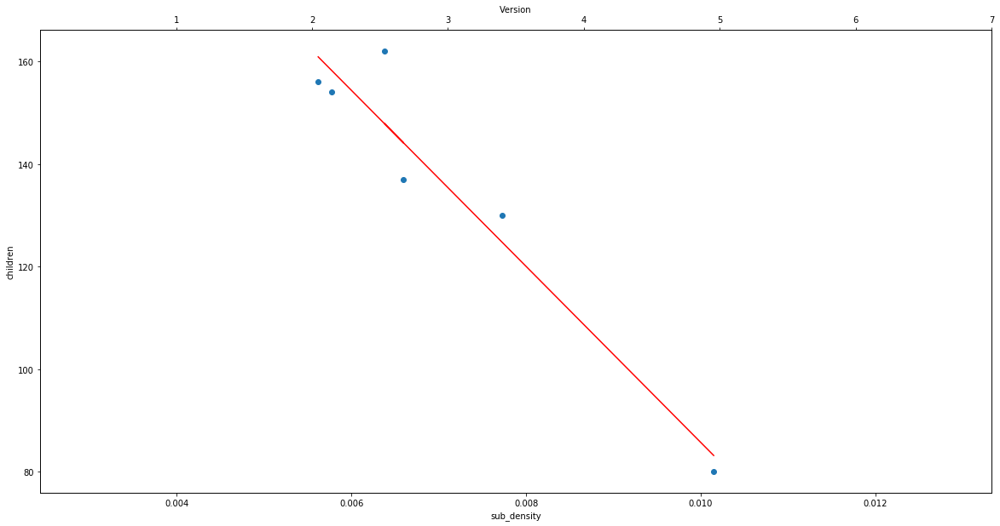

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_response_classInh_mm.png


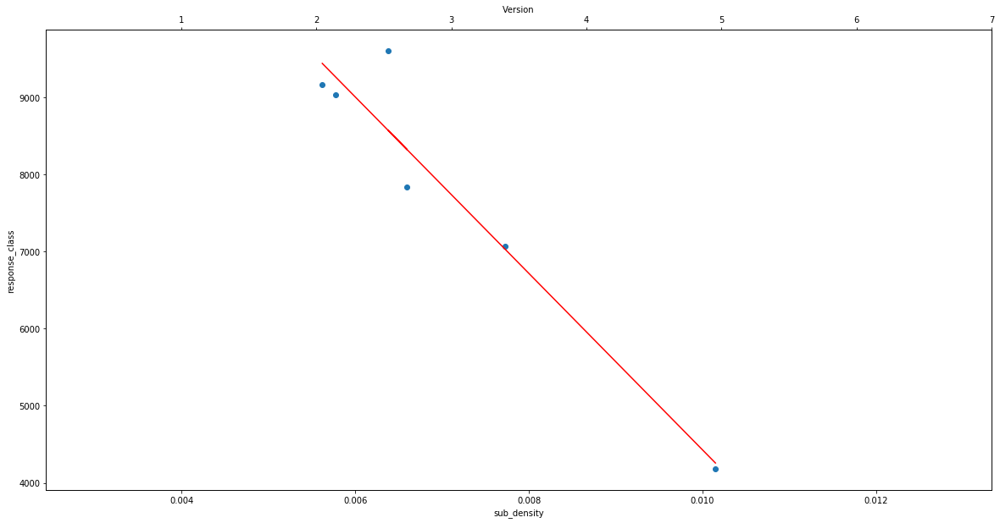

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/sub_density_str_compInh_mm.png


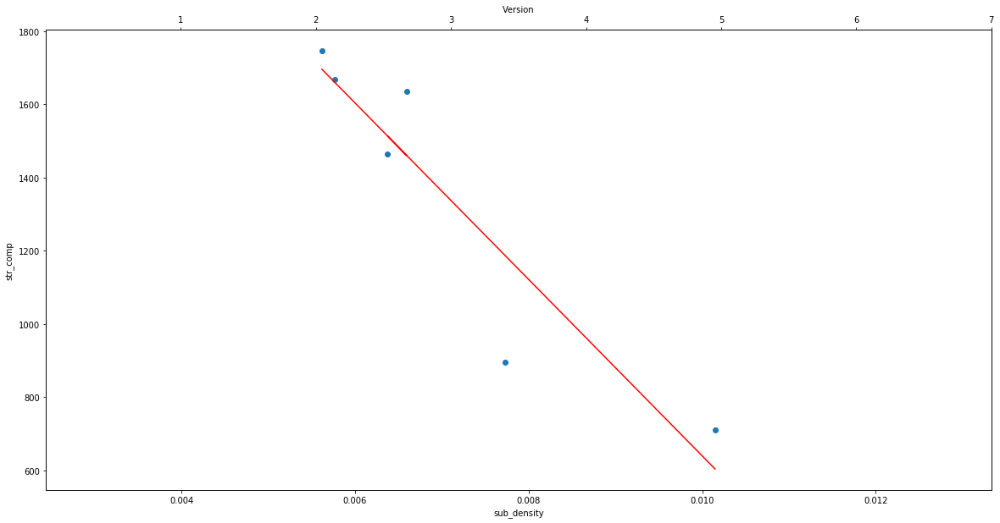

Colunm Name :  avg_clust
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_class_connnInh_mm.png


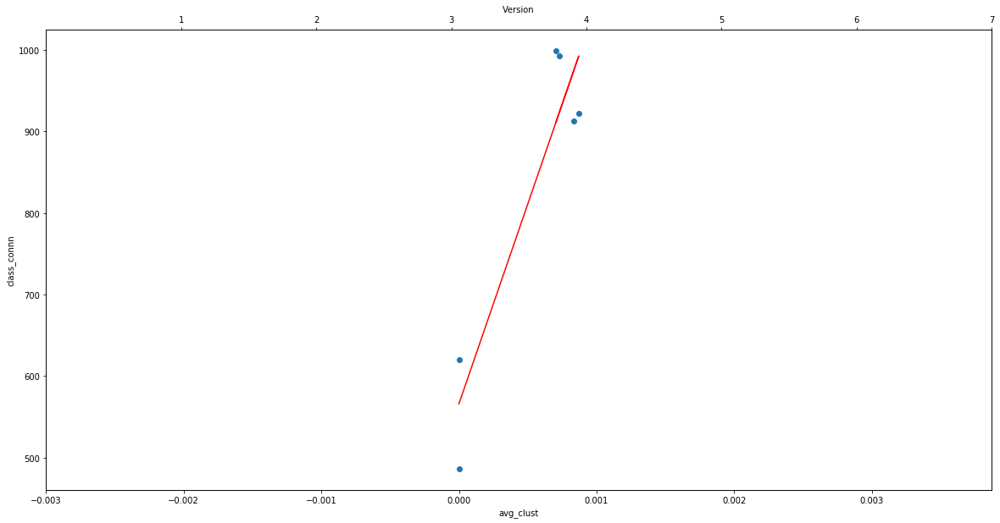

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_avg_cyclomaticInh_mm.png


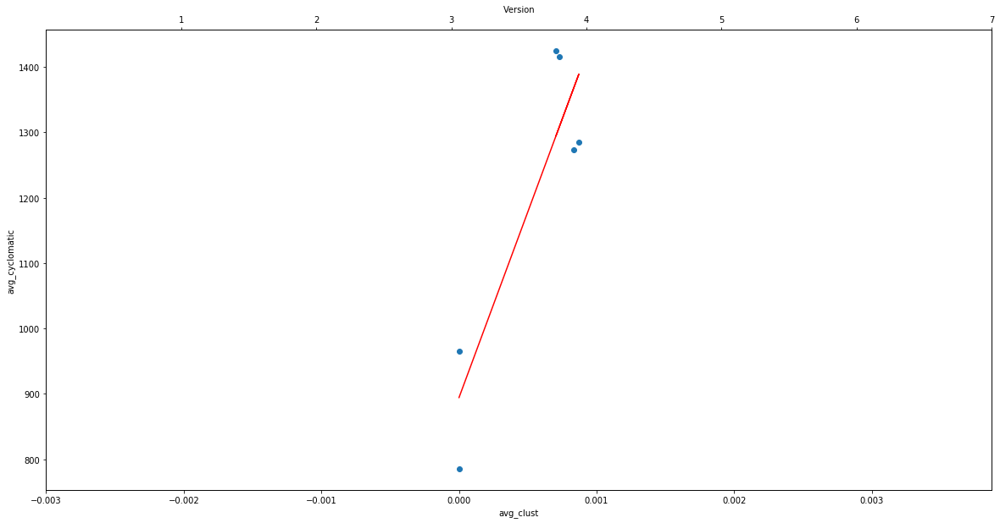

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_cboInh_mm.png


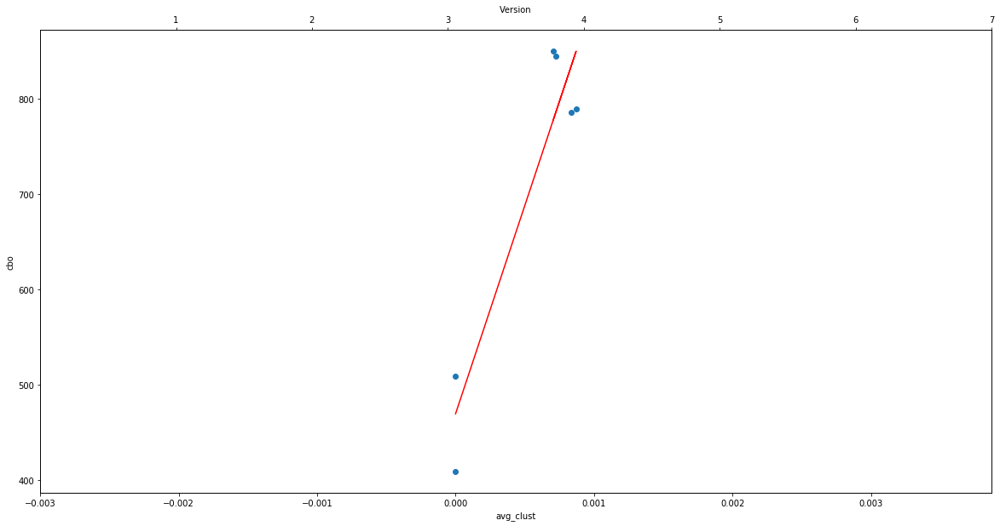

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_ditInh_mm.png


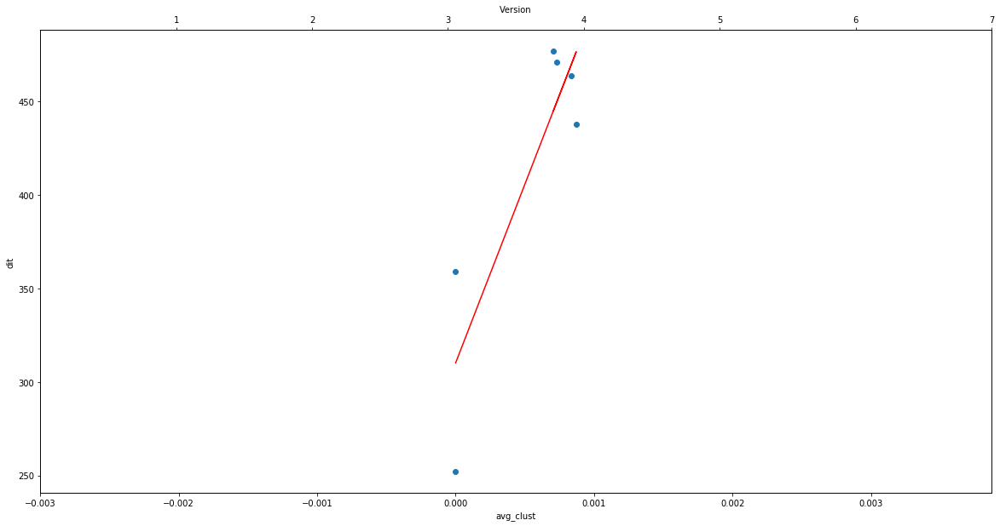

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_lcomInh_mm.png


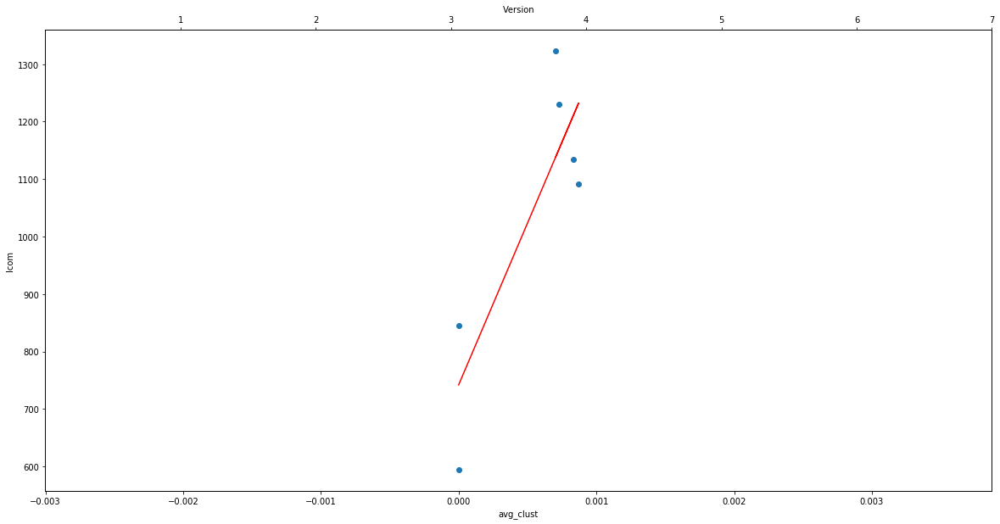

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_childrenInh_mm.png


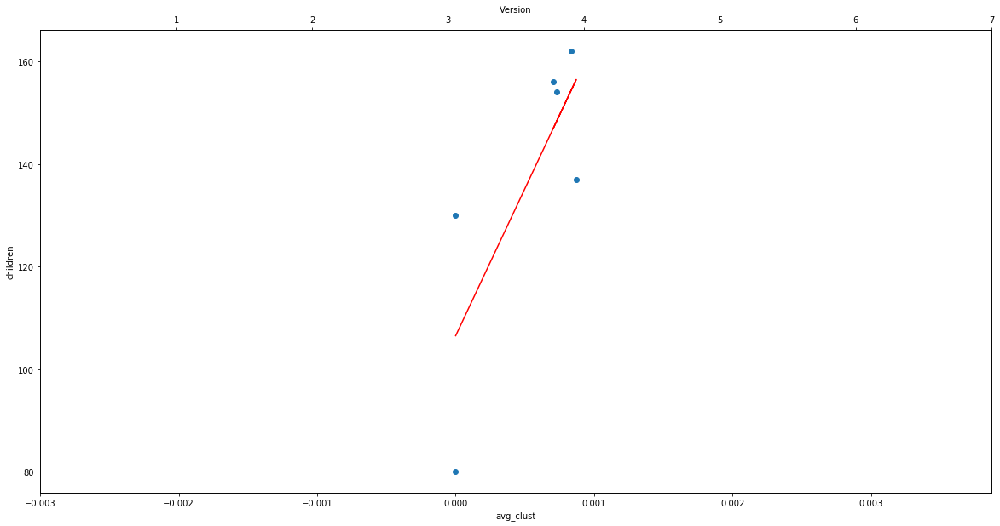

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_response_classInh_mm.png


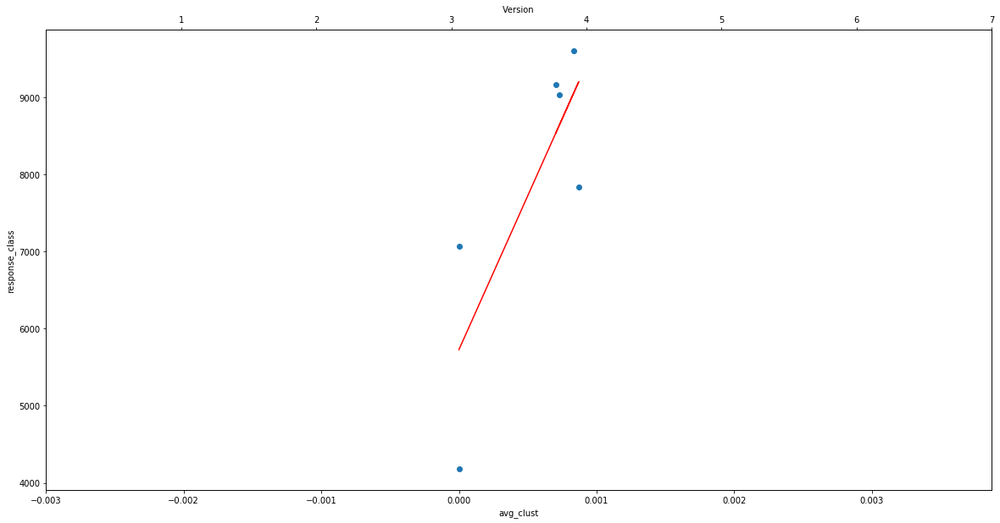

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Chukwa/scatter_plots/avg_clust_str_compInh_mm.png


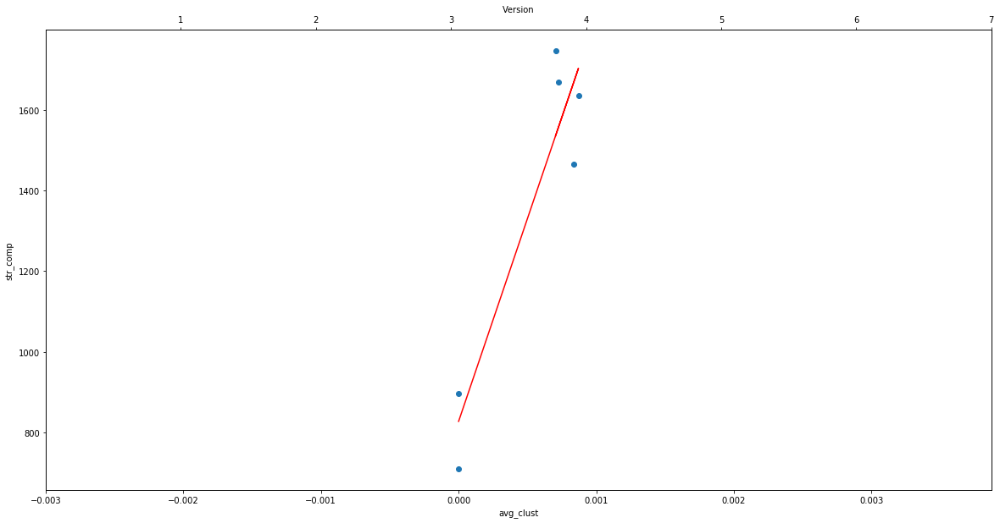

____________________________________________________________
files : ['D:/mm_thesis/D_graph/all_metrics/httpClient/httpClient_heat_s_call_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/httpClient/httpClient_heat_s_collab_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/httpClient/httpClient_heat_s_Inh_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_Call_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_cdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_colldot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_Coll_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_Inhdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_Inh_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/httpClient/http_metrics.csv']
_________________
s_path    ; ['D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/']
35
Colunm Name :  squares
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_class_connnInh_mm.png


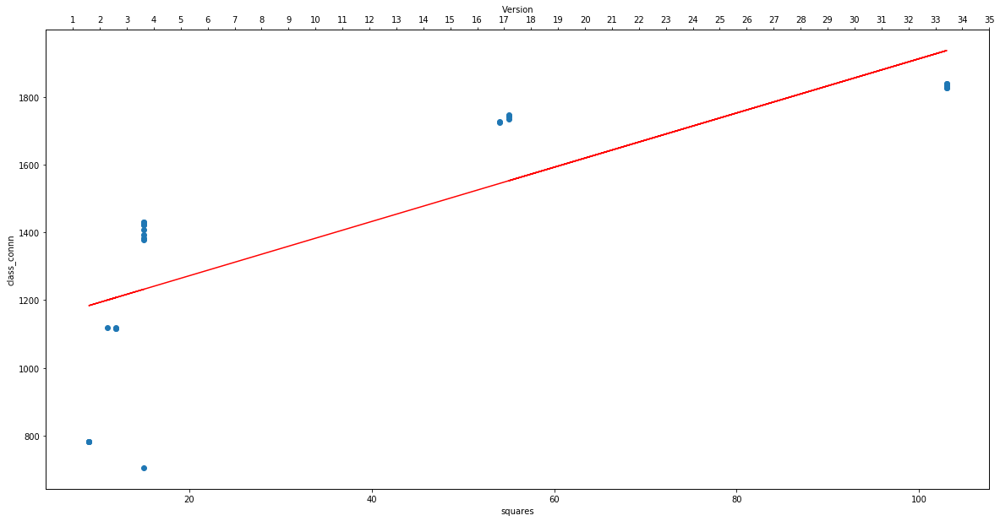

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_avg_cyclomaticInh_mm.png


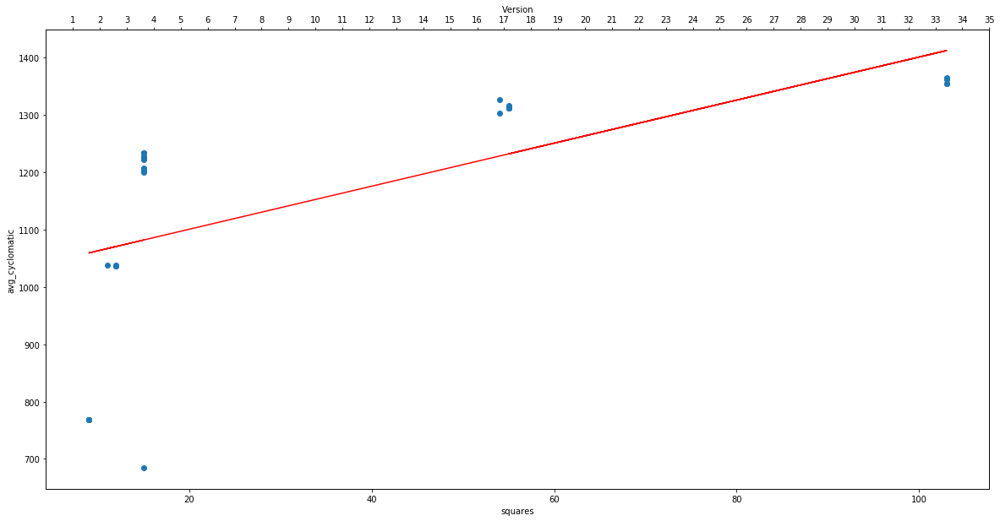

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_cboInh_mm.png


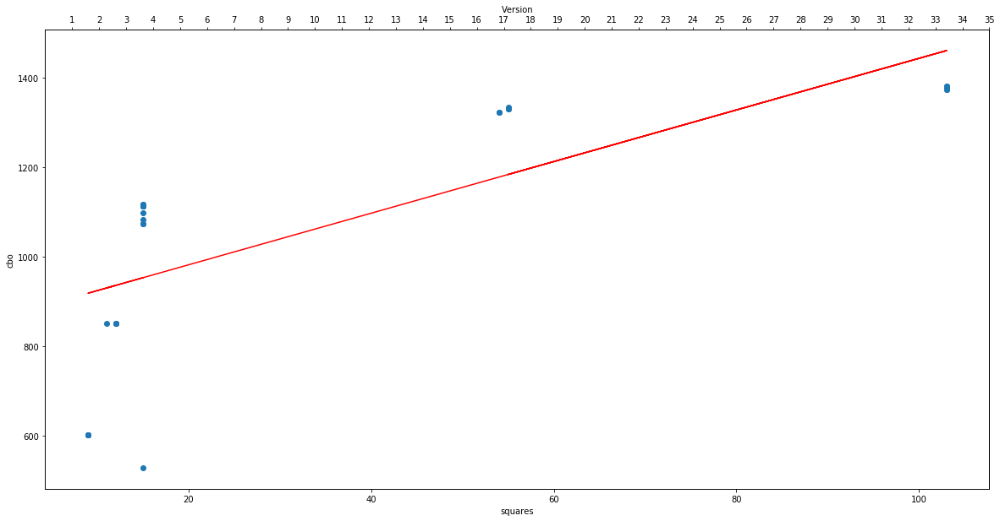

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_ditInh_mm.png


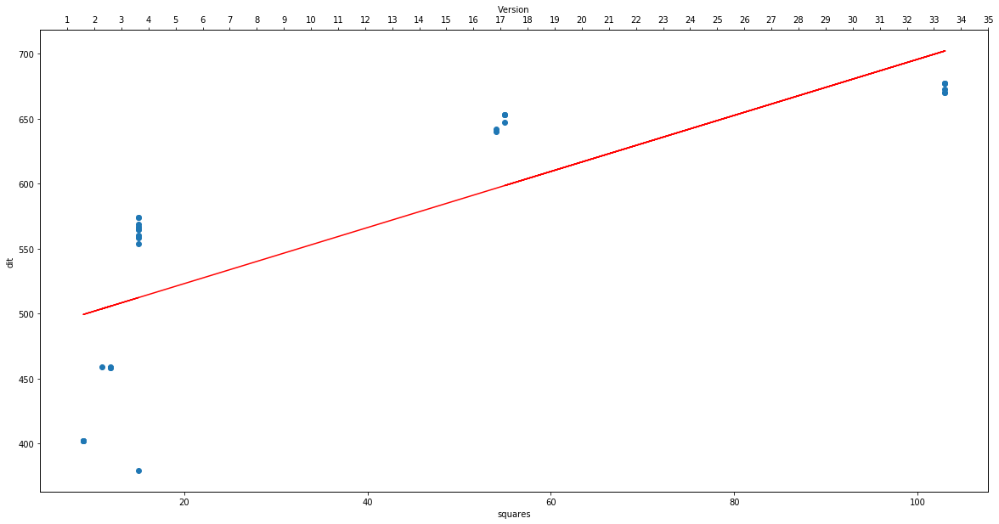

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_lcomInh_mm.png


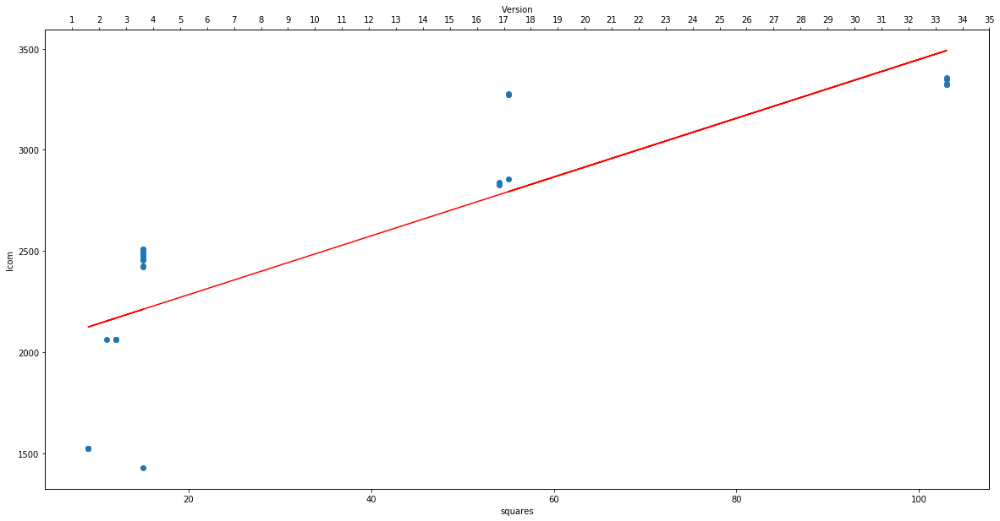

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_childrenInh_mm.png


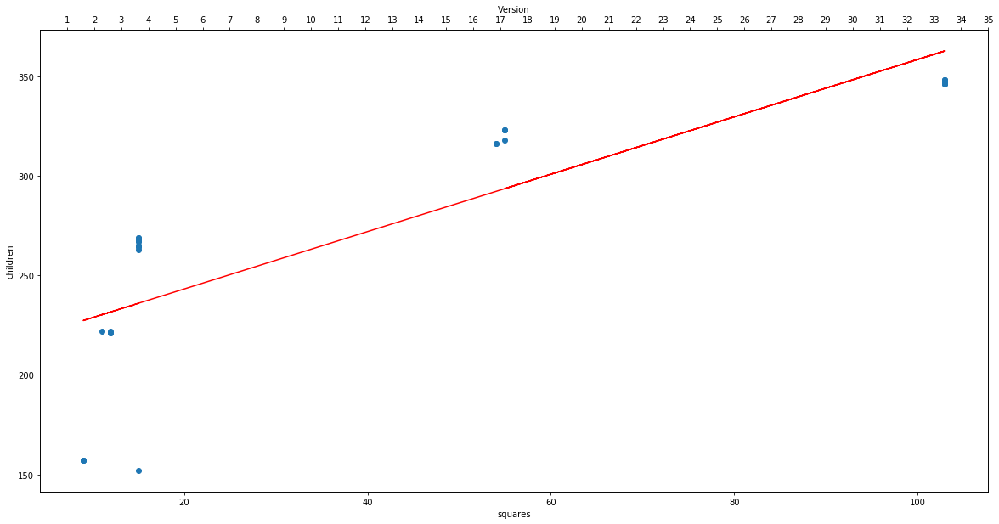

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_response_classInh_mm.png


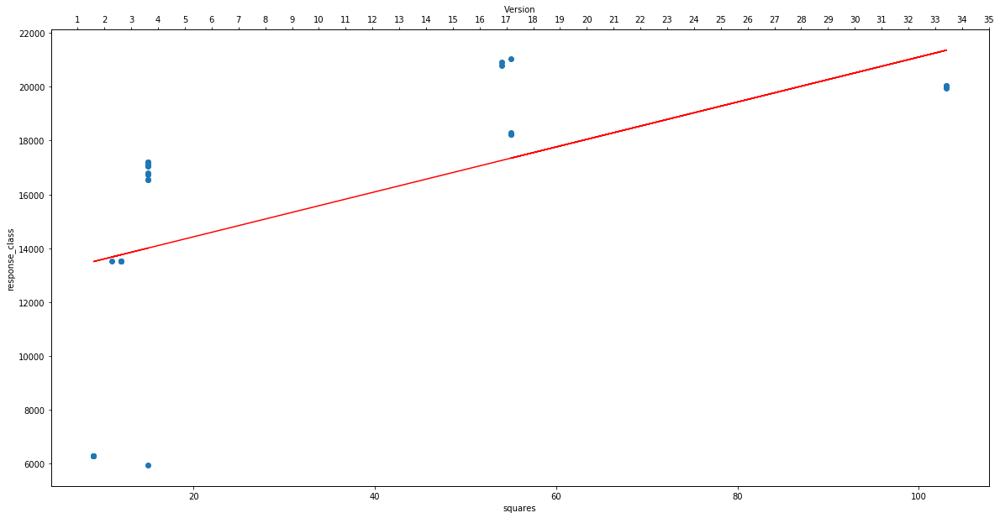

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/squares_str_compInh_mm.png


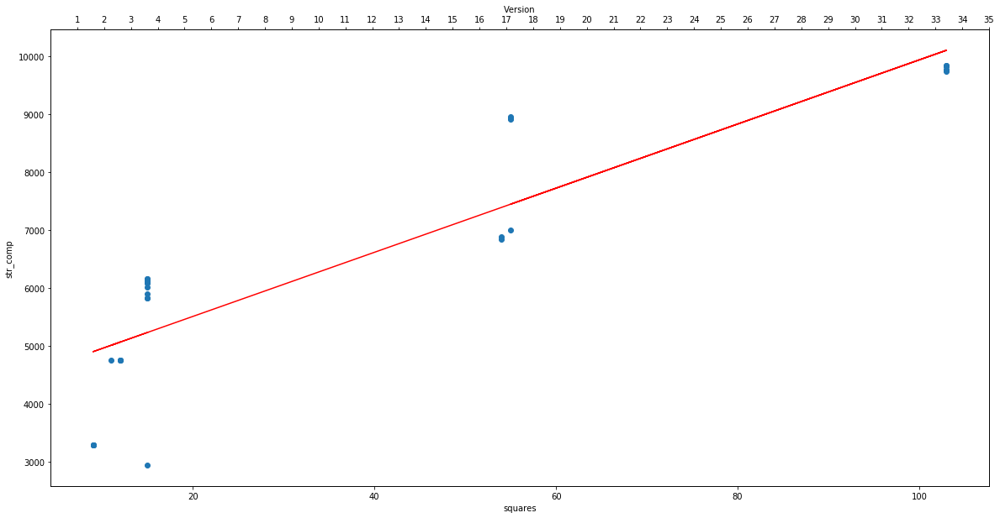

Colunm Name :  P-gamma
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_class_connnInh_mm.png


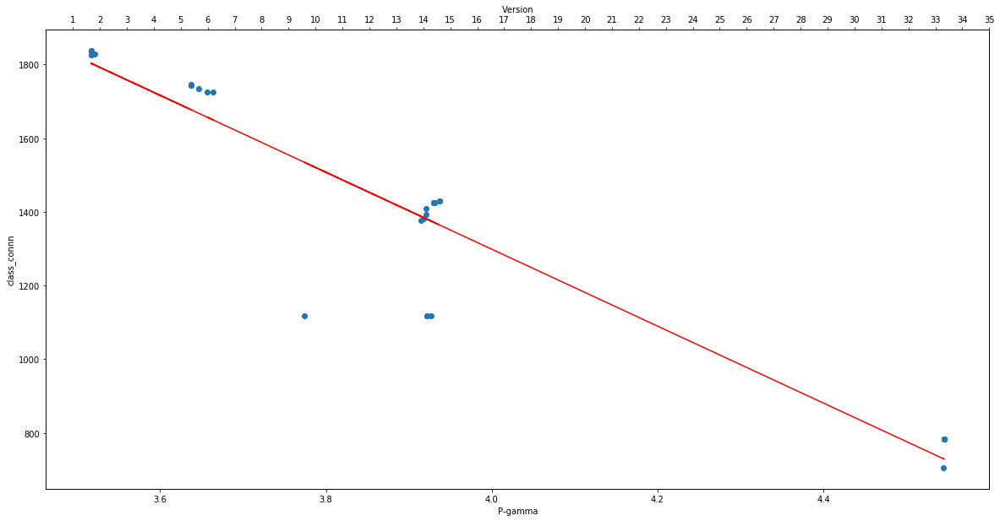

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_avg_cyclomaticInh_mm.png


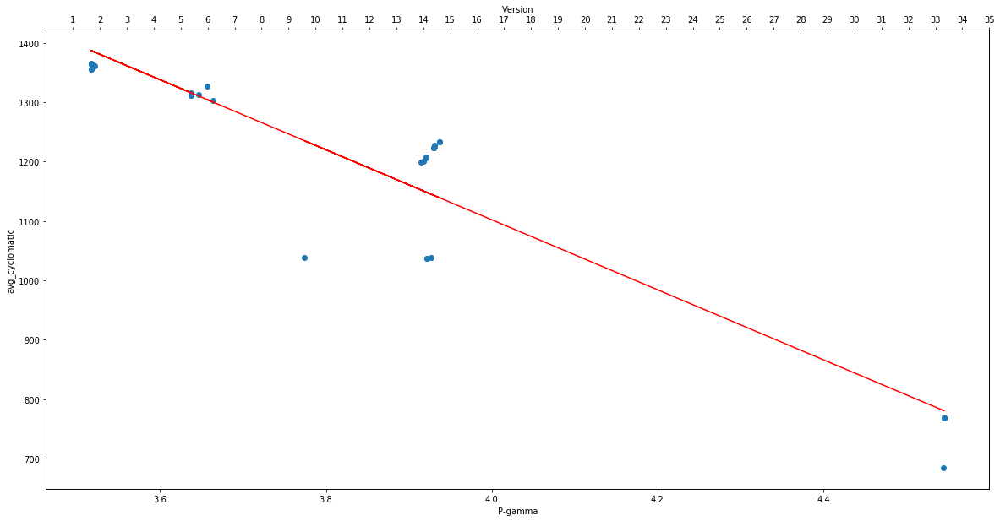

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_cboInh_mm.png


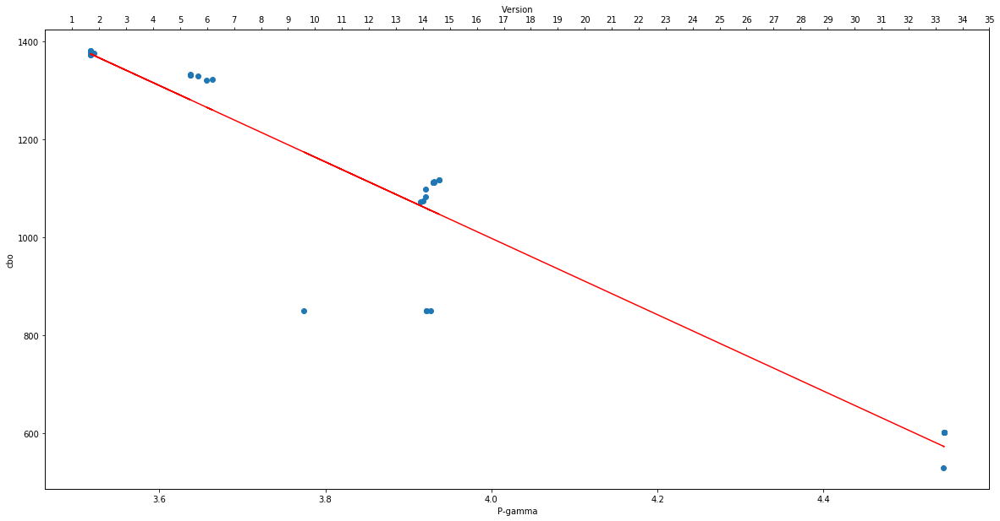

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_ditInh_mm.png


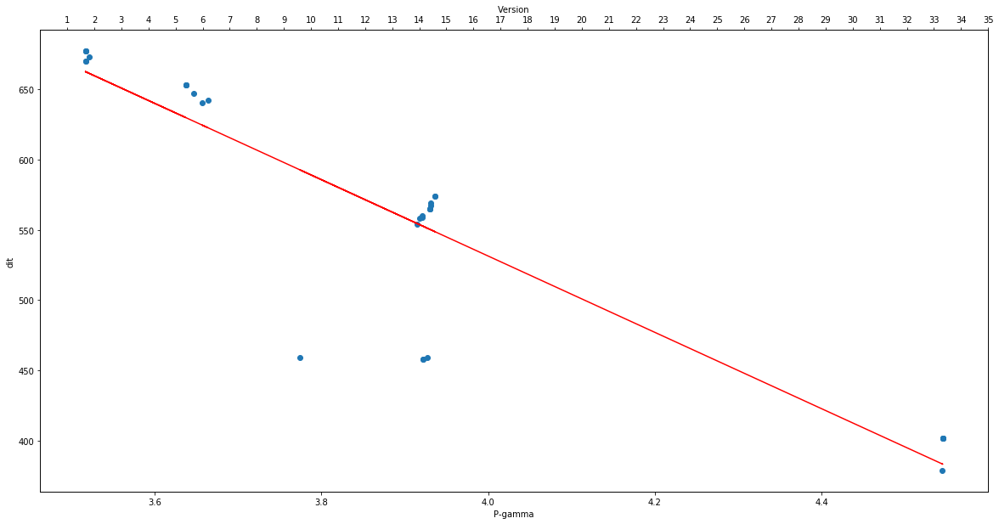

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_lcomInh_mm.png


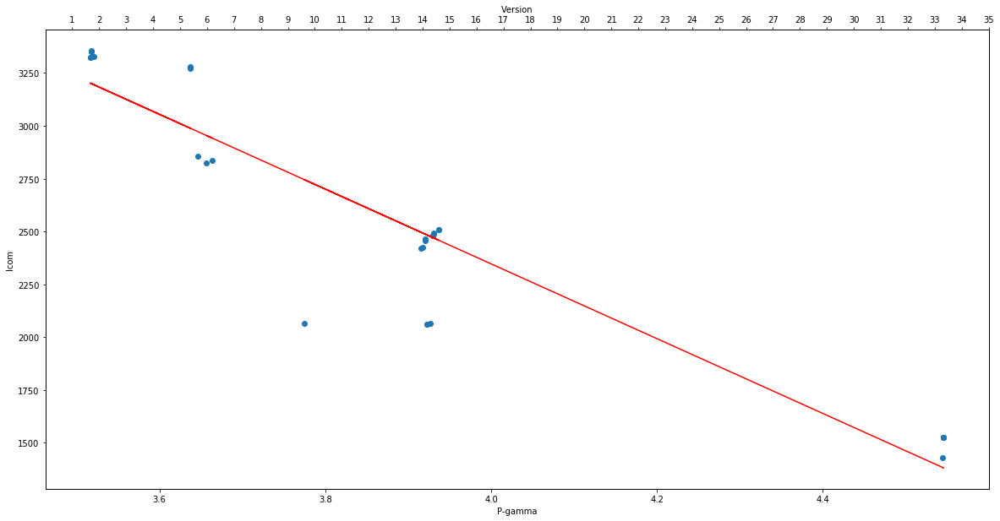

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_childrenInh_mm.png


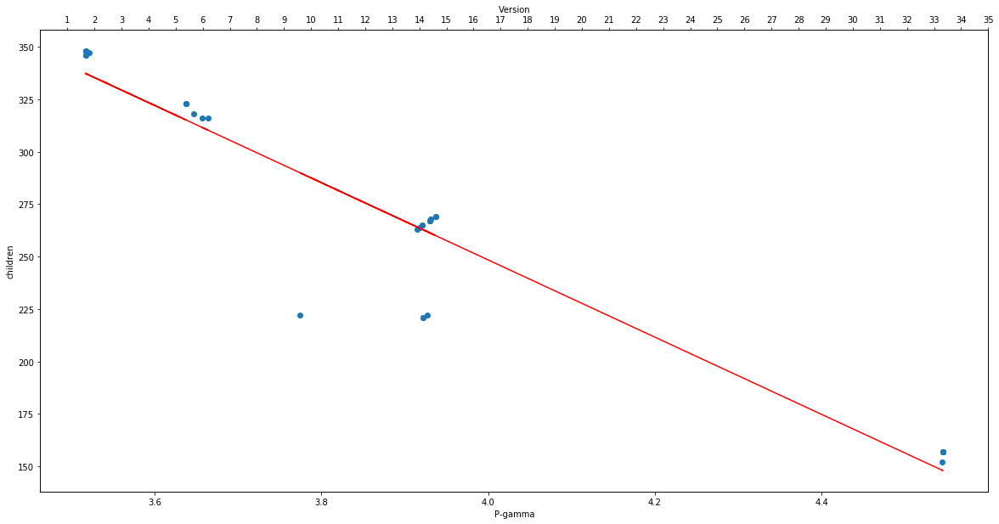

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_response_classInh_mm.png


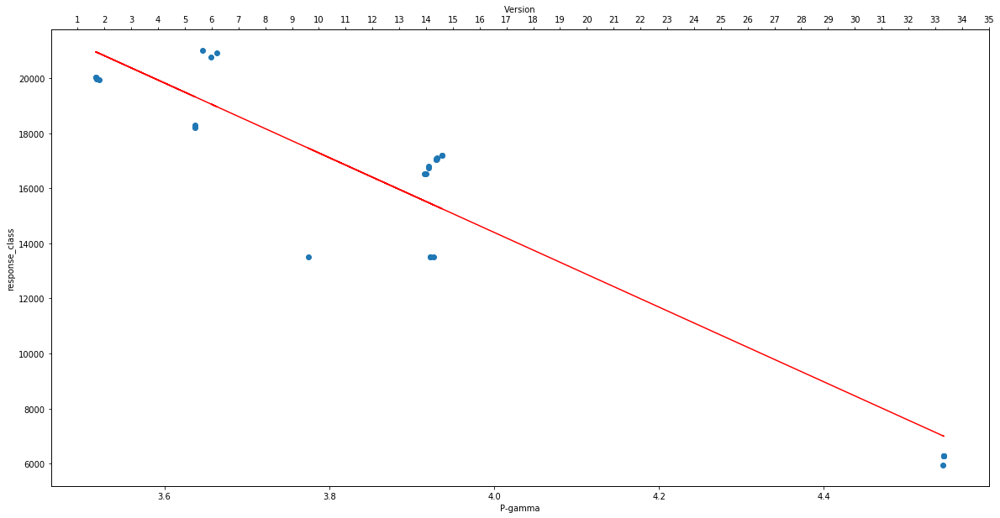

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/P-gamma_str_compInh_mm.png


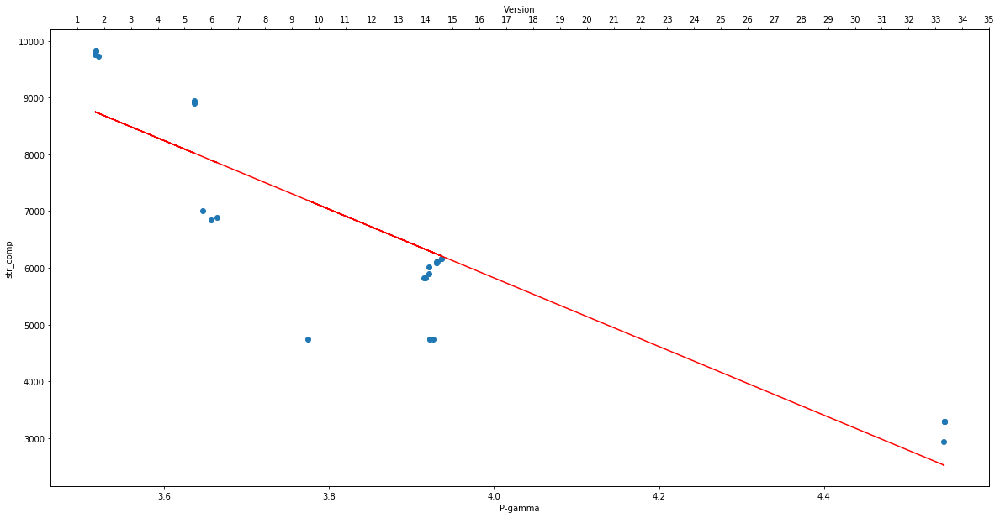

Colunm Name :  avg_degree
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_class_connnInh_mm.png


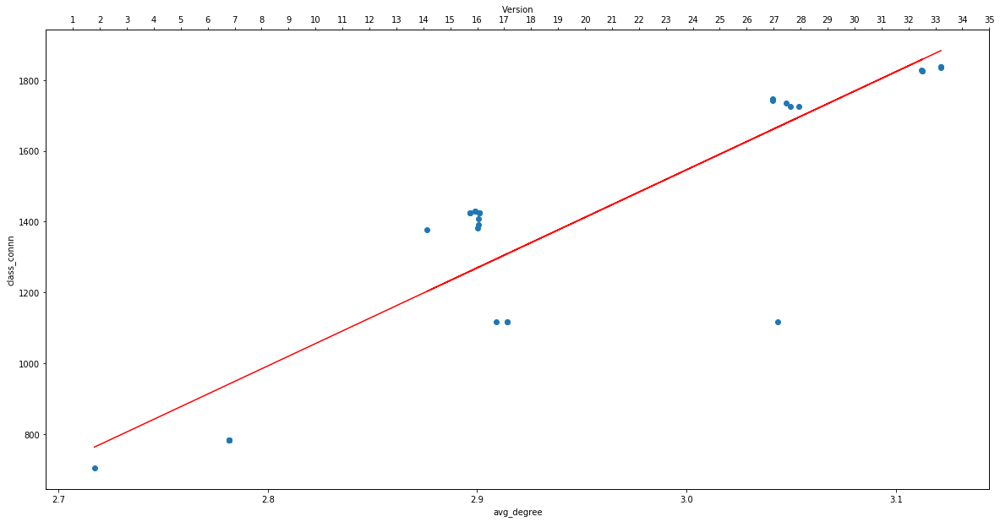

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_avg_cyclomaticInh_mm.png


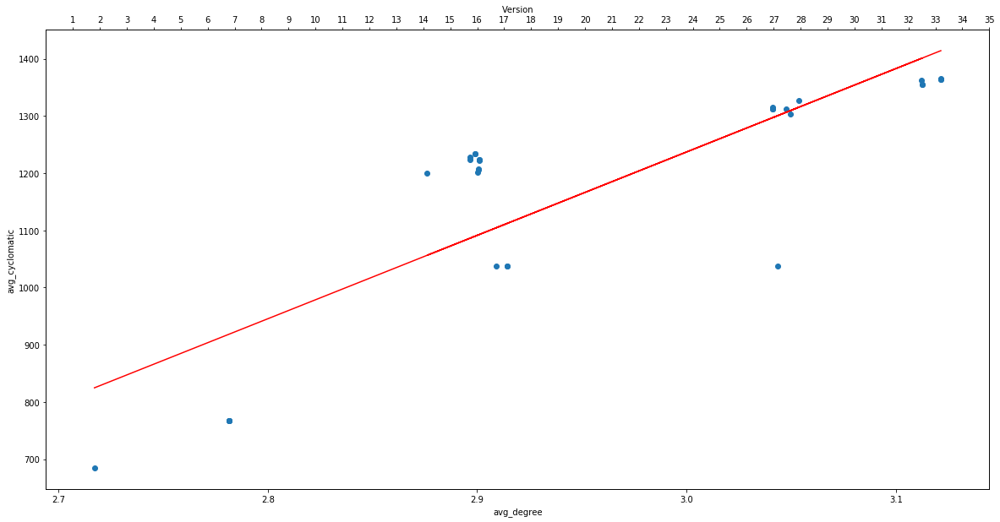

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_cboInh_mm.png


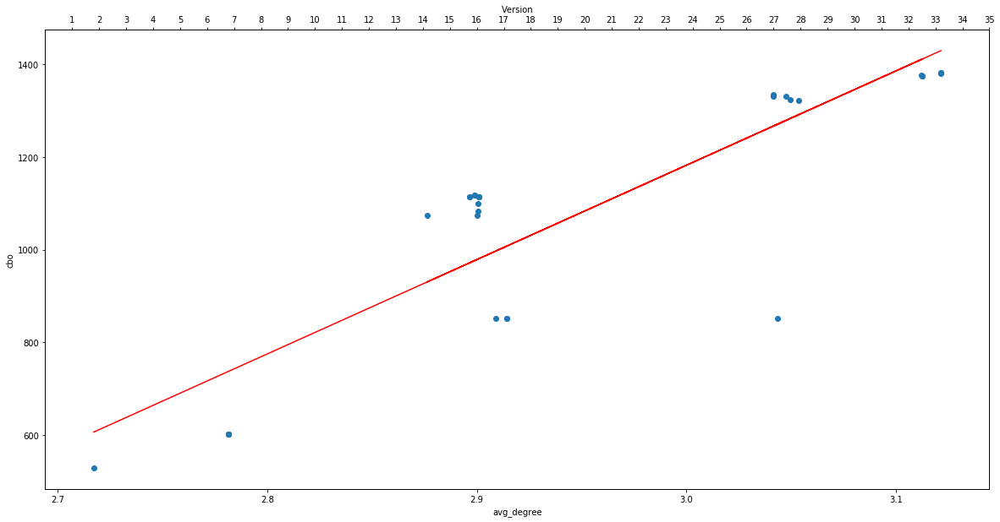

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_ditInh_mm.png


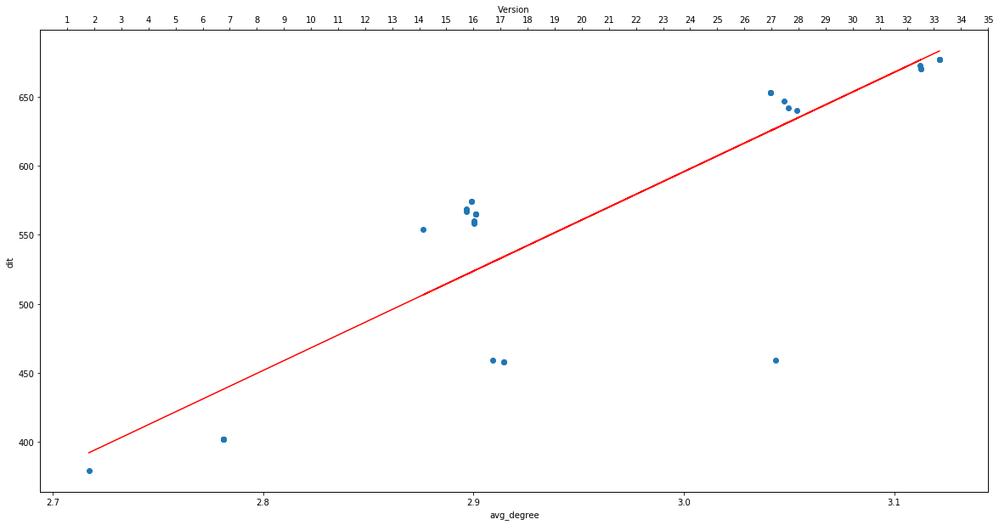

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_lcomInh_mm.png


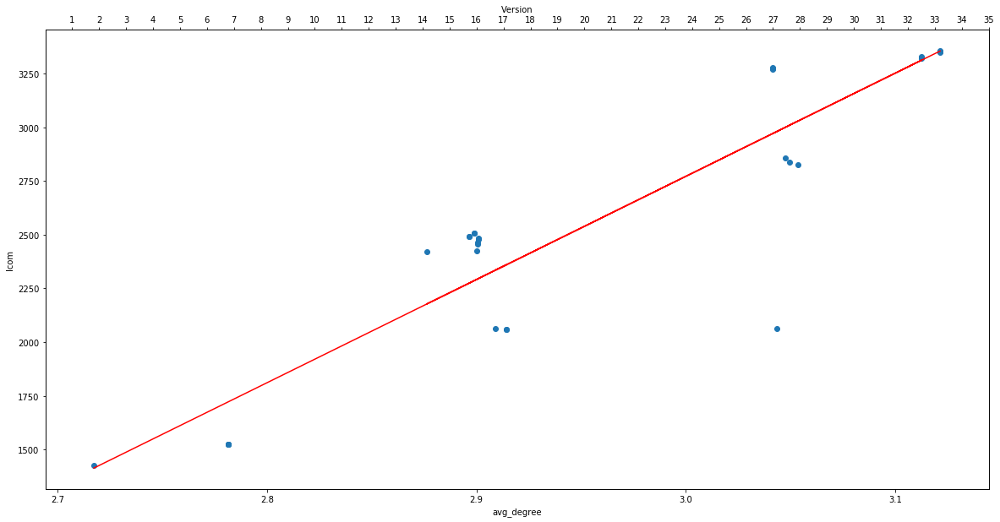

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_childrenInh_mm.png


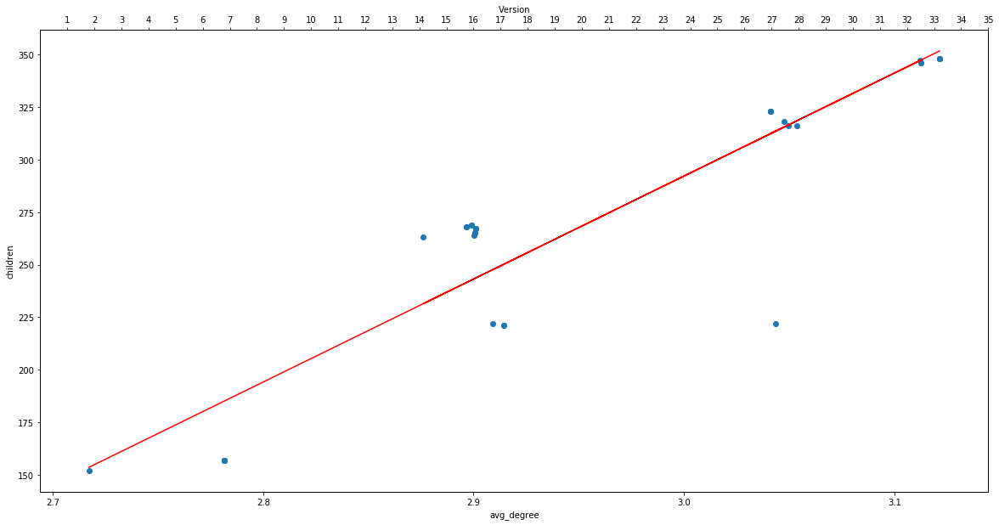

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_response_classInh_mm.png


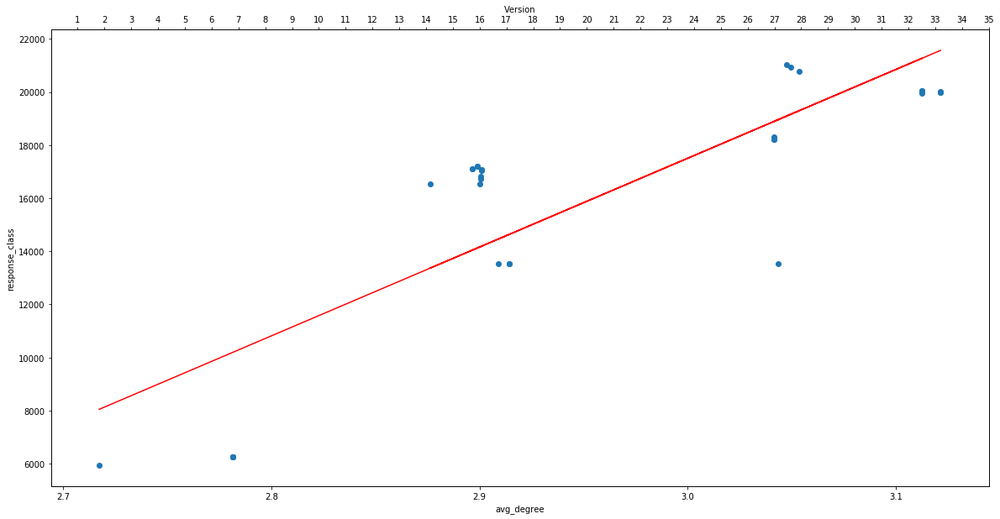

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_degree_str_compInh_mm.png


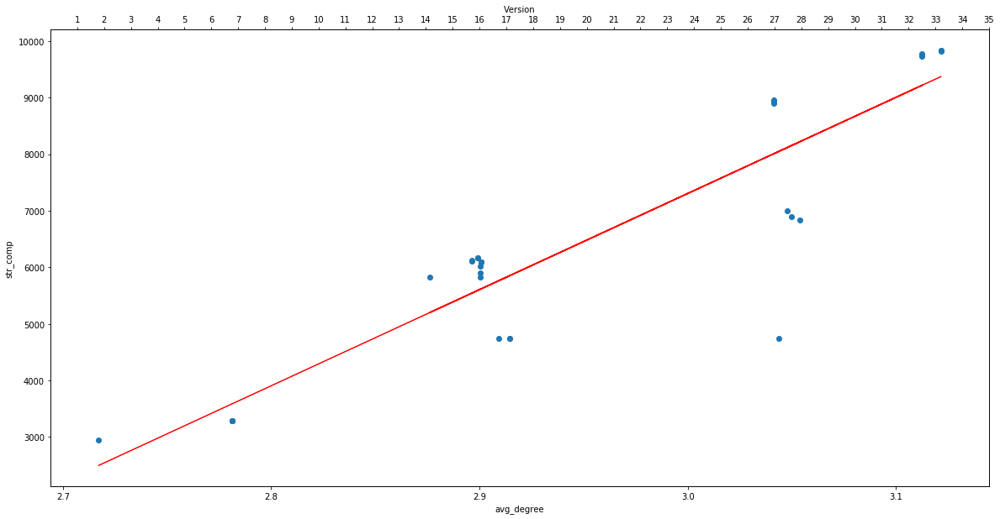

Colunm Name :  no_comm
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_class_connnInh_mm.png


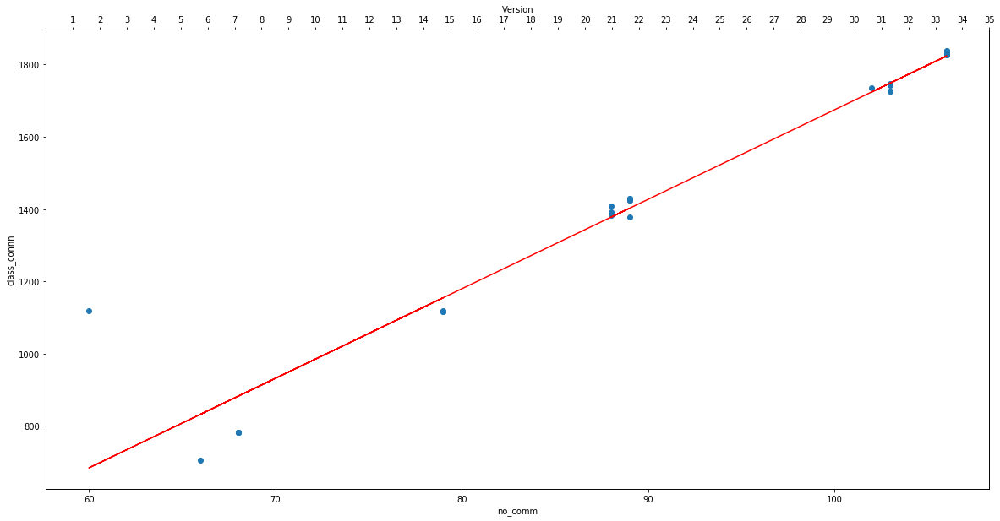

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_avg_cyclomaticInh_mm.png


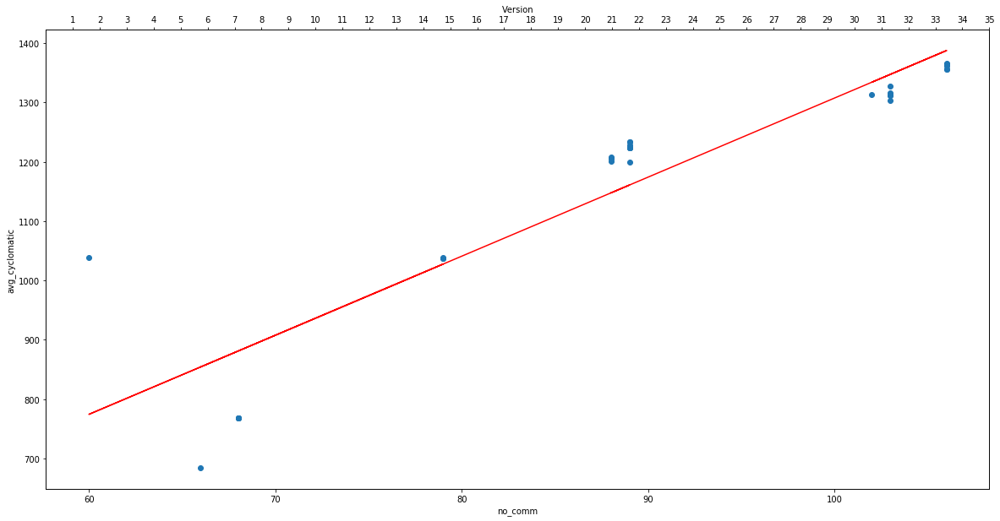

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_cboInh_mm.png


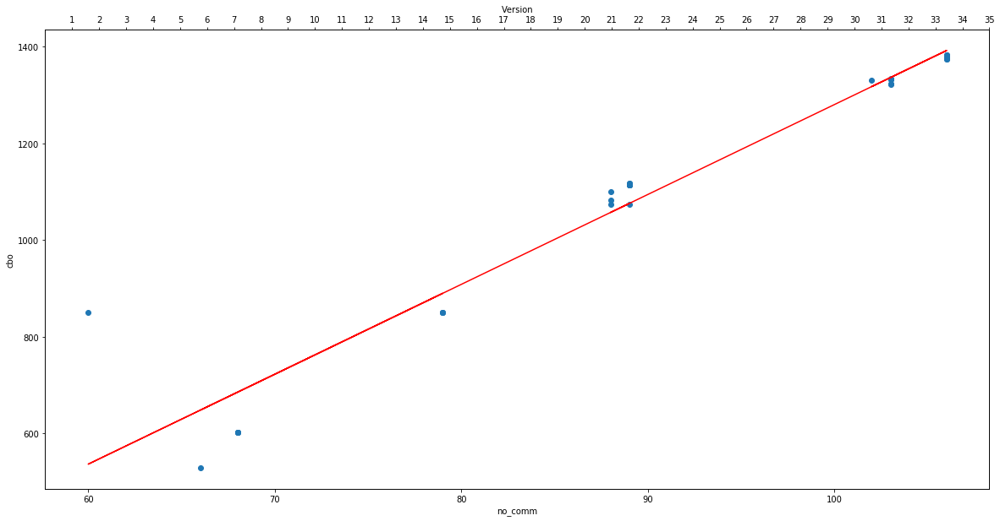

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_ditInh_mm.png


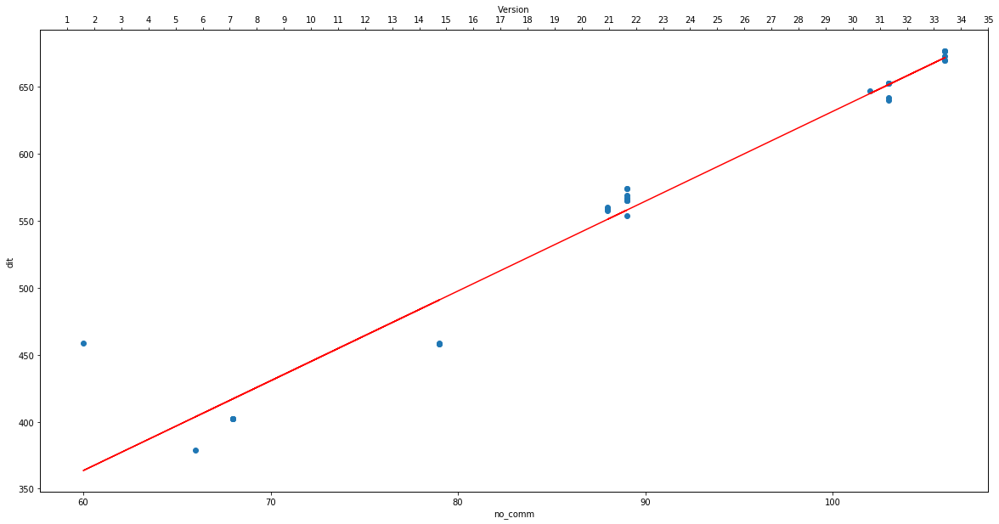

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_lcomInh_mm.png


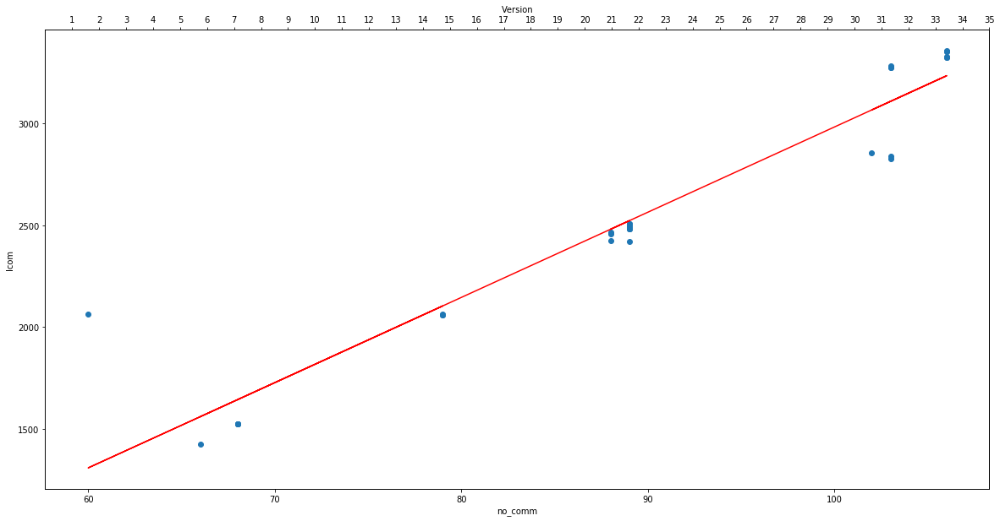

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_childrenInh_mm.png


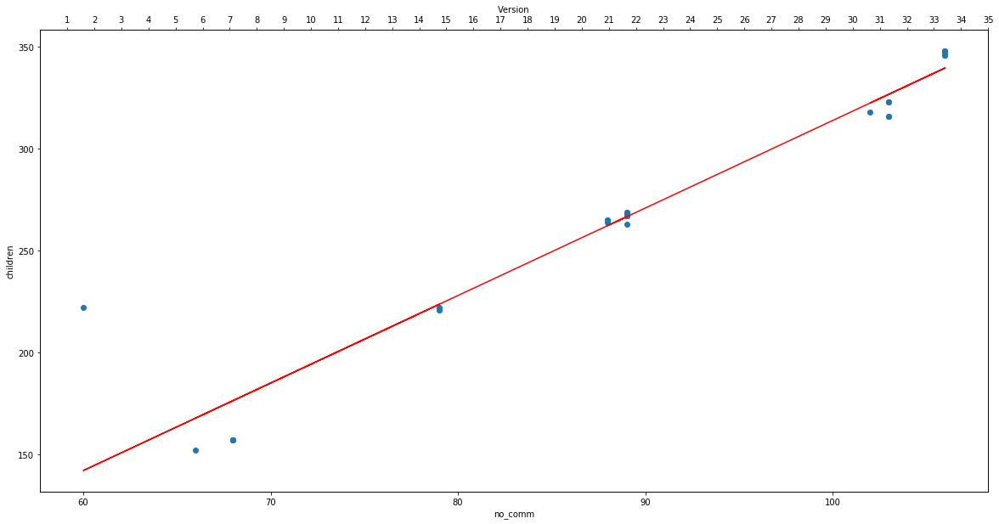

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_response_classInh_mm.png


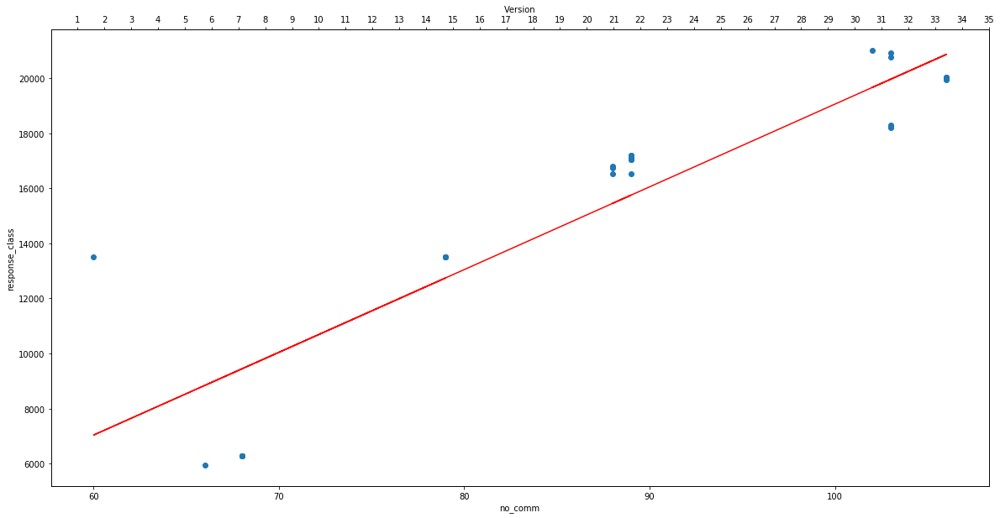

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/no_comm_str_compInh_mm.png


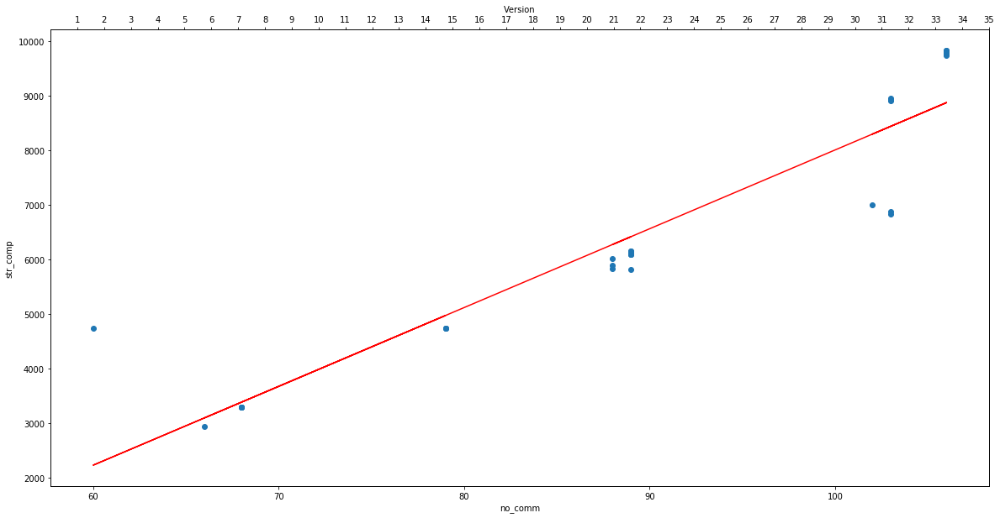

Colunm Name :  avg_shortest_path
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_class_connnInh_mm.png


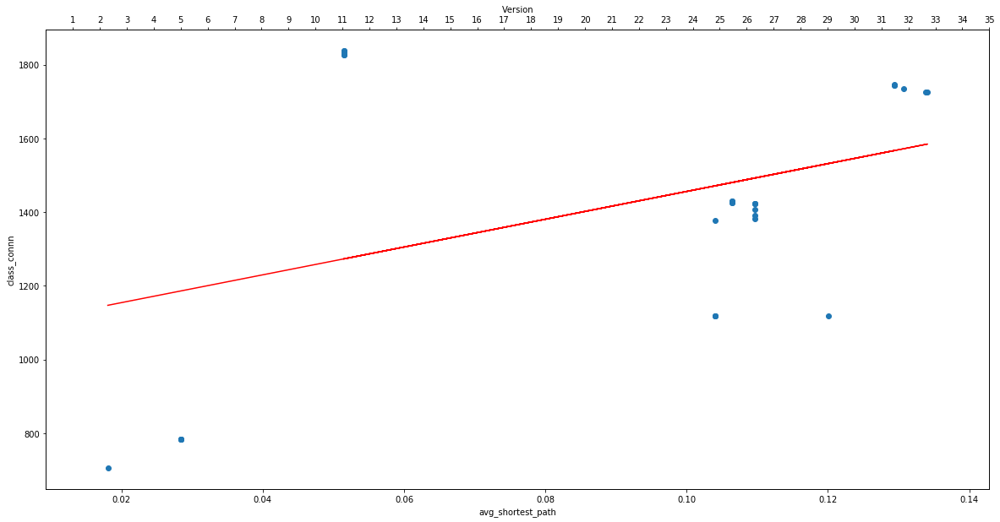

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_avg_cyclomaticInh_mm.png


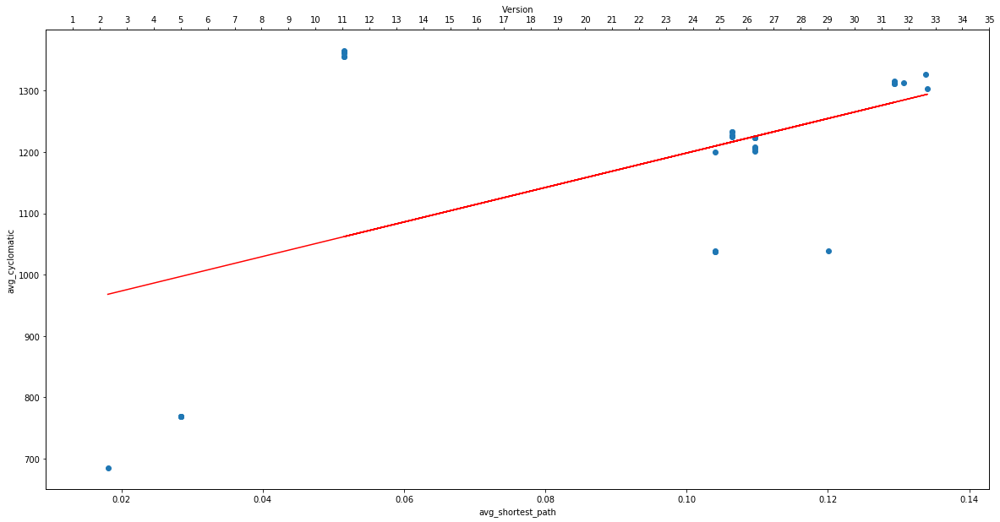

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_cboInh_mm.png


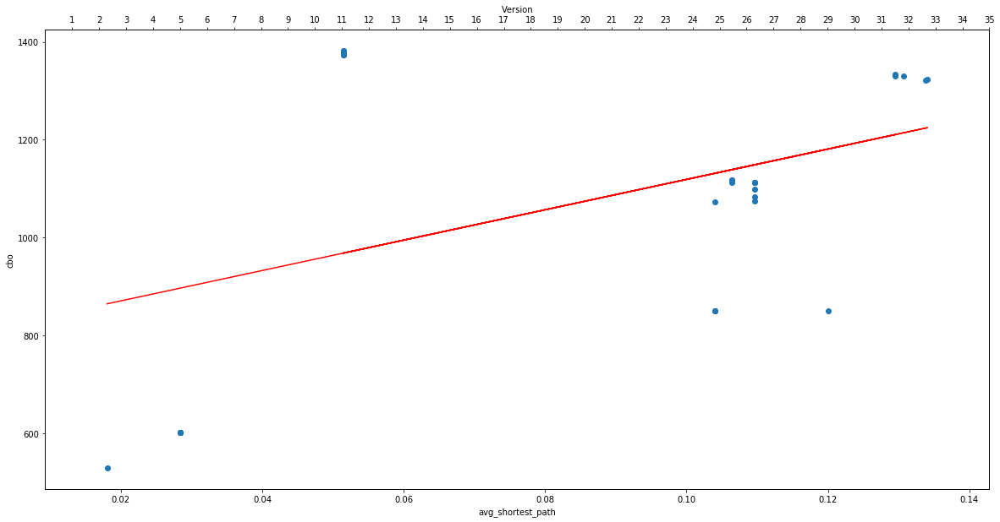

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_ditInh_mm.png


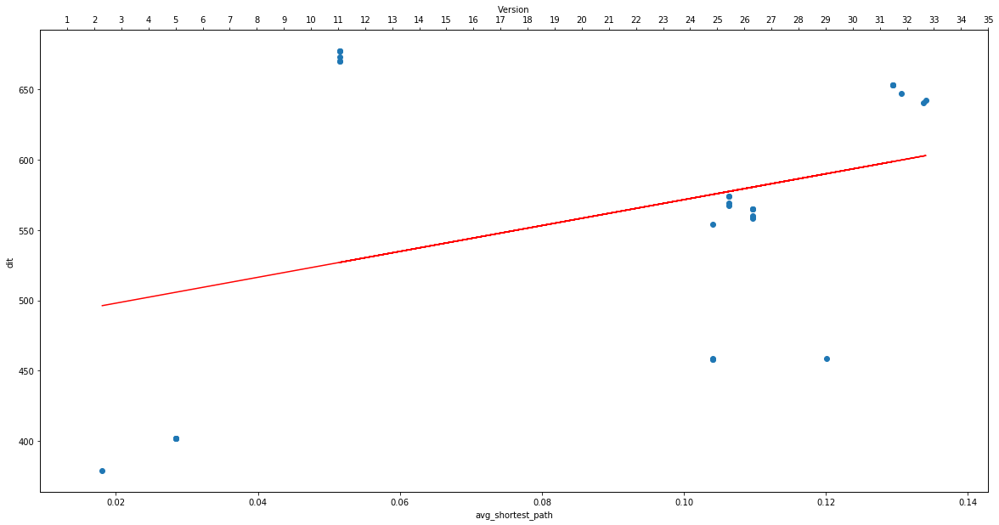

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_lcomInh_mm.png


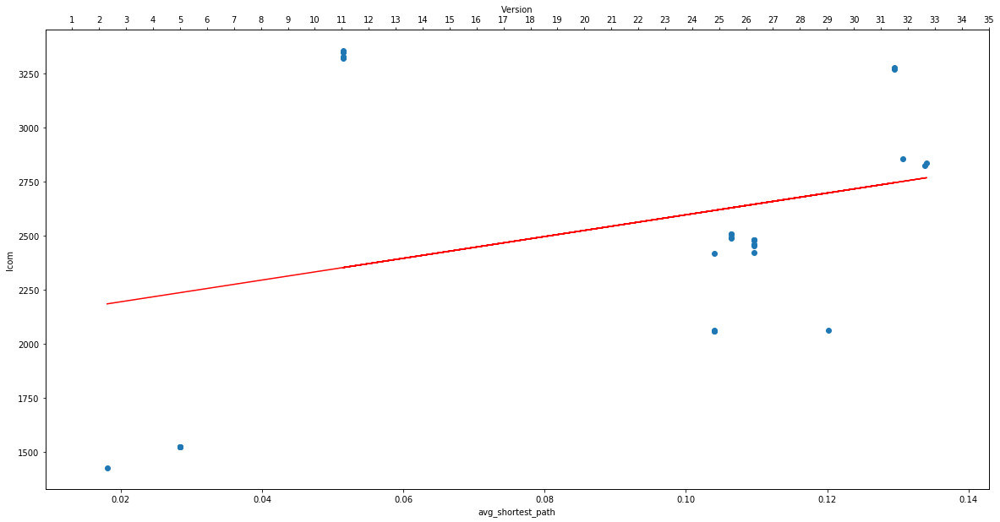

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_childrenInh_mm.png


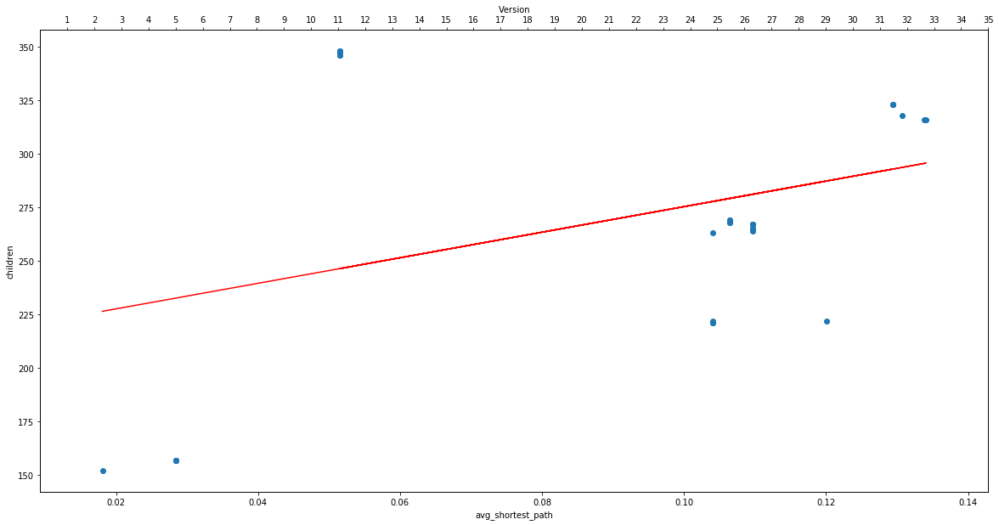

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_response_classInh_mm.png


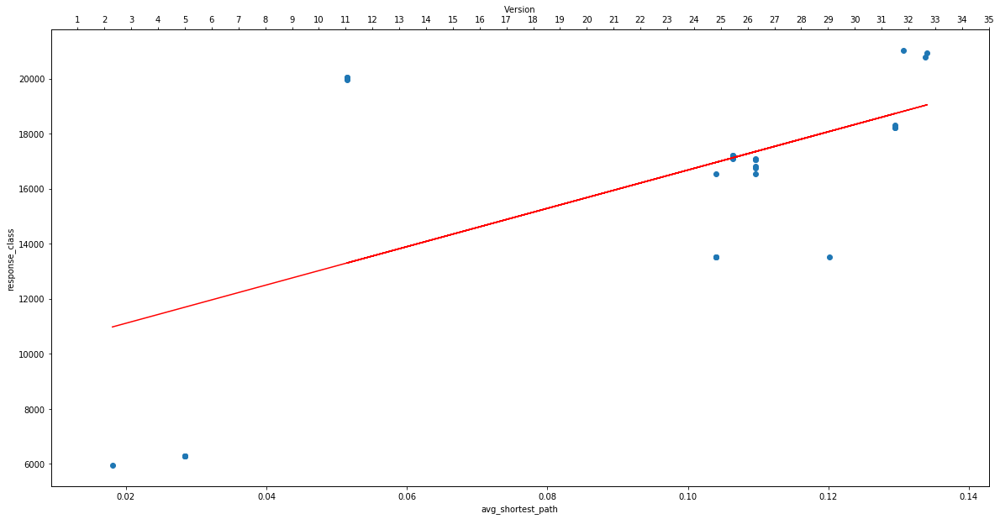

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_shortest_path_str_compInh_mm.png


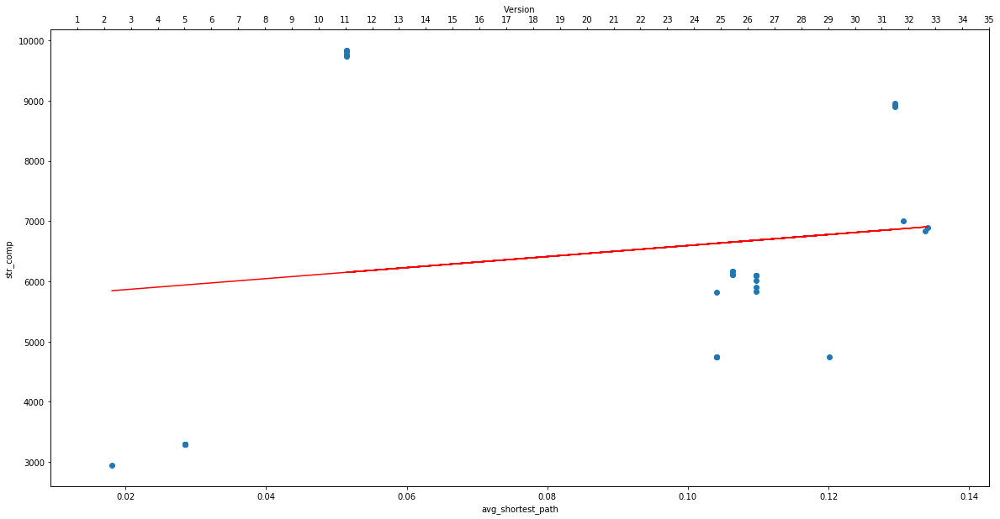

Colunm Name :  sub_density
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_class_connnInh_mm.png


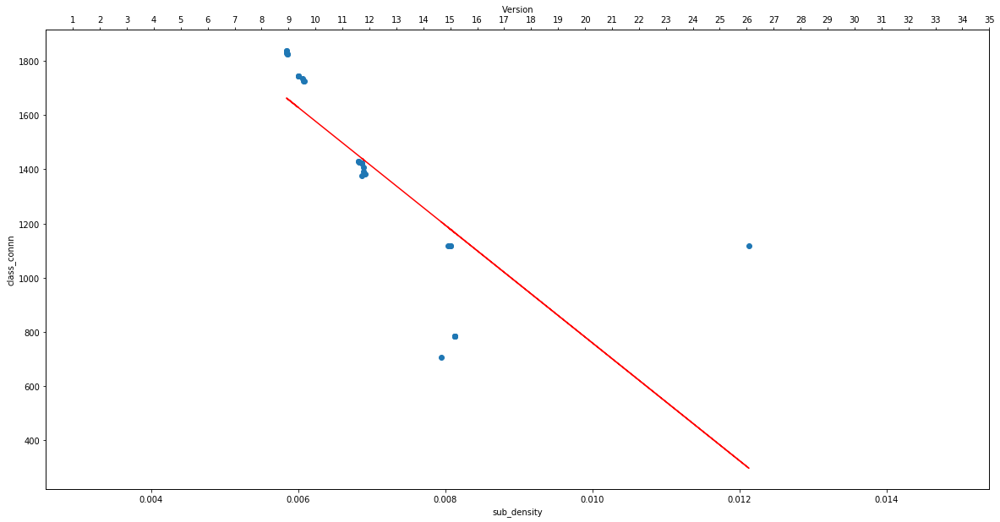

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_avg_cyclomaticInh_mm.png


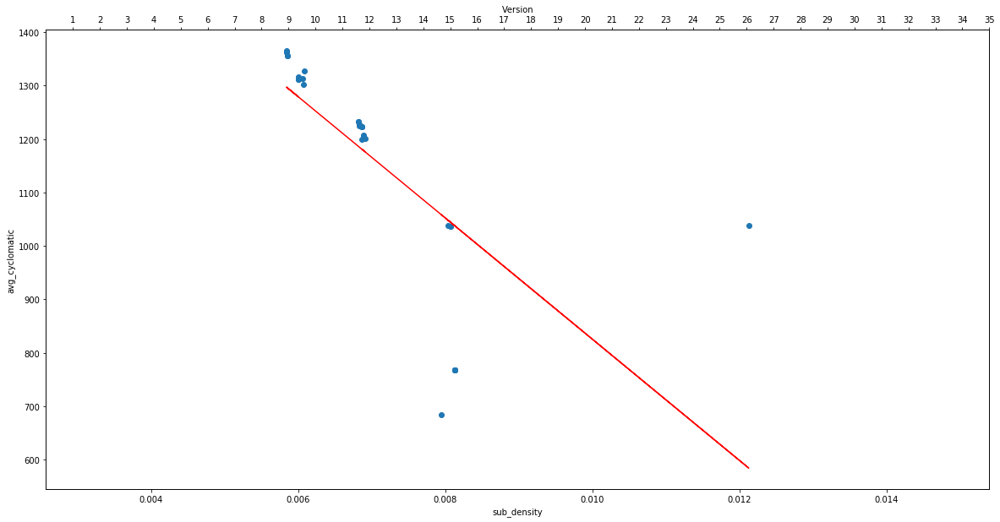

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_cboInh_mm.png


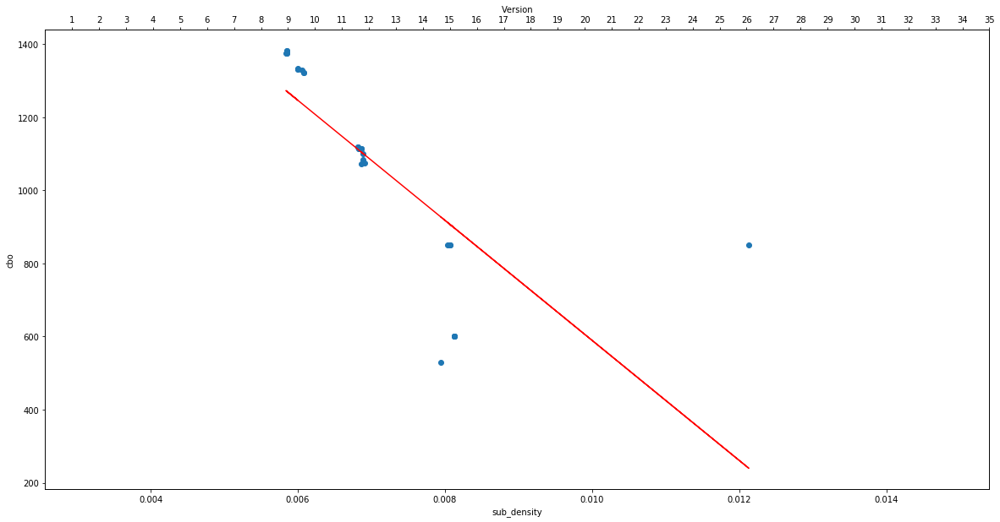

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_ditInh_mm.png


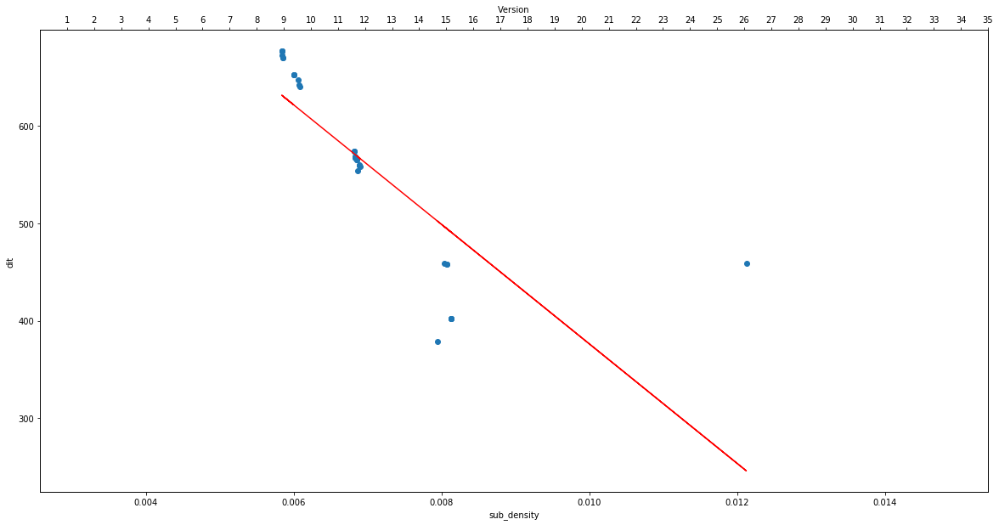

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_lcomInh_mm.png


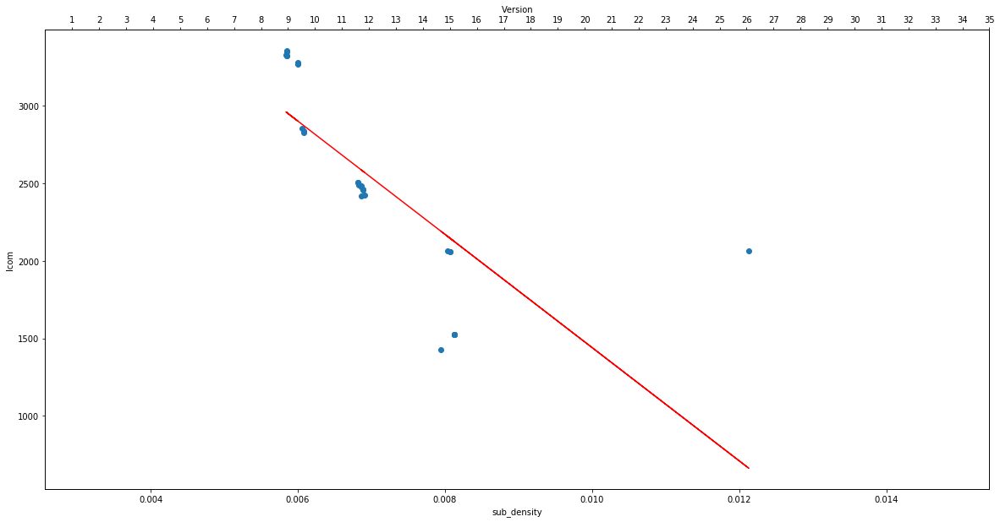

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_childrenInh_mm.png


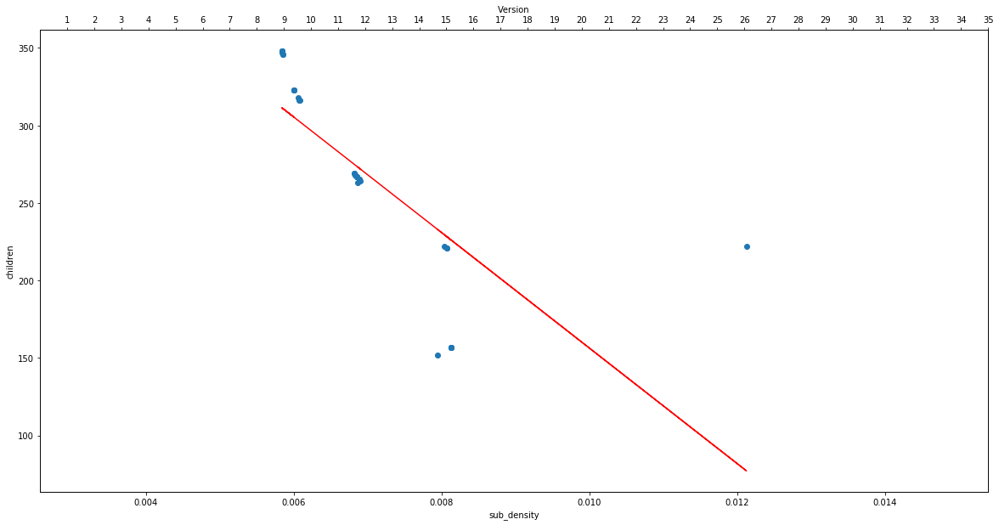

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_response_classInh_mm.png


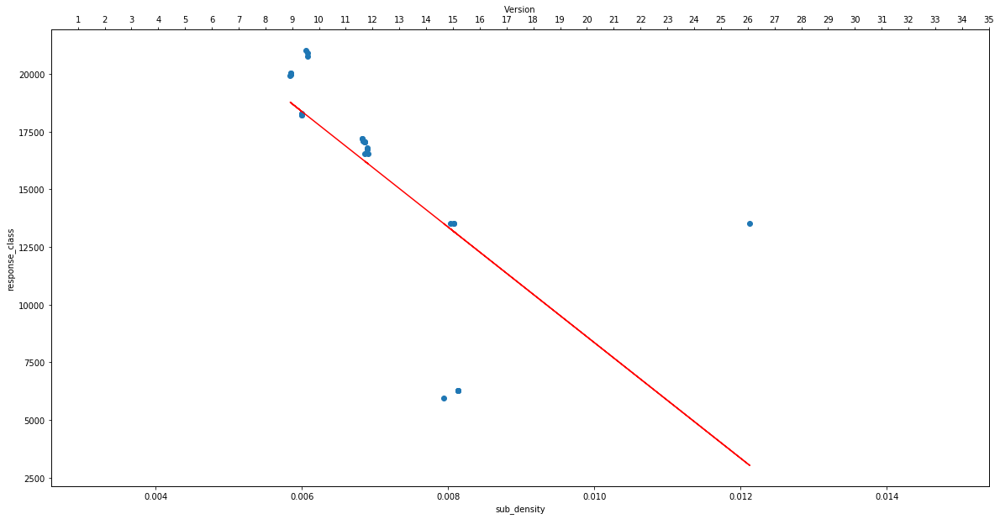

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/sub_density_str_compInh_mm.png


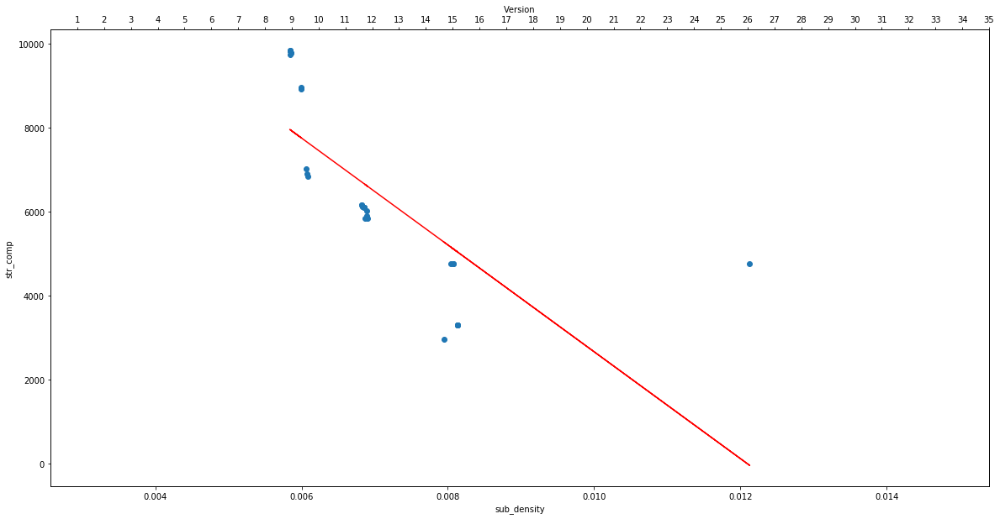

Colunm Name :  avg_clust
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_class_connnInh_mm.png


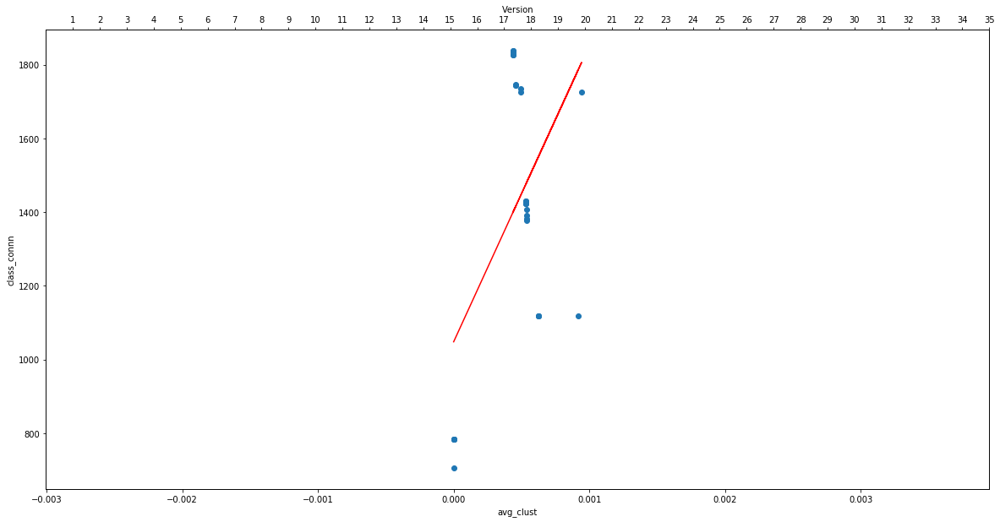

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_avg_cyclomaticInh_mm.png


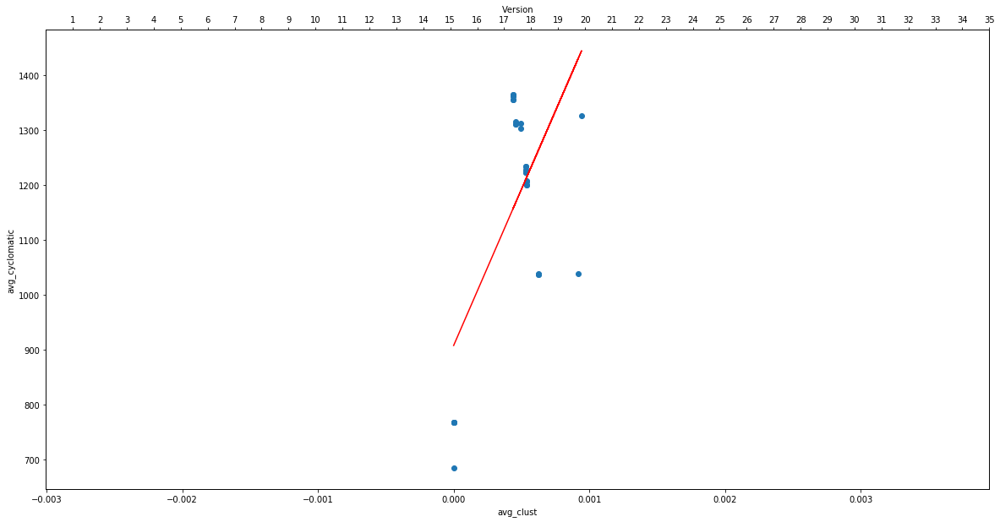

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_cboInh_mm.png


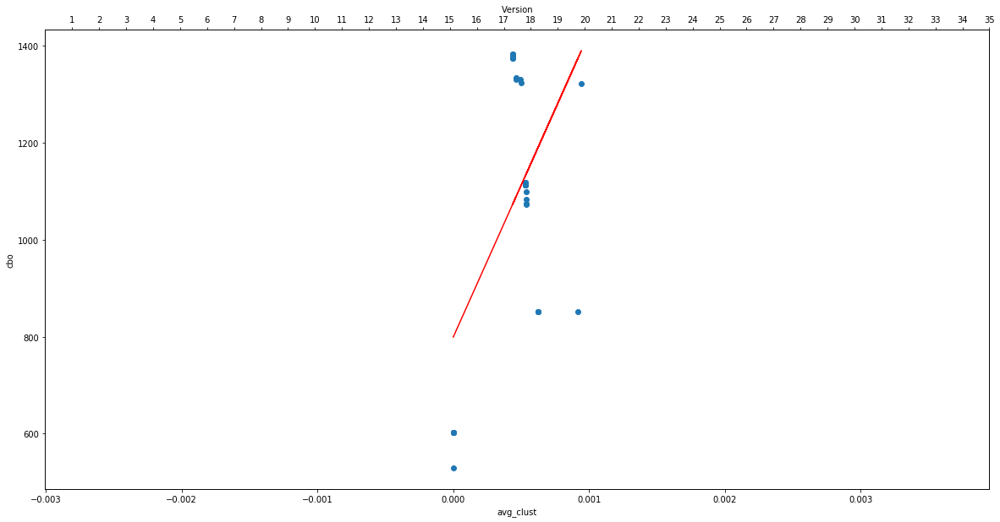

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_ditInh_mm.png


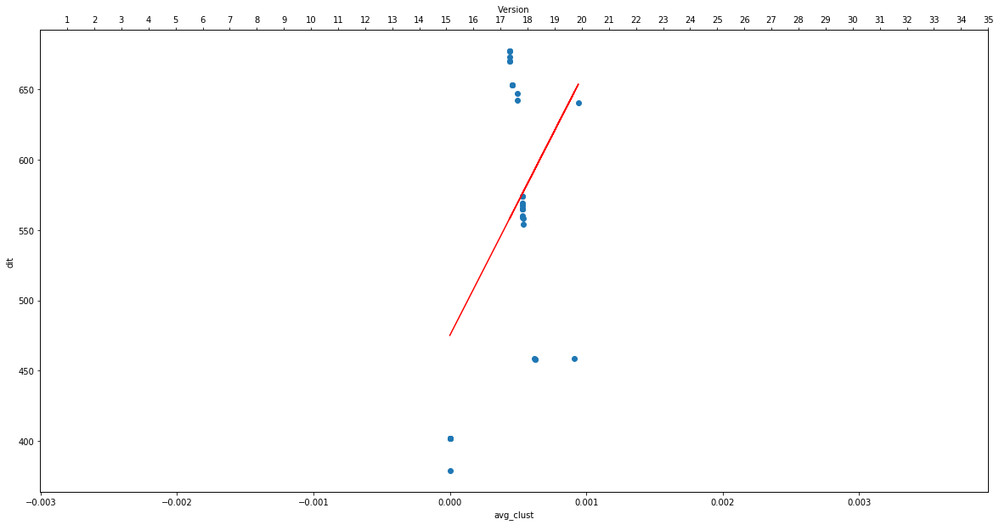

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_lcomInh_mm.png


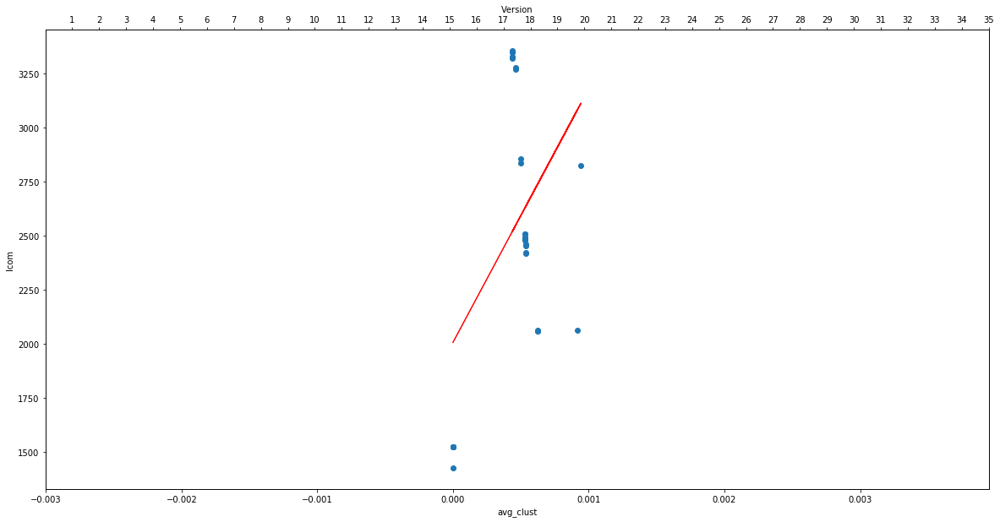

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_childrenInh_mm.png


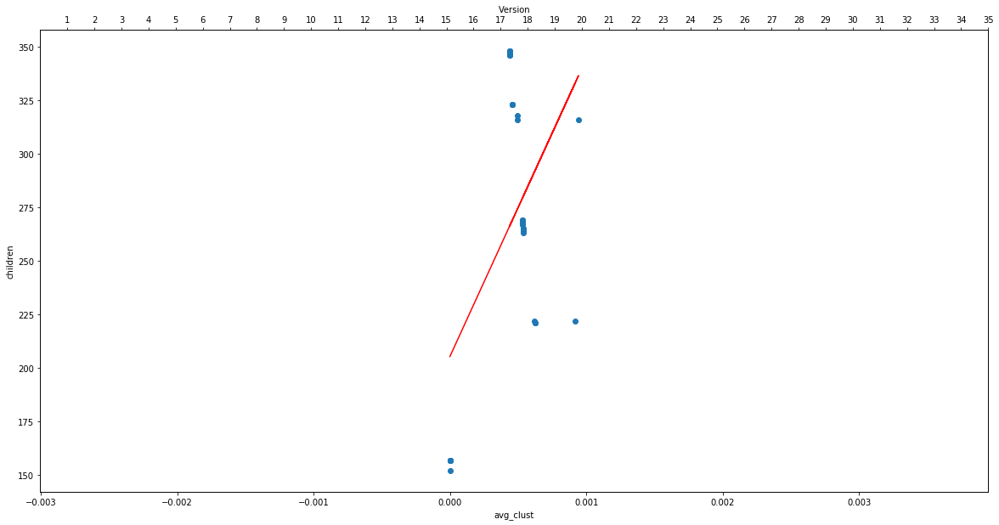

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_response_classInh_mm.png


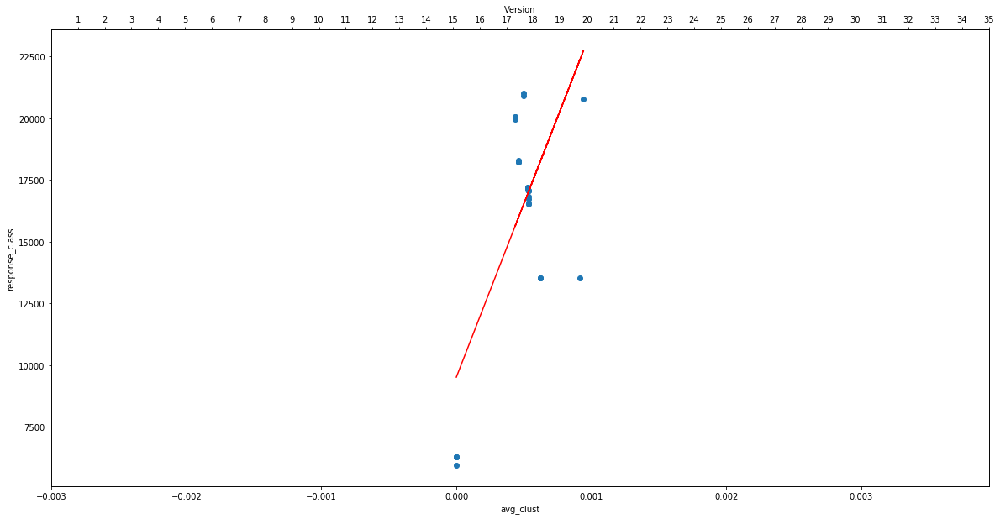

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/httpClient/scatter_plots/avg_clust_str_compInh_mm.png


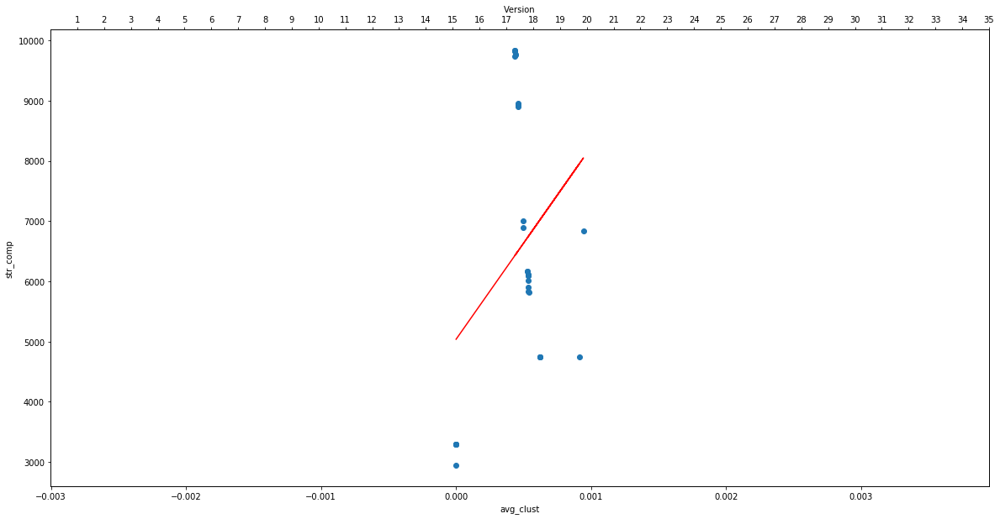

____________________________________________________________
files : ['D:/mm_thesis/D_graph/all_metrics/Ivy/ivy-metrics.csv', 'D:/mm_thesis/D_graph/all_metrics/Ivy/Ivy_Call_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Ivy/ivy_cdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Ivy/ivy_colldot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Ivy/Ivy_Coll_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Ivy/Ivy_heat_s_call_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Ivy/Ivy_heat_s_collab_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Ivy/Ivy_heat_s_Inh_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Ivy/ivy_Inhdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Ivy/Ivy_Inh_mat.csv']
_________________
s_path    ; ['D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/']
19
Colunm Name :  squares
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_class_connnInh_mm.png


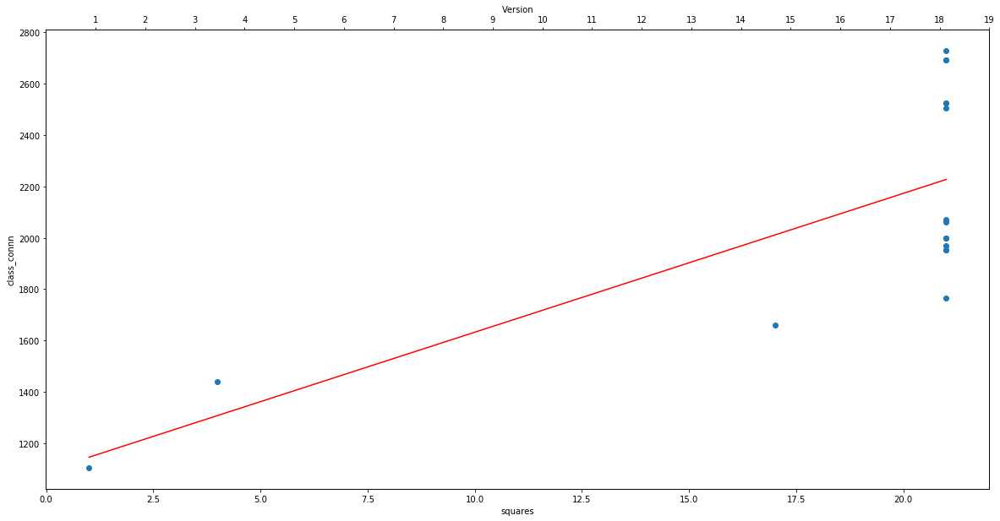

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_avg_cyclomaticInh_mm.png


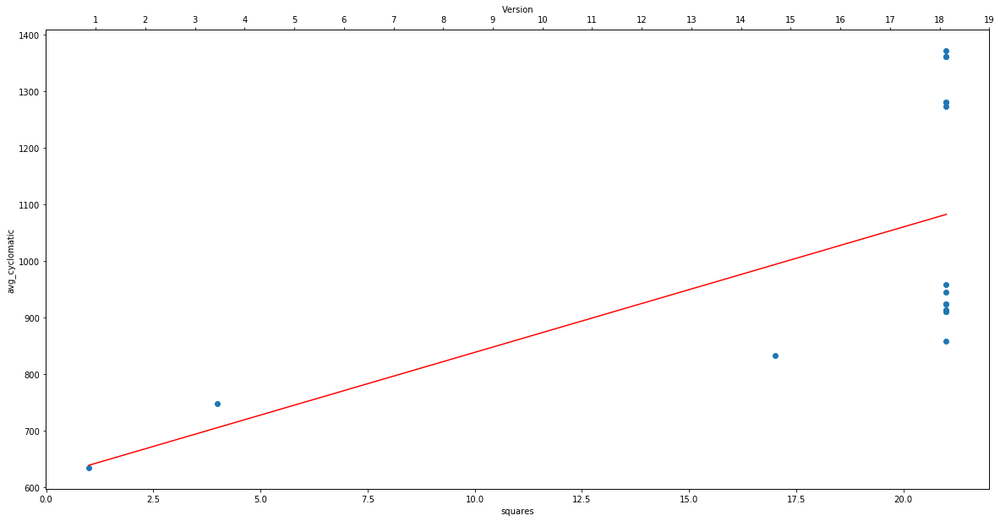

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_cboInh_mm.png


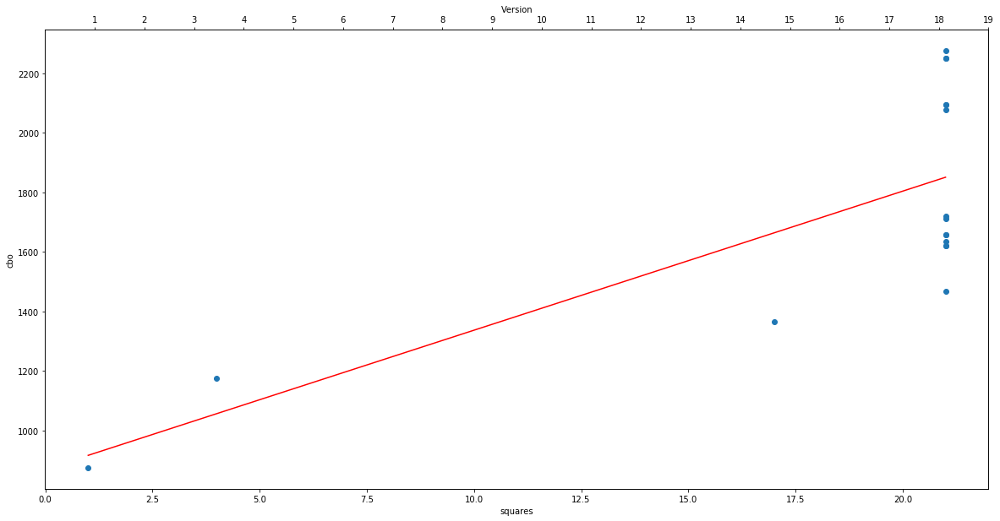

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_ditInh_mm.png


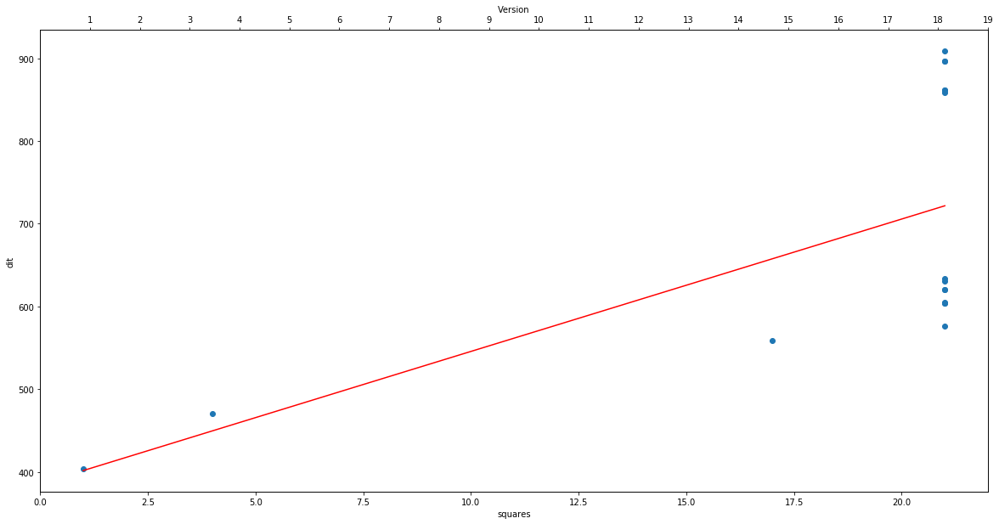

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_lcomInh_mm.png


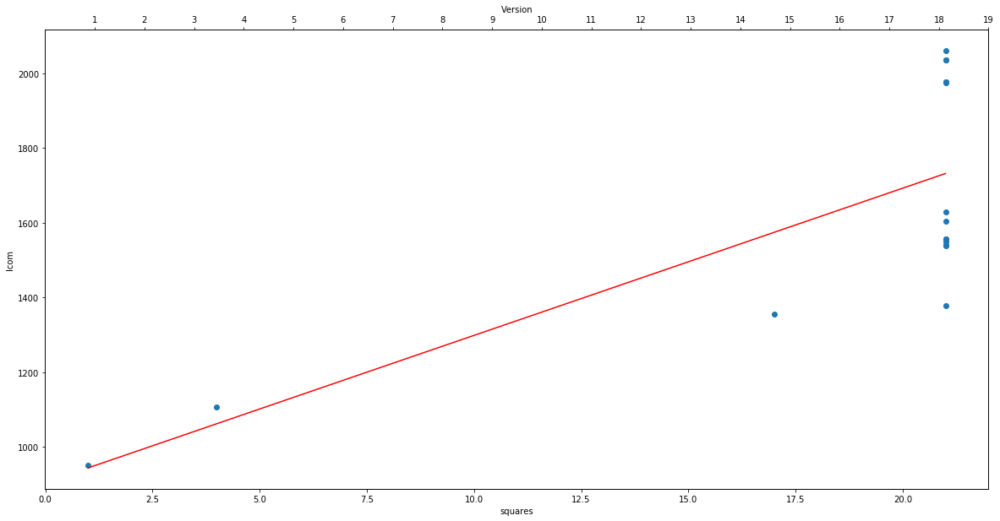

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_childrenInh_mm.png


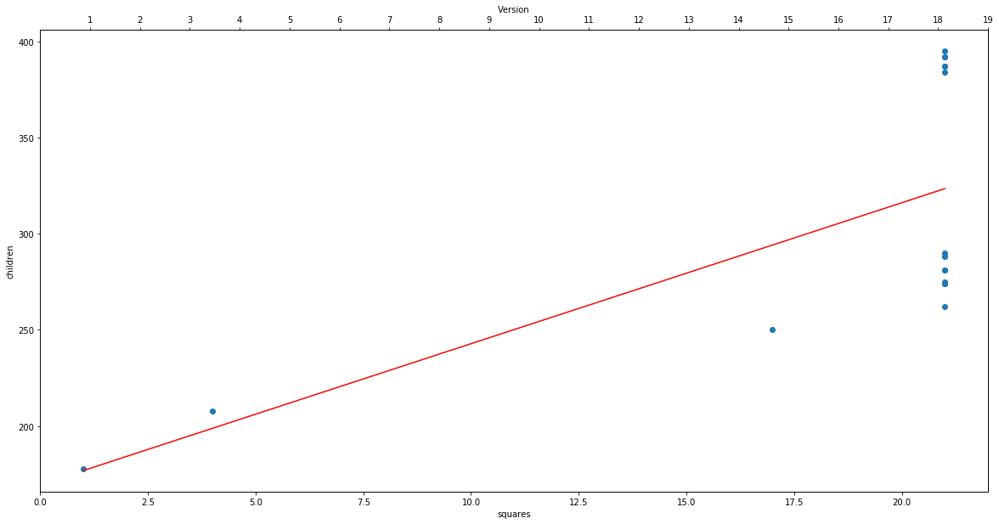

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_response_classInh_mm.png


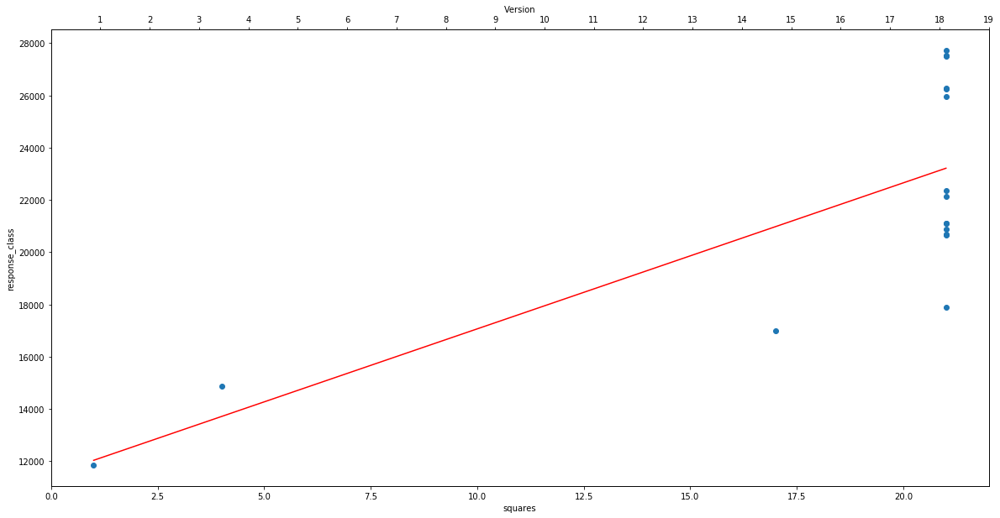

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/squares_str_compInh_mm.png


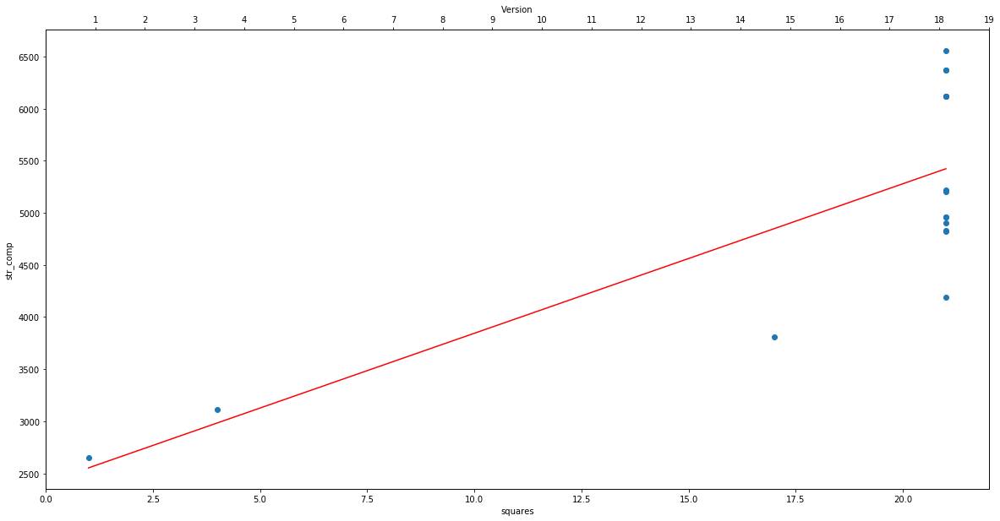

Colunm Name :  P-gamma
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_class_connnInh_mm.png


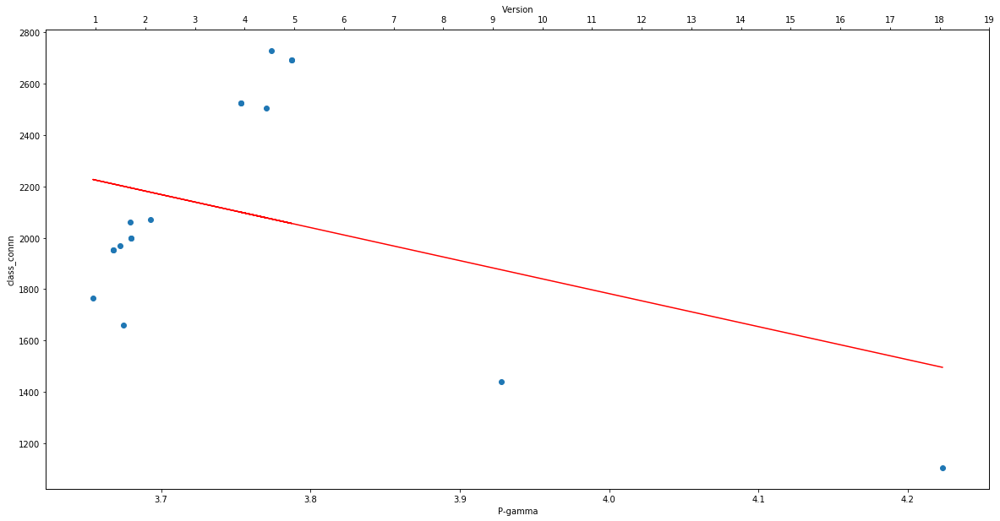

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_avg_cyclomaticInh_mm.png


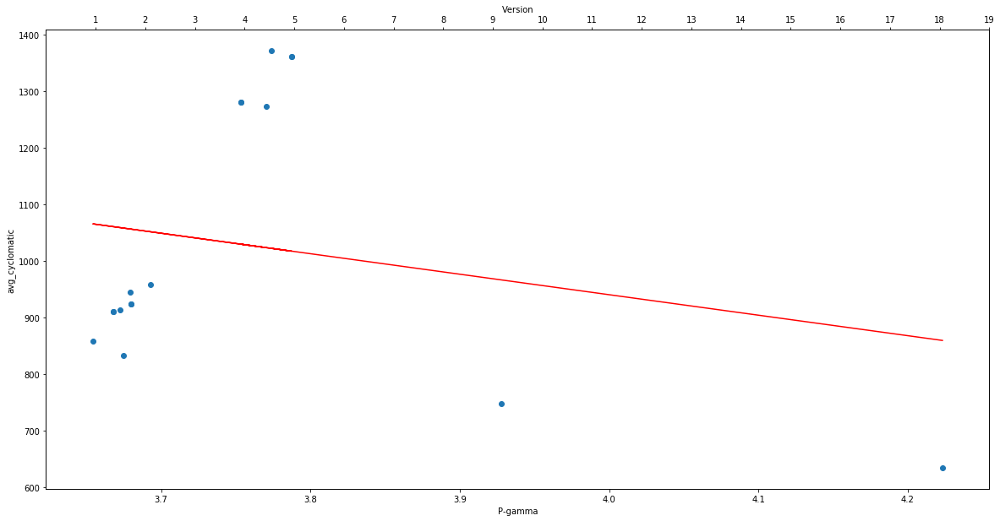

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_cboInh_mm.png


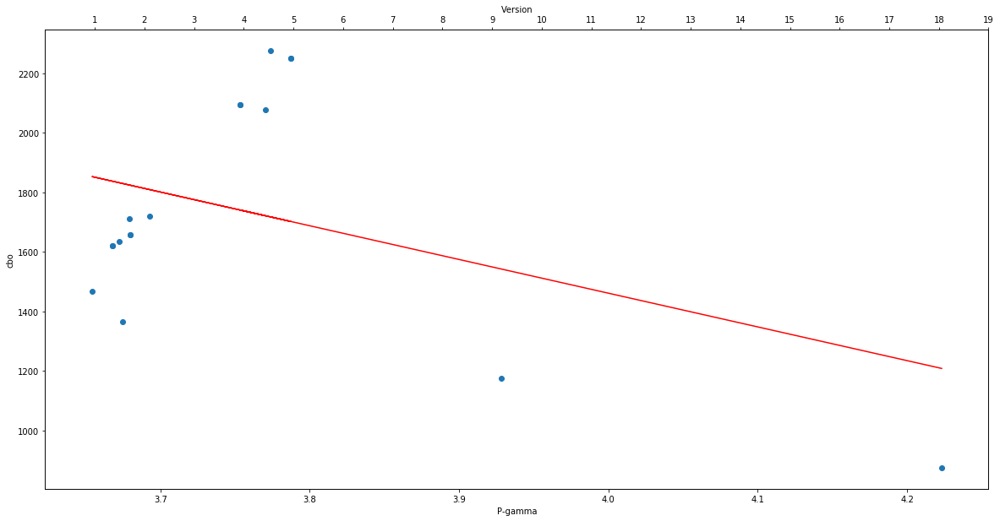

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_ditInh_mm.png


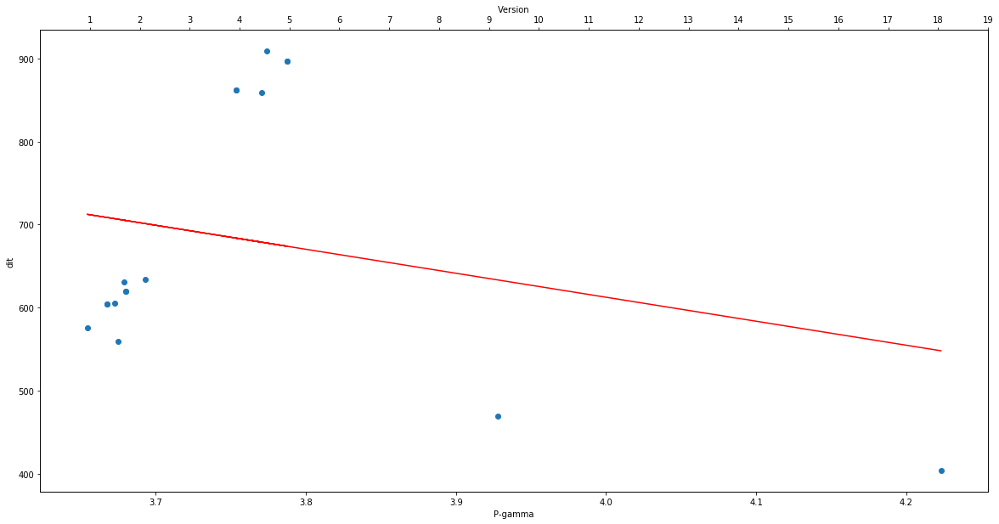

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_lcomInh_mm.png


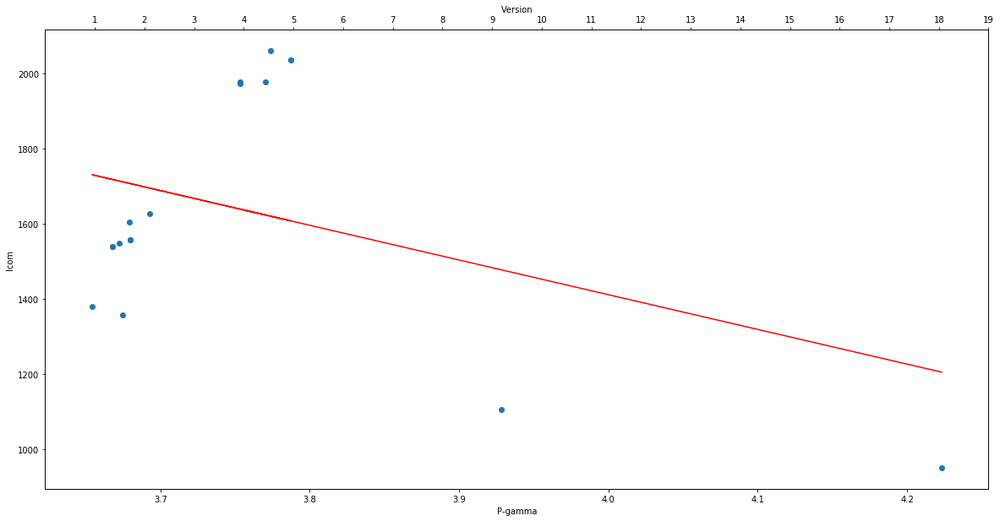

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_childrenInh_mm.png


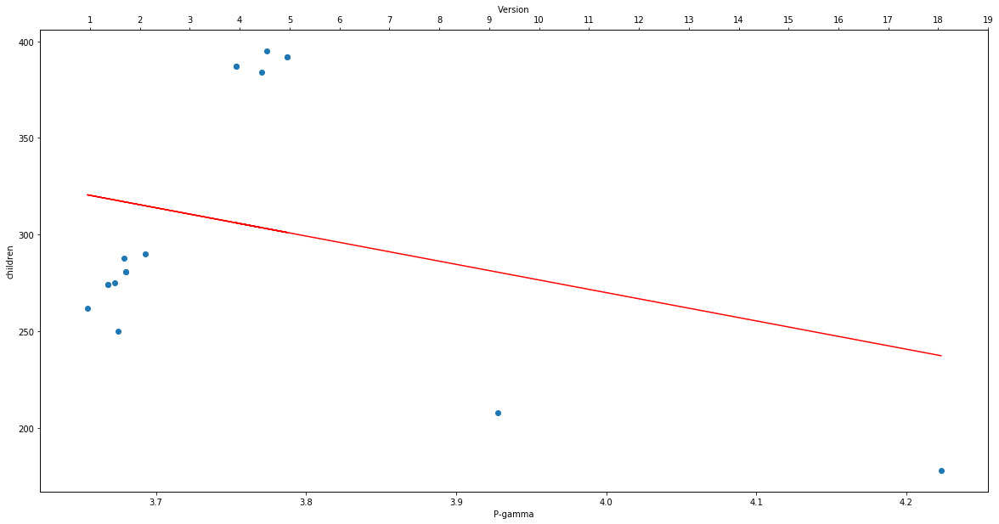

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_response_classInh_mm.png


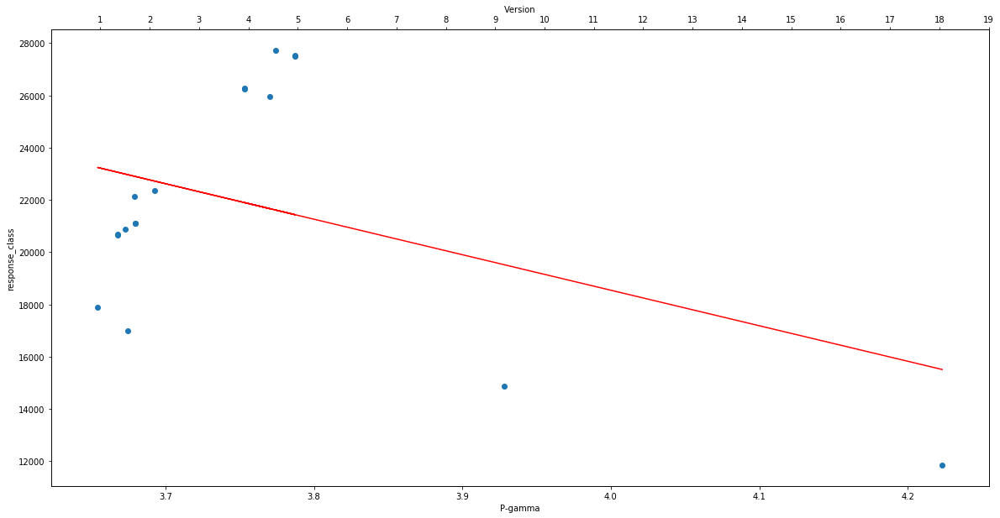

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/P-gamma_str_compInh_mm.png


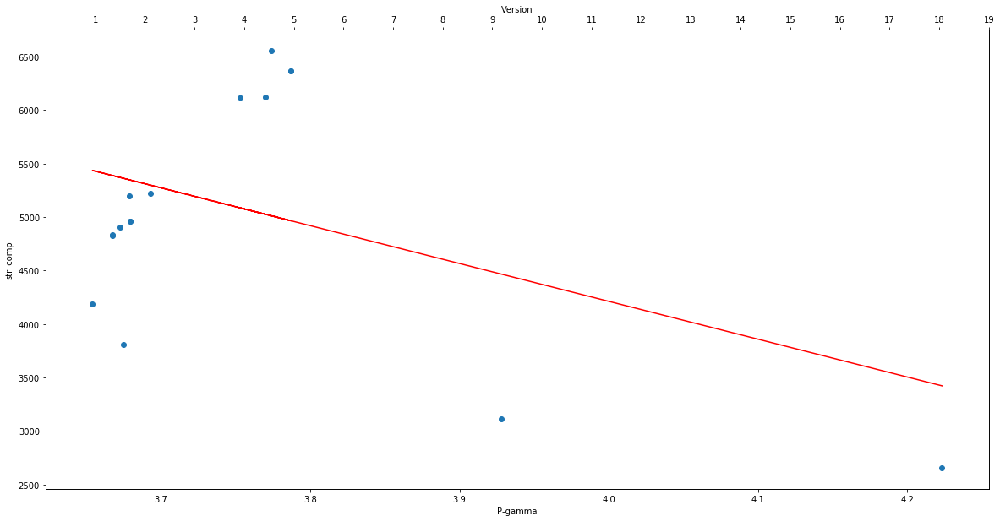

Colunm Name :  avg_degree
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_class_connnInh_mm.png


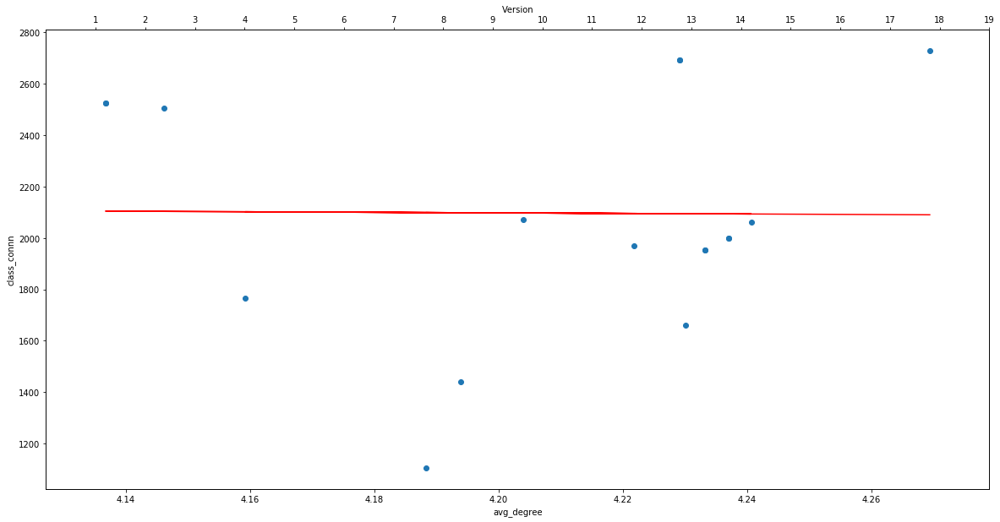

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_avg_cyclomaticInh_mm.png


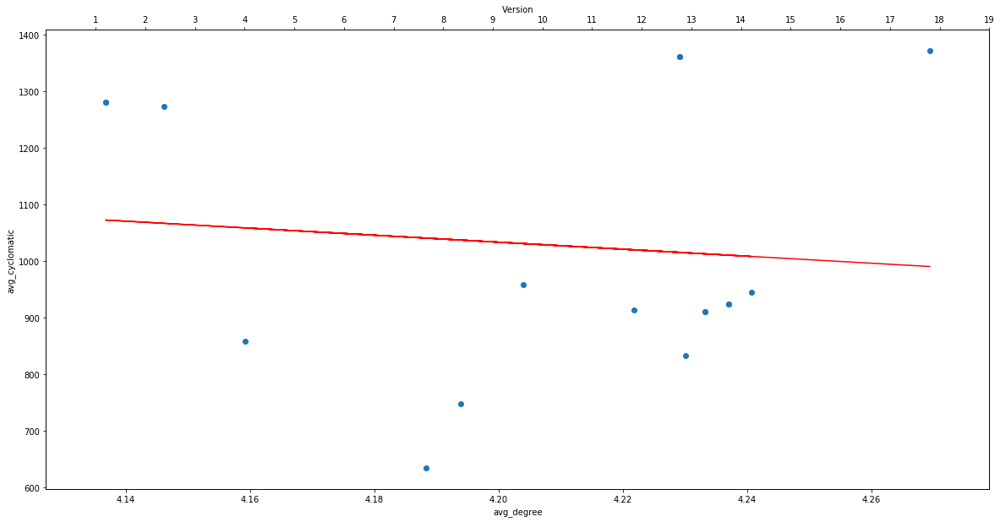

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_cboInh_mm.png


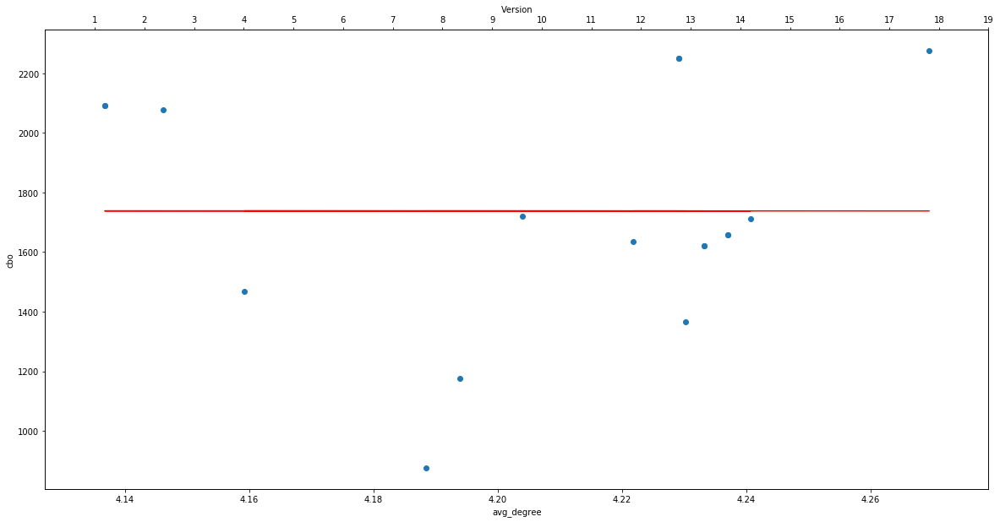

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_ditInh_mm.png


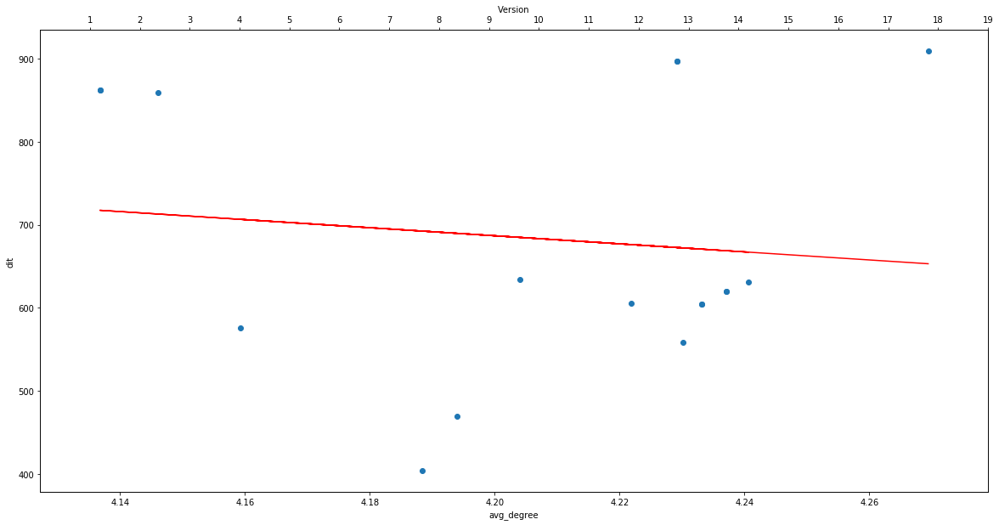

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_lcomInh_mm.png


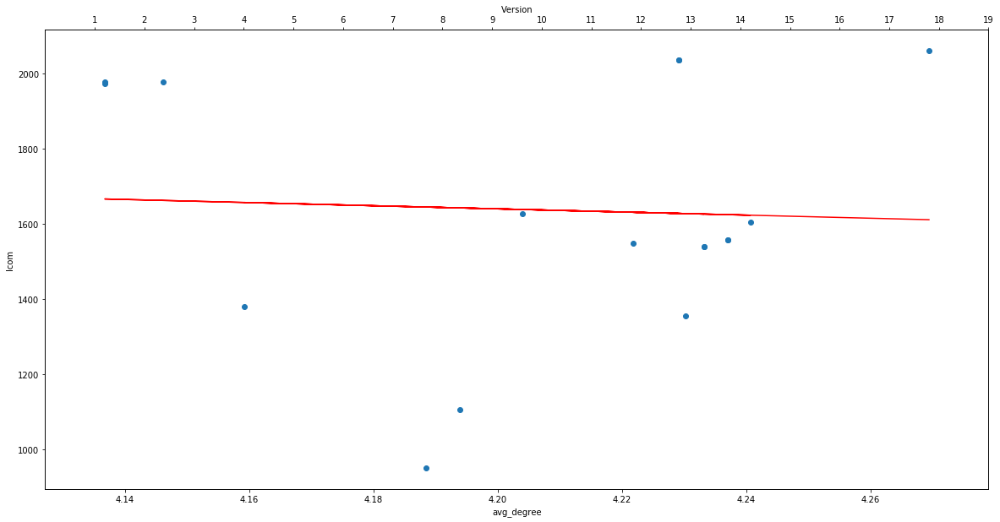

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_childrenInh_mm.png


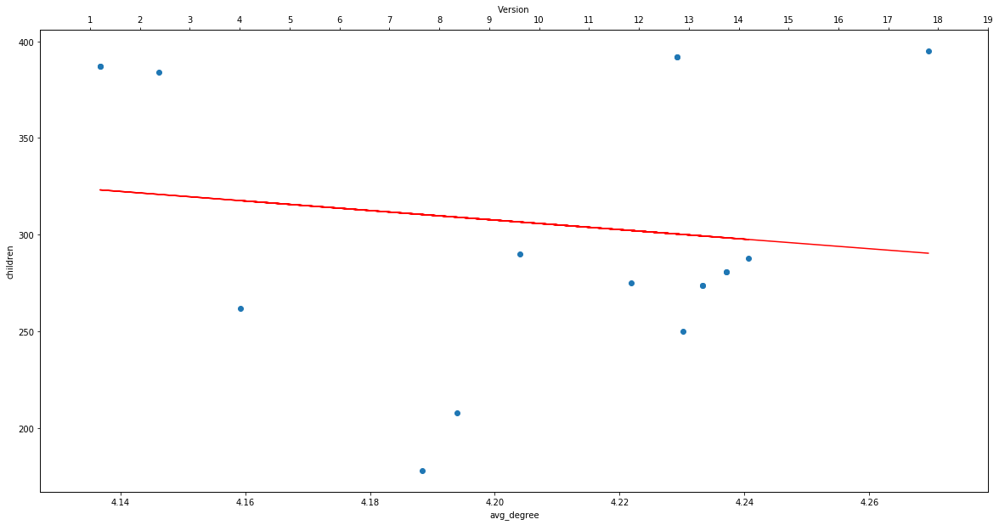

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_response_classInh_mm.png


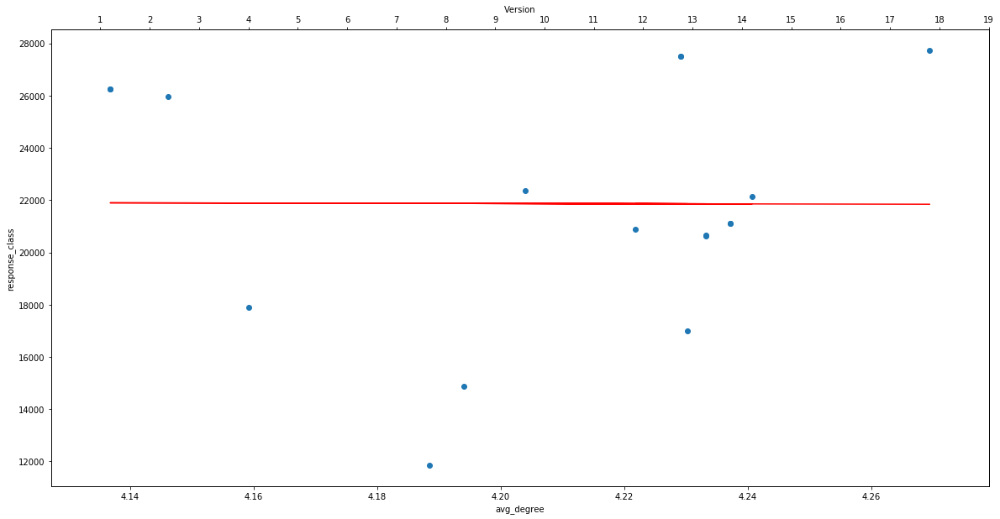

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_degree_str_compInh_mm.png


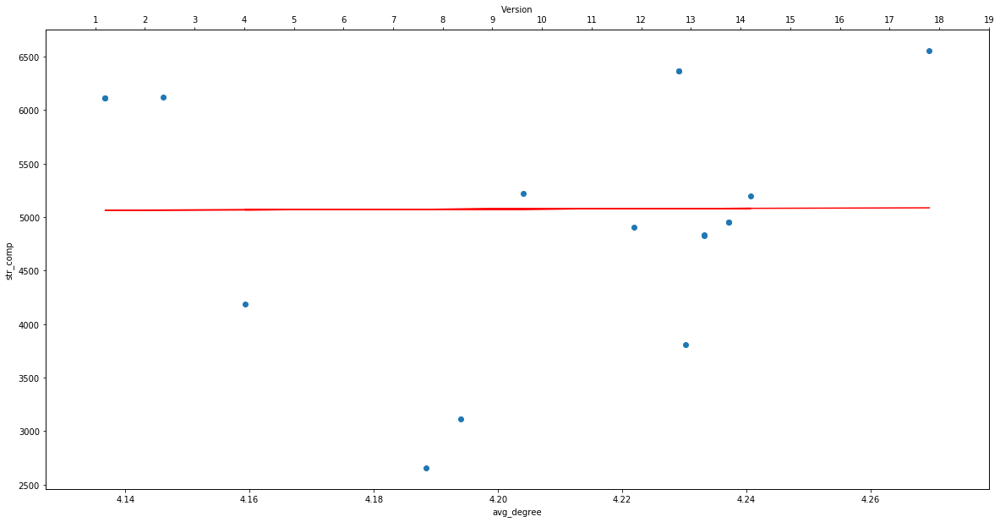

Colunm Name :  no_comm
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_class_connnInh_mm.png


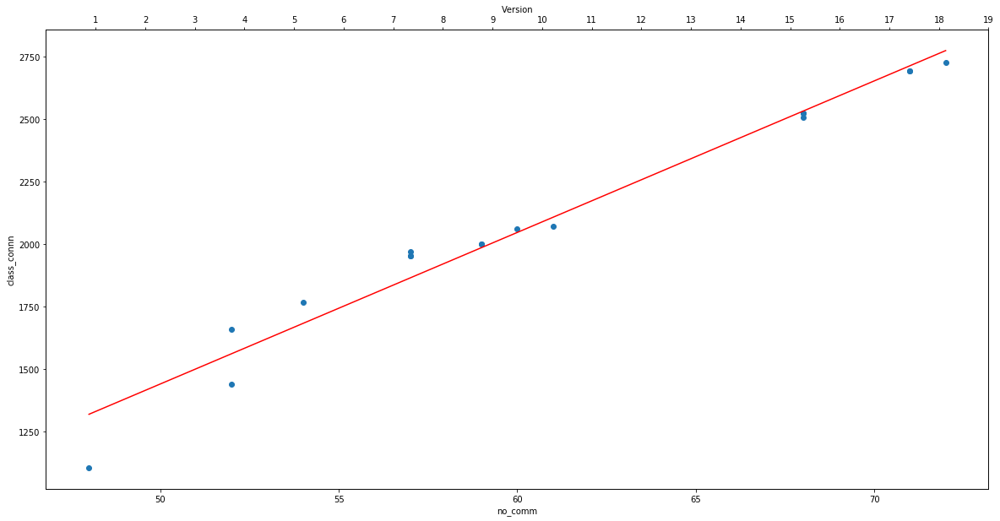

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_avg_cyclomaticInh_mm.png


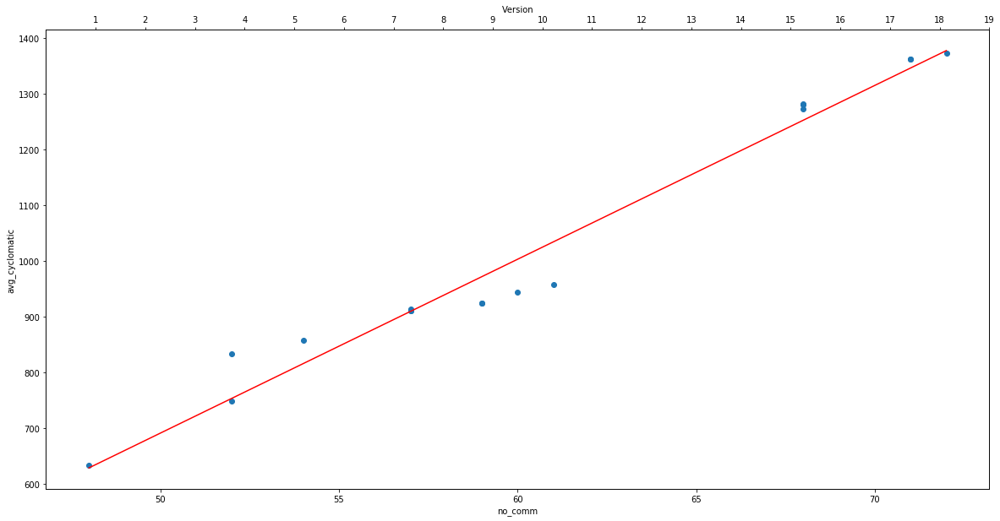

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_cboInh_mm.png


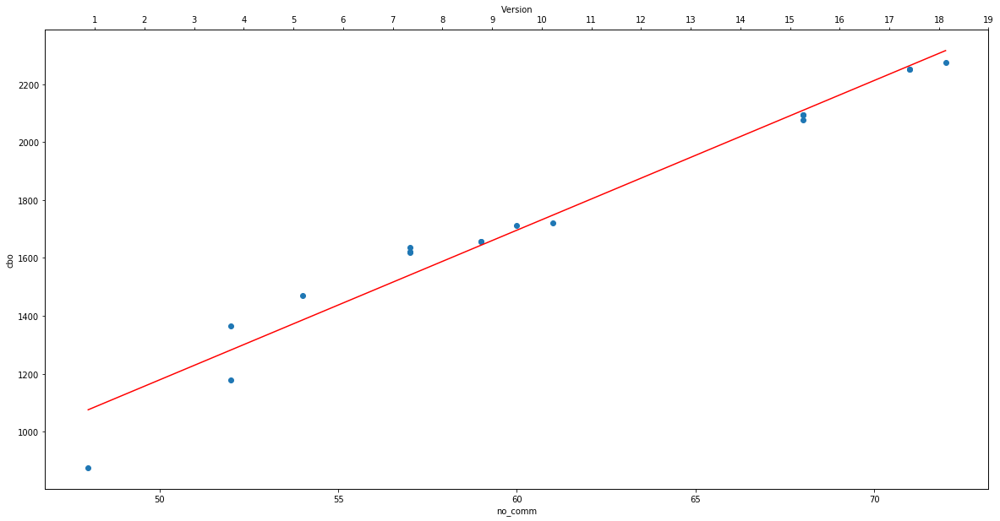

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_ditInh_mm.png


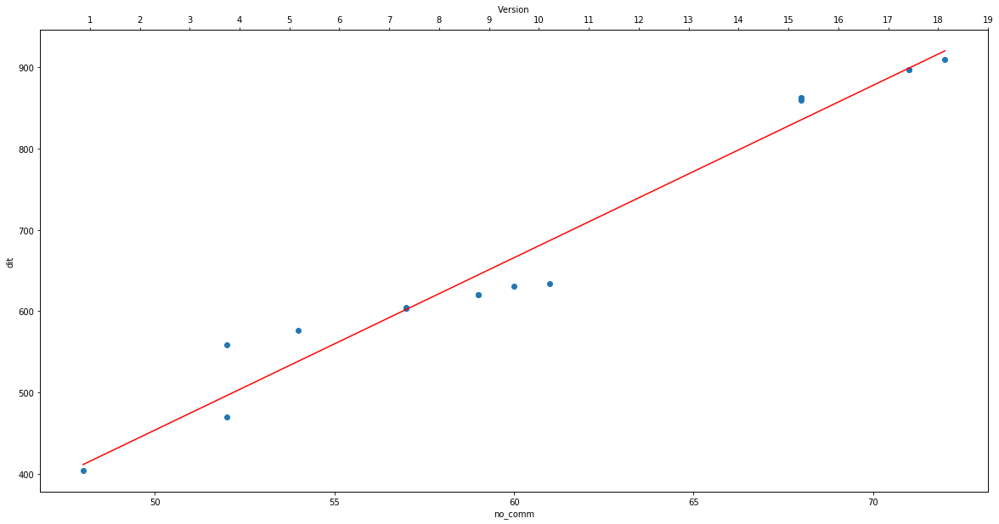

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_lcomInh_mm.png


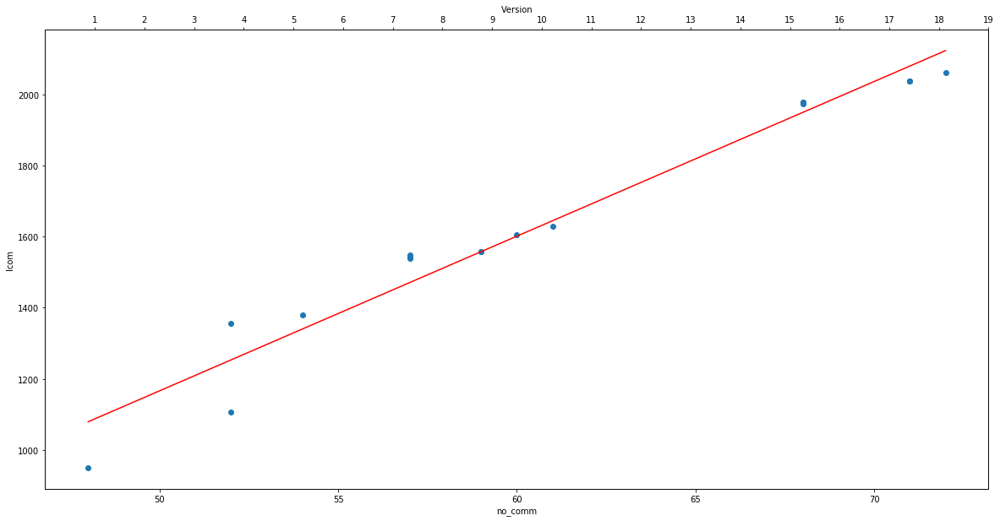

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_childrenInh_mm.png


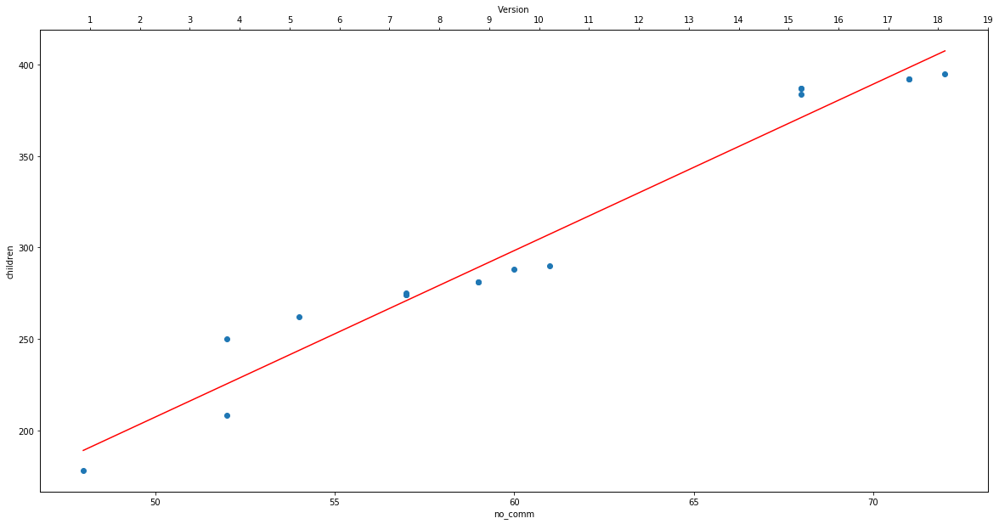

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_response_classInh_mm.png


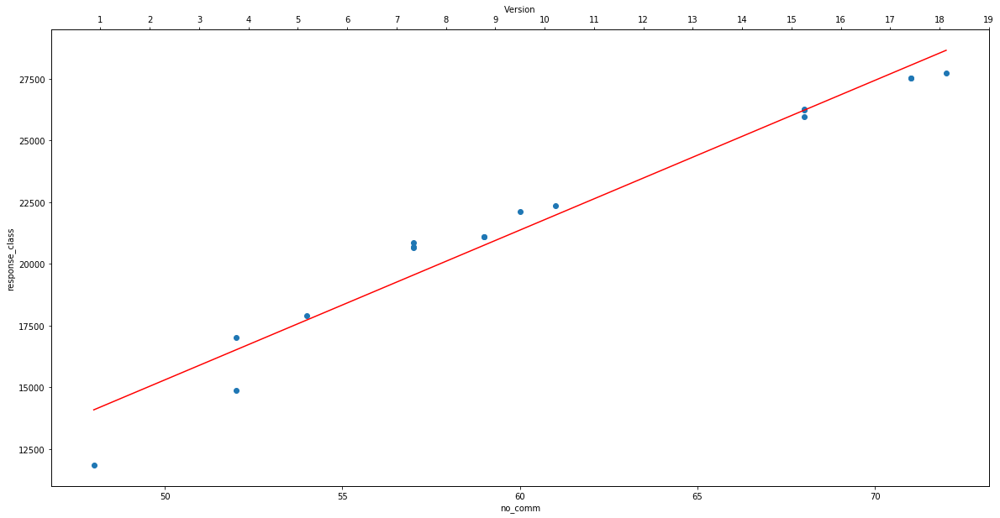

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/no_comm_str_compInh_mm.png


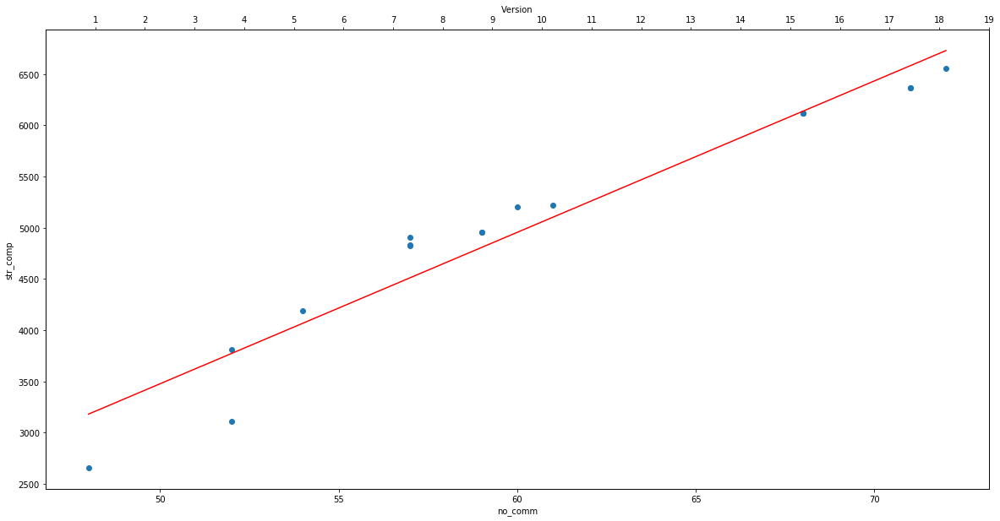

Colunm Name :  avg_shortest_path
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_class_connnInh_mm.png


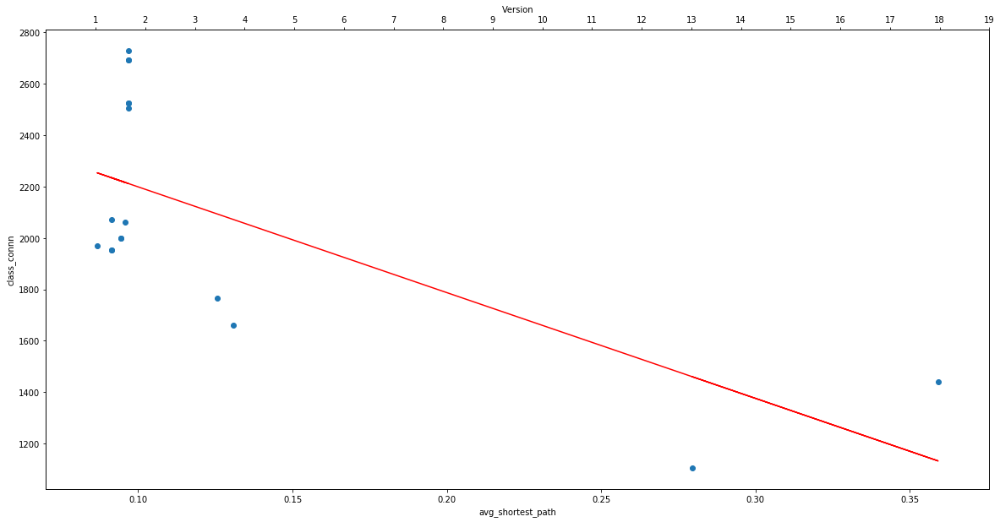

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_avg_cyclomaticInh_mm.png


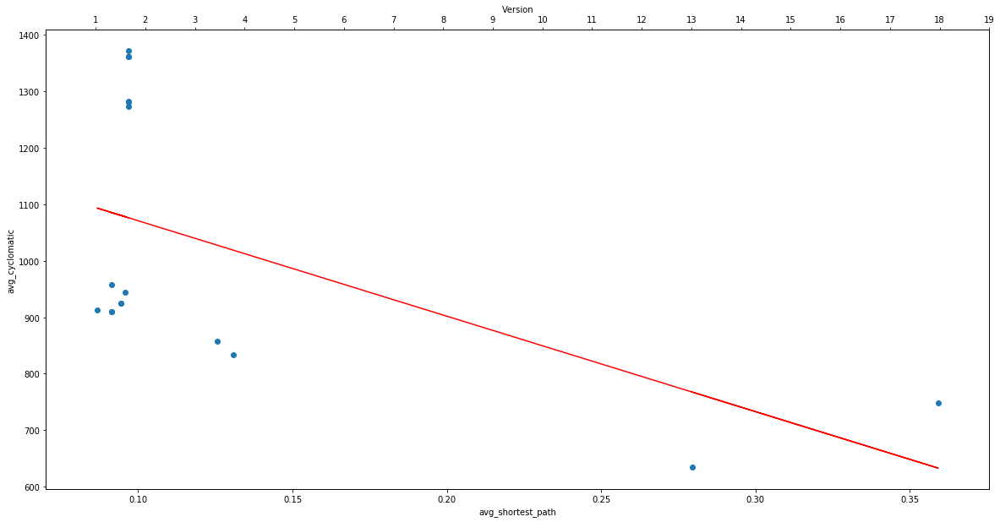

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_cboInh_mm.png


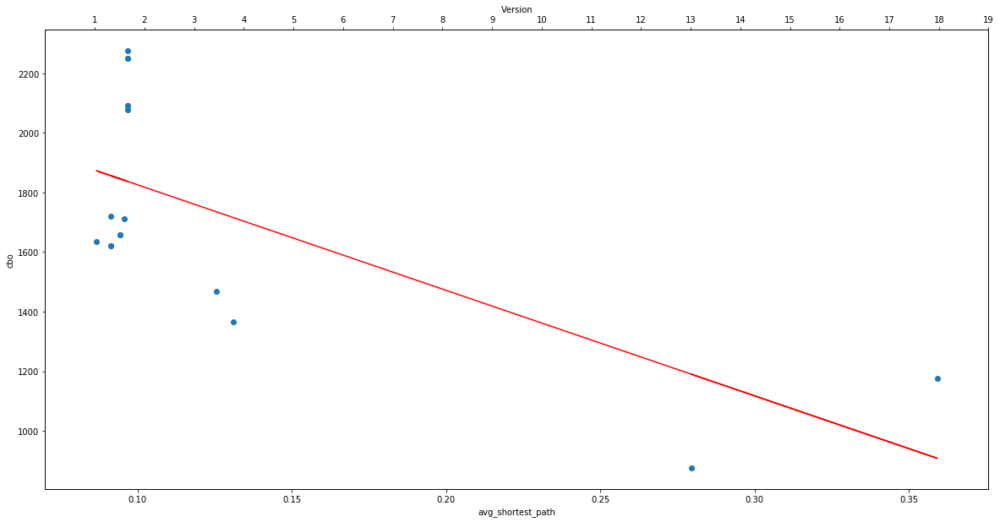

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_ditInh_mm.png


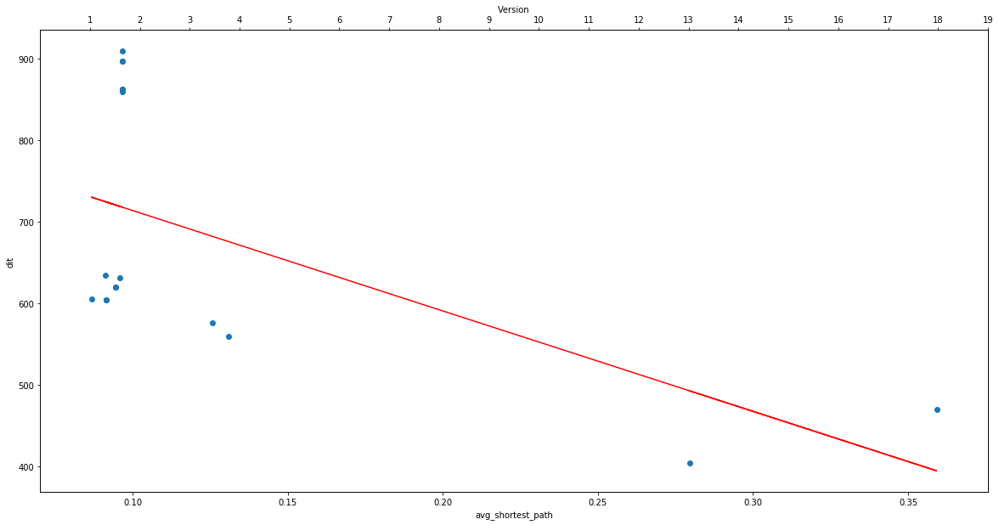

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_lcomInh_mm.png


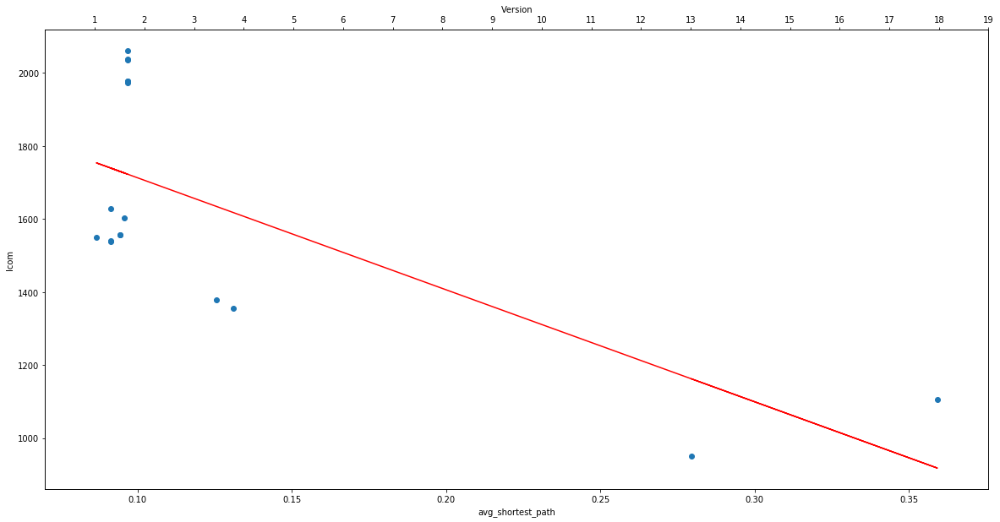

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_childrenInh_mm.png


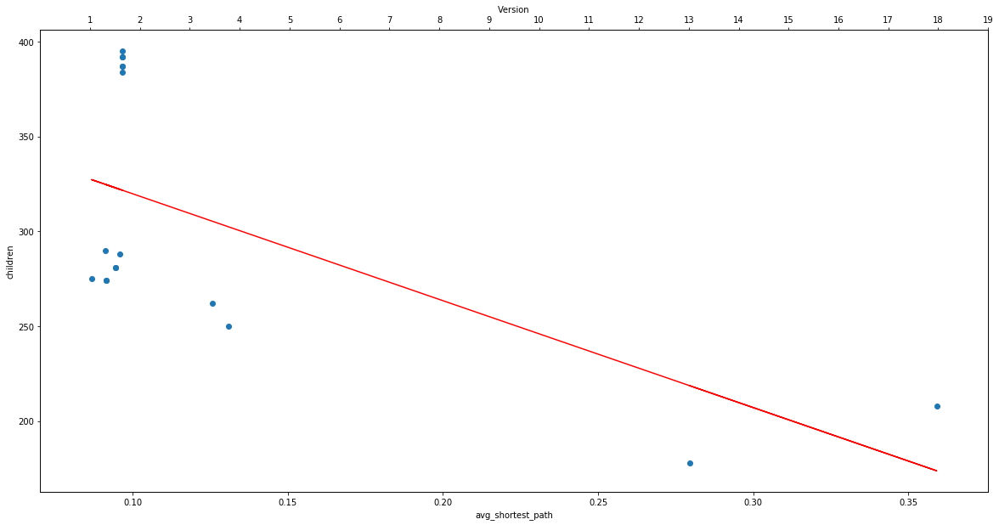

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_response_classInh_mm.png


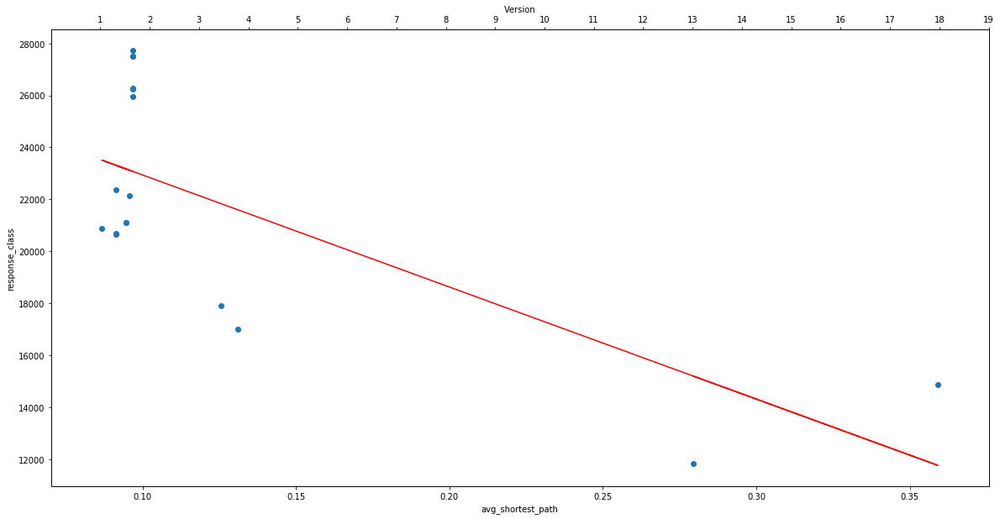

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_shortest_path_str_compInh_mm.png


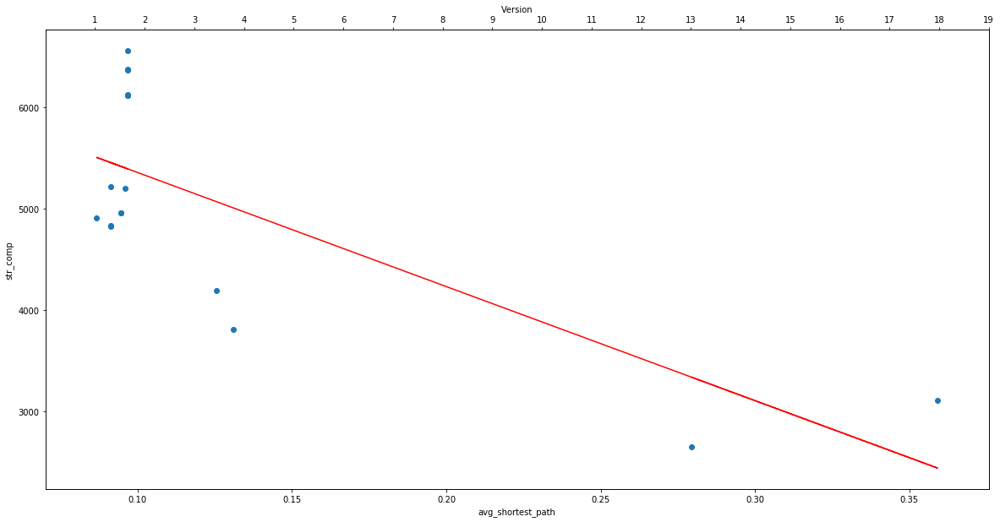

Colunm Name :  sub_density
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_class_connnInh_mm.png


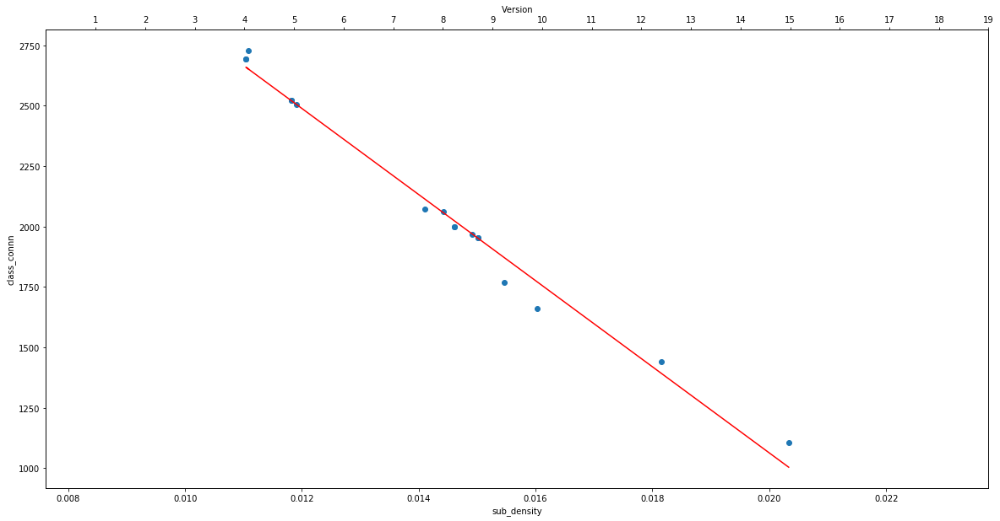

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_avg_cyclomaticInh_mm.png


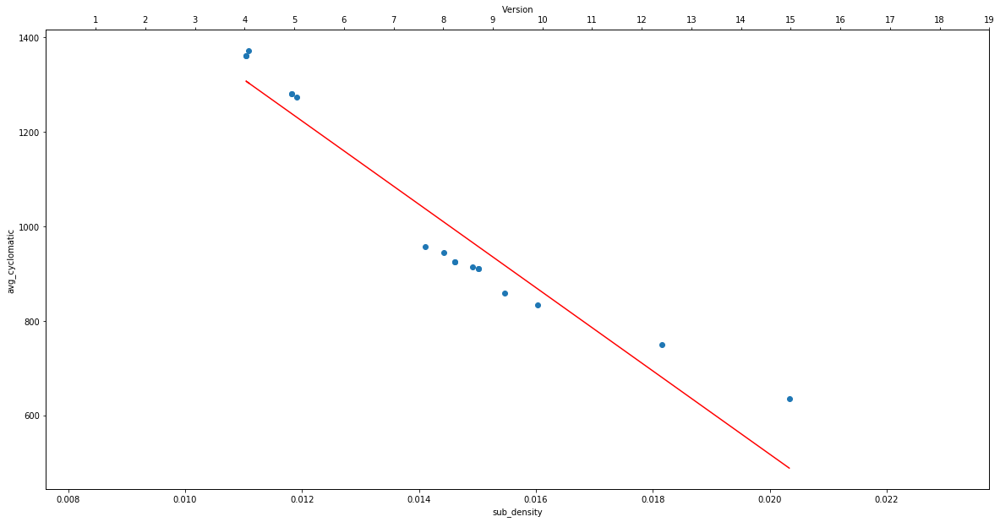

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_cboInh_mm.png


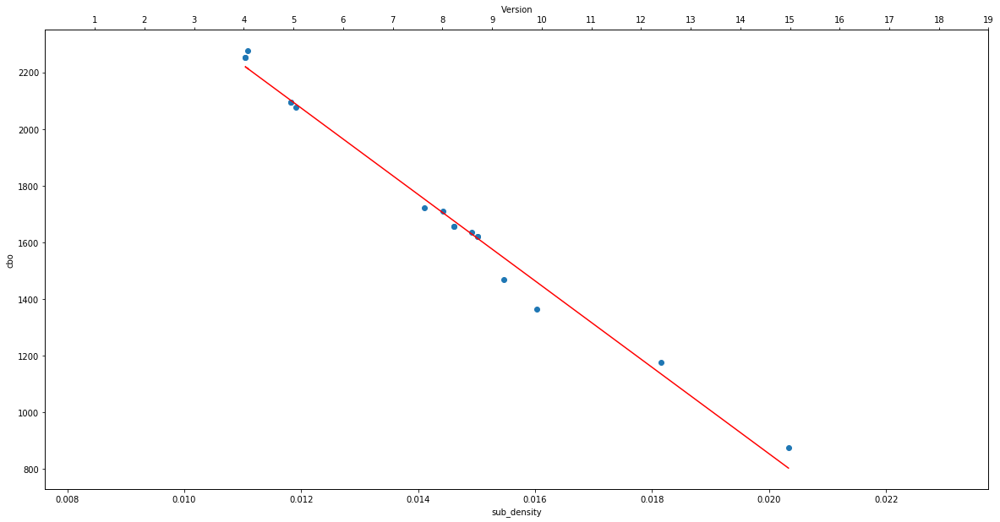

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_ditInh_mm.png


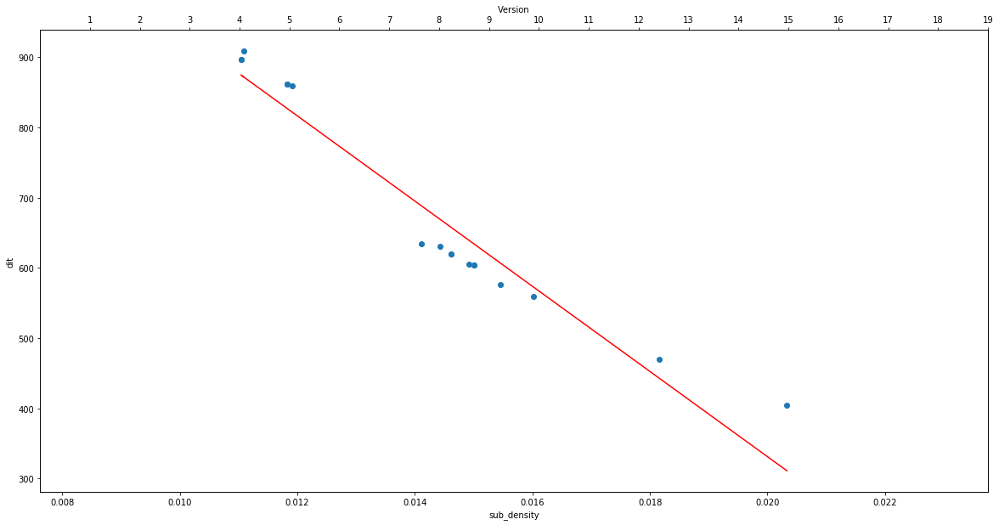

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_lcomInh_mm.png


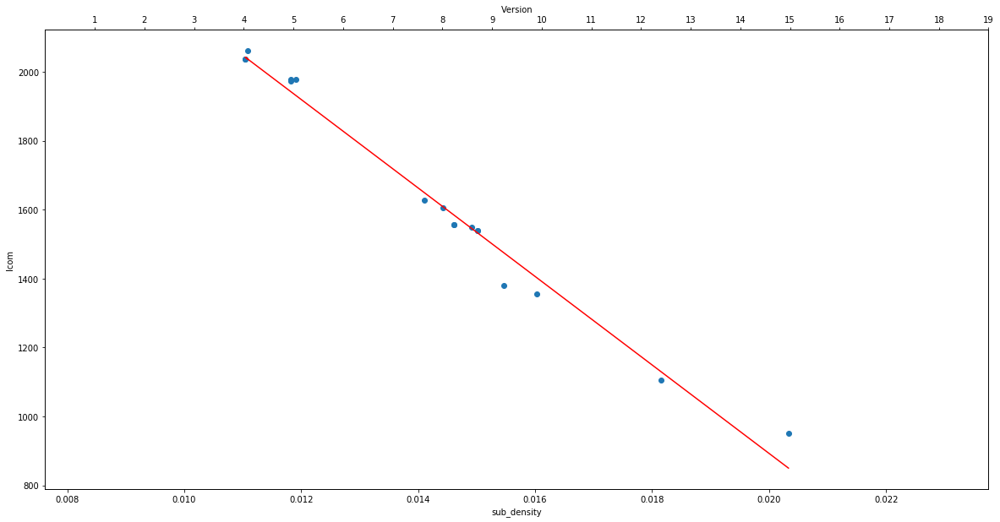

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_childrenInh_mm.png


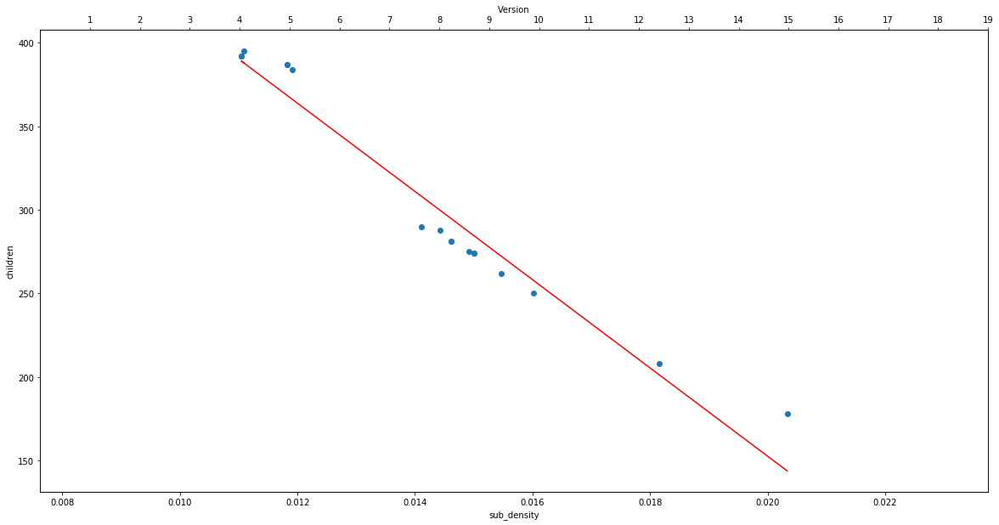

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_response_classInh_mm.png


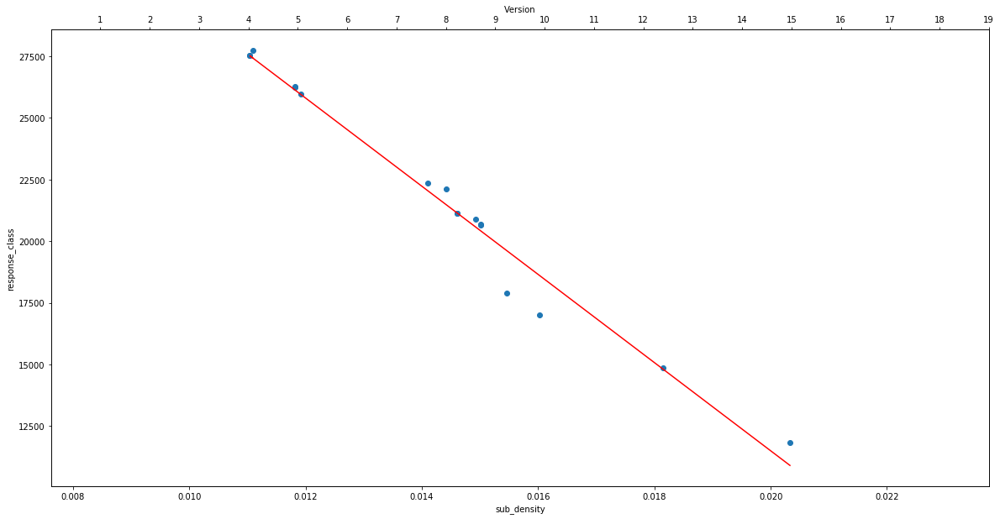

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/sub_density_str_compInh_mm.png


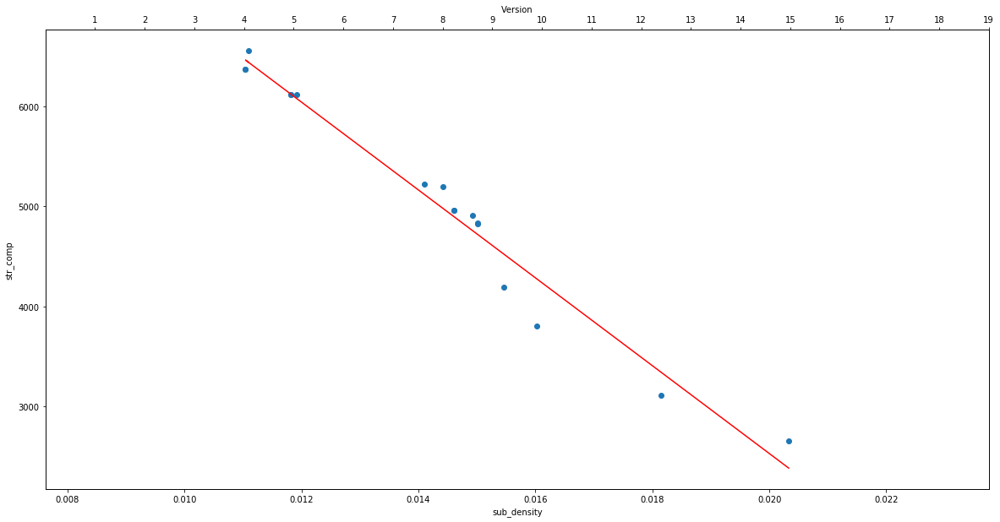

Colunm Name :  avg_clust
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_class_connnInh_mm.png


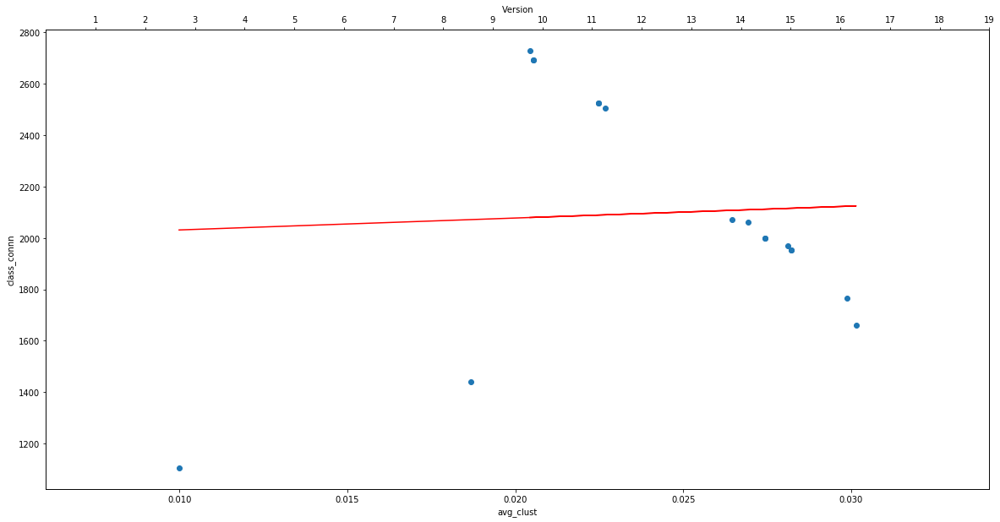

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_avg_cyclomaticInh_mm.png


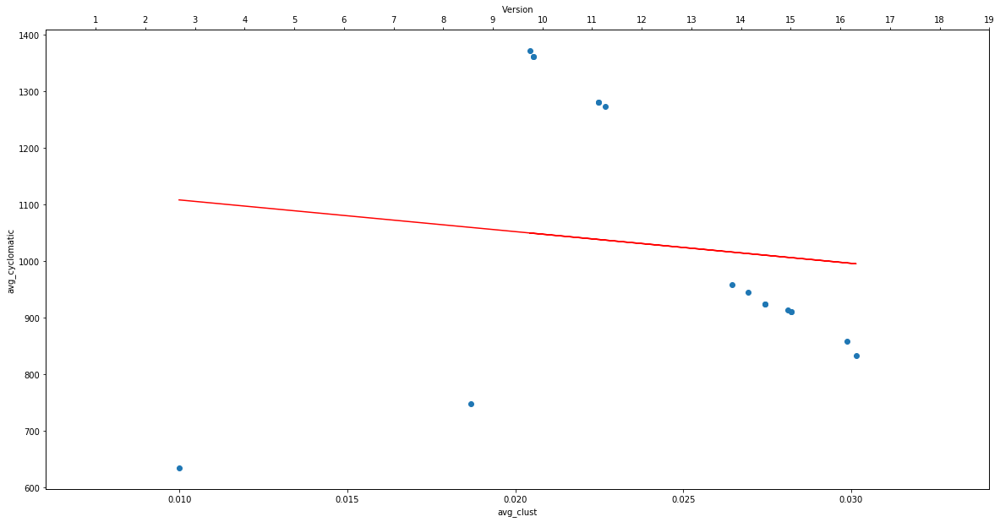

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_cboInh_mm.png


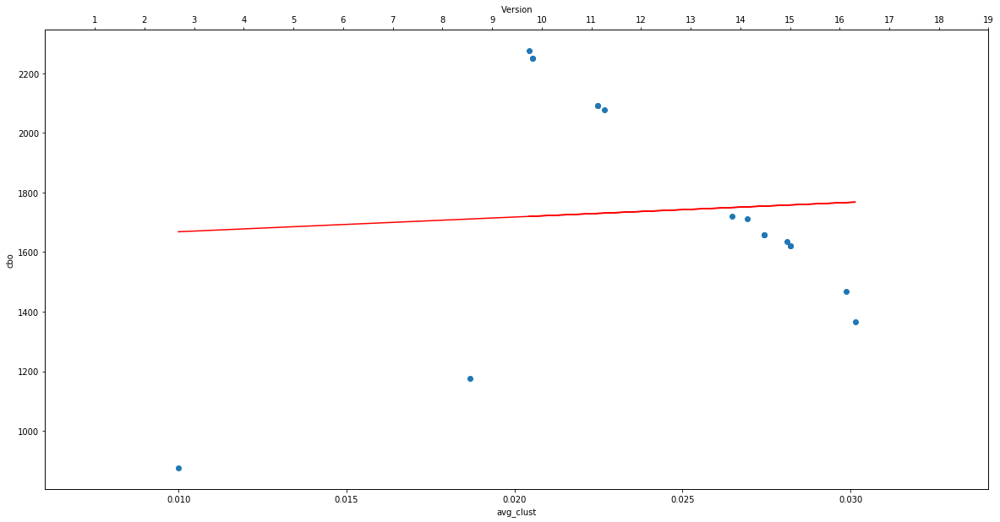

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_ditInh_mm.png


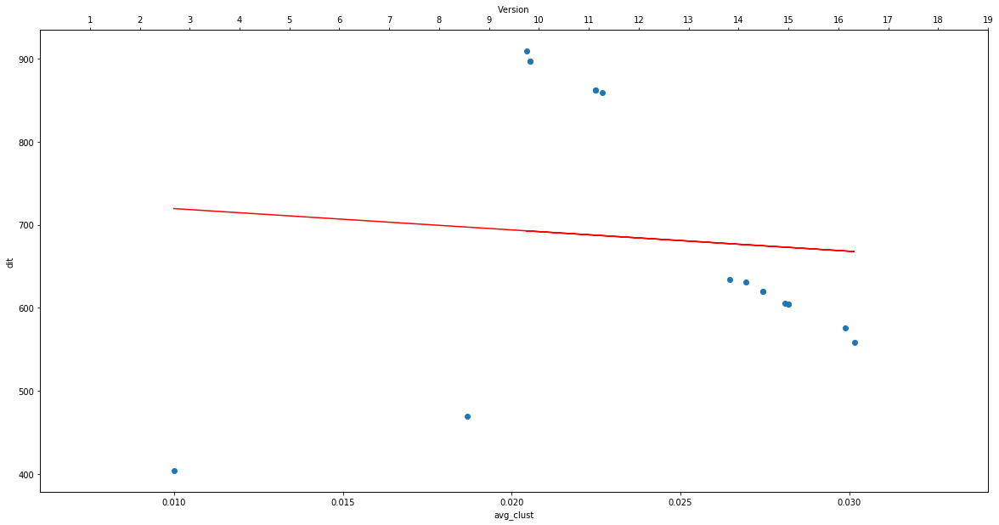

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_lcomInh_mm.png


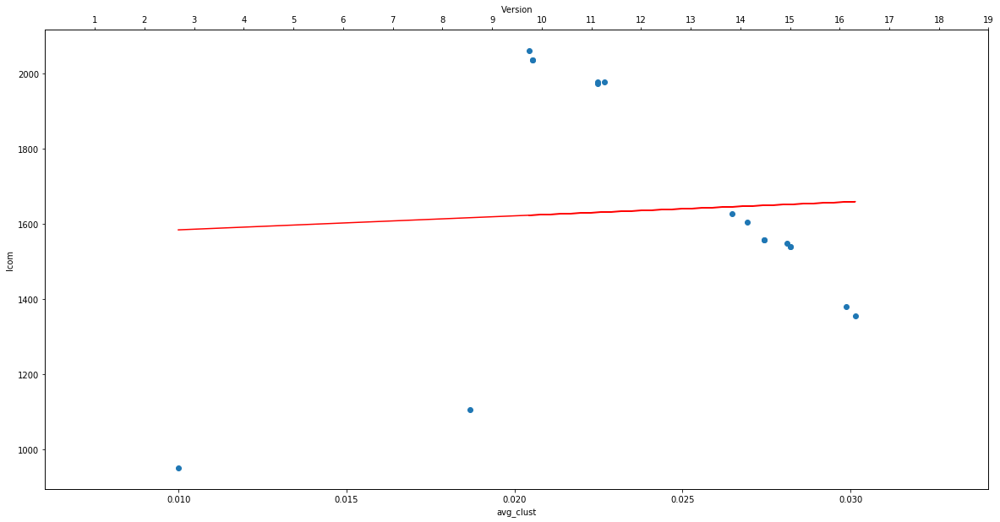

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_childrenInh_mm.png


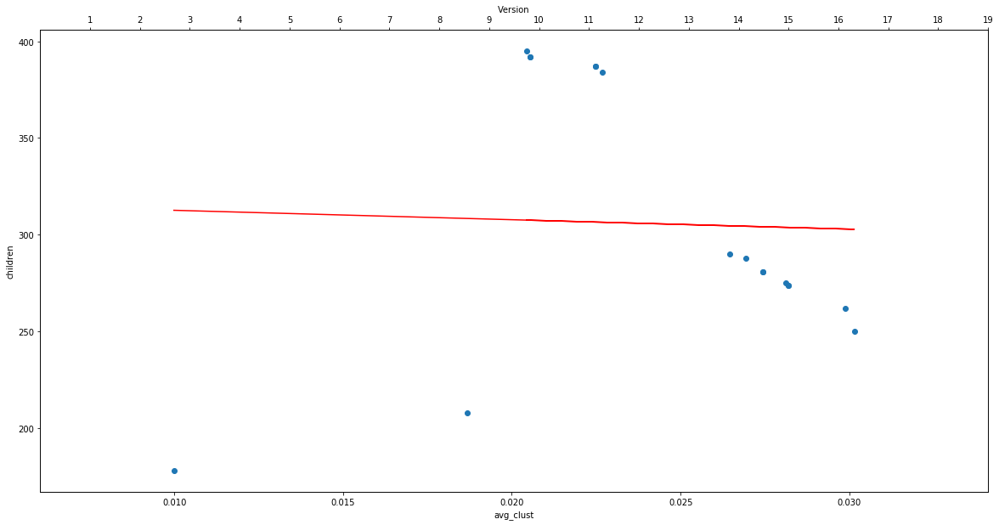

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_response_classInh_mm.png


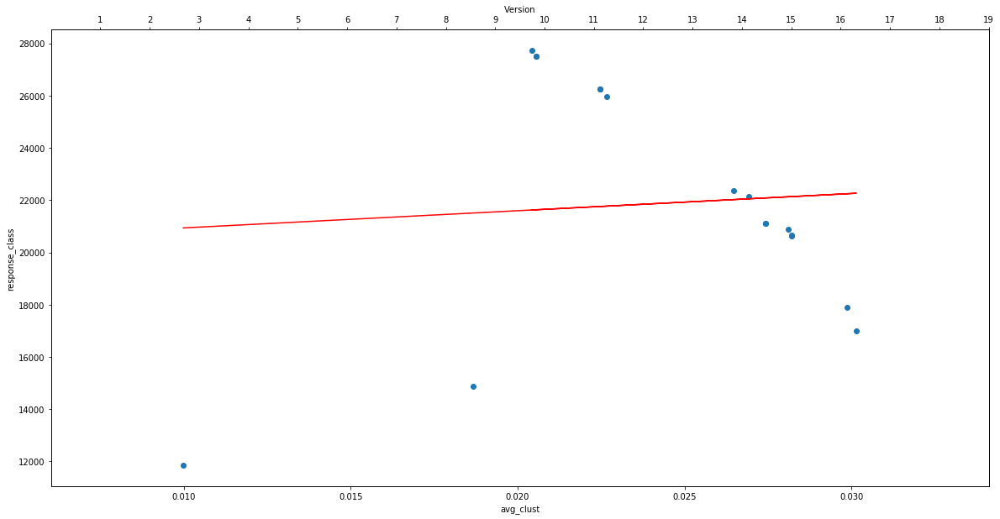

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Ivy/scatter_plots/avg_clust_str_compInh_mm.png


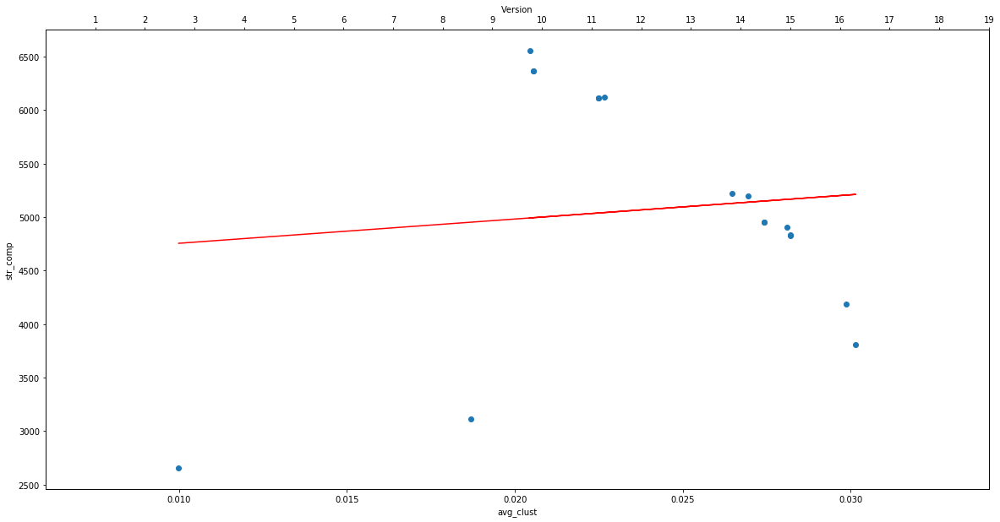

____________________________________________________________
files : ['D:/mm_thesis/D_graph/all_metrics/Jena/Jena_Call_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Jena/jena_cdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Jena/jena_colldot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Jena/Jena_Coll_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Jena/Jena_heat_s_call_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Jena/Jena_heat_s_collab_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Jena/Jena_heat_s_Inh_fixed.png', 'D:/mm_thesis/D_graph/all_metrics/Jena/jena_Inhdot_m.csv', 'D:/mm_thesis/D_graph/all_metrics/Jena/Jena_Inh_mat.csv', 'D:/mm_thesis/D_graph/all_metrics/Jena/jena_metrics.csv']
_________________
s_path    ; ['D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/']
8
Colunm Name :  squares
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_class_connnInh_mm.png


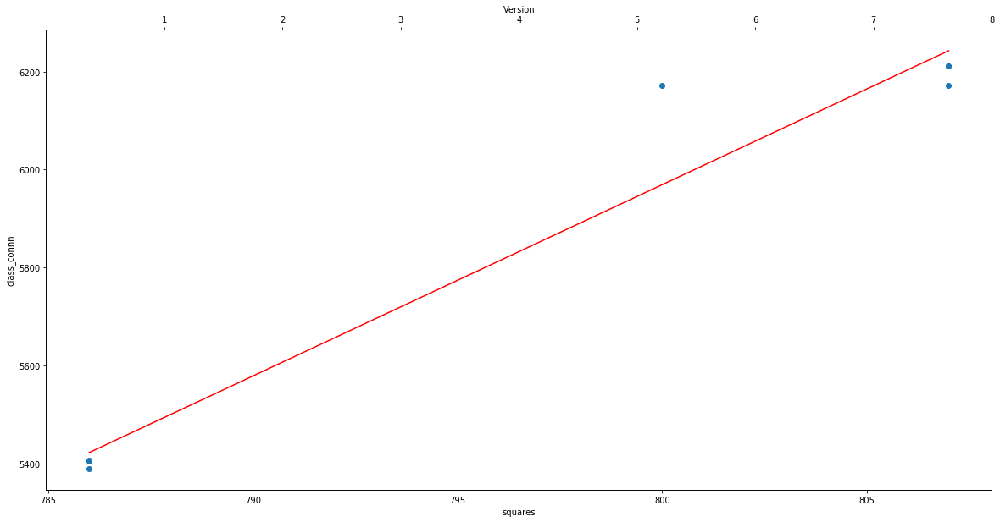

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_avg_cyclomaticInh_mm.png


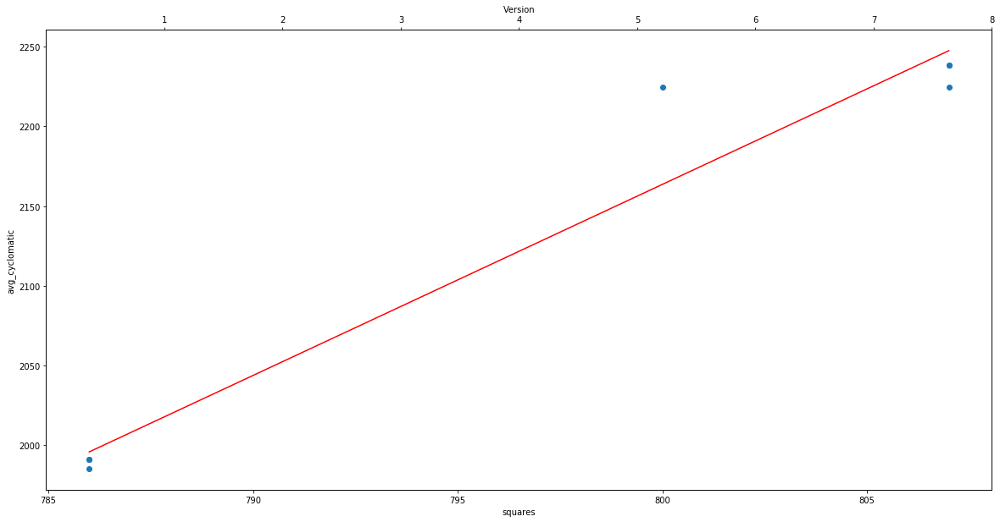

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_cboInh_mm.png


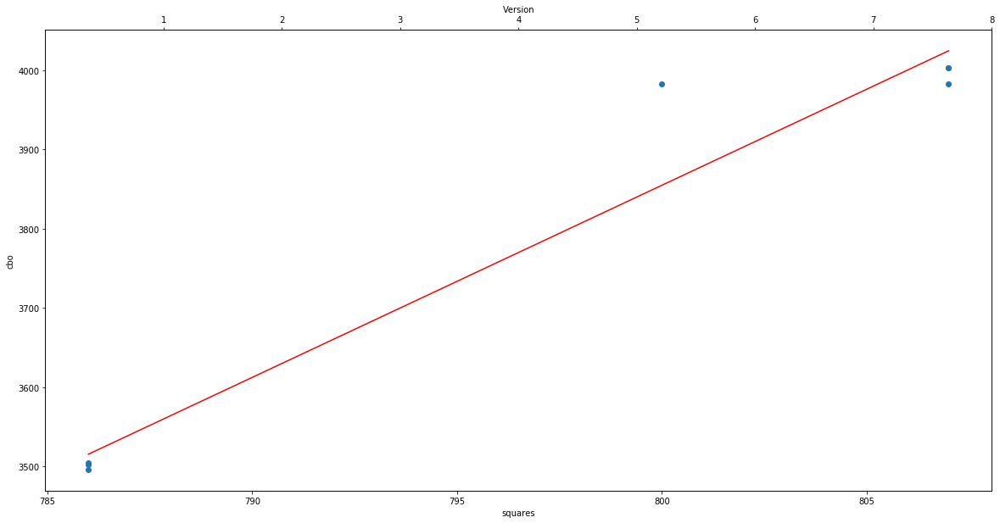

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_ditInh_mm.png


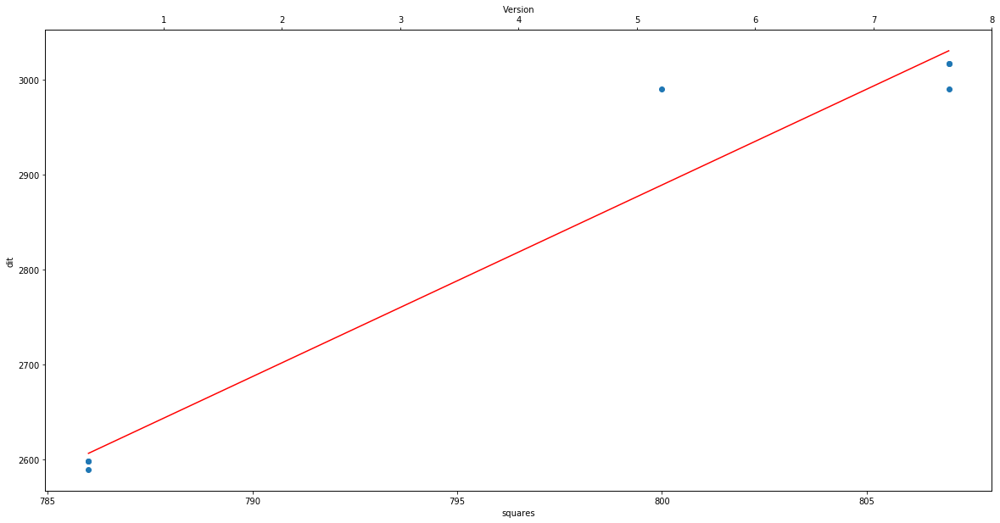

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_lcomInh_mm.png


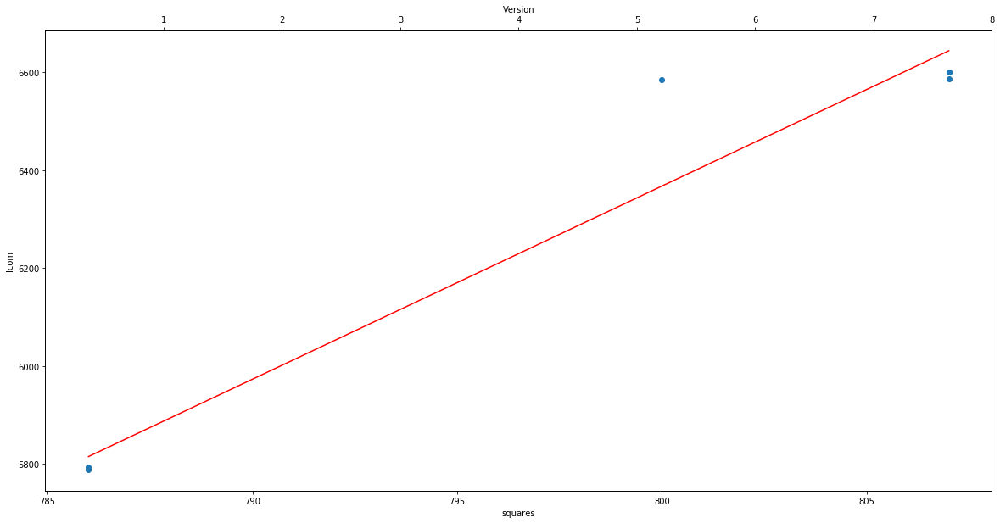

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_childrenInh_mm.png


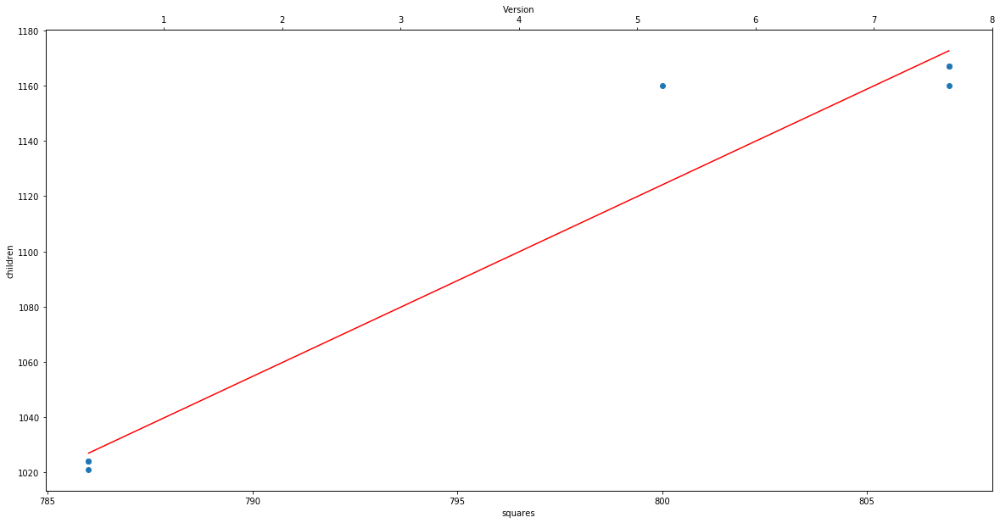

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_response_classInh_mm.png


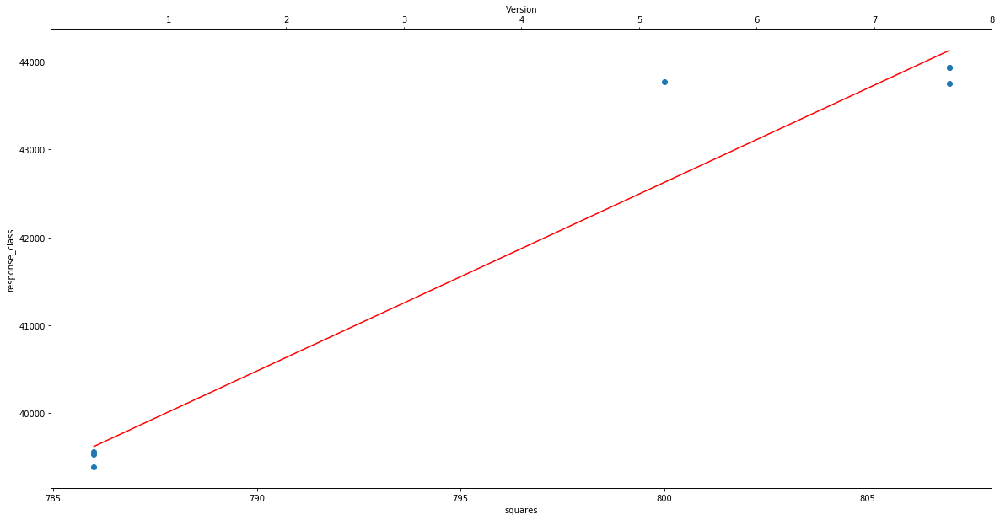

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/squares_str_compInh_mm.png


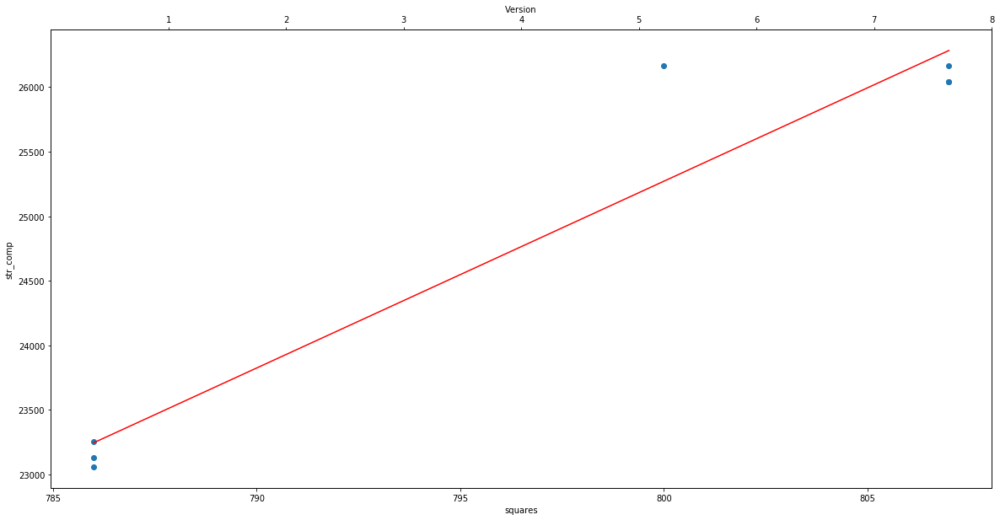

Colunm Name :  P-gamma
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_class_connnInh_mm.png


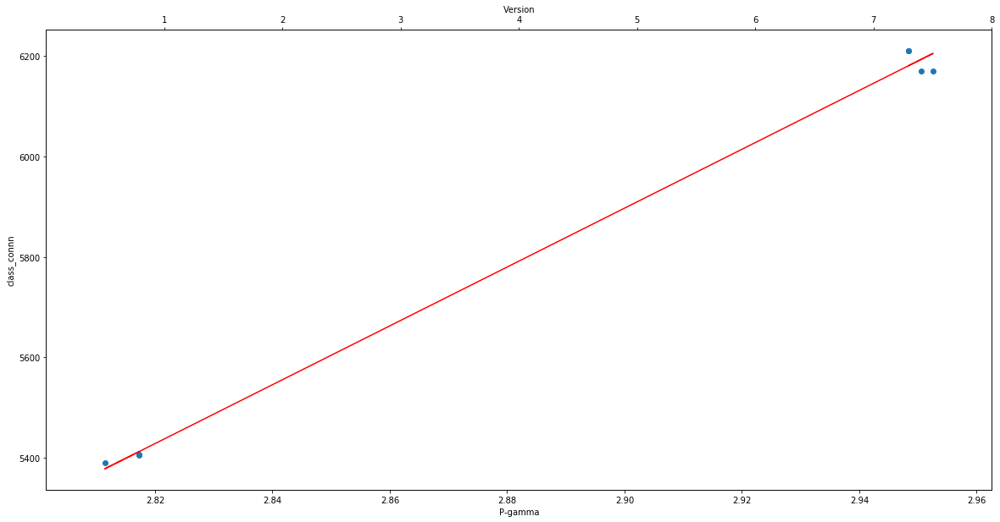

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_avg_cyclomaticInh_mm.png


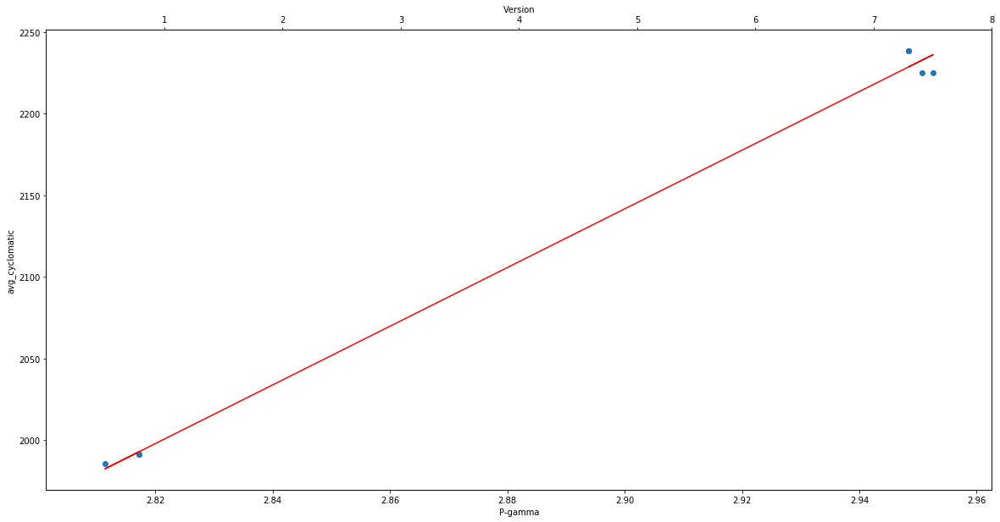

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_cboInh_mm.png


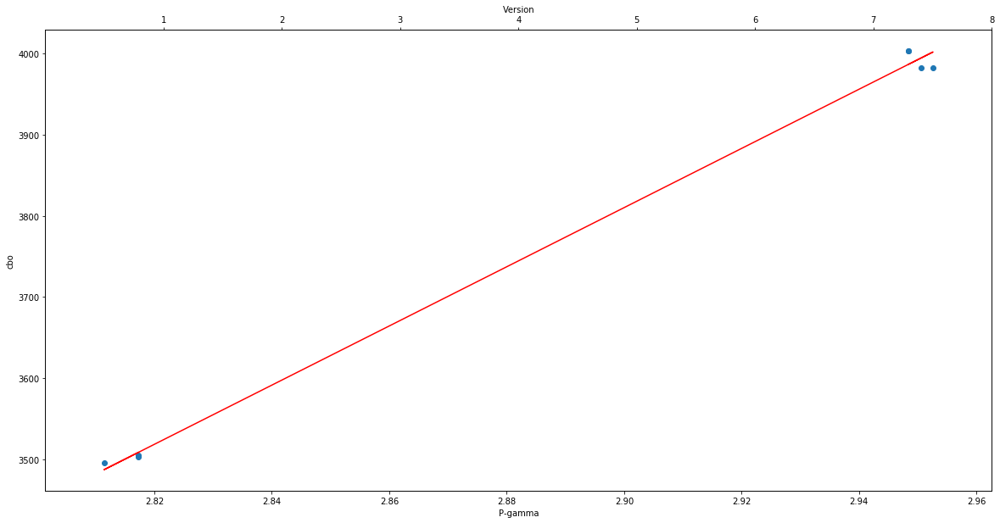

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_ditInh_mm.png


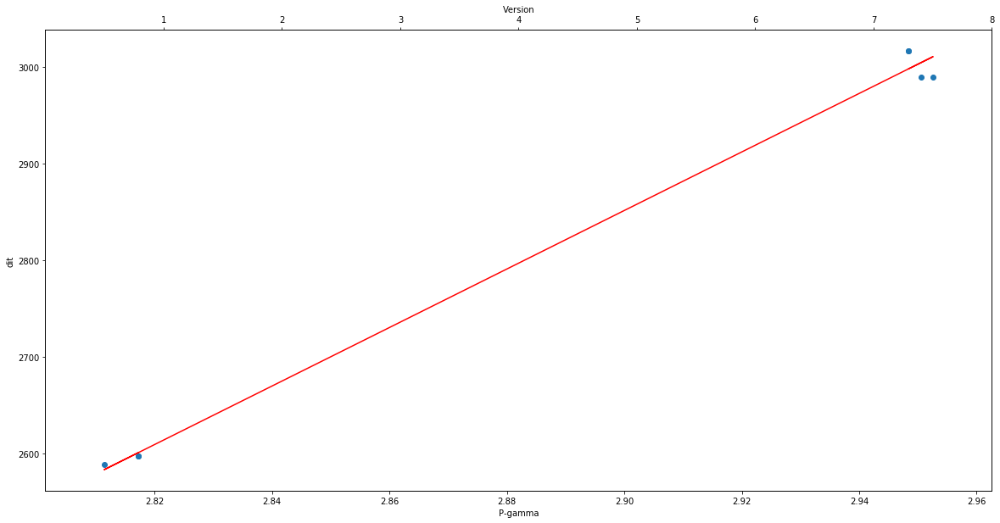

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_lcomInh_mm.png


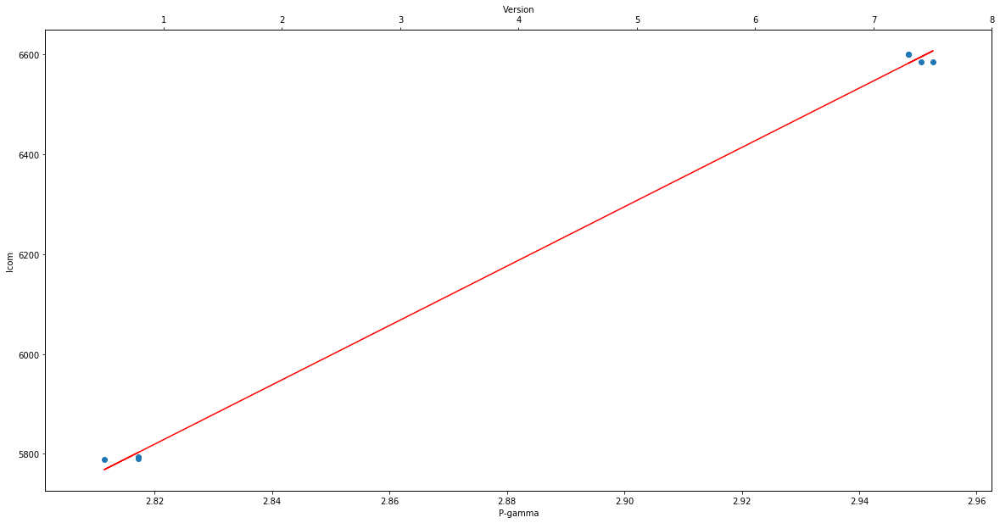

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_childrenInh_mm.png


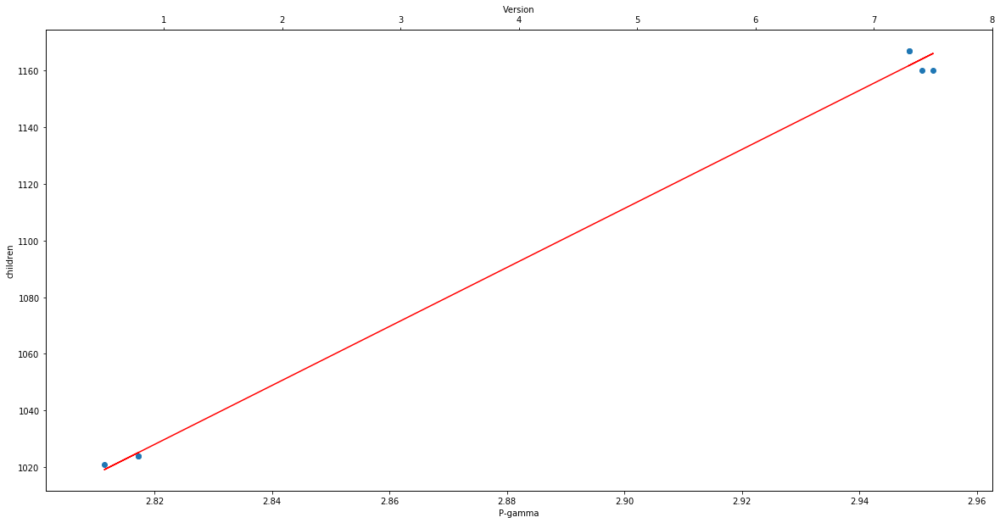

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_response_classInh_mm.png


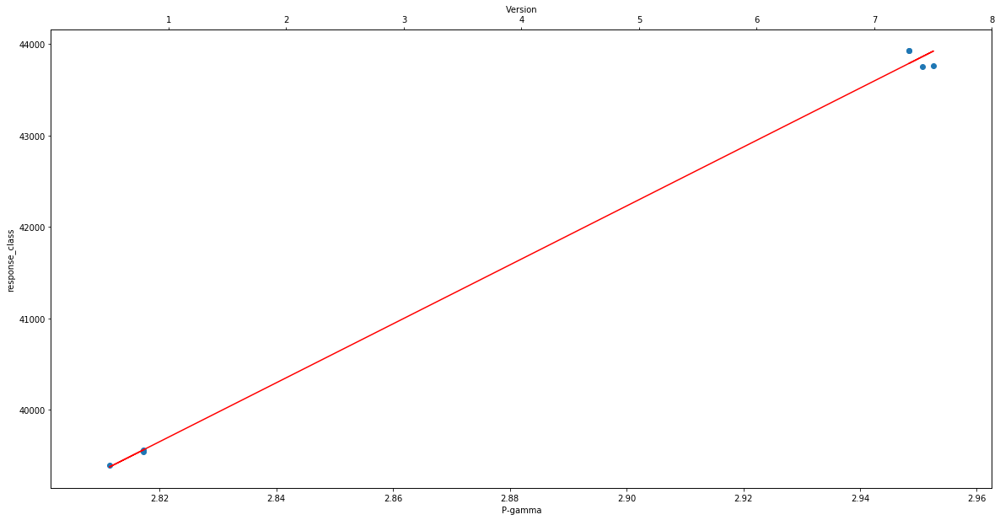

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/P-gamma_str_compInh_mm.png


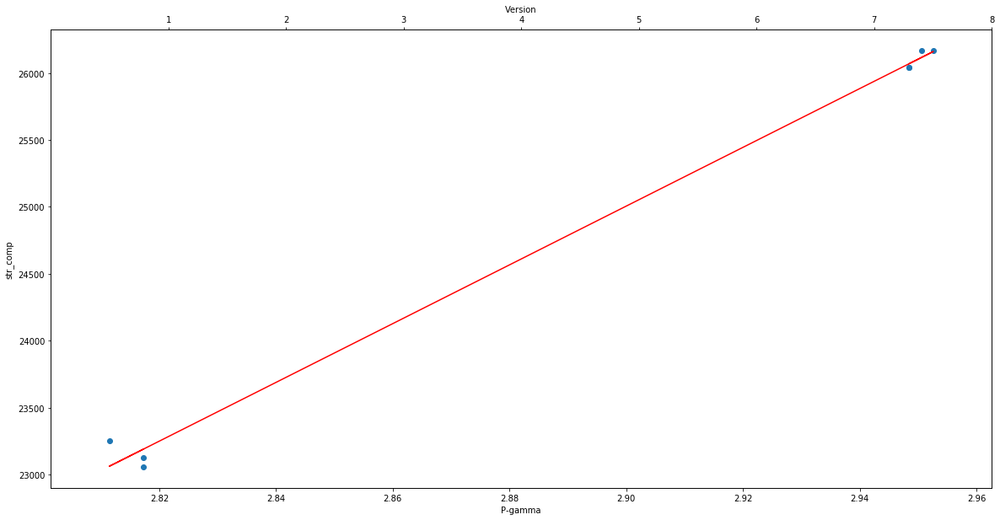

Colunm Name :  avg_degree
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_class_connnInh_mm.png


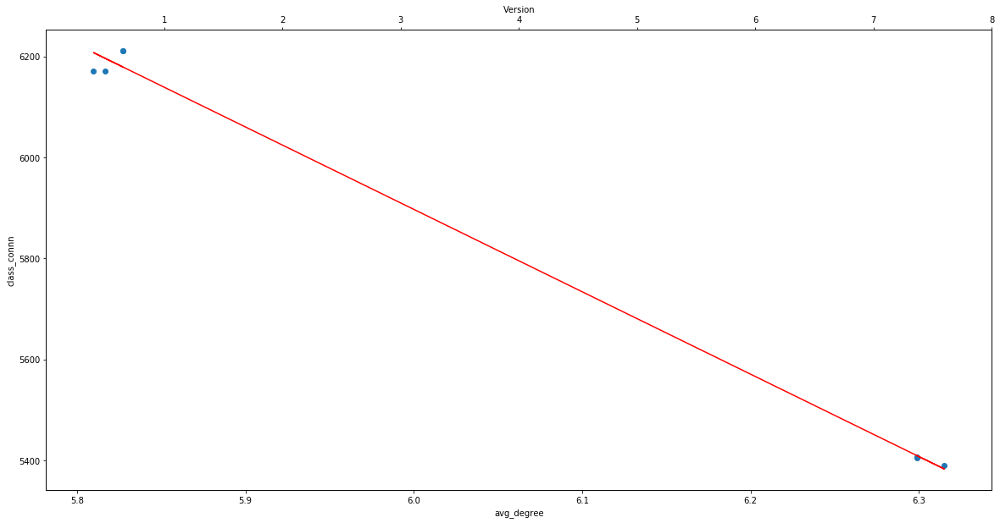

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_avg_cyclomaticInh_mm.png


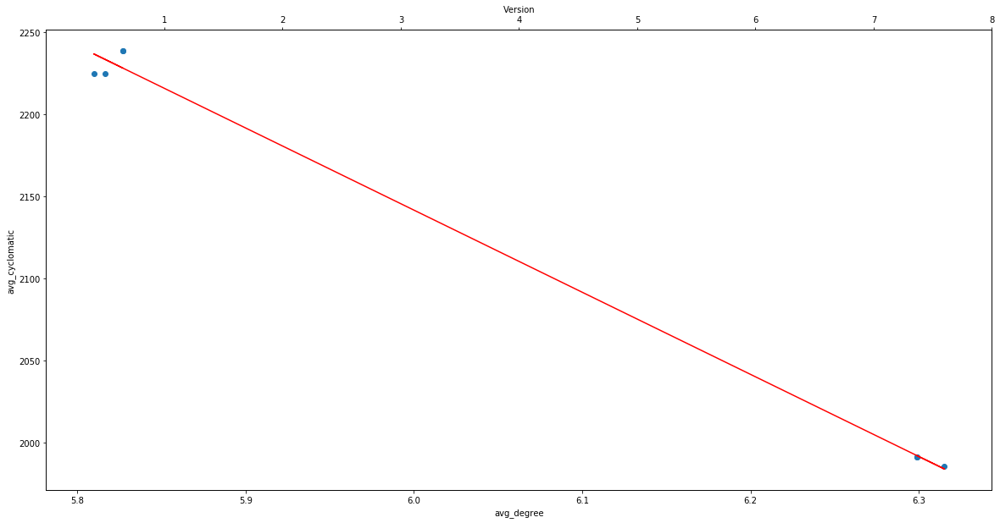

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_cboInh_mm.png


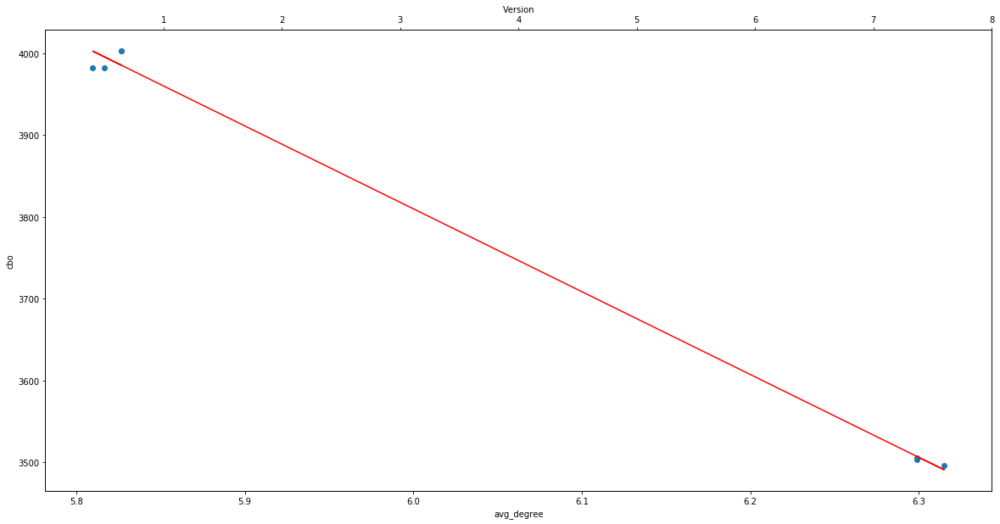

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_ditInh_mm.png


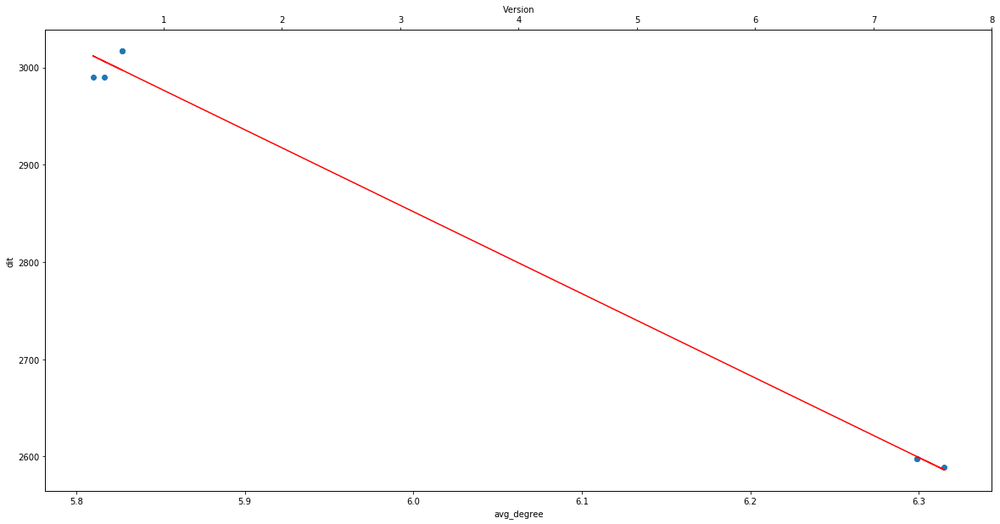

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_lcomInh_mm.png


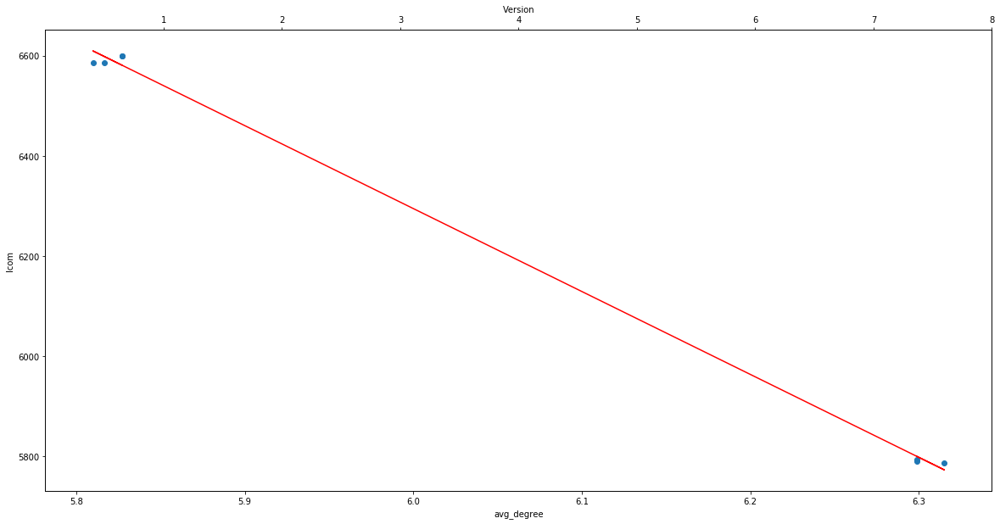

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_childrenInh_mm.png


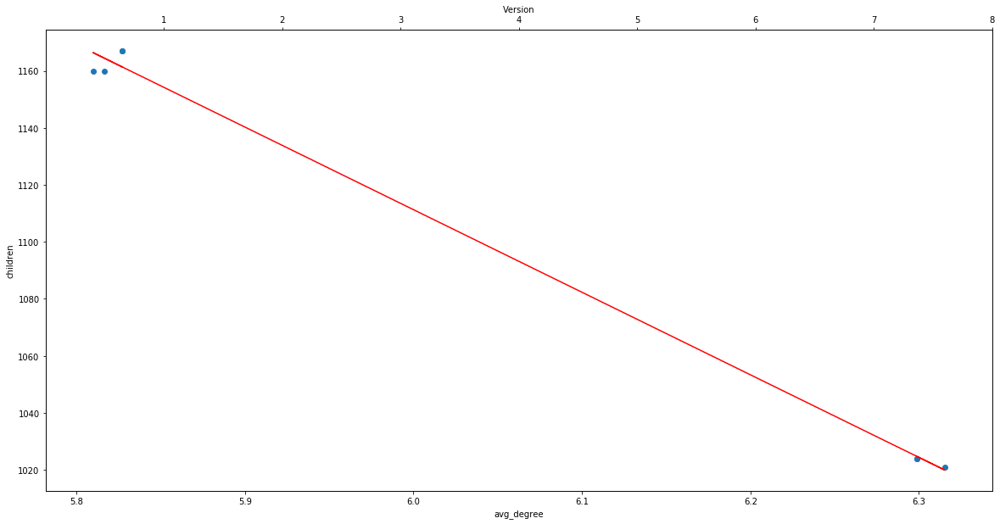

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_response_classInh_mm.png


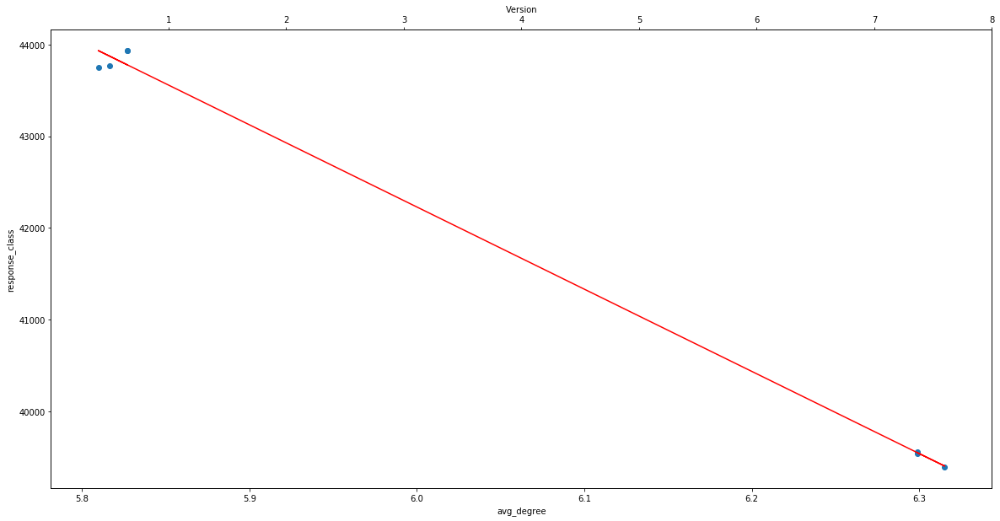

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_degree_str_compInh_mm.png


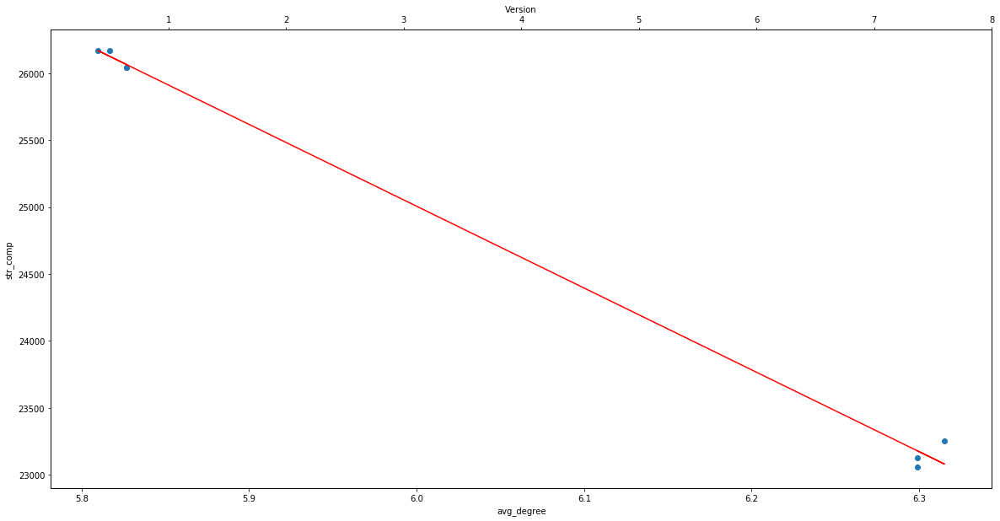

Colunm Name :  no_comm
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_class_connnInh_mm.png


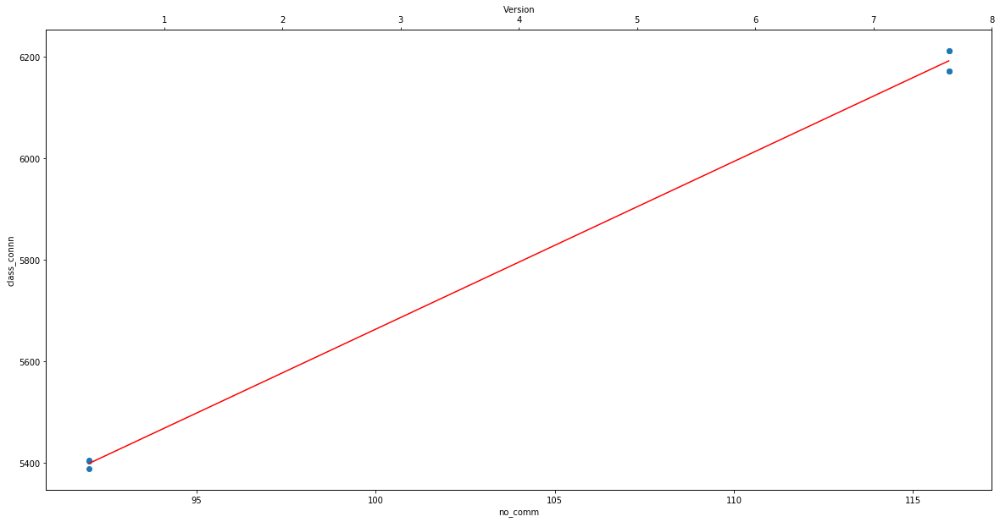

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_avg_cyclomaticInh_mm.png


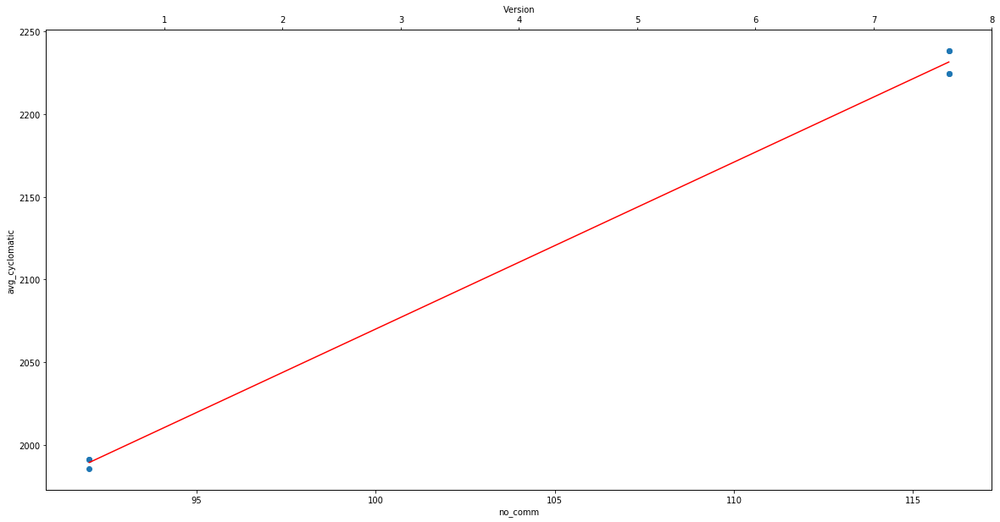

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_cboInh_mm.png


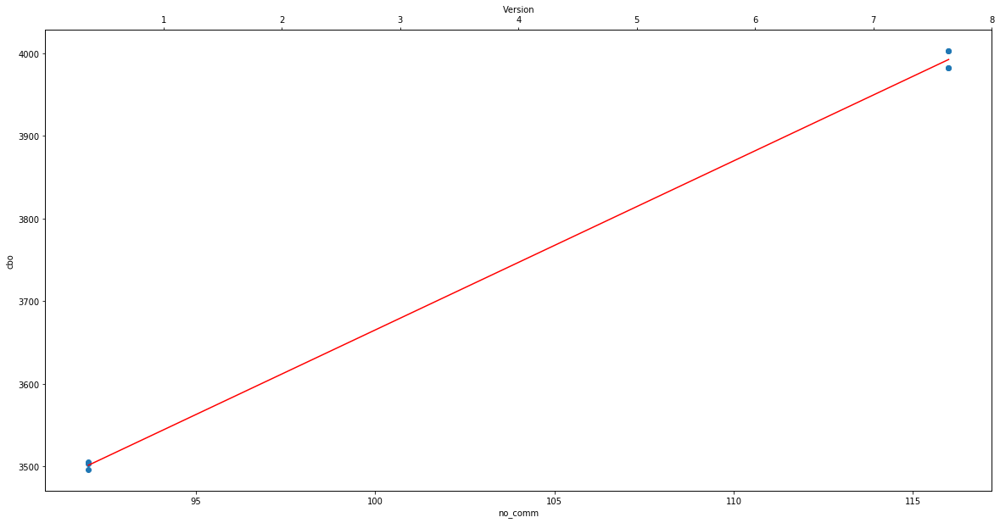

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_ditInh_mm.png


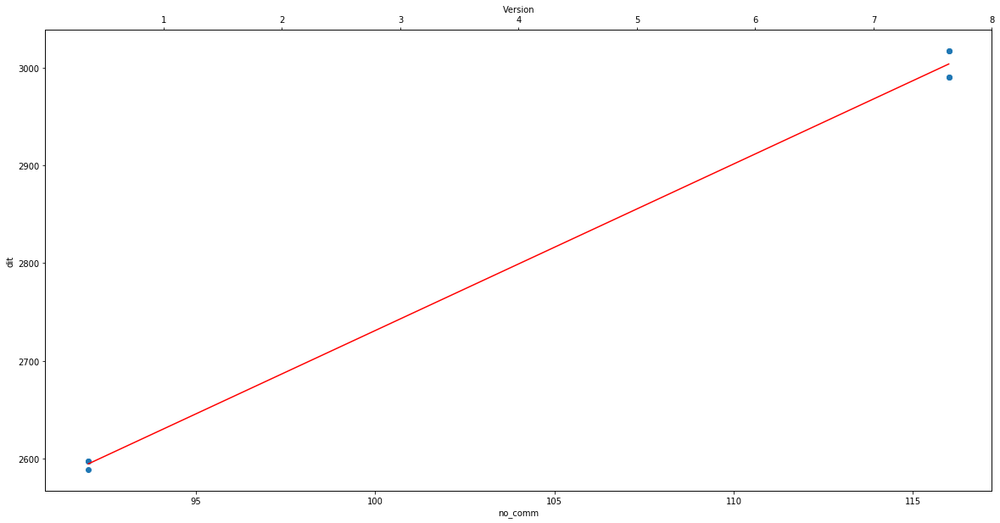

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_lcomInh_mm.png


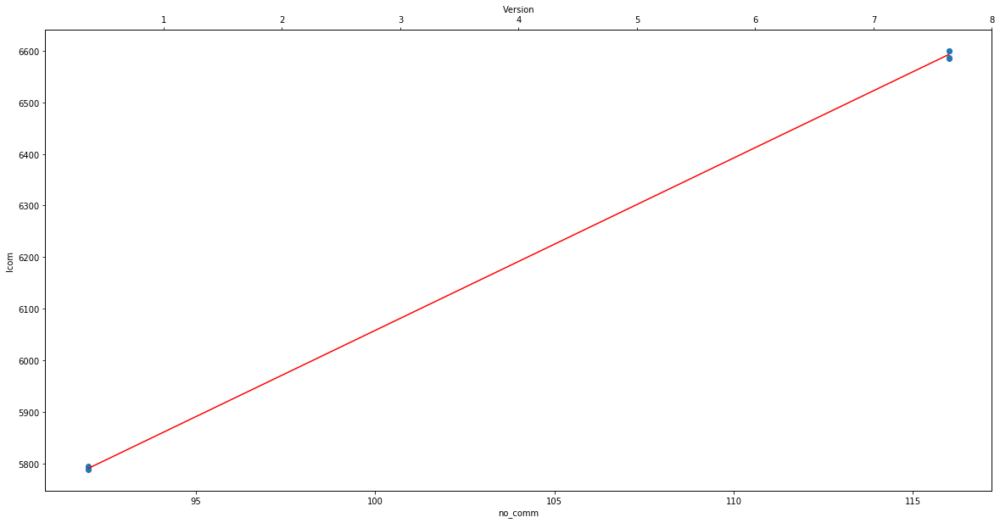

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_childrenInh_mm.png


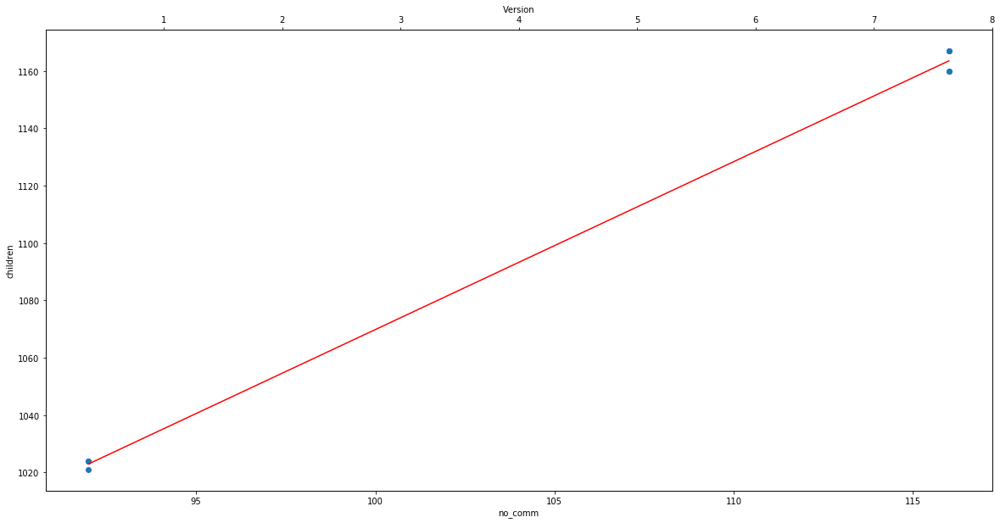

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_response_classInh_mm.png


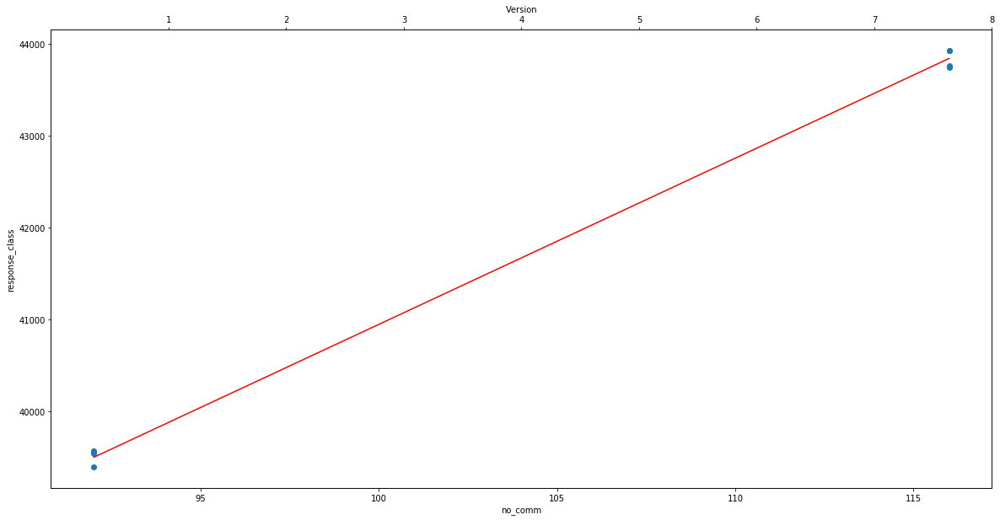

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/no_comm_str_compInh_mm.png


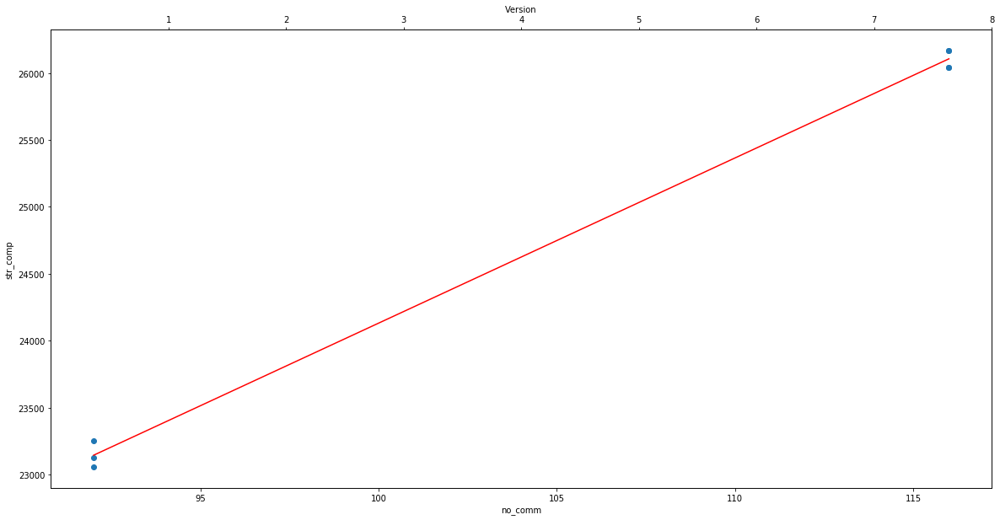

Colunm Name :  avg_shortest_path
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_class_connnInh_mm.png


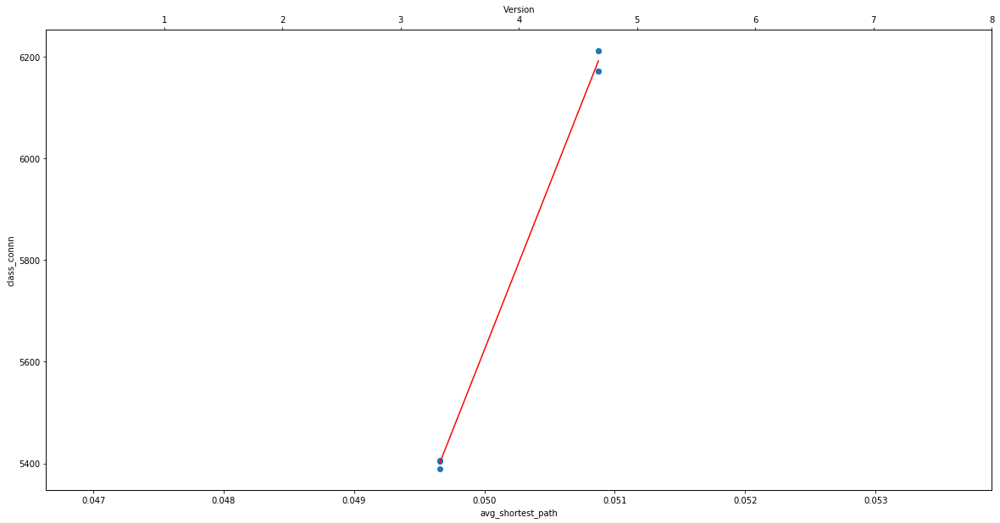

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_avg_cyclomaticInh_mm.png


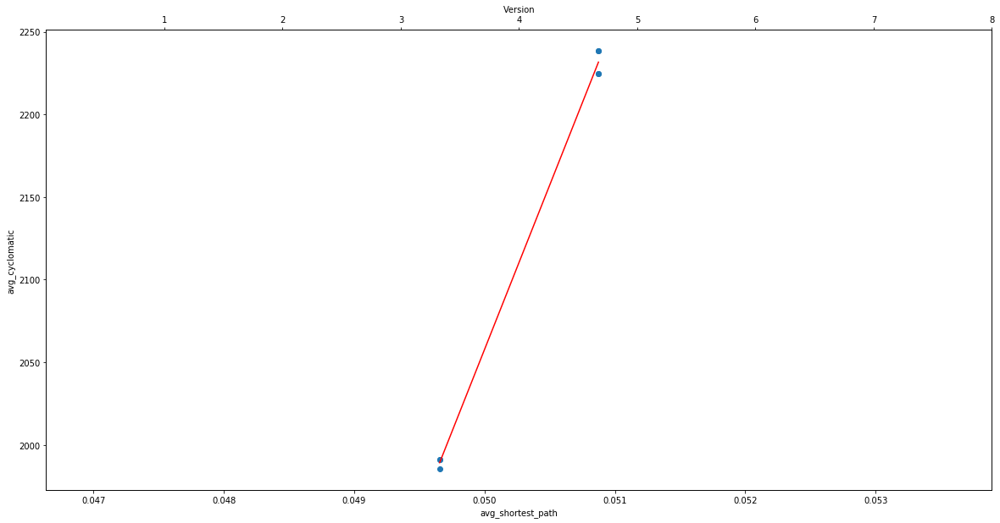

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_cboInh_mm.png


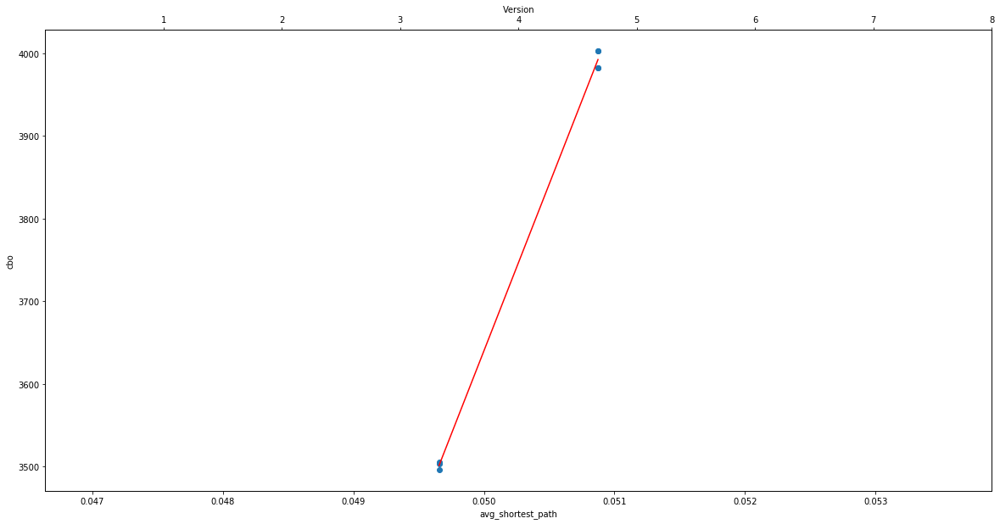

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_ditInh_mm.png


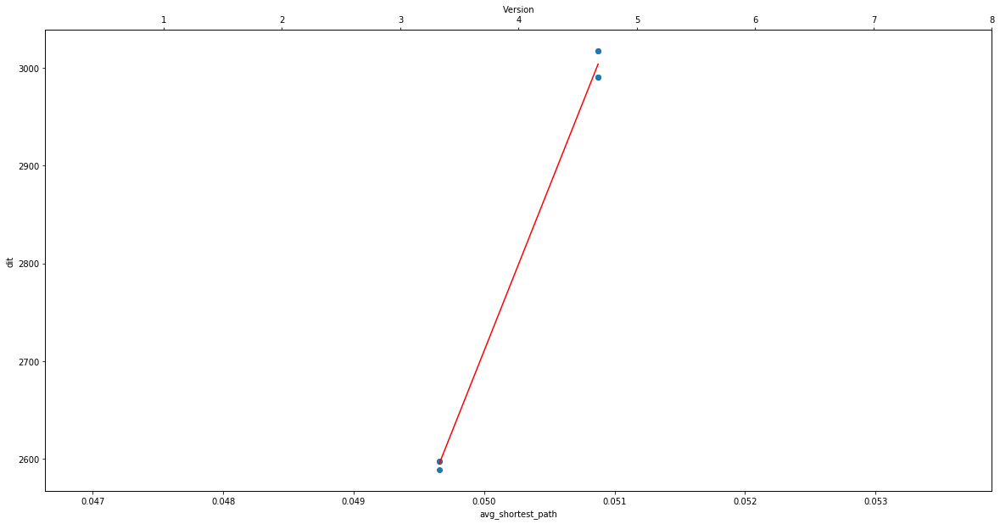

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_lcomInh_mm.png


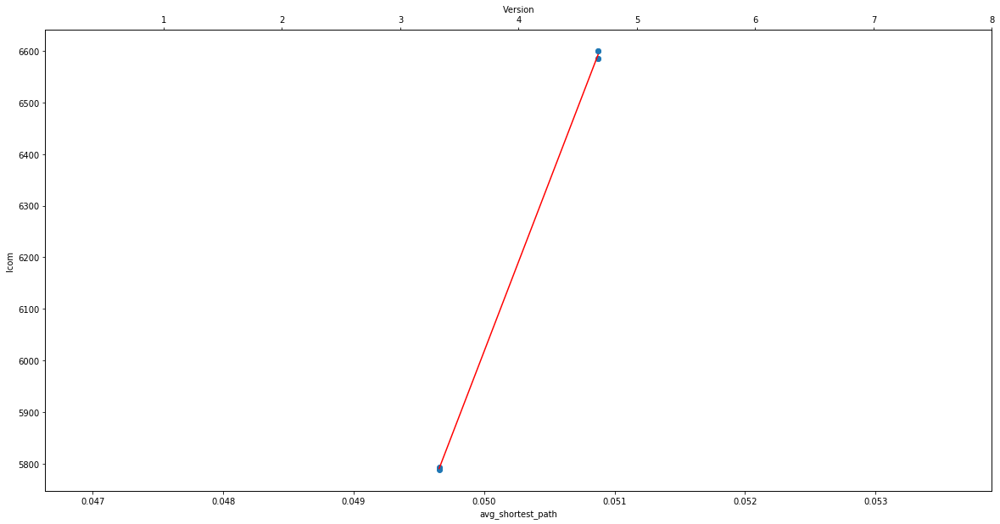

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_childrenInh_mm.png


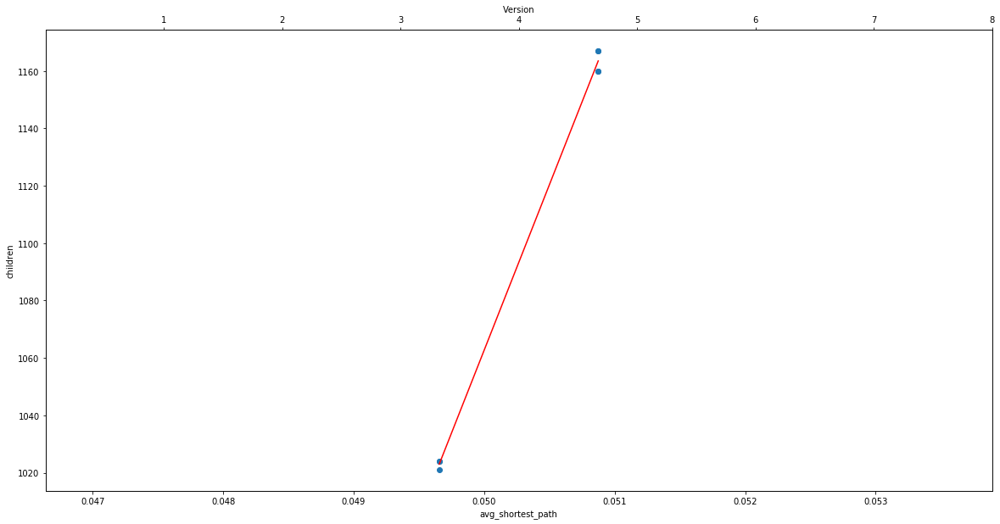

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_response_classInh_mm.png


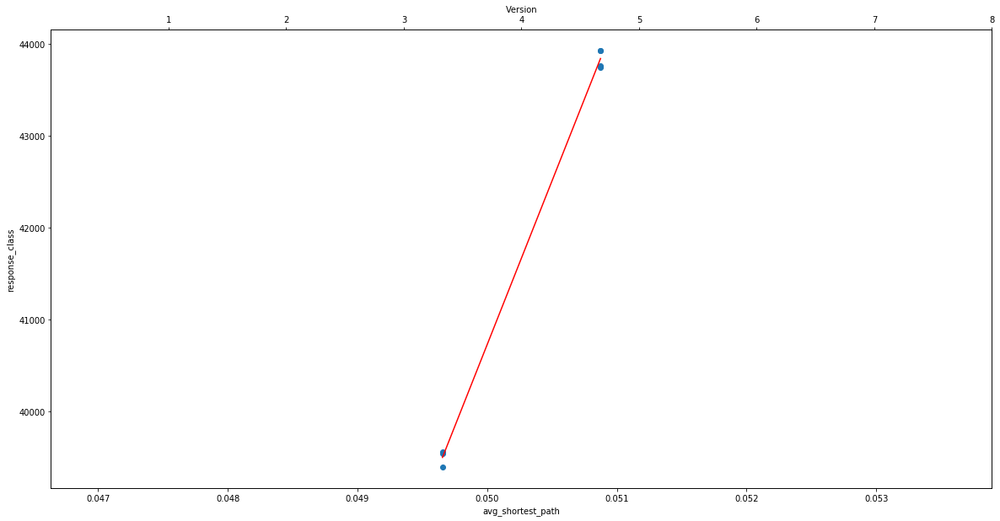

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_shortest_path_str_compInh_mm.png


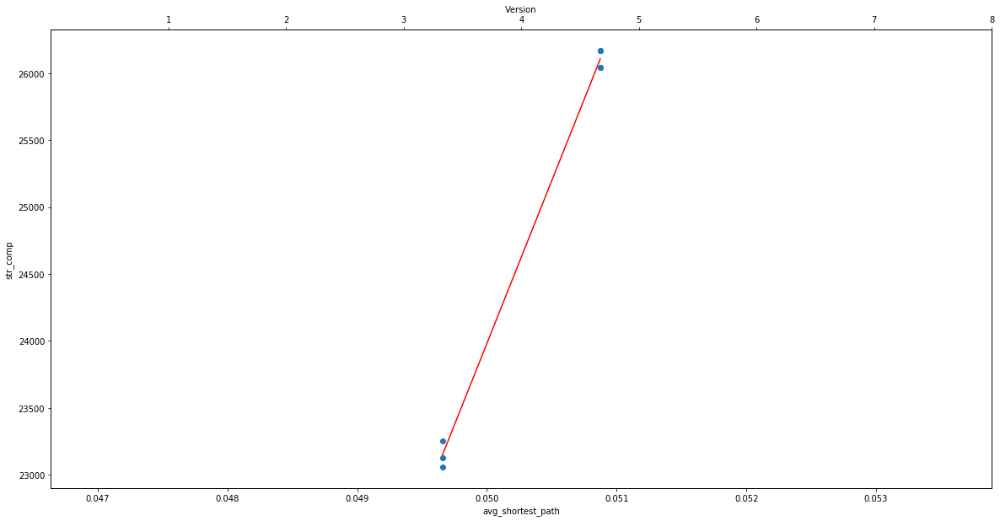

Colunm Name :  sub_density
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_class_connnInh_mm.png


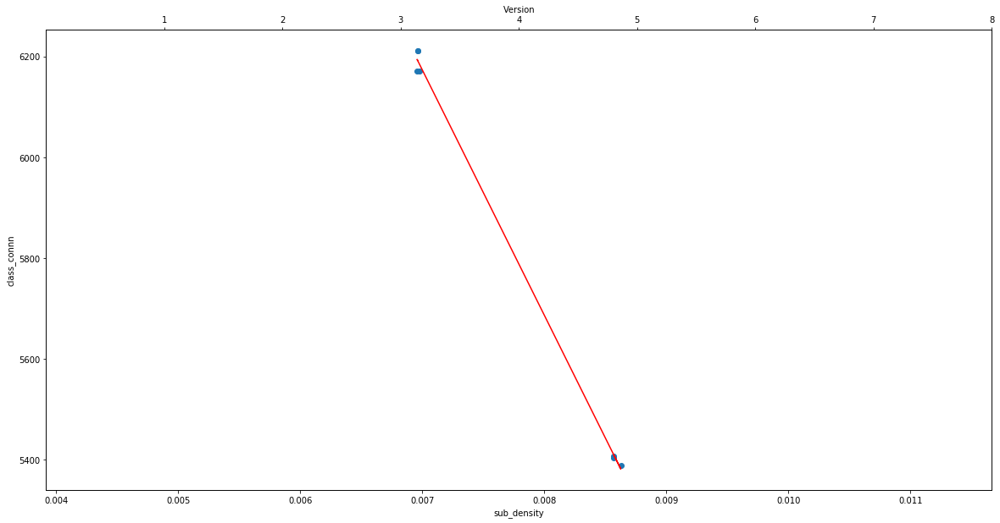

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_avg_cyclomaticInh_mm.png


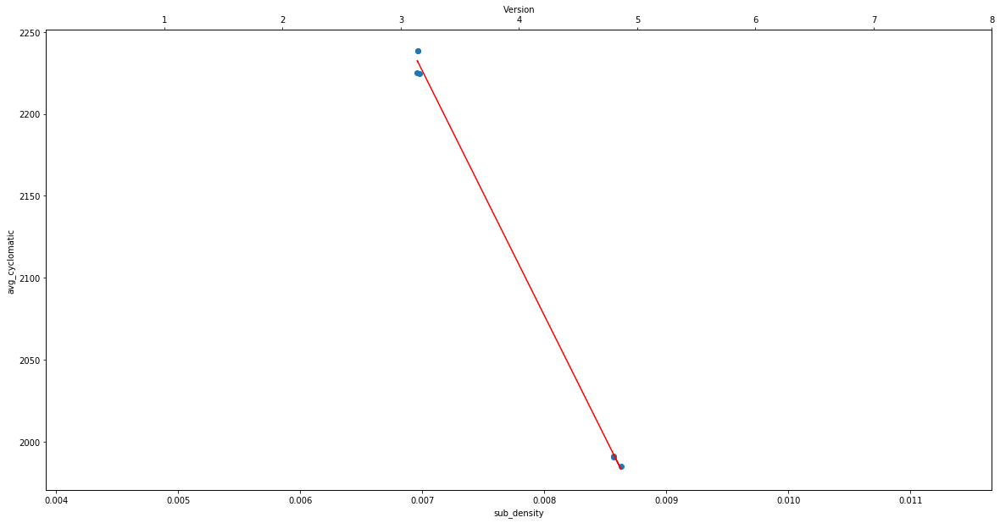

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_cboInh_mm.png


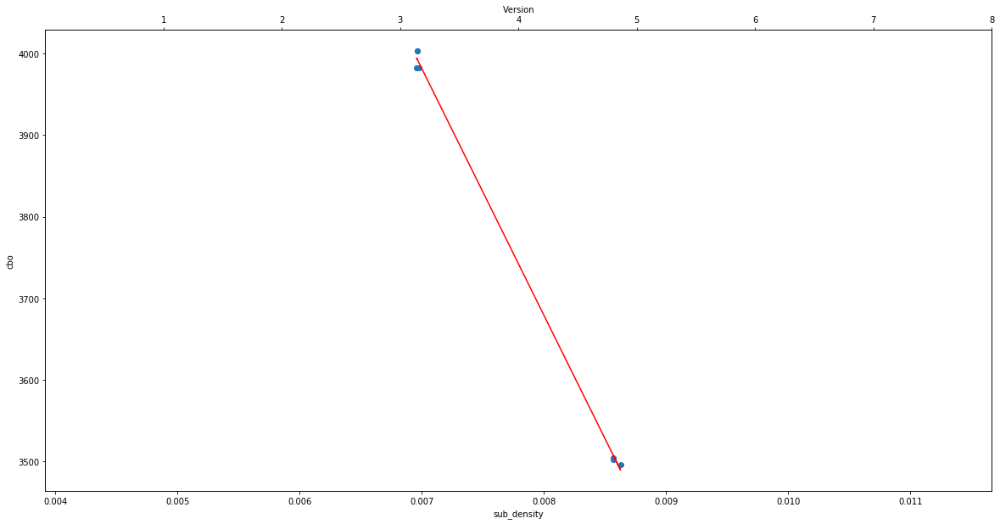

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_ditInh_mm.png


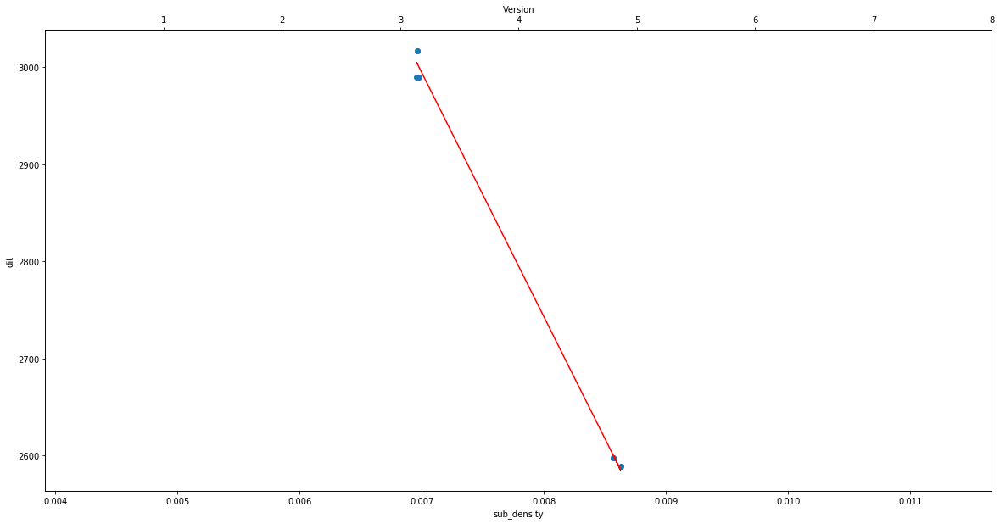

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_lcomInh_mm.png


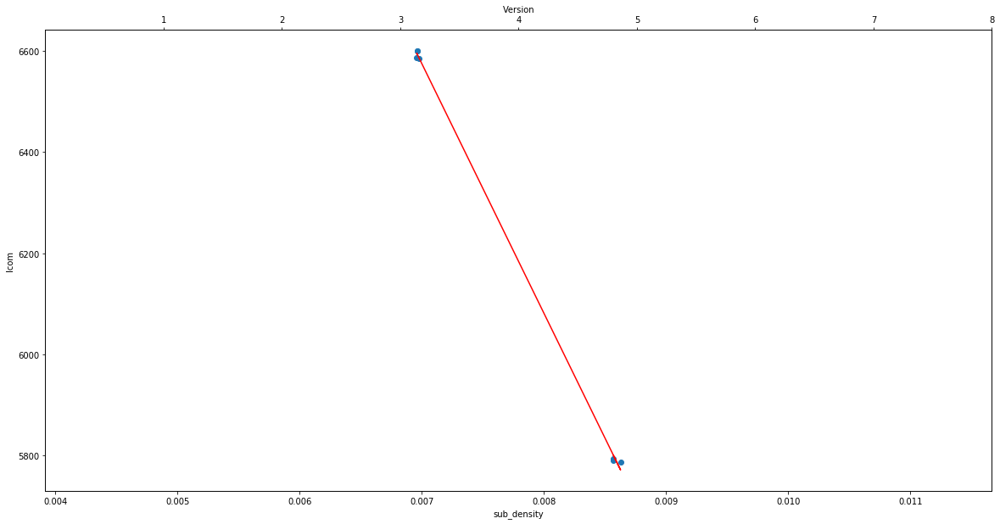

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_childrenInh_mm.png


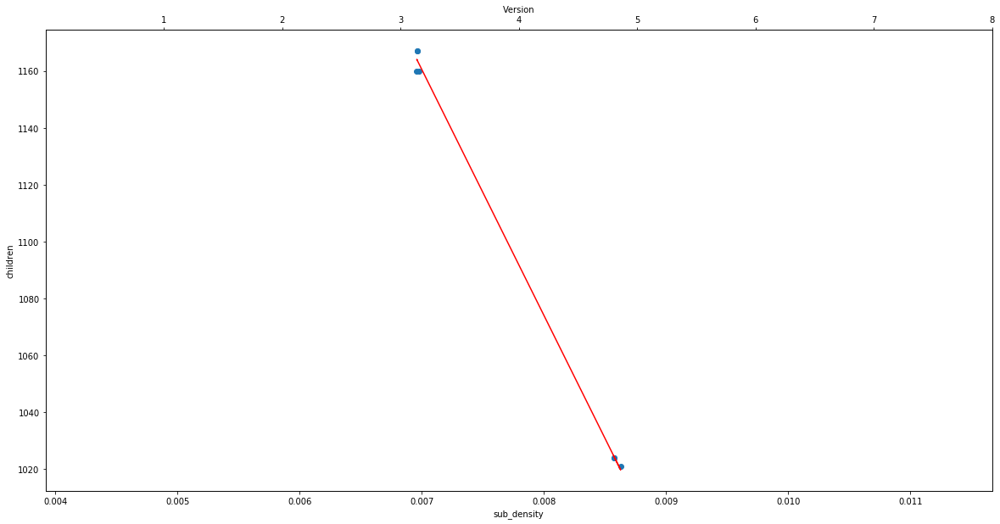

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_response_classInh_mm.png


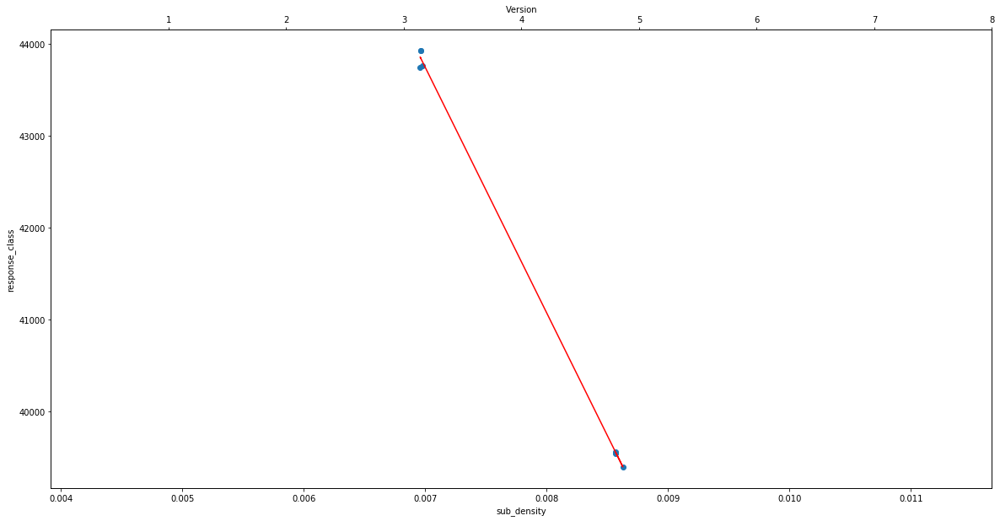

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/sub_density_str_compInh_mm.png


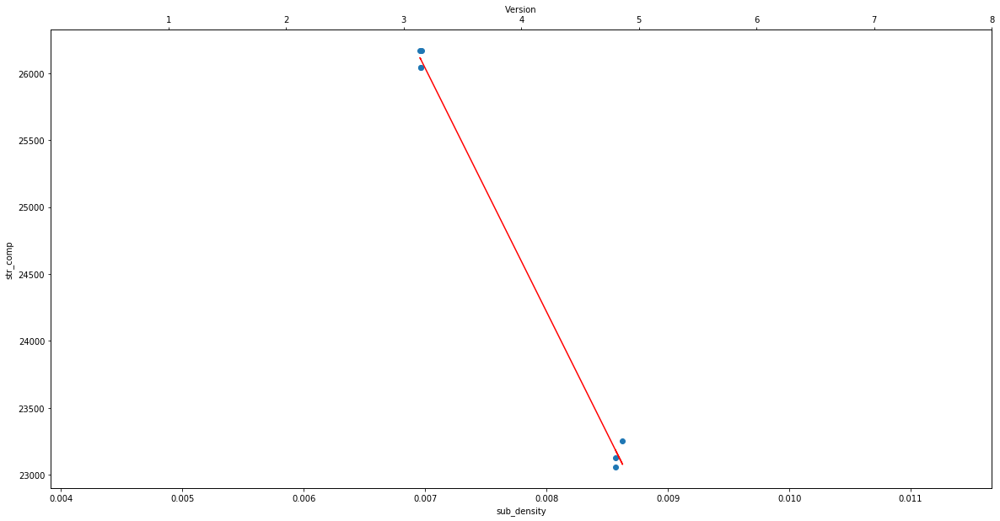

Colunm Name :  avg_clust
Col Name :  class_connn
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_class_connnInh_mm.png


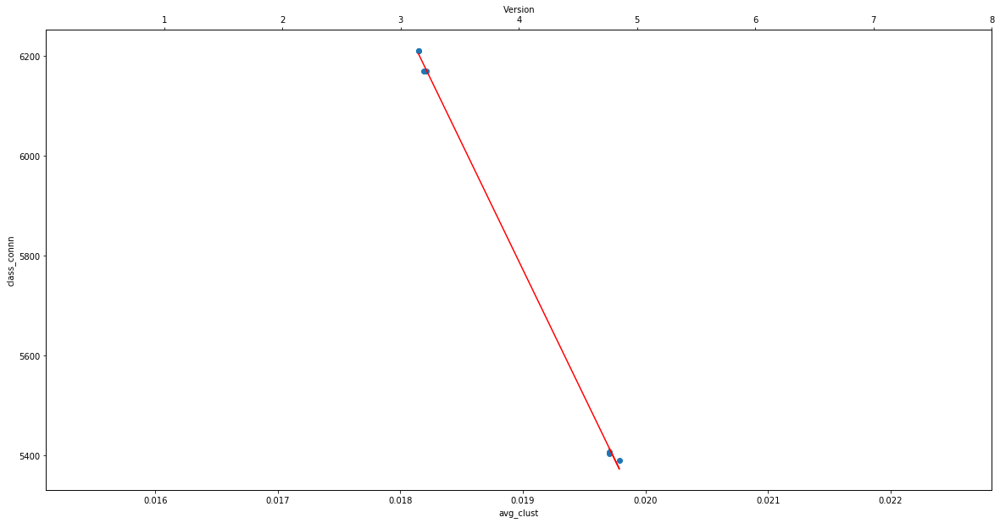

Col Name :  avg_cyclomatic
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_avg_cyclomaticInh_mm.png


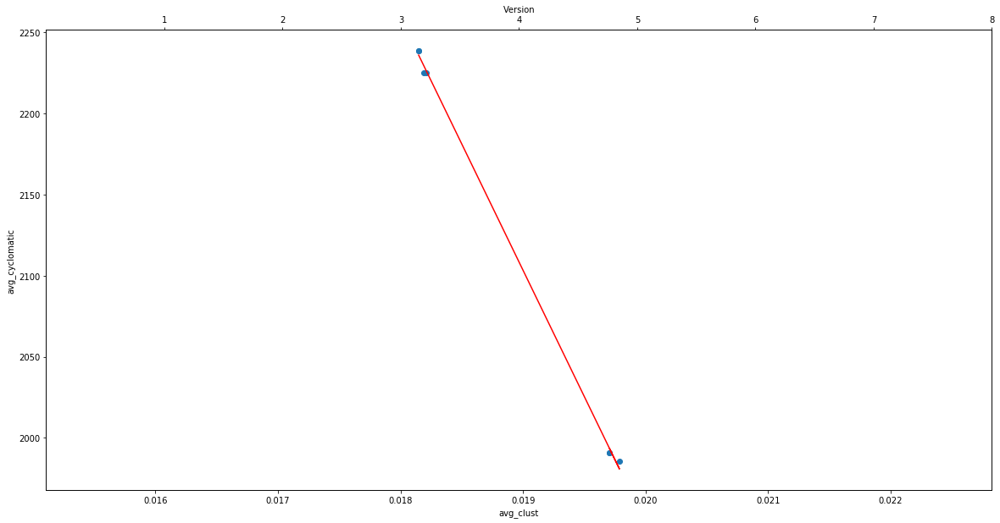

Col Name :  cbo
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_cboInh_mm.png


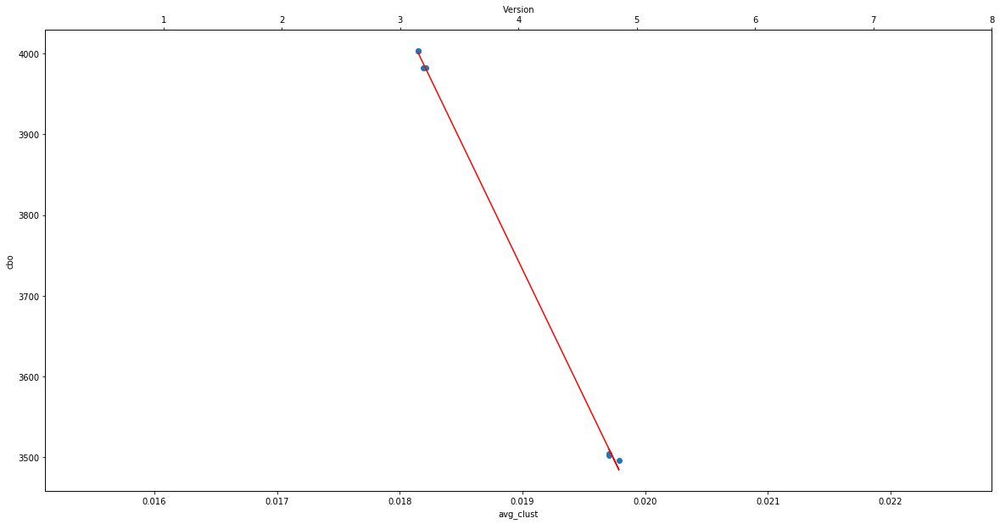

Col Name :  dit
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_ditInh_mm.png


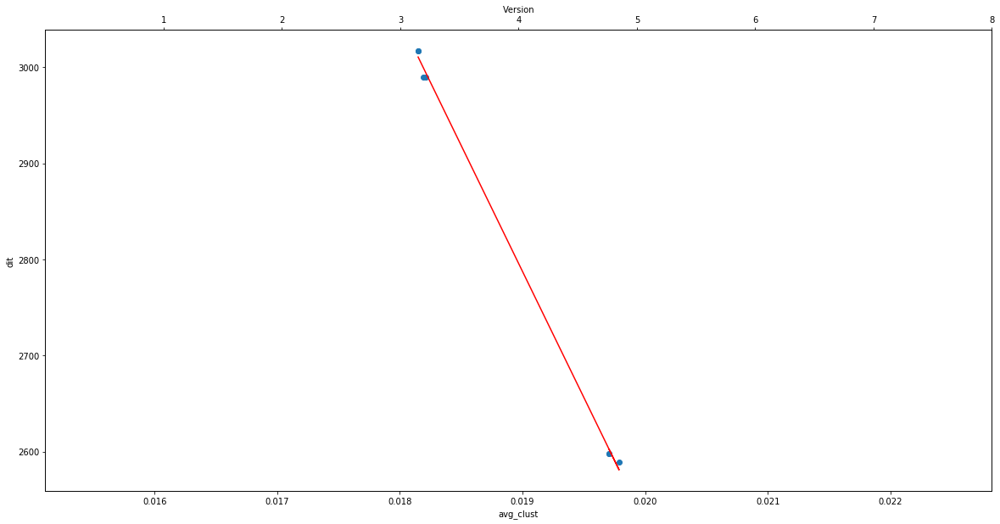

Col Name :  lcom
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_lcomInh_mm.png


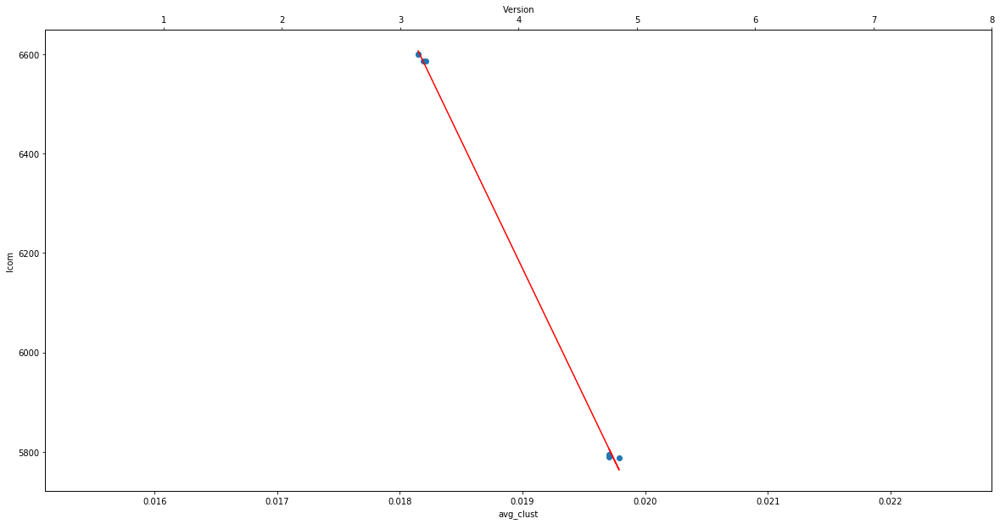

Col Name :  children
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_childrenInh_mm.png


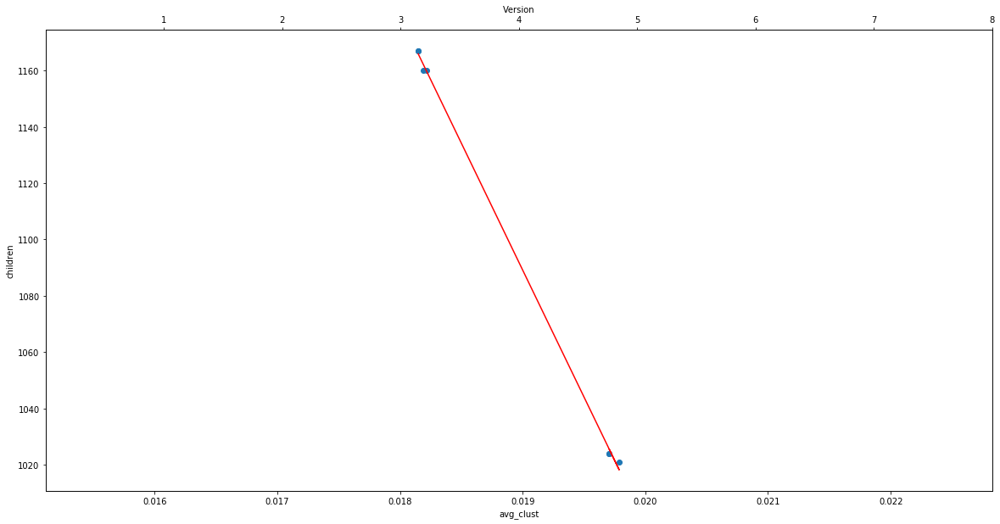

Col Name :  response_class
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_response_classInh_mm.png


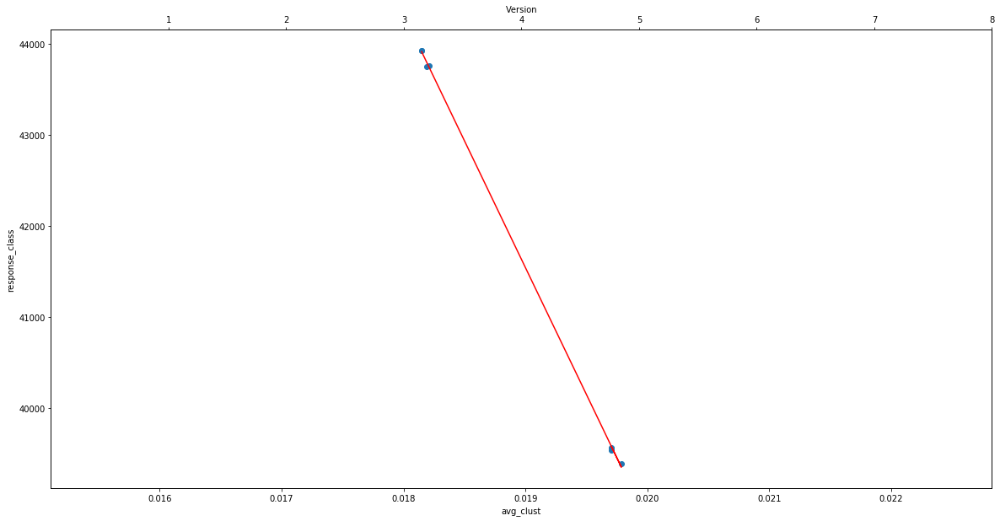

Col Name :  str_comp
D:/mm_thesis/D_graph/all_metrics/Jena/scatter_plots/avg_clust_str_compInh_mm.png


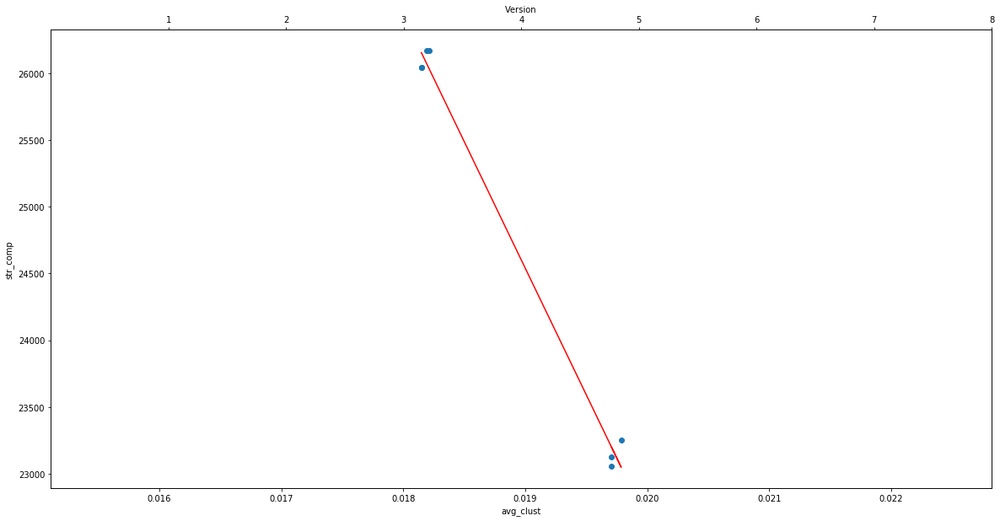

In [78]:
for p in c_path:
    met_files =  os.listdir(p)
    
    p1 = p[:-1]
    s1 = p1.rfind("/")
    f_save = p1[s1+1:] 
#     scat_dir = s_path + f_save +"/"
#     print(p)
#     print(met_files)
    print(30*"__")
    
    
    f_m = [(os.path.join(p,i ))for i in met_files if os.path.isfile(os.path.join(p,i))]
    s_path = [(os.path.join(p,i)+'/')for i in met_files if os.path.isdir(os.path.join(p,i))]
    print('files :', f_m)
    print('_________________')
    print('s_path    ;',s_path)
#     scatter_plots = 
    
    
    soft_m = [f for f in f_m if f.find("metrics.csv")!=-1]
    
    
    konect_cdot = [f for f in f_m if f.find('Call_mat')!= -1]
    network_cdot = [f for f in f_m if f.find('cdot')!= -1]

    konect_coll = [f for f in f_m if f.find('Coll_mat')!= -1]
    network_coll = [f for f in f_m if f.find('colldot')!= -1]

    konect_Inh = [f for f in f_m if f.find('Inh_mat')!= -1]
    network_Inh = [f for f in f_m if f.find('Inhdot')!= -1]
    
    
    
    
    
    soft_metric = pd.read_csv(soft_m[0])


    Konect_call = pd.read_csv(konect_cdot[0])
    call_metric = pd.read_csv(network_cdot[0])

    Konect_collab = pd.read_csv(konect_coll[0])
    collab_metric = pd.read_csv(network_coll[0])
    
    Konect_Inhert = pd.read_csv(konect_Inh[0])
    Inh_metric = pd.read_csv(network_Inh[0])
    
    soft_metric = soft_metric.sort_values(by=['t_stmp'])
    
    Konect_call = Konect_call.sort_values(by=['t_stmp'])
    call_metric = call_metric.sort_values(by=['t_stmp'])
    
    collab_metric = collab_metric.sort_values(by=['t_stmp'])
    Konect_collab =  Konect_collab.sort_values(by=['t_stmp'])
    
    Konect_Inher = Konect_Inhert.sort_values(by=['t_stmp'])
    Inh_metric =  Inh_metric.sort_values(by=['t_stmp'])
    
#     soft_m = [f for f in f_m if f.find("metrics.csv")!=-1]
#     soft_m = [f for f in f_m if f.find("metrics.csv")!=-1]
#     konect_cdot = [f for f in f_m if f.find("call_mat")!= -1]
#     network_cdot = [f for f in f_m if f.find("info_cdot.csv")!= -1]

#     konect_coll = [f for f in f_m if f.find("collab_mat")!= -1]
#     network_coll = [f for f in f_m if f.find("collaborate.csv")!= -1]
    
#     soft_metric = pd.read_csv(soft_m[0])


#     Konect_call = pd.read_csv(konect_cdot[0])
#     call_metric = pd.read_csv(network_cdot[0])
    
#     Konect_collab = pd.read_csv(konect_coll[0])
#     collab_metric = pd.read_csv(network_coll[0])
    
    
 #############################################################################################

#     dfs = [soft_metric, konect_metric, call_metric]

    ax_df = soft_metric[['t_stmp','Version',]]
    ax_df = ax_df.sort_values(by=['t_stmp'])
    N = len(ax_df) + 1
    print(N)
#     print(len(ax_df))
    x_val = np.arange(1, N+1,1)
#     print(x_val)
#     print(ax_df.head(100))
    soft_metric = soft_metric.sort_values(by=['t_stmp'])
    Konect_call = Konect_call.sort_values(by=['t_stmp'])
    call_metric = call_metric.sort_values(by=['t_stmp'])
    
    collab_metricc = collab_metric.sort_values(by=['t_stmp'])
    Konect_collab =  Konect_collab.sort_values(by=['t_stmp'])
    
    Konect_Inher = Konect_Inhert.sort_values(by=['t_stmp'])
    Inh_metric =  Inh_metric.sort_values(by=['t_stmp'])
   
   
    
   
#     dfs = [soft_metric, Konect_collab, collab_metric]
#     dfs = [soft_metric, Konect_call, call_metric]
    dfs = [soft_metric, Konect_Inher, Inh_metric]
    
    df_final = reduce(lambda left,right: pd.merge(left,right,on=['Version','t_stmp']), dfs)
   

    df_met = df_final[['class_connn', 'avg_cyclomatic', 'cbo', 'dit', 'lcom', 'children',
                        'response_class', 'str_comp']]
    df_net = df_final[['squares', 'P-gamma','avg_degree','no_comm', 'avg_shortest_path',
                       'sub_density','avg_clust']]
    for (columnName, columnData) in df_net.iteritems():


        print('Colunm Name : ', columnName)
        #print('Column Contents : ', columnData.values)
        for (cName, cData) in df_met.iteritems():
            print('Col Name : ', cName)
           # print('Colu Contents : ', cData.values)
#           fig = plt.figure()
            fig = plt.figure(figsize=(20, 10))
            #fig = plt.figure()
            ax1 = fig.add_subplot(111)
            ax2 = ax1.twiny()

            ax1.scatter(columnData.values,cData.values)
            ax1.set_xlabel(columnName)
            ax1.set_ylabel(cName)
            ax2.set_xlabel('Version')
            ax2.set_xticks(x_val)
            
            m, b = np.polyfit(columnData.values, cData.values, 1)
            ax1.plot(columnData.values, m*columnData.values + b,'r')
#             to_save =   columnName+'_' + cName+'collab_mm.png'
#             to_save =   columnName+'_' + cName+'call_mm.png'
            to_save =   columnName+'_' + cName+'Inh_mm.png'
            file_path = os.path.join(s_path[0],to_save)
#             file_name = scat_dir + to_save
            print(file_path)
            plt.savefig(file_path)
            plt.show()
            
# #################################################################################################
            

# Degree  Distribution 


In [12]:
Call_path = 'D:/mm_thesis/D_graph/Software_graphs/Degree_cdot/'
Colla_path = 'D:/mm_thesis/D_graph/Software_graphs/Degree_coll/'
In_path = 'D:/mm_thesis/D_graph/Software_graphs/Degree_Inh/'

met_files  : ['Cassandra_Call_mat.csv', 'Cassandra_cdot_m.csv', 'Cassandra_colldot_m.csv', 'Cassandra_Coll_mat.csv', 'Cassandra_heat_s_call_fixed.png', 'Cassandra_heat_s_collab_fixed.png', 'Cassandra_heat_s_Inh_fixed.png', 'Cassandra_Inhdot_m.csv', 'Cassandra_Inh_mat.csv', 'Cassandra_metrics.csv', 'Degree_cdot', 'Degree_coll', 'Degree_Inh', 'scatter_plots']
s_path D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Cassandra_Inhdot_m.csv
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.3.0-final.png
__________________


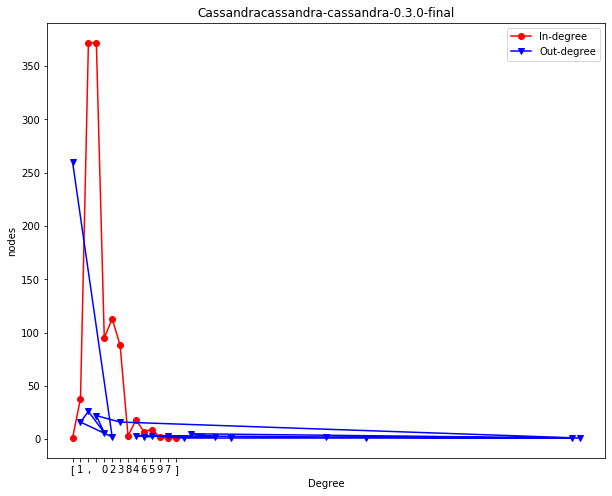

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.4.0-final.png
__________________


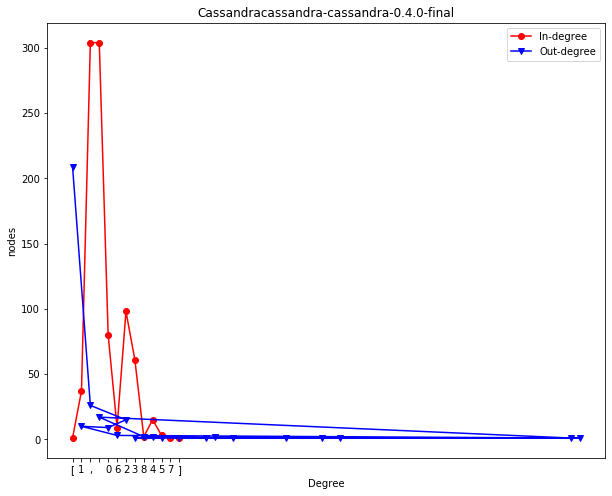

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.4.1.png
__________________


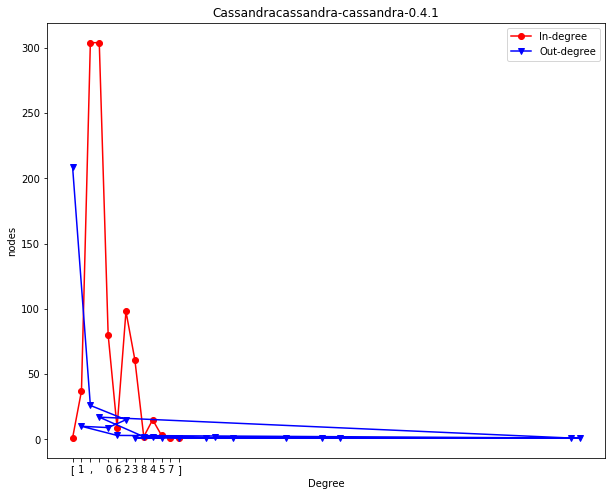

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.4.2.png
__________________


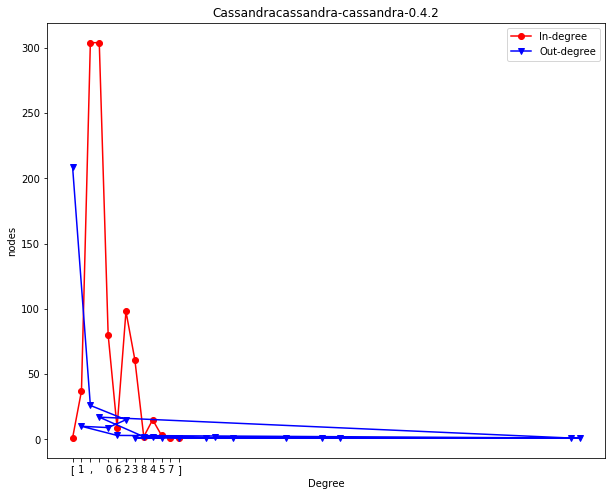

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.5.0.png
__________________


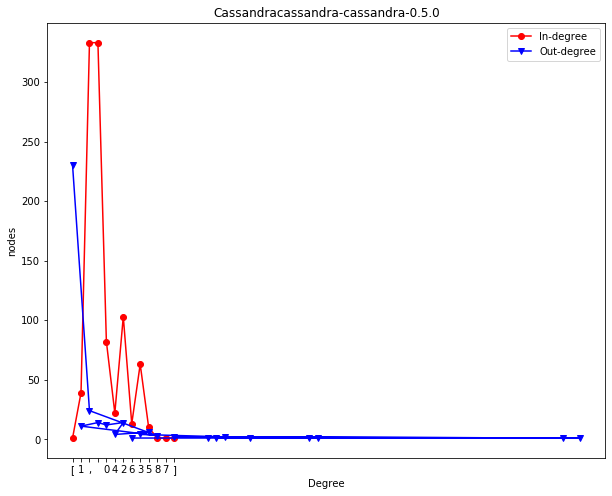

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.5.1.png
__________________


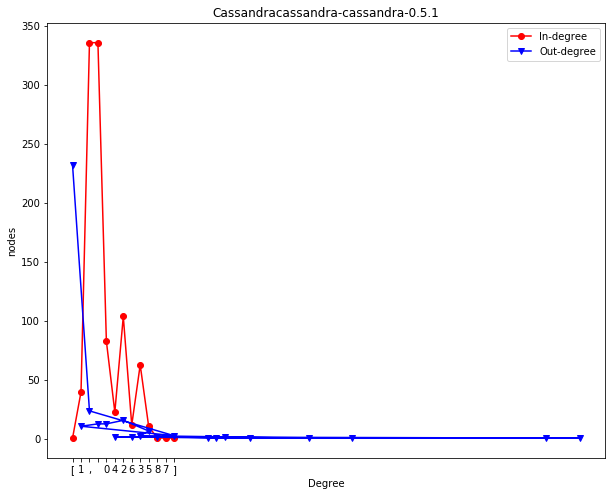

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.0.png
__________________


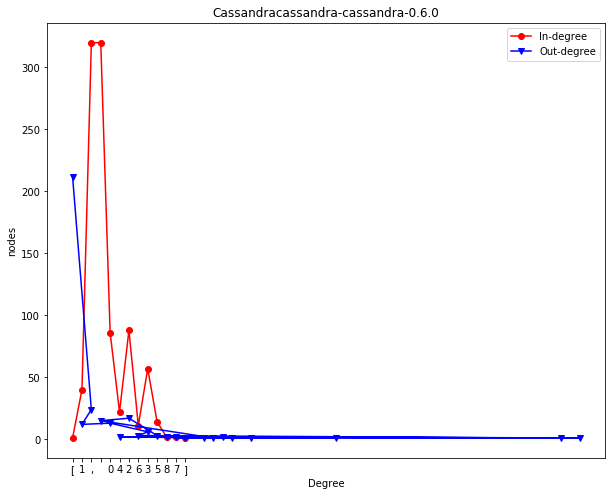

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.1.png
__________________


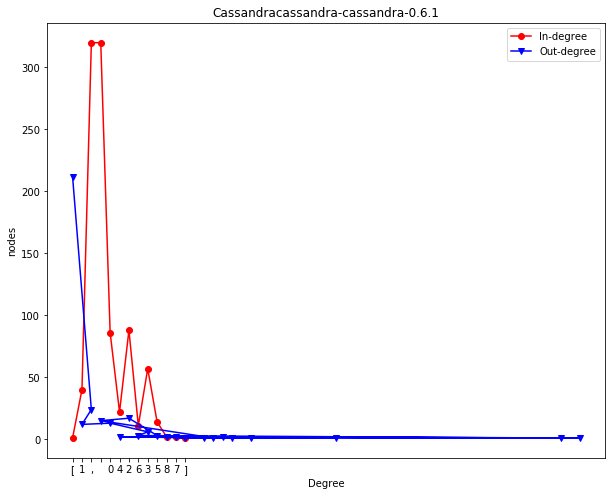

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.10.png
__________________


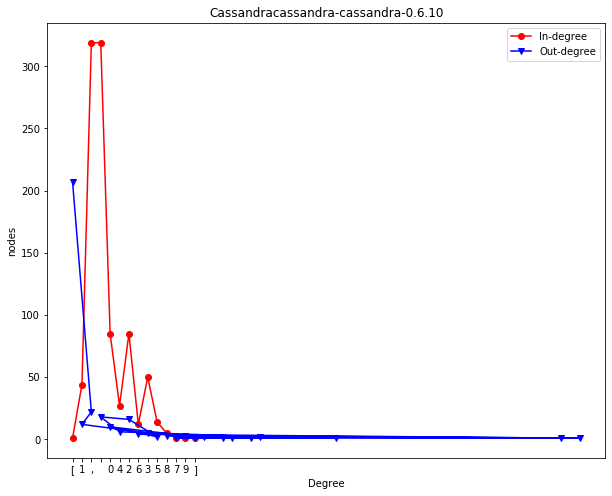

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.11.png
__________________


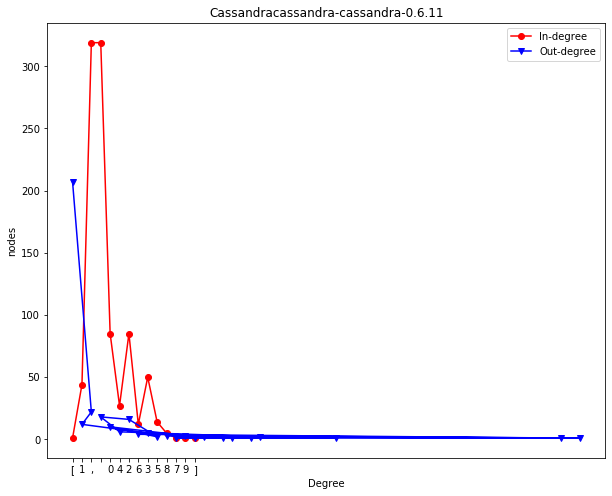

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.12.png
__________________


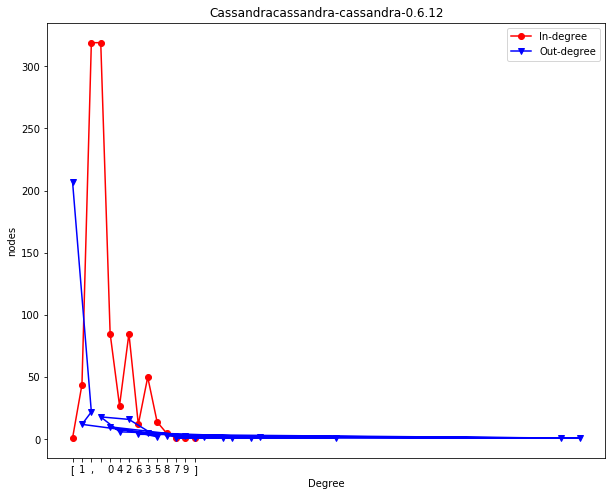

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.13.png
__________________


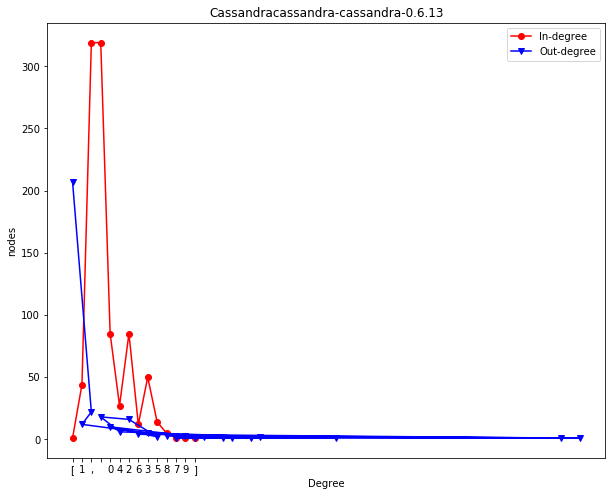

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.2.png
__________________


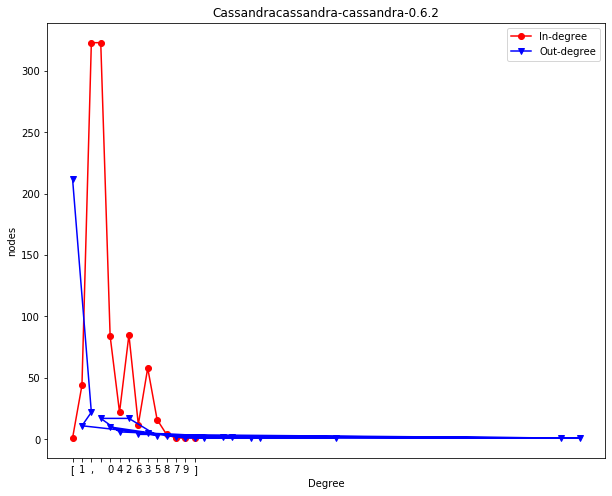

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.3.png
__________________


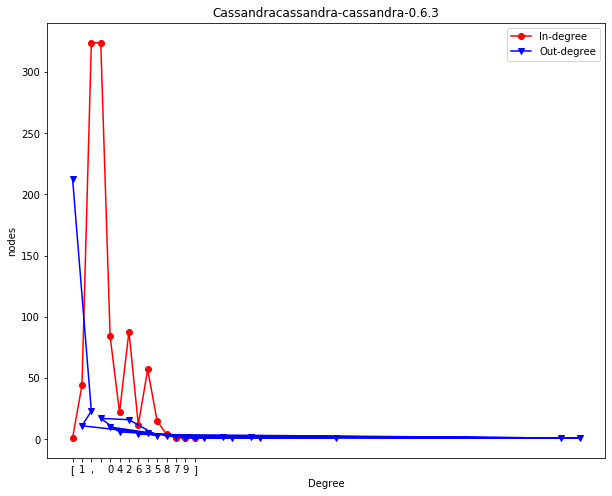

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.4.png
__________________


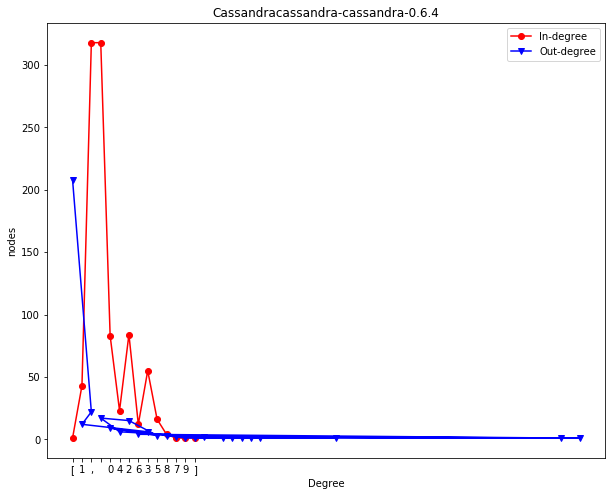

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.5.png
__________________


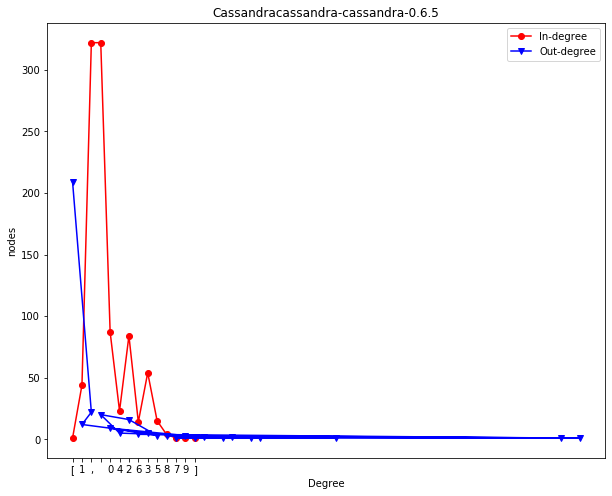

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.6.png
__________________


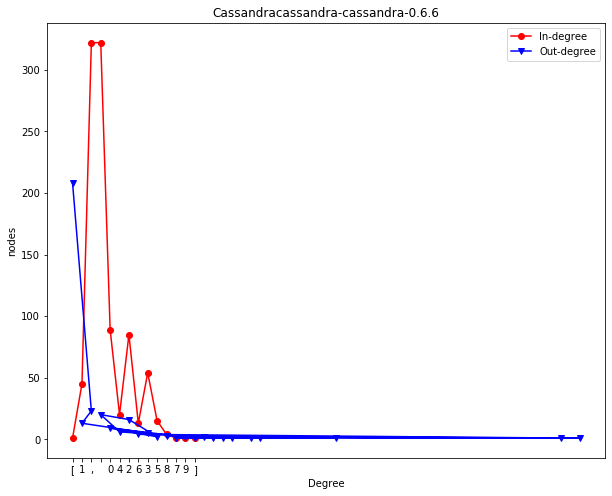

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.7.png
__________________


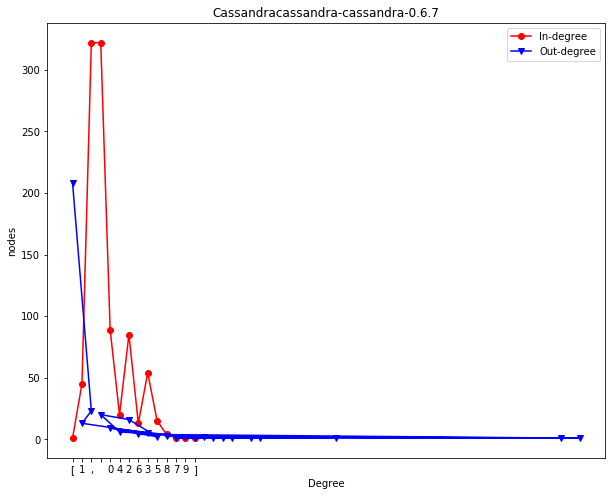

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.8.png
__________________


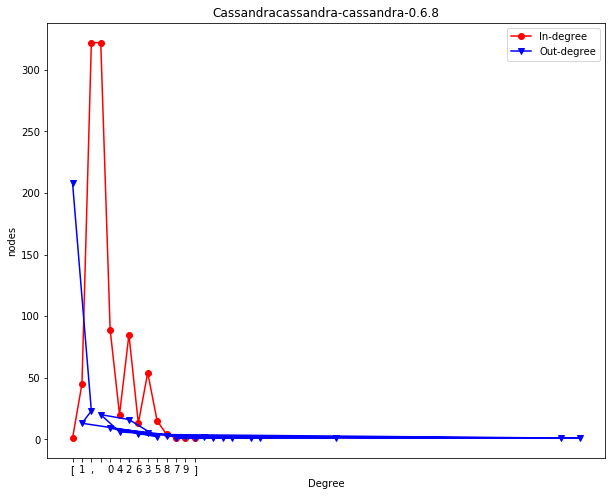

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.6.9.png
__________________


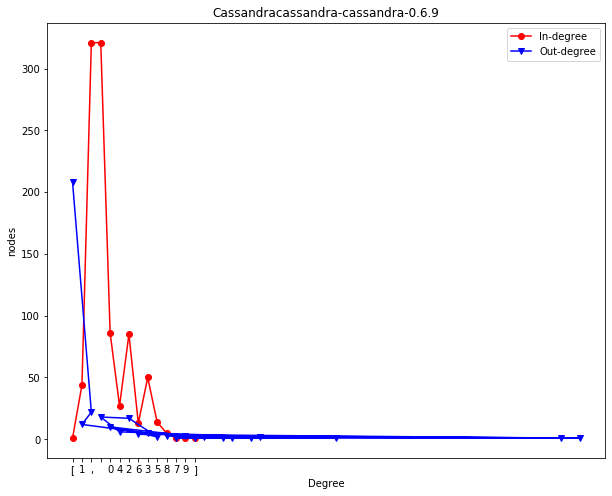

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.0.png
__________________


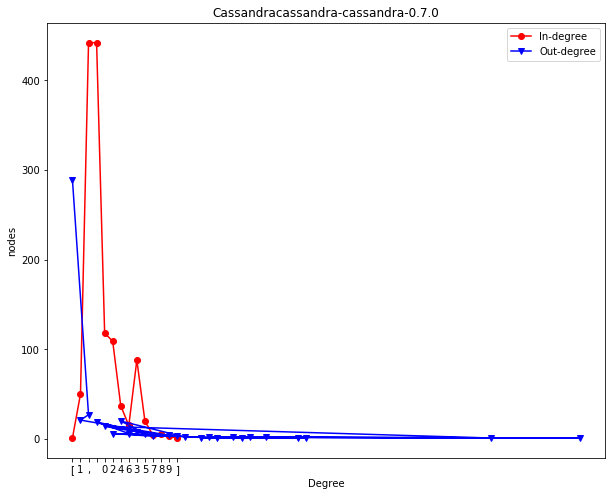

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.1.png
__________________


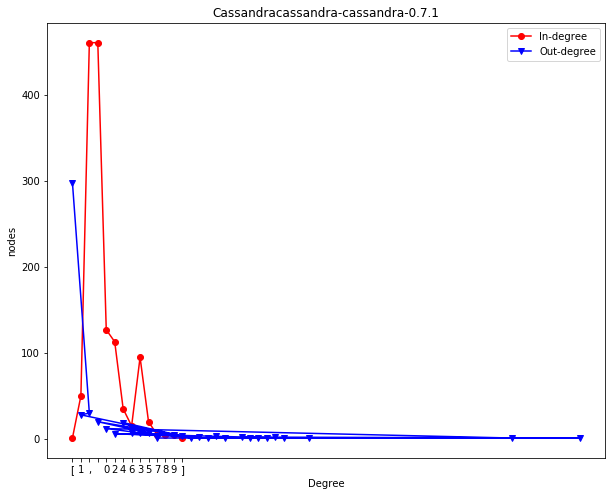

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.10.png
__________________


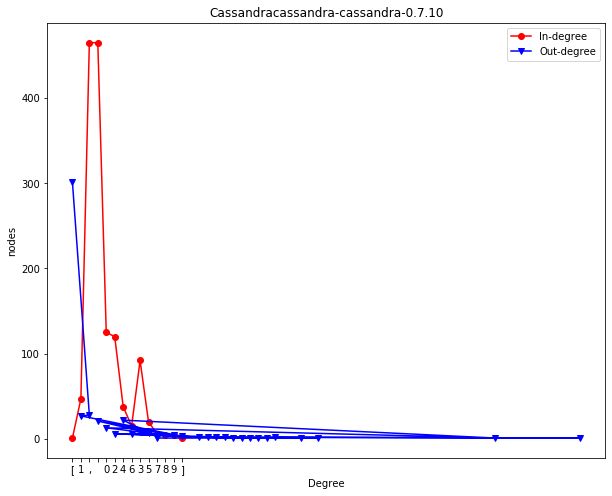

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.2.png
__________________


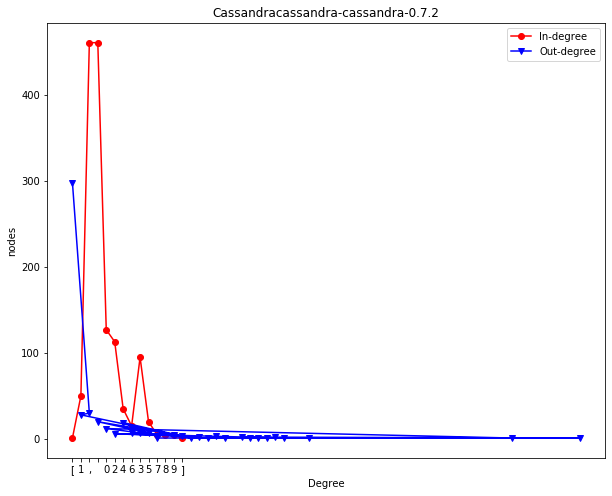

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.3.png
__________________


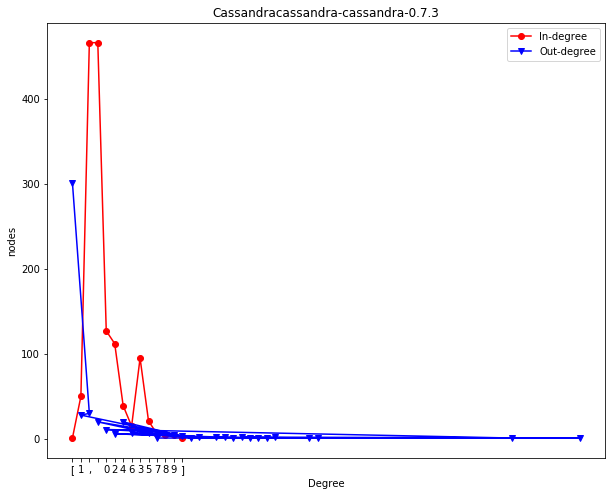

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.4.png
__________________


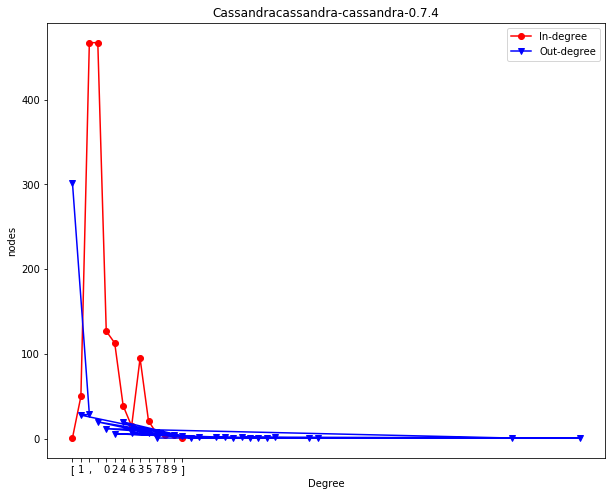

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.5.png
__________________


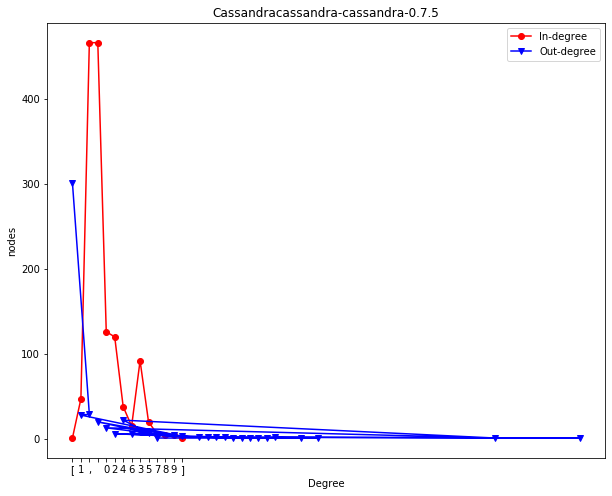

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.6.png
__________________


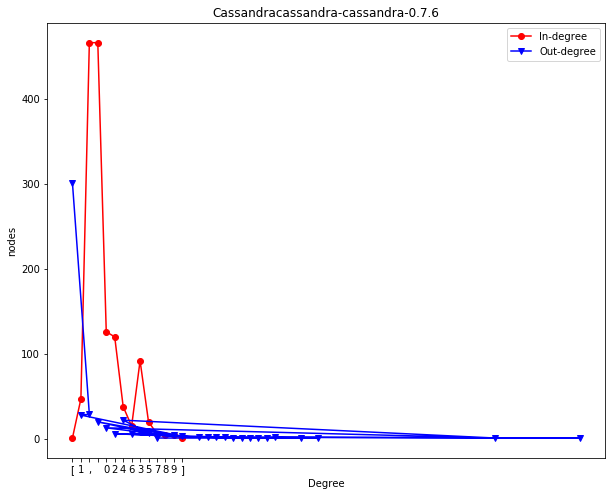

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.6-2.png
__________________


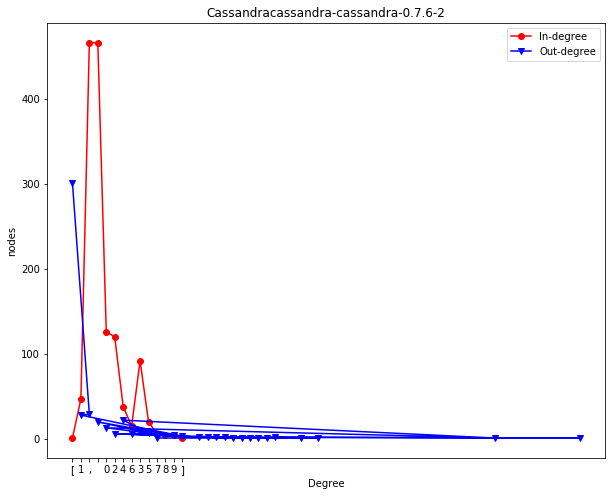

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.7.png
__________________


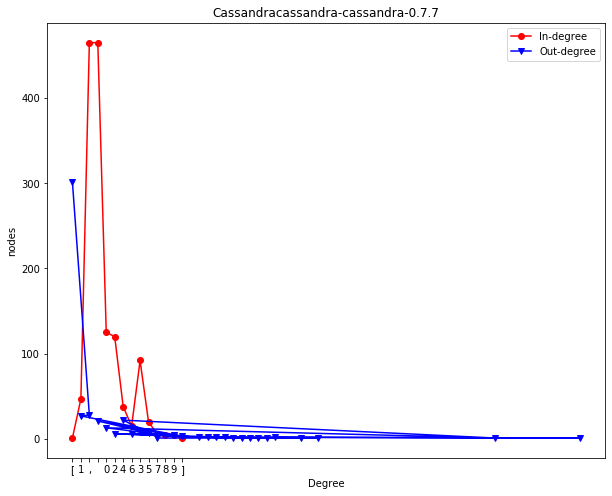

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.8.png
__________________


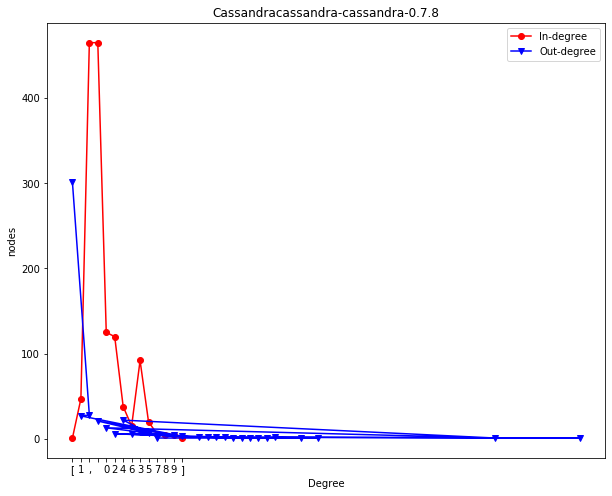

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.7.9.png
__________________


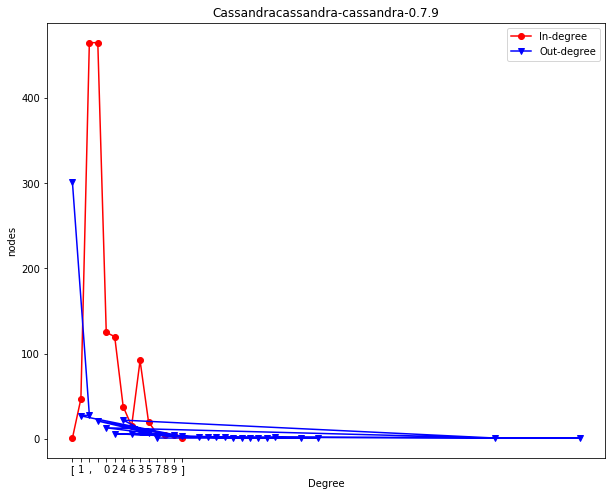

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.0.png
__________________


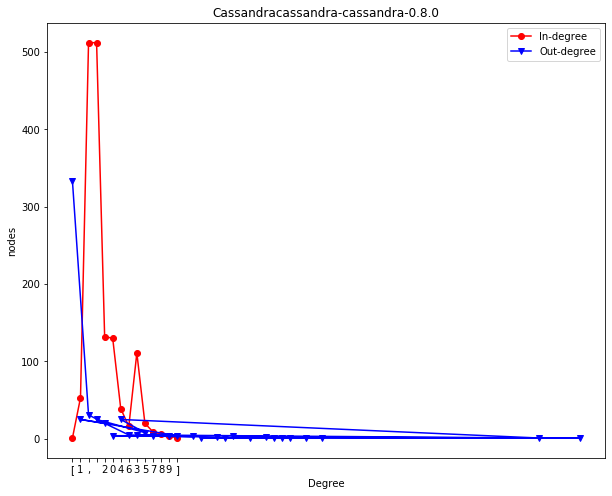

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.1.png
__________________


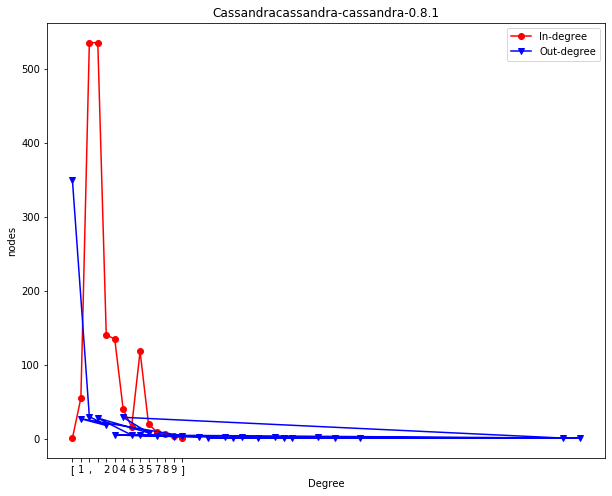

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.10.png
__________________


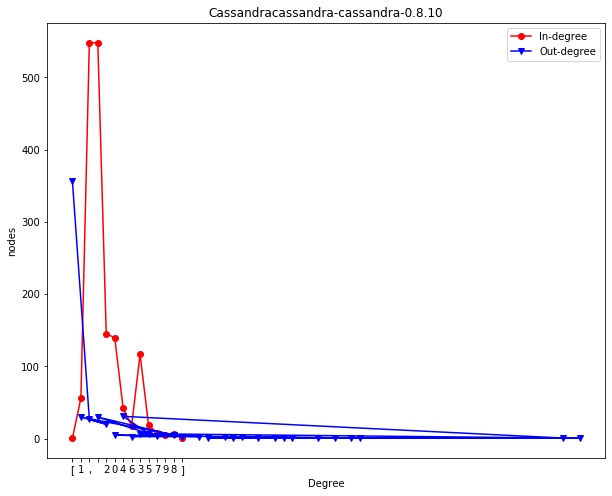

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.2.png
__________________


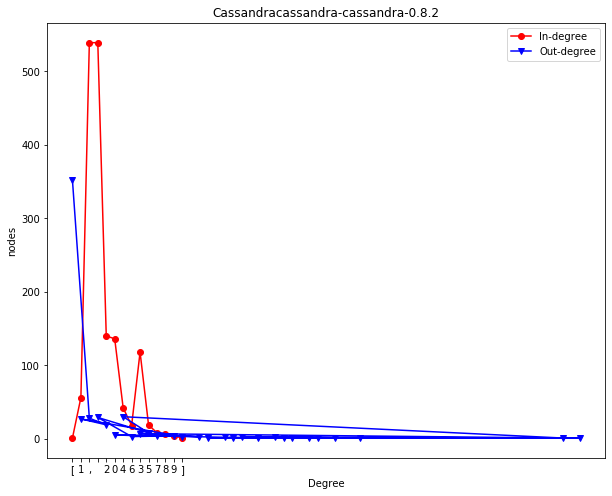

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.3.png
__________________


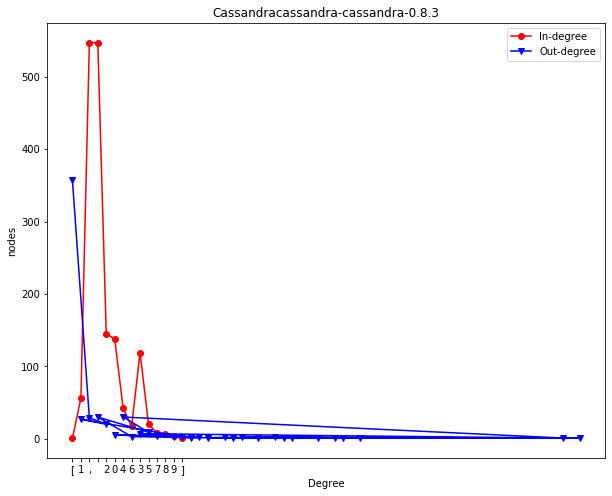

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.4.png
__________________


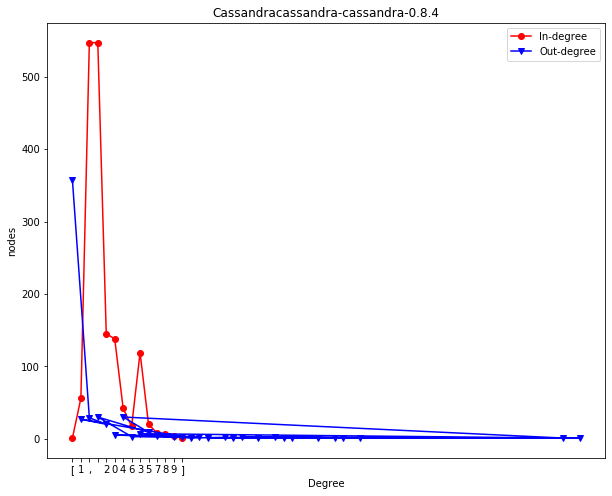

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.5.png
__________________


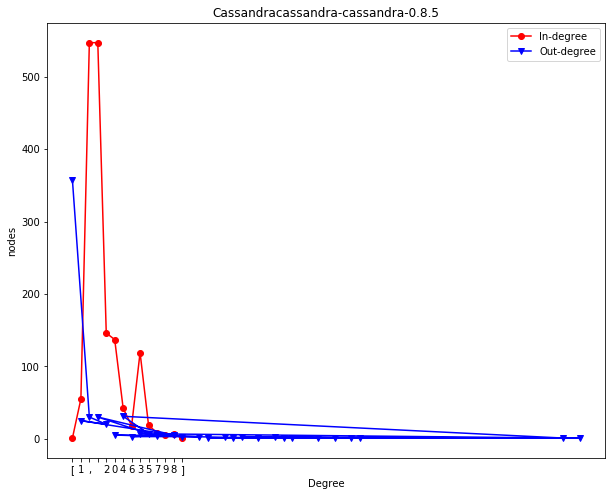

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.6.png
__________________


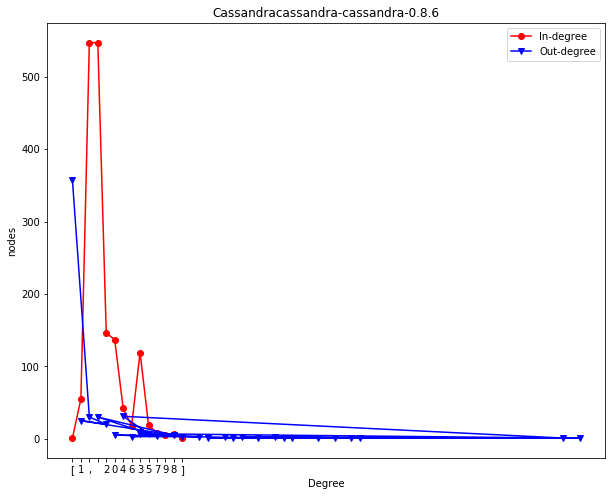

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.7.png
__________________


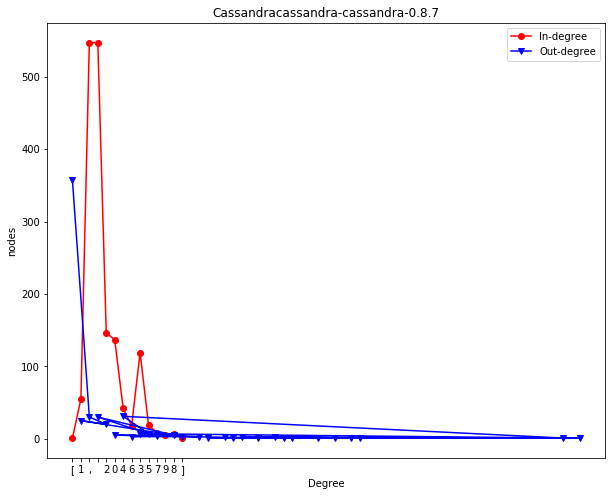

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.8.png
__________________


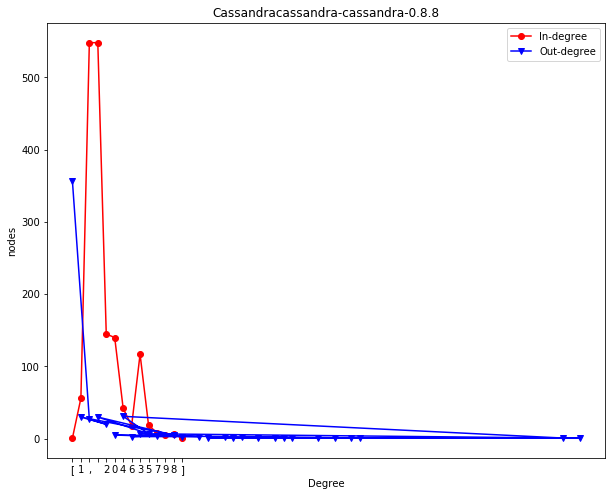

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-0.8.9.png
__________________


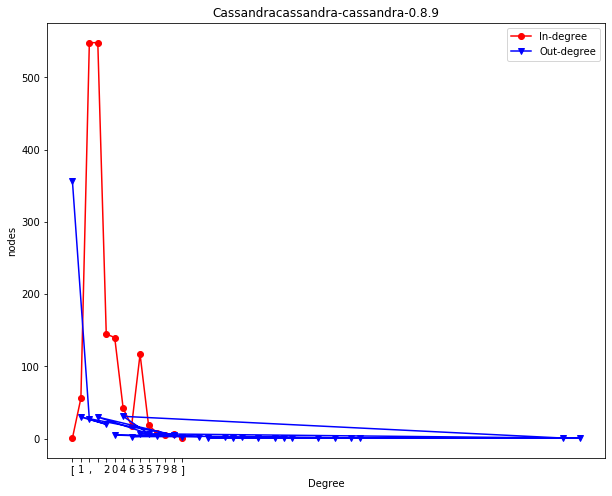

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.0.png
__________________


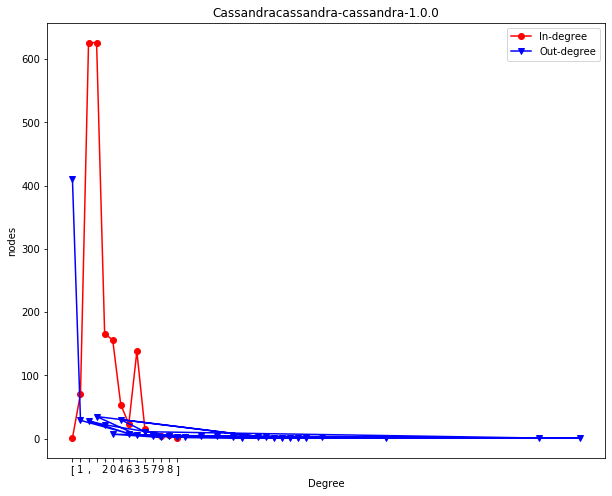

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.1.png
__________________


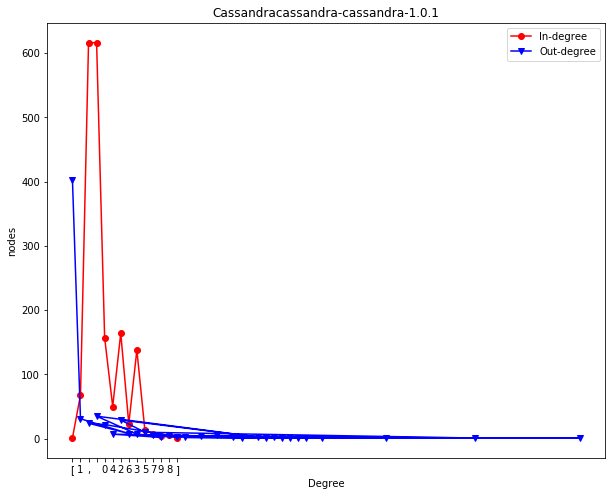

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.10.png
__________________


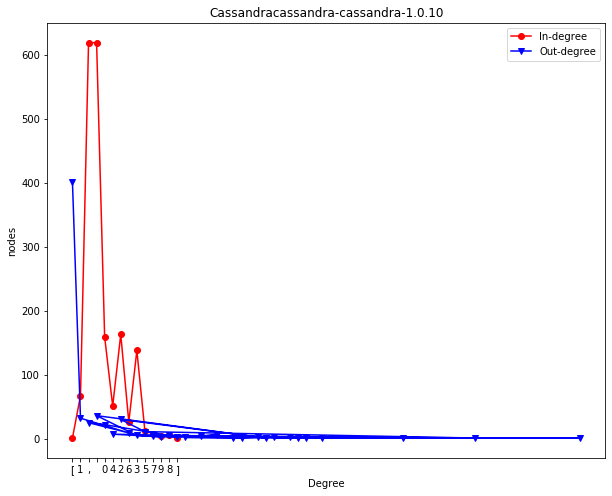

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.11.png
__________________


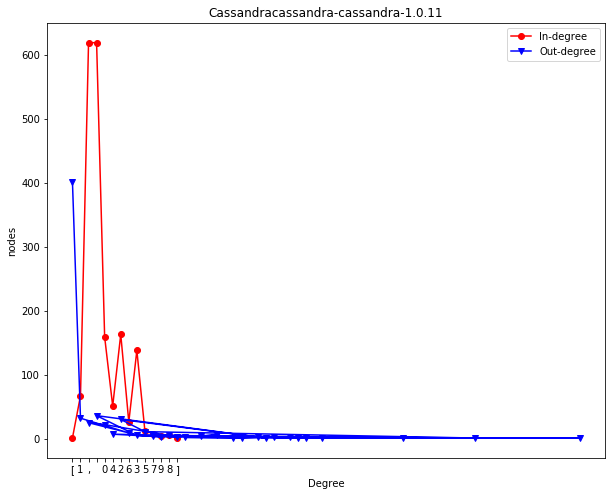

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.12.png
__________________


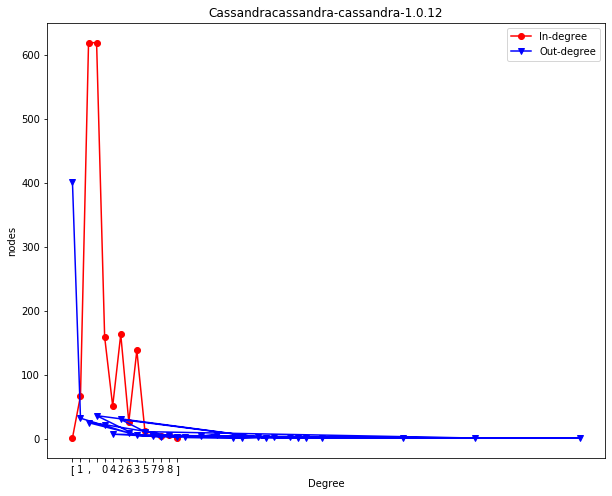

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.2.png
__________________


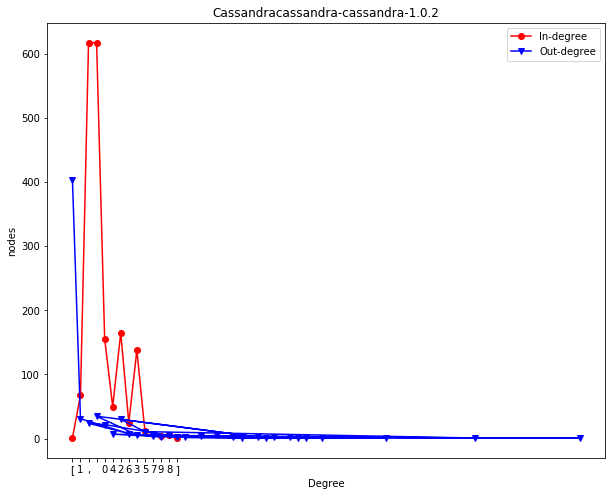

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.3.png
__________________


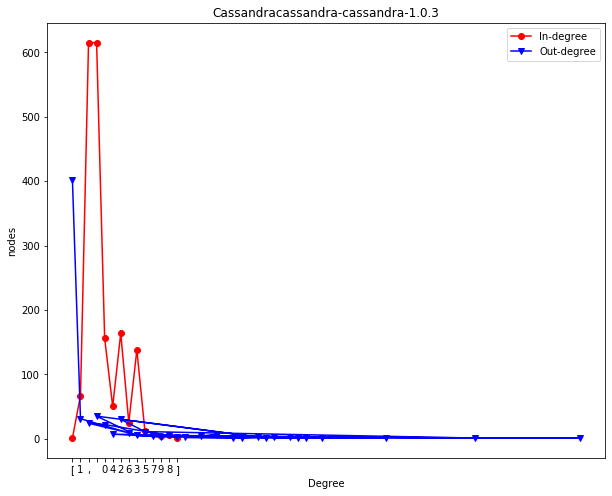

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.4.png
__________________


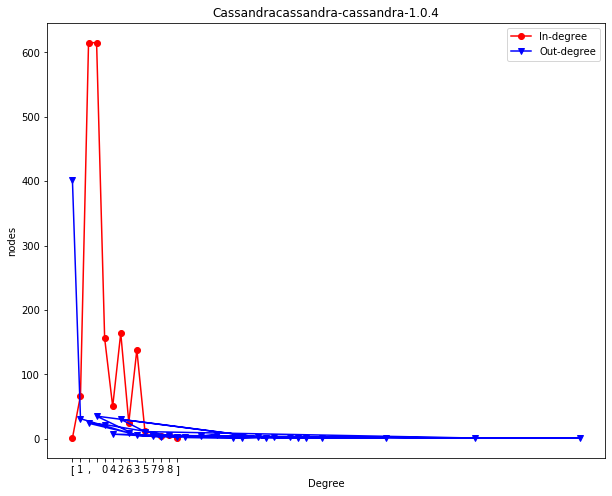

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.5.png
__________________


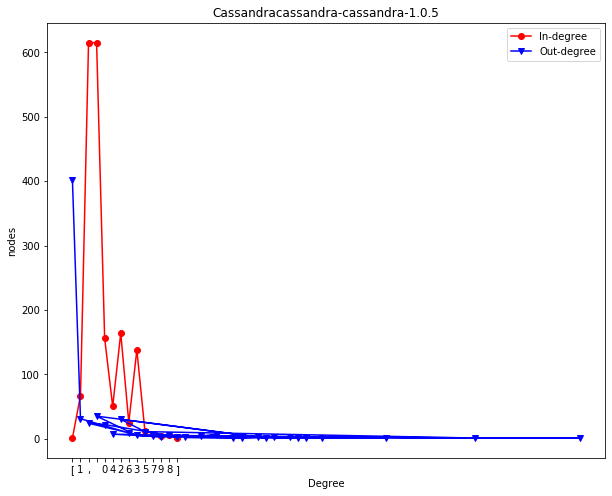

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.6.png
__________________


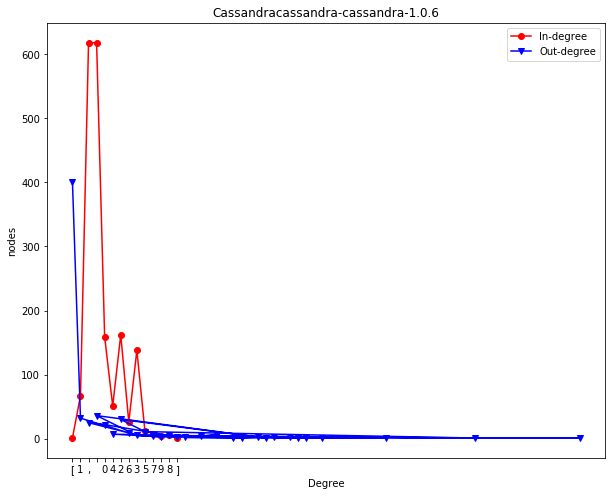

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.7.png
__________________


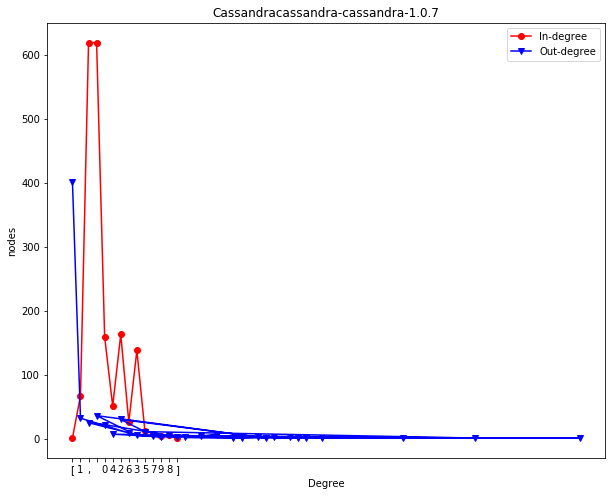

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.8.png
__________________


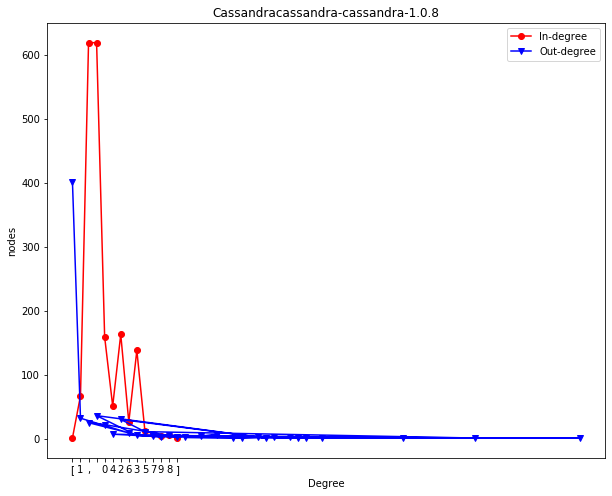

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.0.9.png
__________________


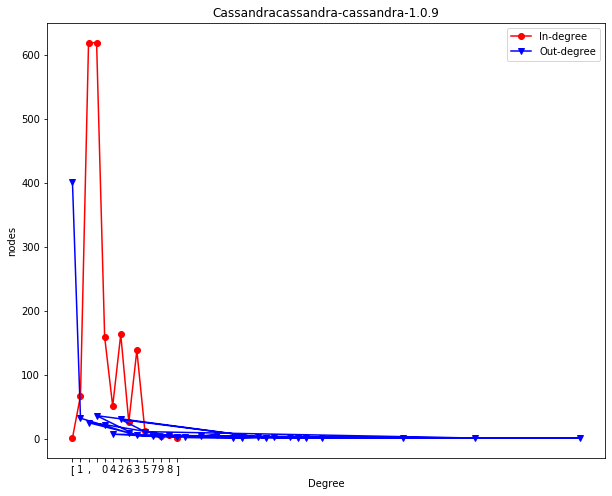

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.0.png
__________________


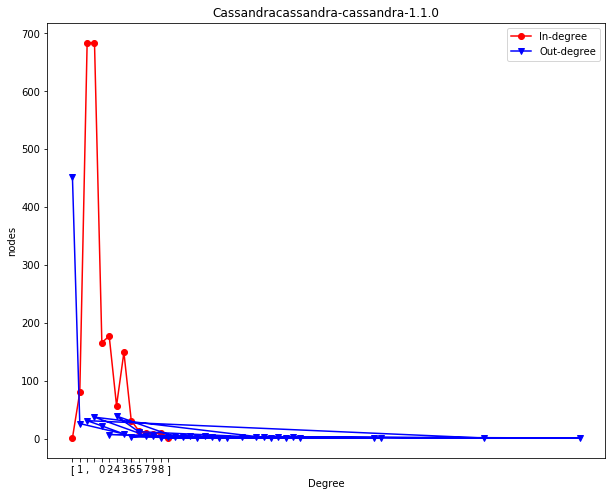

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.1.png
__________________


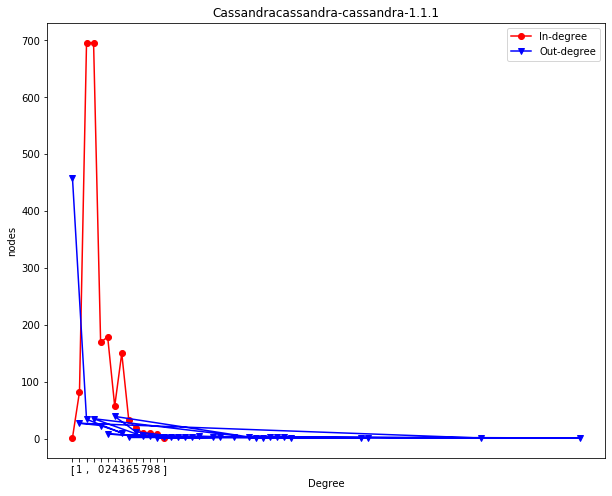

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.10.png
__________________


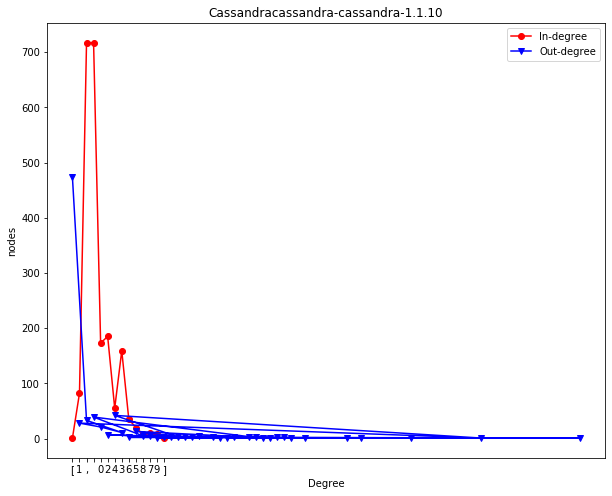

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.11.png
__________________


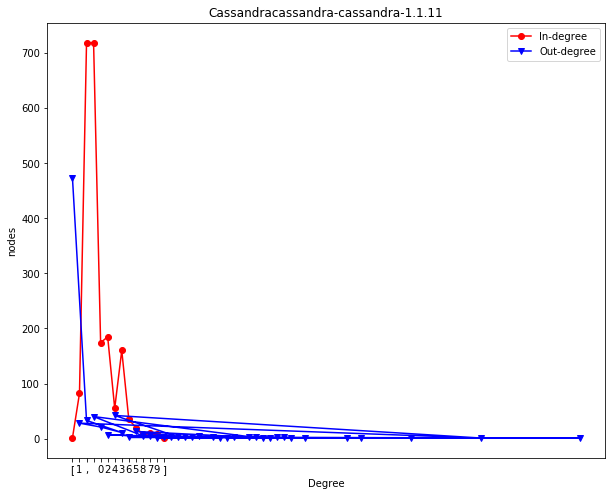

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.12.png
__________________


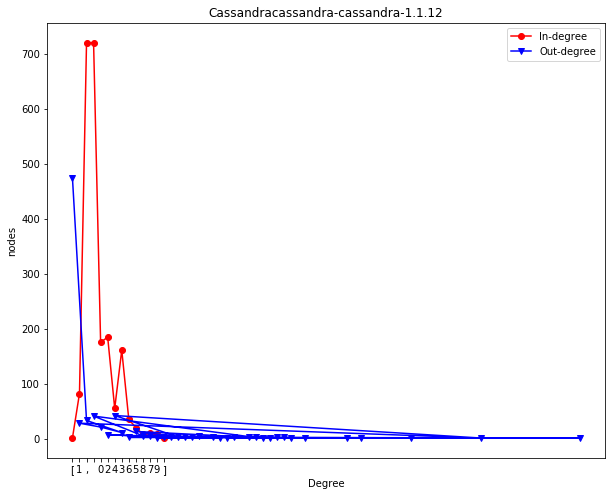

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.2.png
__________________


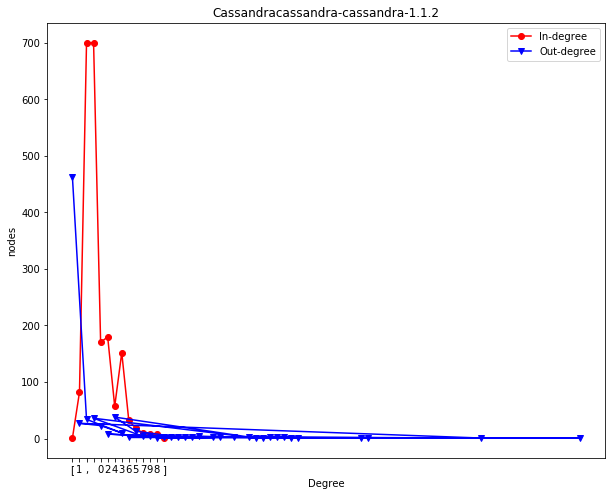

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.3.png
__________________


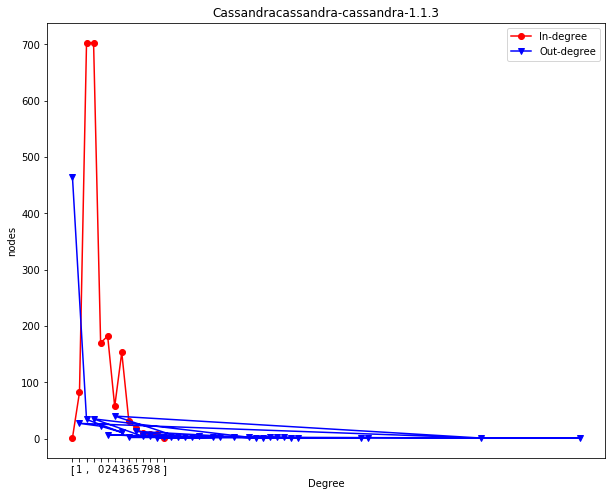

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.4.png
__________________


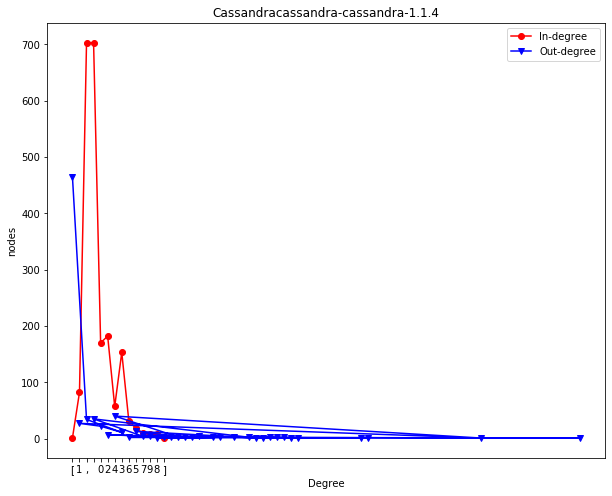

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.5.png
__________________


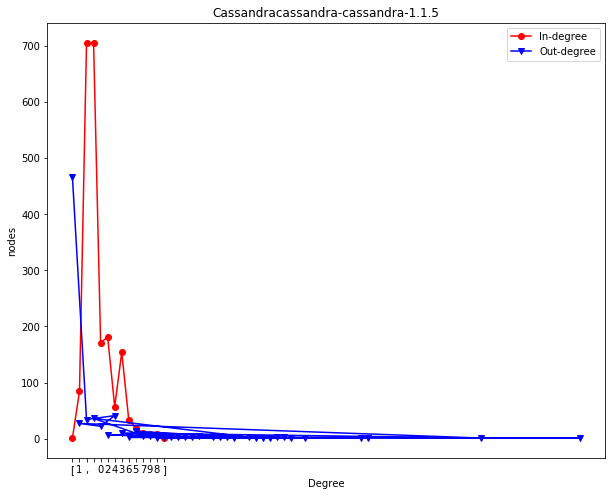

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.6.png
__________________


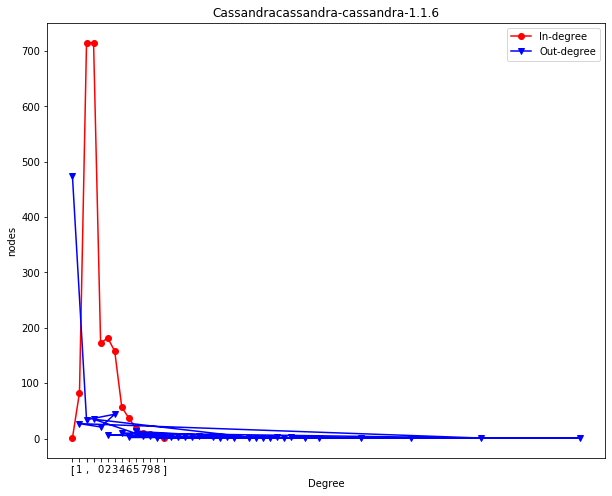

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.7.png
__________________


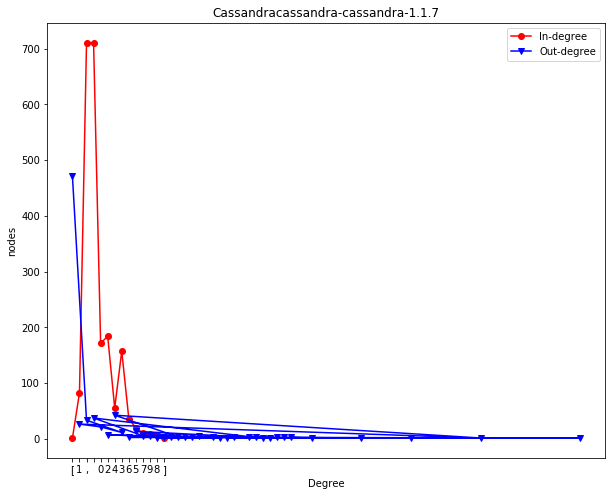

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.8.png
__________________


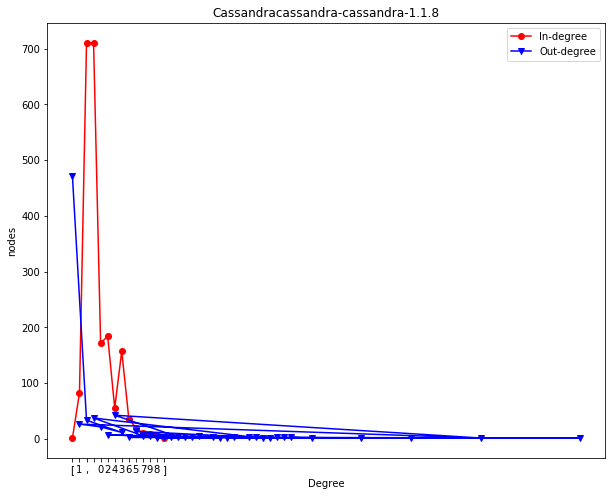

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.1.9.png
__________________


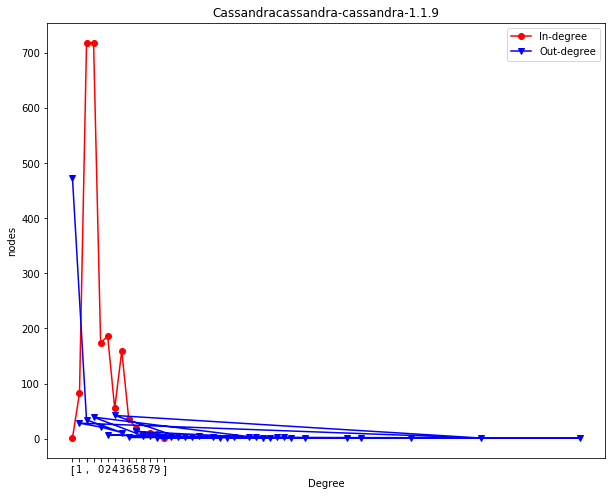

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.0.png
__________________


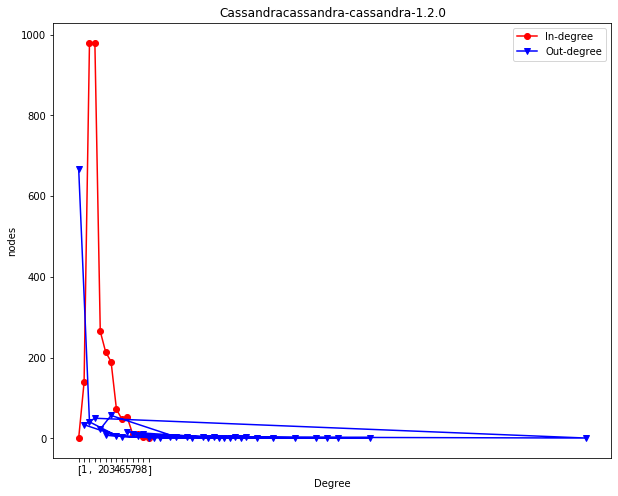

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.1.png
__________________


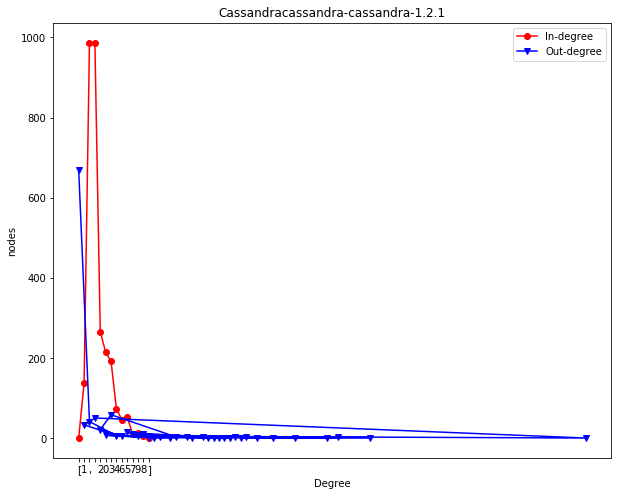

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.10.png
__________________


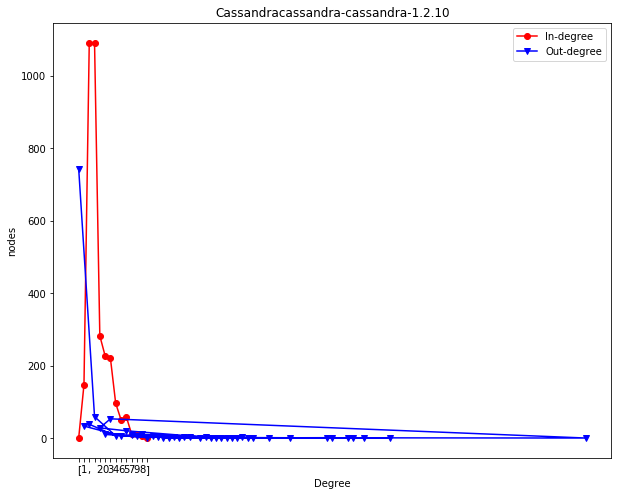

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.2.png
__________________


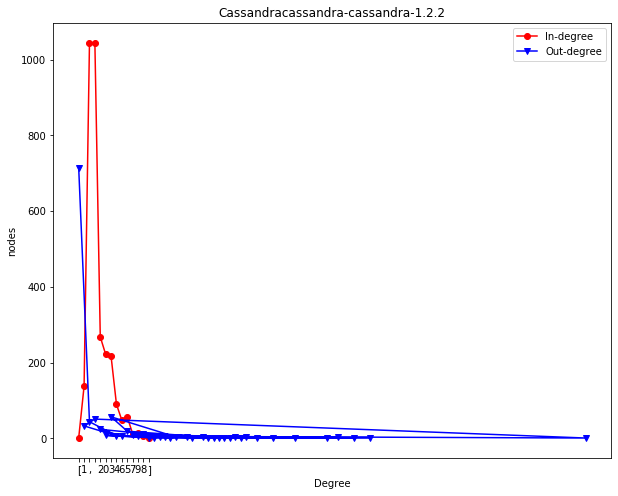

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.3.png
__________________


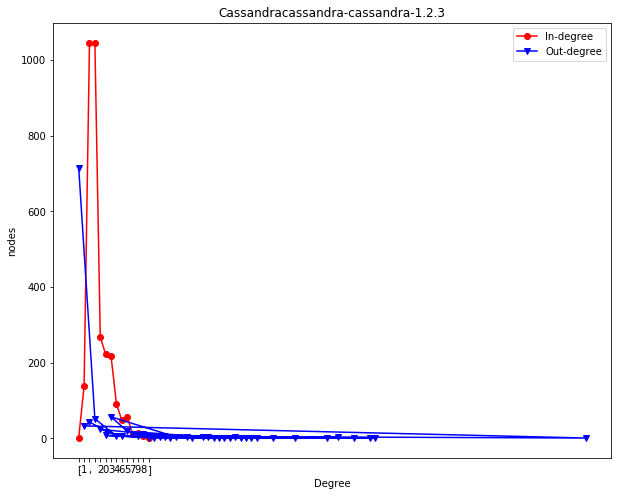

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.4.png
__________________


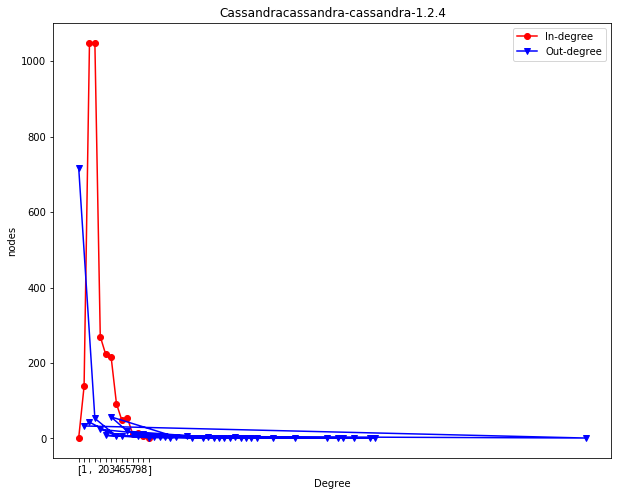

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.5.png
__________________


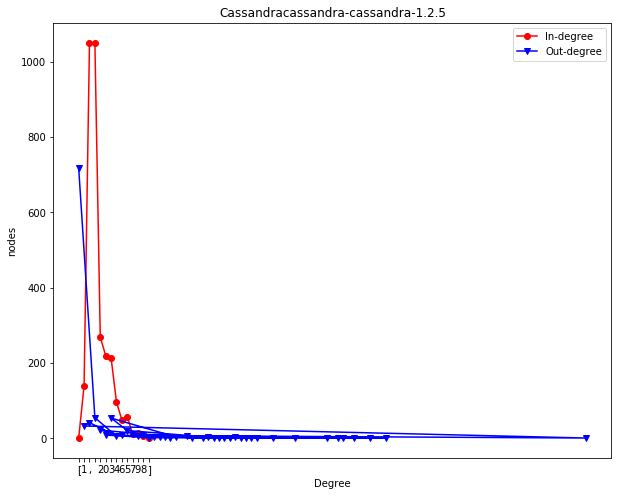

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.6.png
__________________


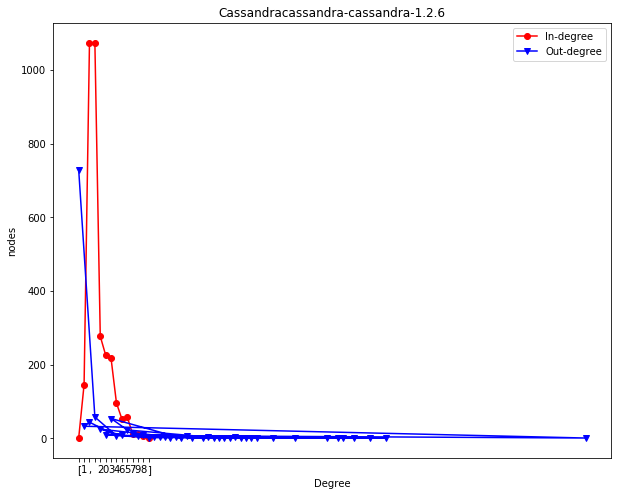

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.7.png
__________________


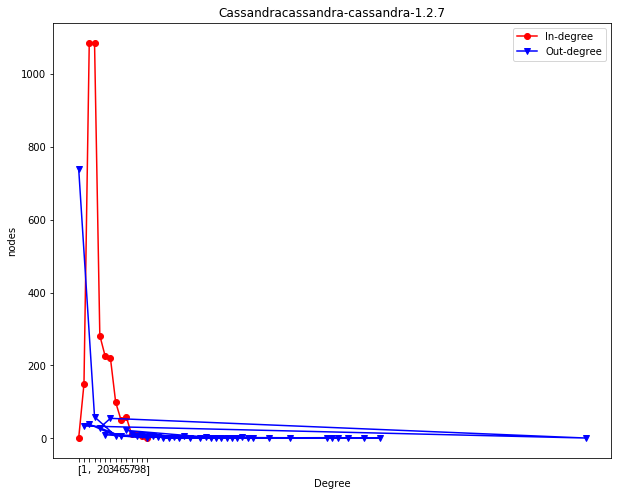

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.8.png
__________________


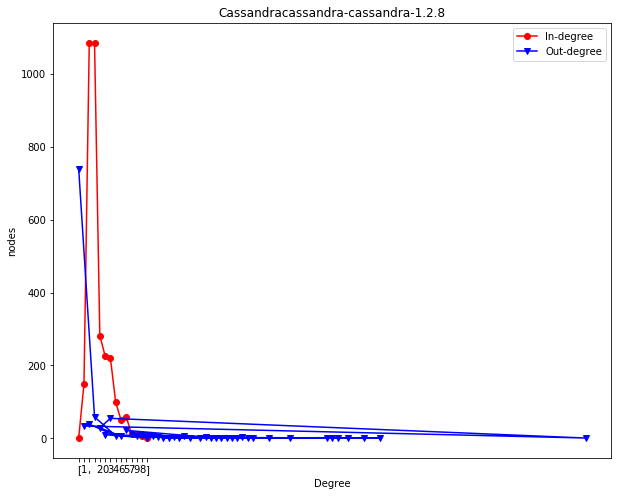

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-1.2.9.png
__________________


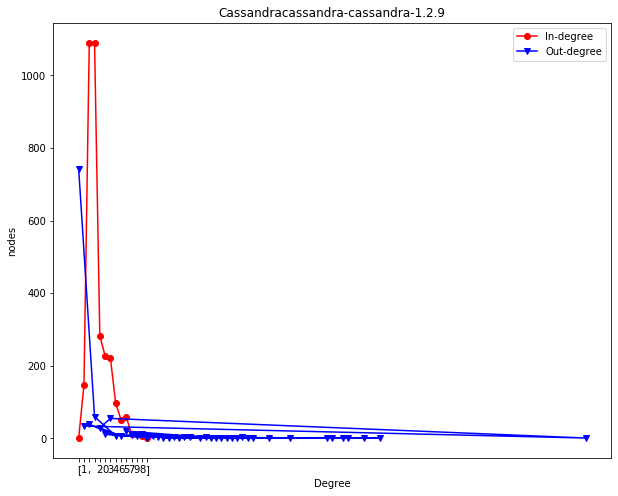

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-2.0.0.png
__________________


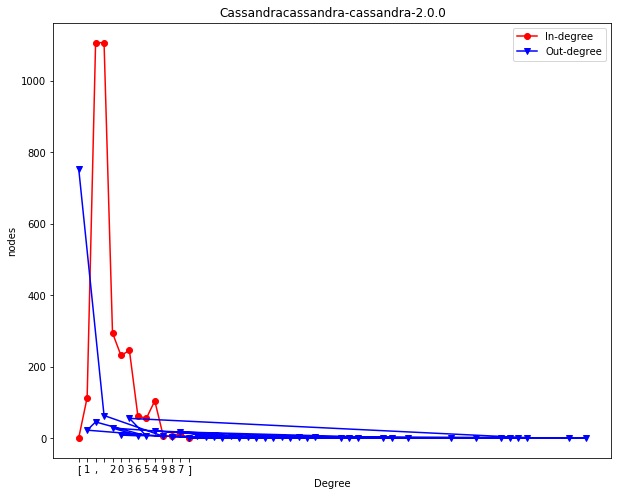

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Cassandra/Degree_Inh/Cassandracassandra-cassandra-2.0.1.png
__________________


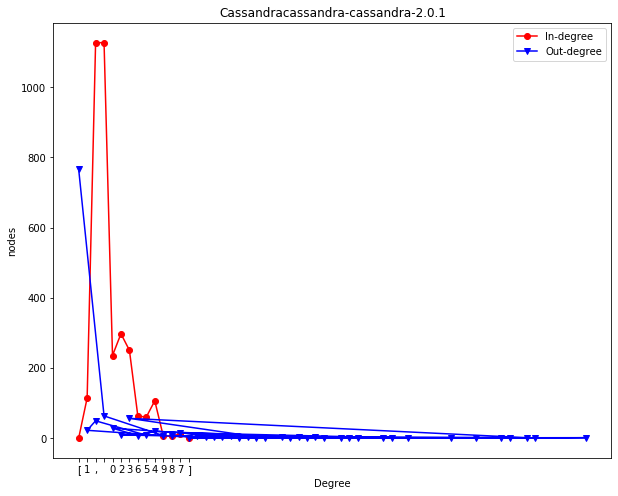

met_files  : ['Chukwa_Call_mat.csv', 'chukwa_cdot_m.csv', 'chukwa_colldot_m.csv', 'Chukwa_Coll_mat.csv', 'Chukwa_heat_s_call_fixed.png', 'Chukwa_heat_s_collab_fixed.png', 'Chukwa_heat_s_Inh_fixed.png', 'chukwa_Inhdot_m.csv', 'Chukwa_Inh_mat.csv', 'Chukwa_metrics.csv', 'Degree_cdot', 'Degree_coll', 'Degree_Inh', 'scatter_plots']
s_path D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/chukwa_Inhdot_m.csv
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/Chukwachukwa-release-0.1.2.png
__________________


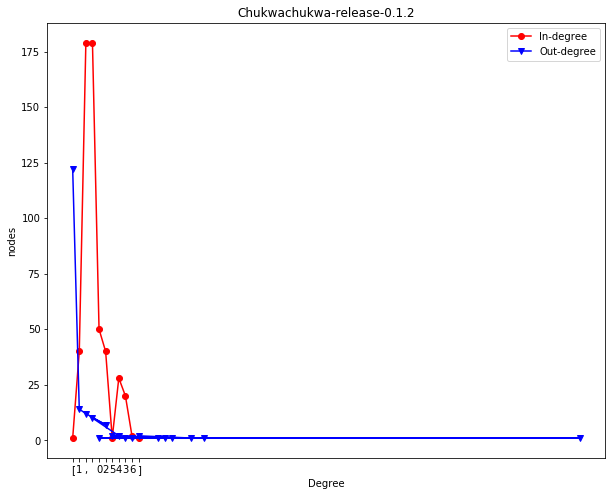

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/Chukwachukwa-chukwa-0.2.0.png
__________________


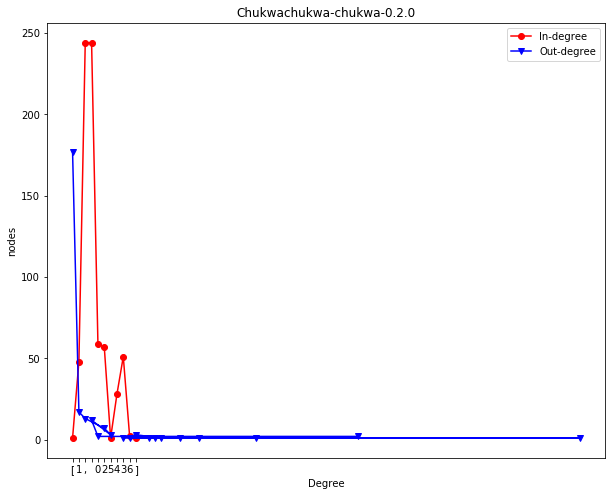

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/Chukwachukwa-chukwa-0.4.0.png
__________________


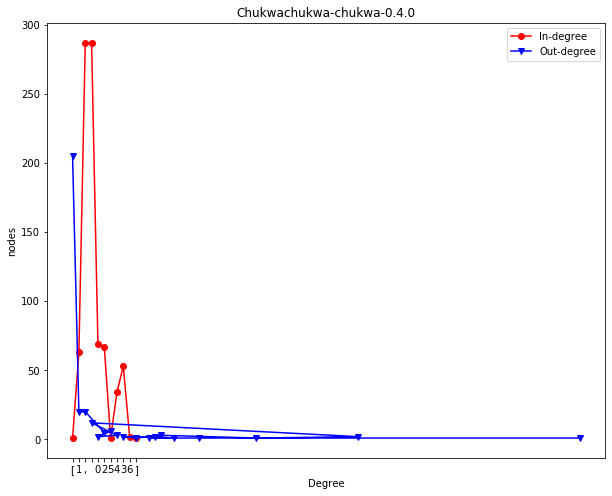

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/Chukwachukwa-chukwa-0.5.0.png
__________________


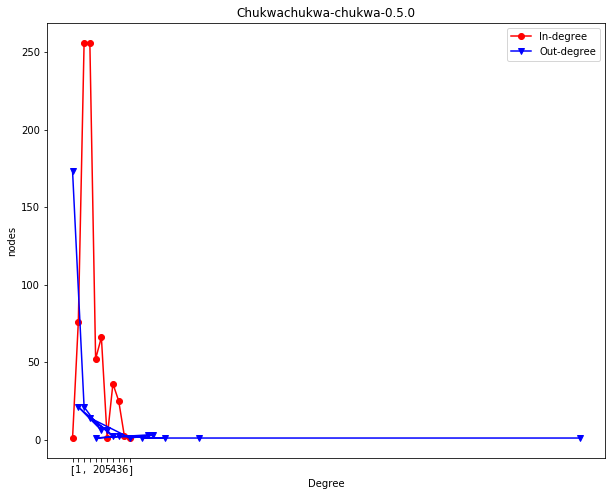

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/Chukwachukwa-chukwa-0.7.0.png
__________________


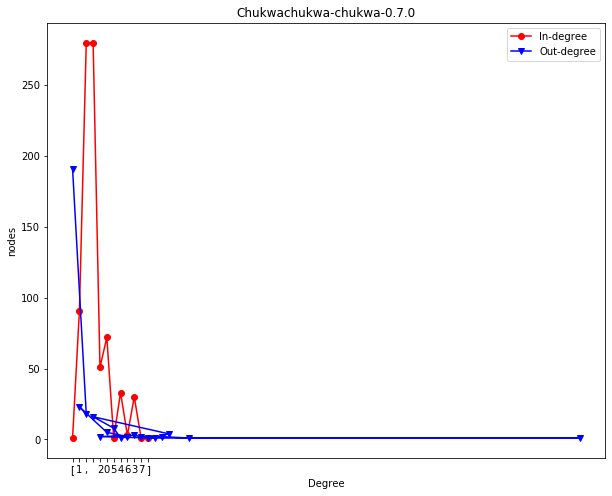

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Chukwa/Degree_Inh/Chukwachukwa-chukwa-0.8.0.png
__________________


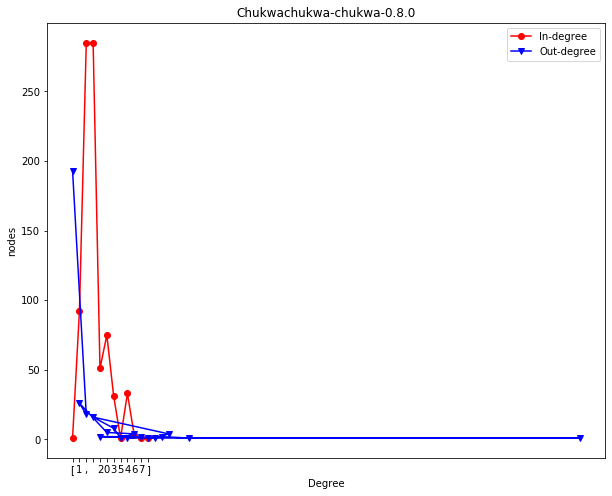

met_files  : ['Degree_cdot', 'Degree_coll', 'Degree_Inh', 'httpClient_heat_s_call_fixed.png', 'httpClient_heat_s_collab_fixed.png', 'httpClient_heat_s_Inh_fixed.png', 'http_Call_mat.csv', 'http_cdot_m.csv', 'http_colldot_m.csv', 'http_Coll_mat.csv', 'http_Inhdot_m.csv', 'http_Inh_mat.csv', 'http_metrics.csv', 'scatter_plots']
s_path D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/
D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/http_Inhdot_m.csv
D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4_0_API_FREEZE.png
__________________


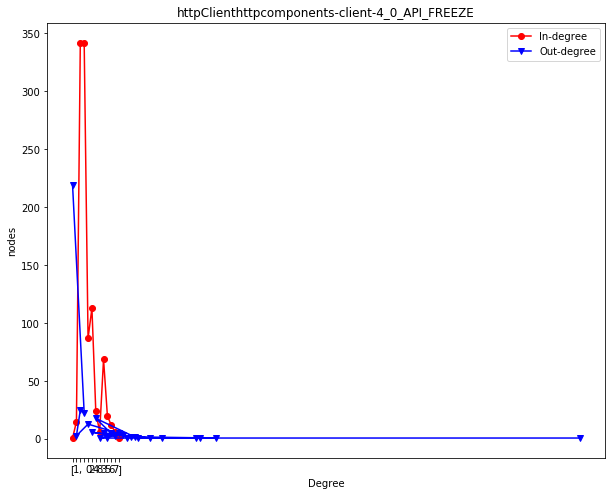

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.0.2-RC1.png
__________________


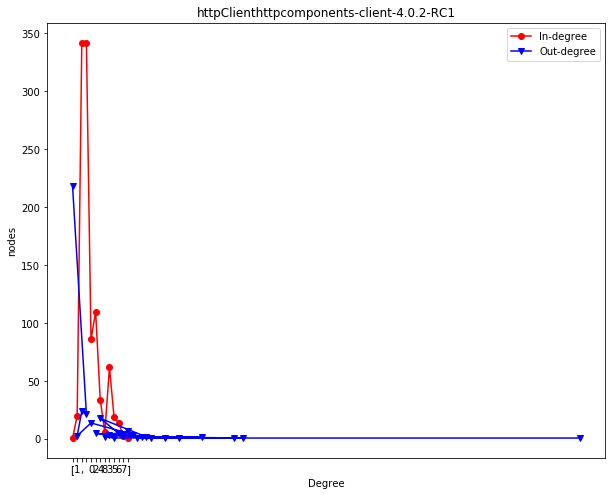

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.0.2-RC2.png
__________________


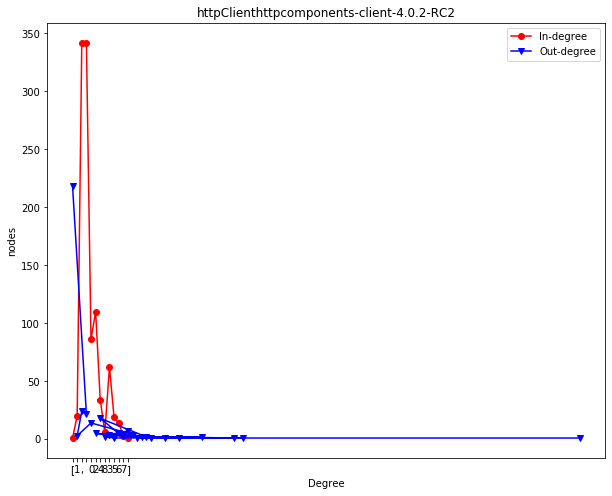

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.0.2-RC3.png
__________________


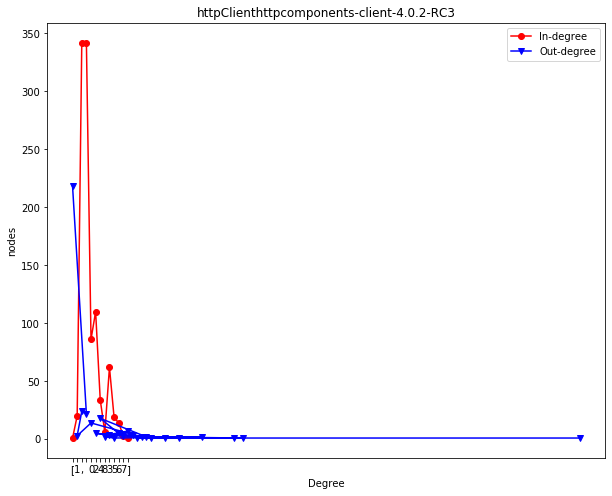

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.0.3-RC1.png
__________________


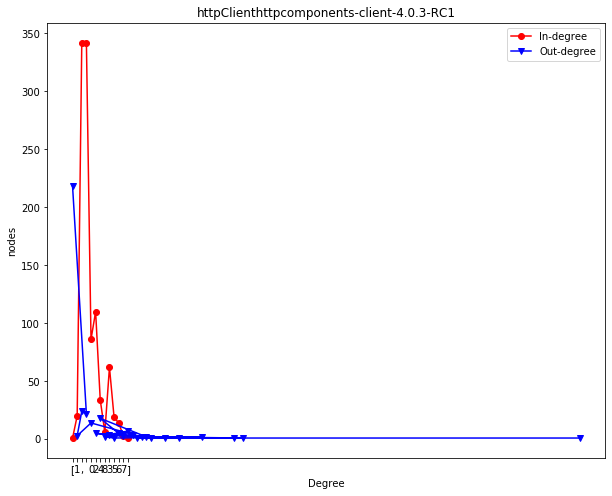

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.1-siteupdate.png
__________________


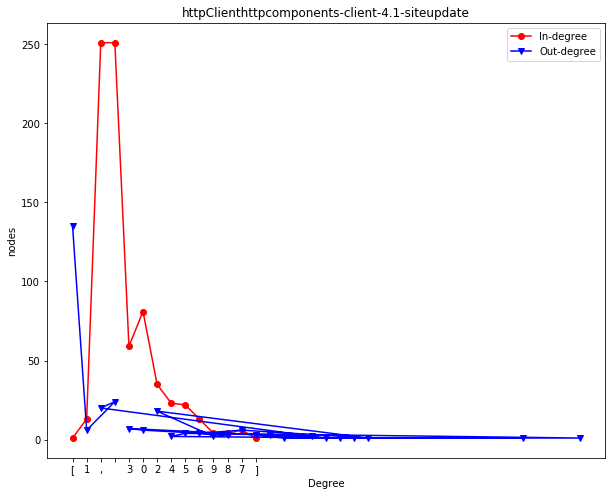

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.1-RC1.png
__________________


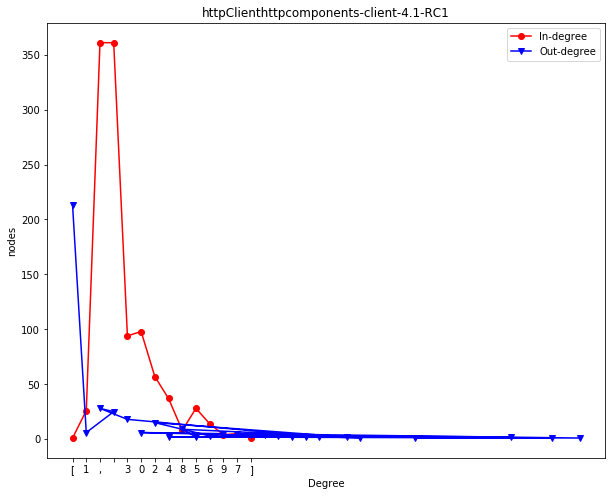

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.1-RC2.png
__________________


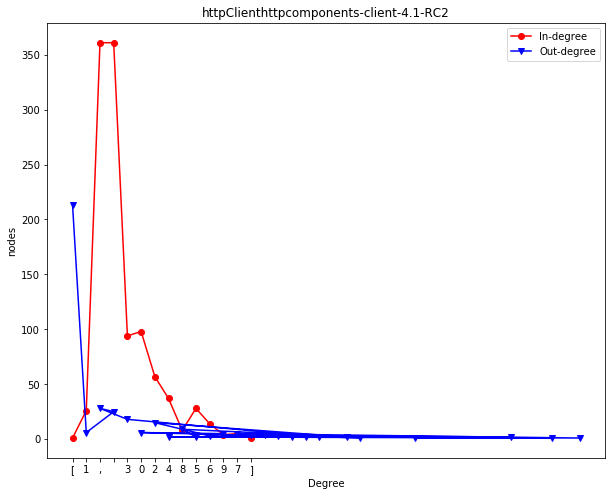

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.1-RC3.png
__________________


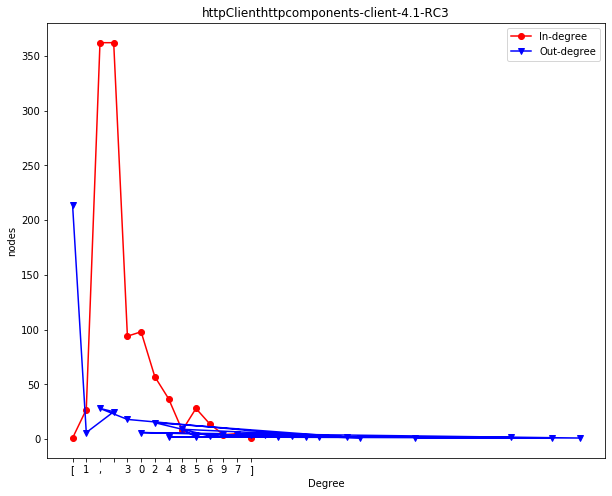

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2-RC1.png
__________________


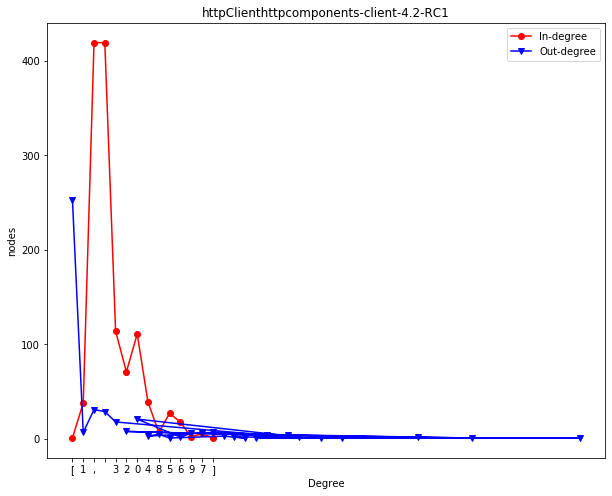

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2-RC2.png
__________________


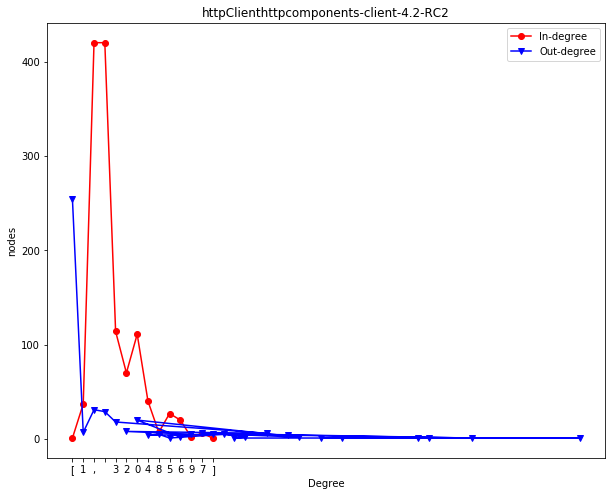

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.1-RC1.png
__________________


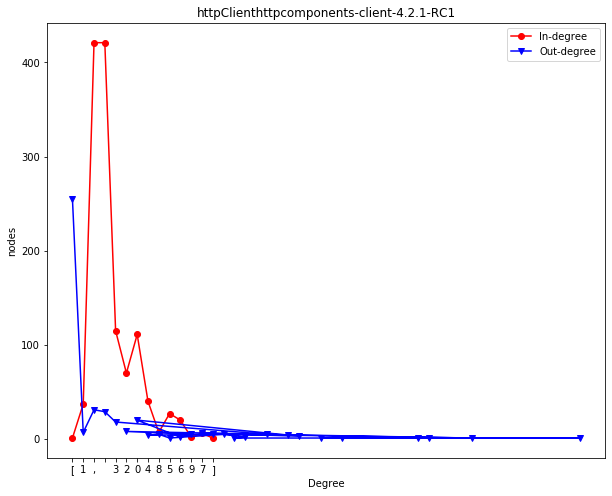

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.2-RC1.png
__________________


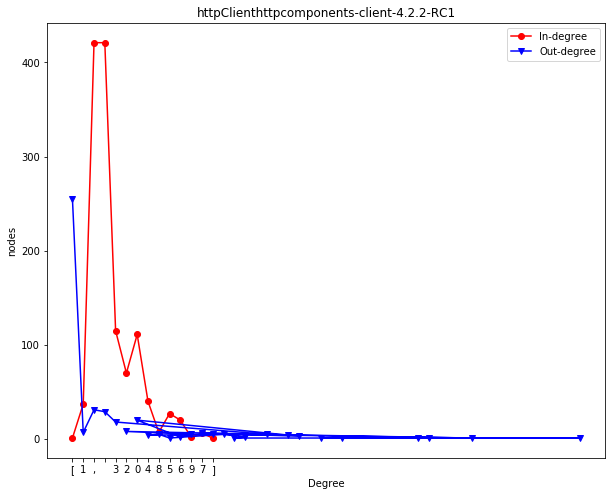

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.3-RC1.png
__________________


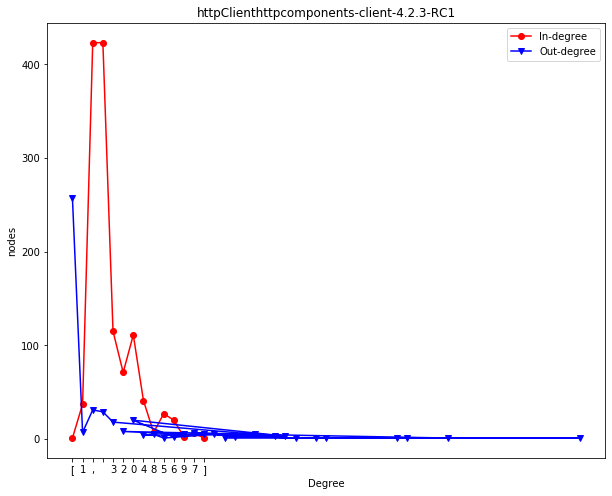

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.3-RC2.png
__________________


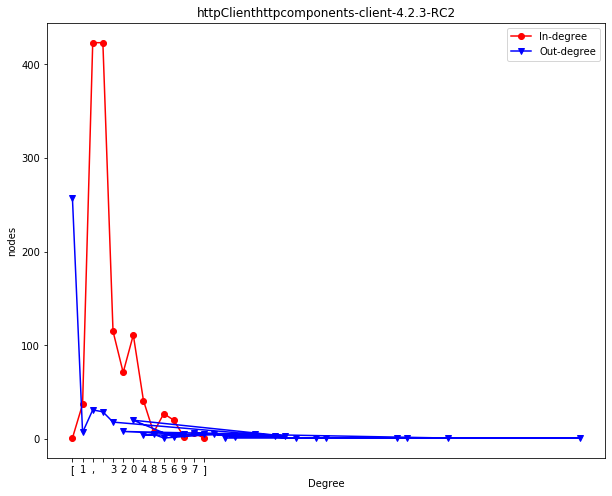

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.3-RC3.png
__________________


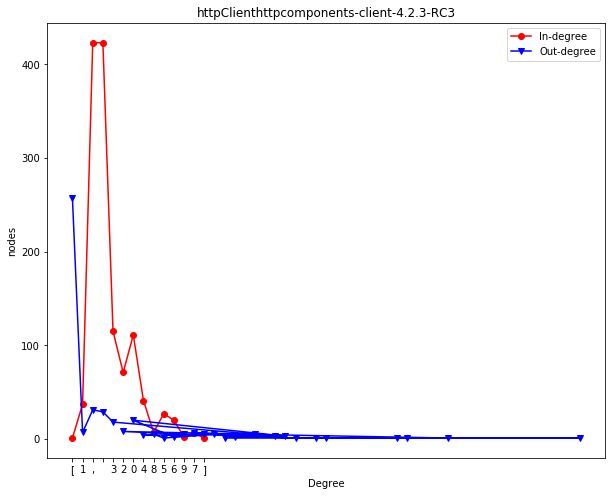

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.4-RC1.png
__________________


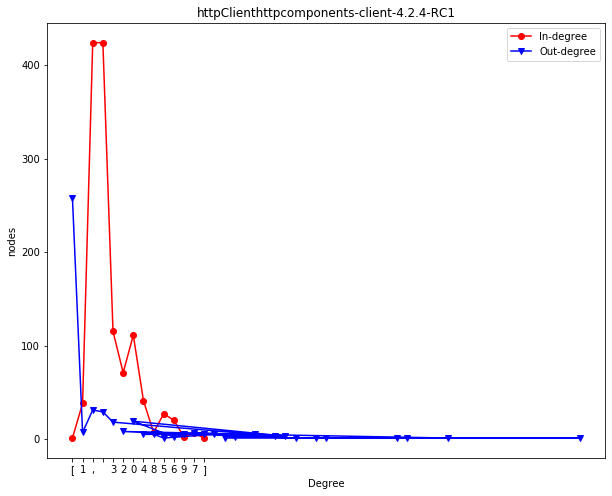

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.5-RC1.png
__________________


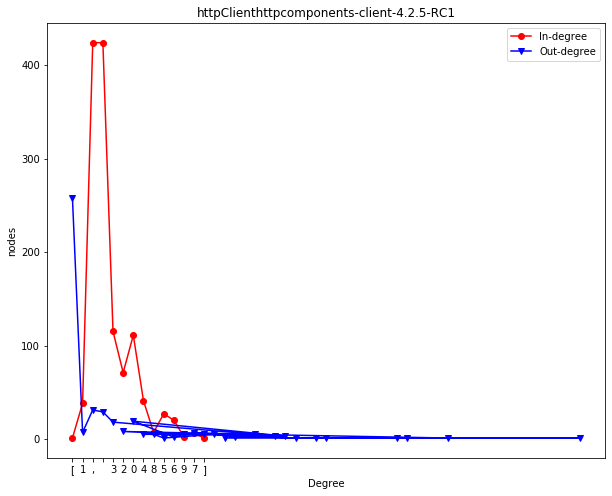

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.6-RC1.png
__________________


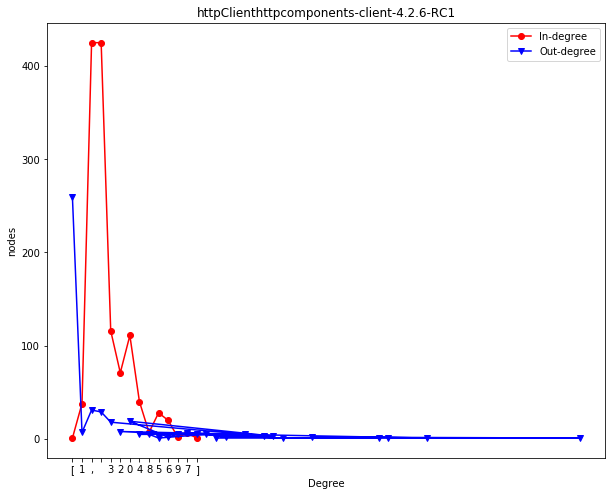

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.2.6-RC2.png
__________________


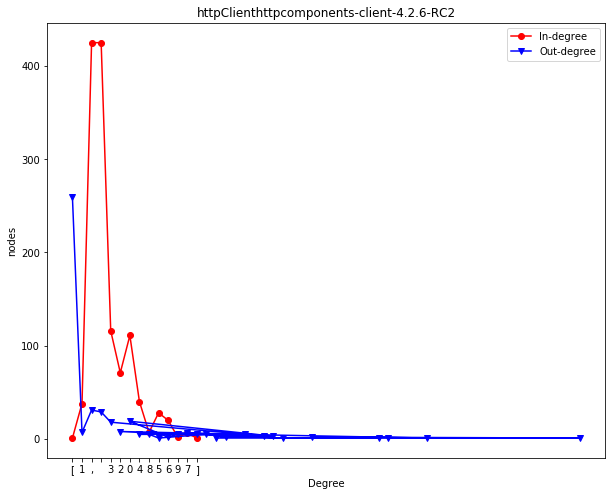

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3-RC1.png
__________________


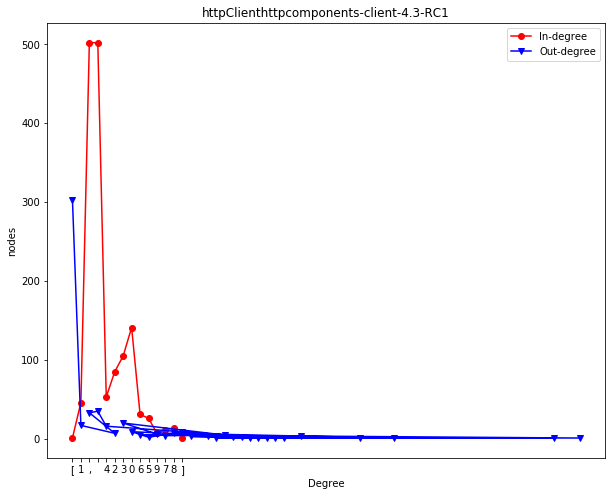

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.1-RC1.png
__________________


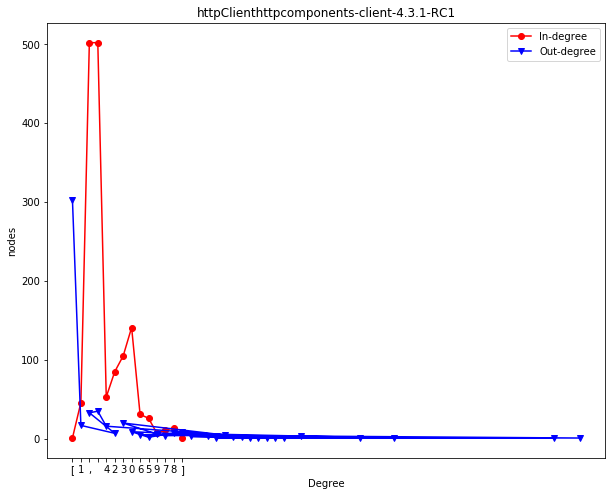

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.1-RC2.png
__________________


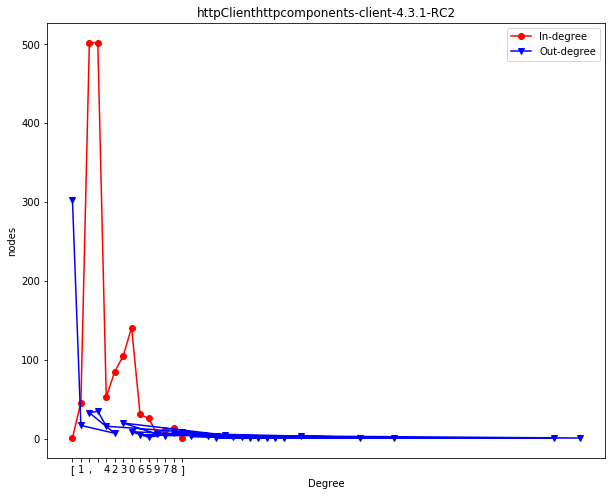

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.2-RC1.png
__________________


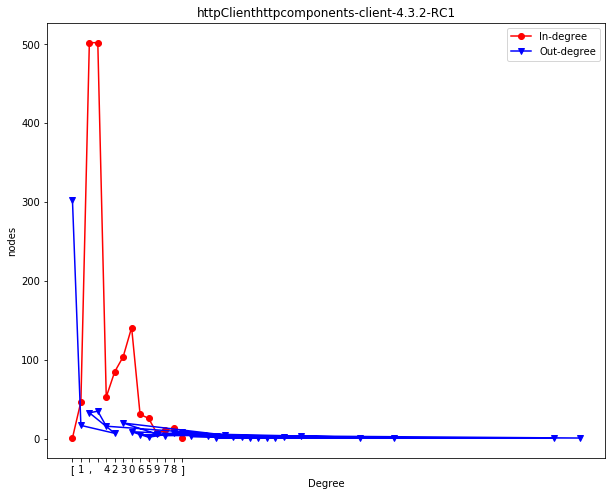

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.3-RC1.png
__________________


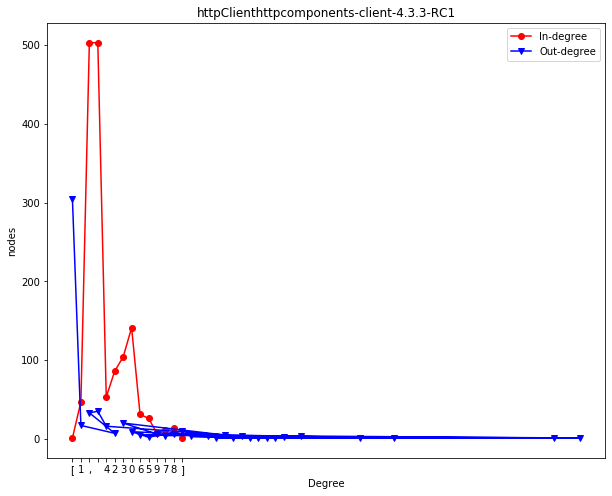

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.4-RC1.png
__________________


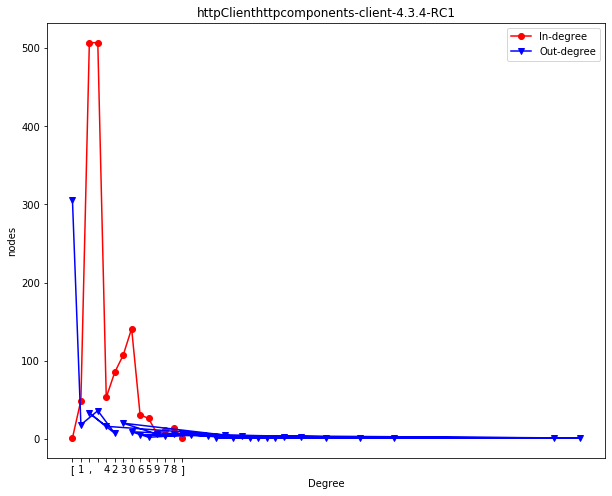

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.5-RC1.png
__________________


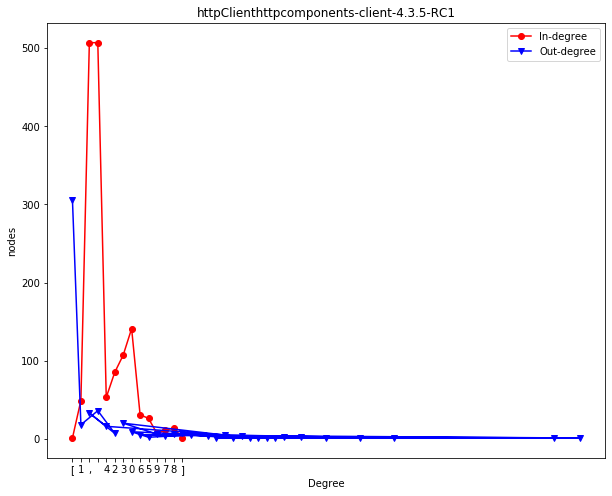

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.3.6-RC1.png
__________________


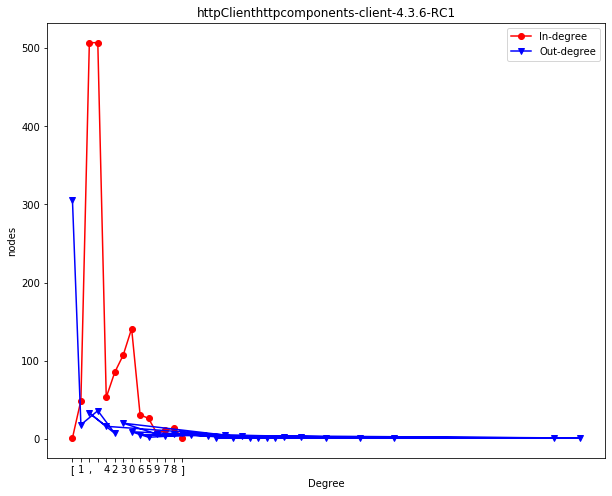

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.4-RC1.png
__________________


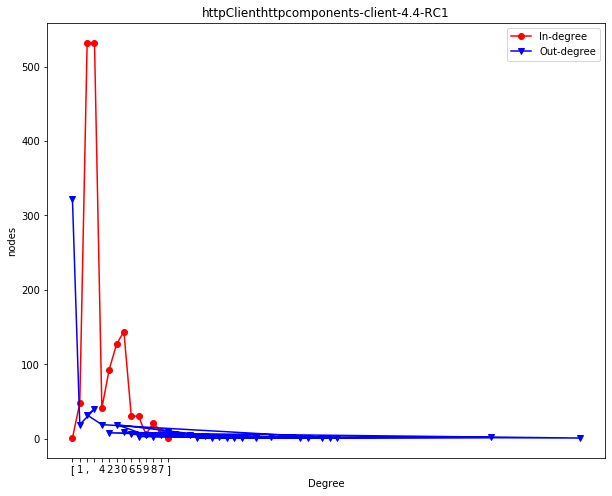

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.4-RC2.png
__________________


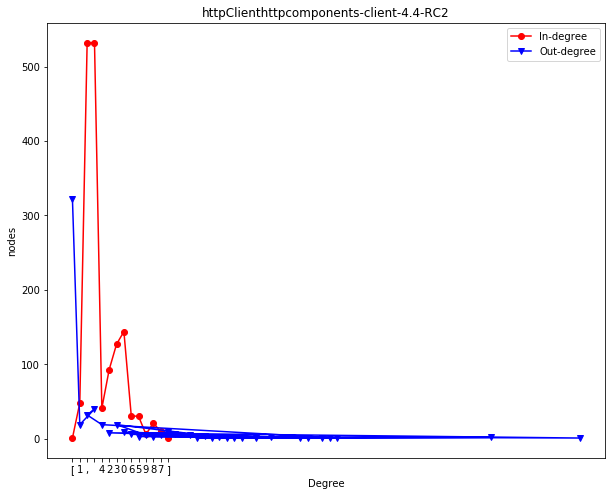

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.4.1-RC1.png
__________________


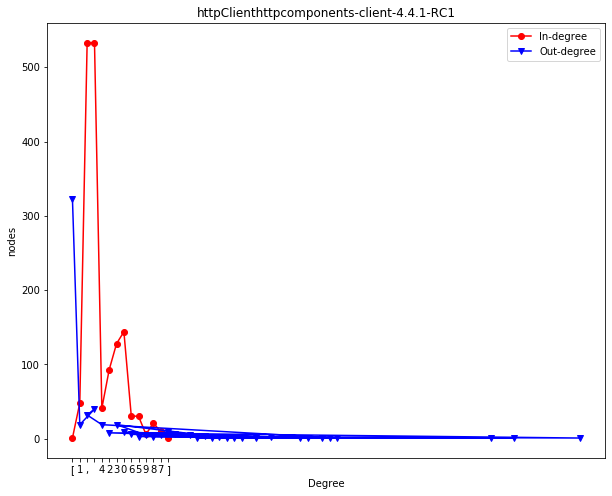

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.5-RC1.png
__________________


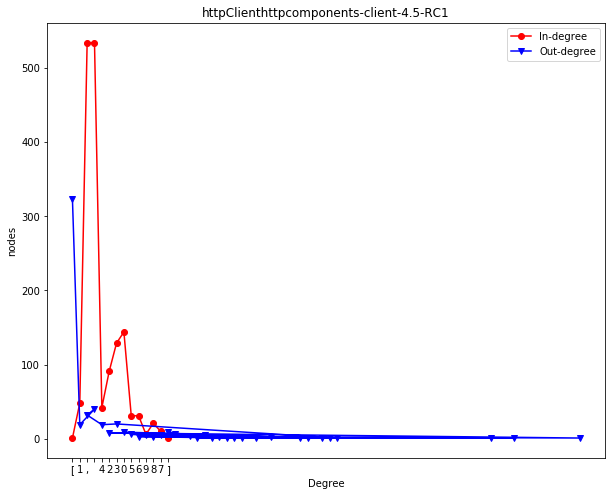

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.5-RC2.png
__________________


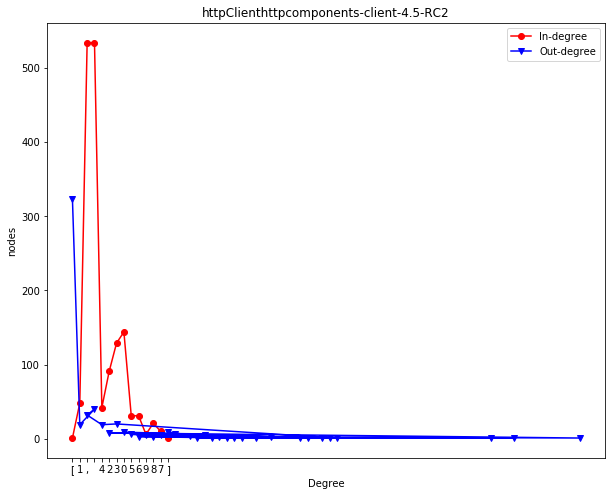

D:/mm_thesis/Software_graphs/D_graph/all_metrics/httpClient/Degree_Inh/httpClienthttpcomponents-client-4.5.1-RC1.png
__________________


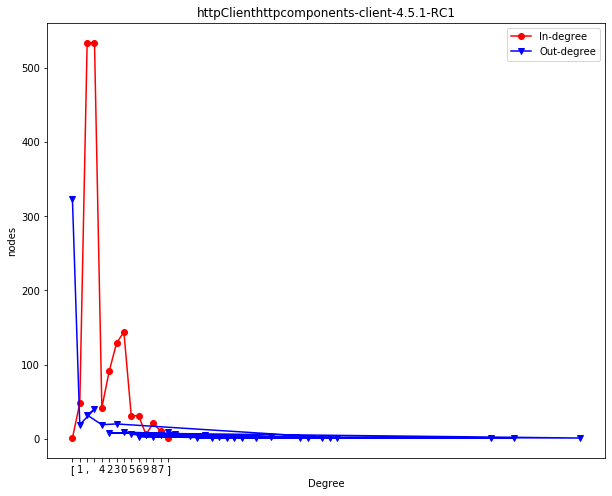

met_files  : ['Degree_cdot', 'Degree_coll', 'Degree_Inh', 'ivy-metrics.csv', 'Ivy_Call_mat.csv', 'ivy_cdot_m.csv', 'ivy_colldot_m.csv', 'Ivy_Coll_mat.csv', 'Ivy_heat_s_call_fixed.png', 'Ivy_heat_s_collab_fixed.png', 'Ivy_heat_s_Inh_fixed.png', 'ivy_Inhdot_m.csv', 'Ivy_Inh_mat.csv', 'scatter_plots']
s_path D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/ivy_Inhdot_m.csv
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-1.4.1.png
__________________


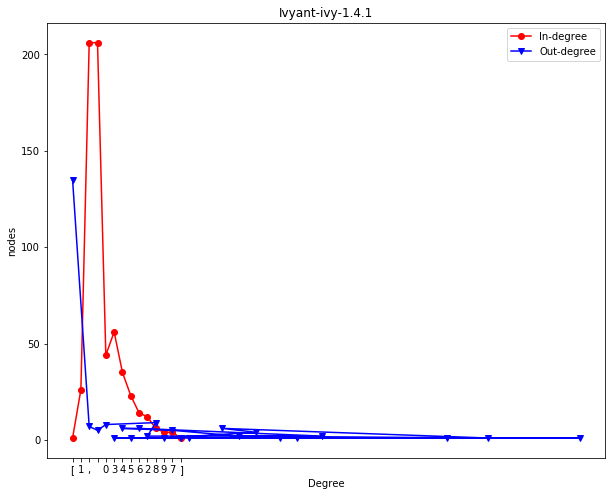

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.0.0.png
__________________


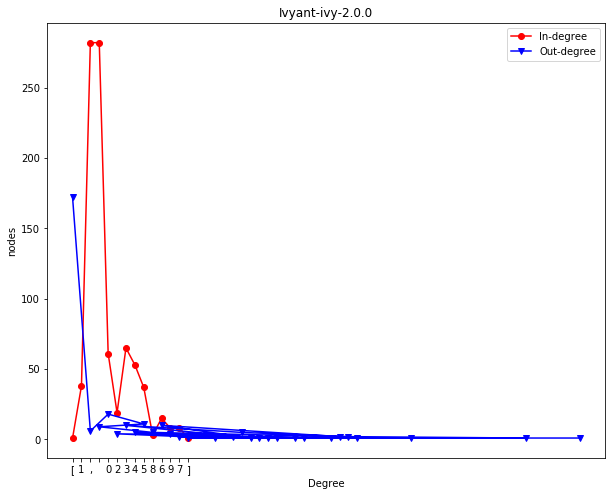

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.0.0-rc1.png
__________________


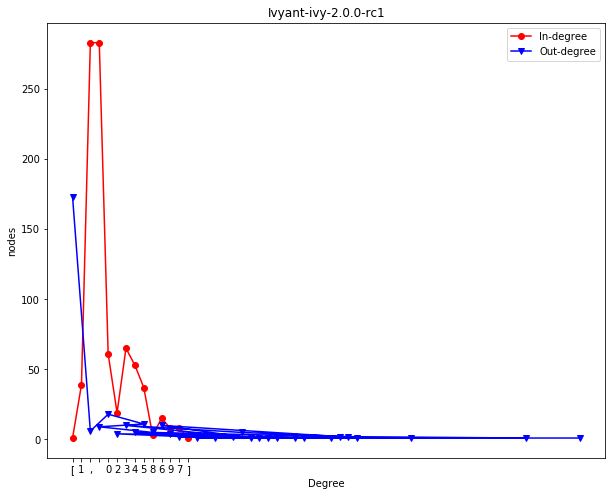

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.0.0-alpha2.png
__________________


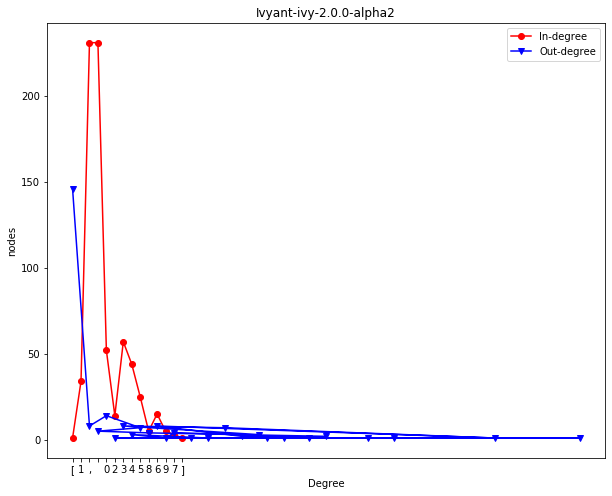

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.0.0-rc2.png
__________________


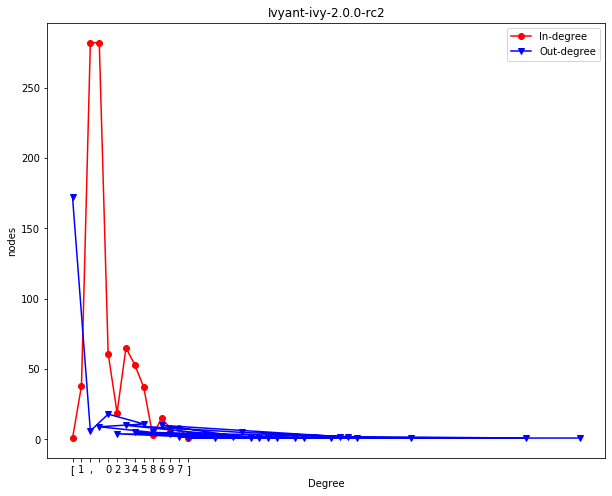

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.0.0-beta1.png
__________________


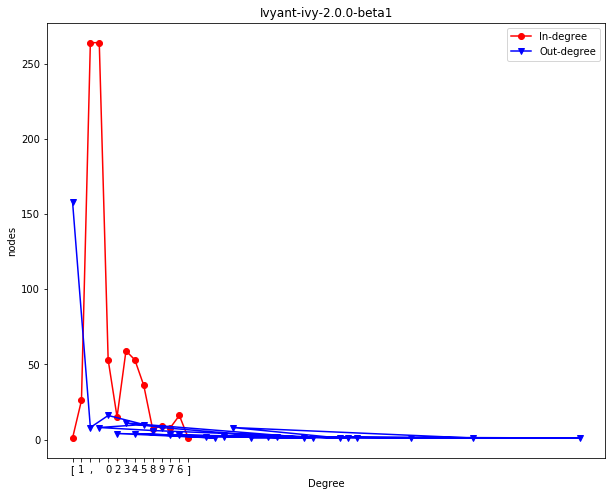

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.0.0-beta2.png
__________________


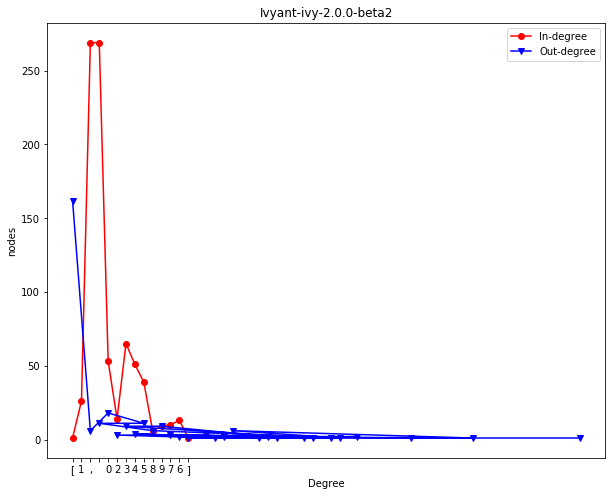

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.1.0.png
__________________


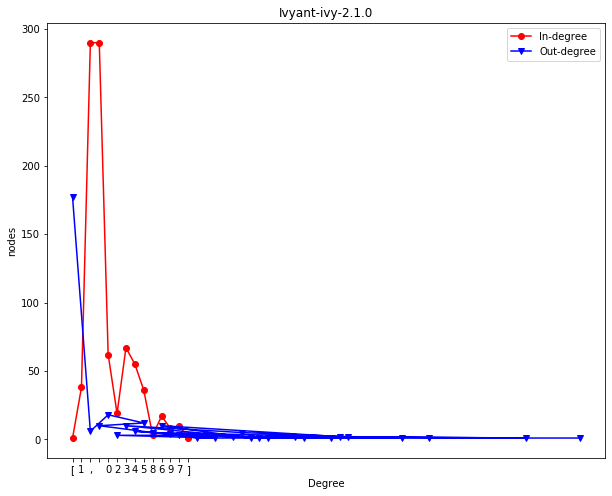

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.1.0-rc1.png
__________________


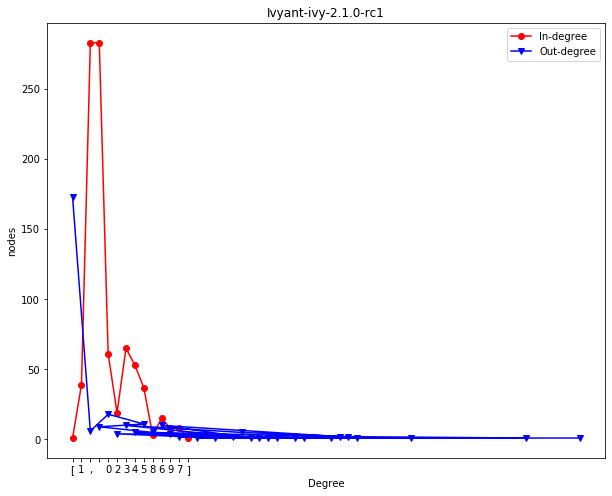

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.1.0-rc2.png
__________________


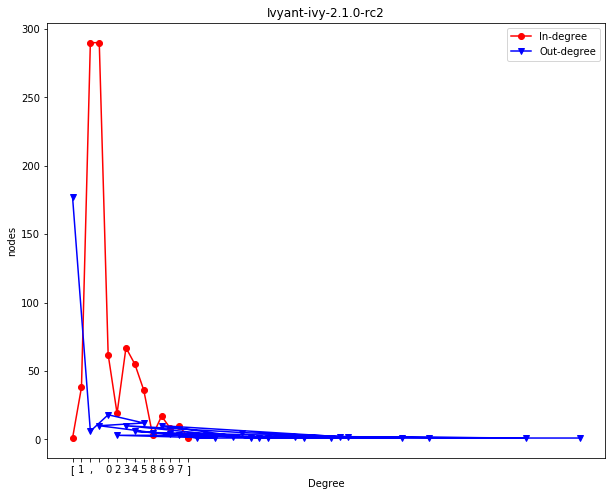

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.2.0.png
__________________


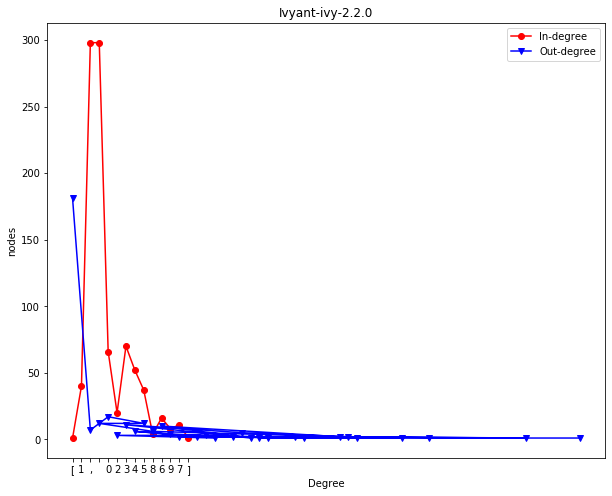

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.2.0-rc1.png
__________________


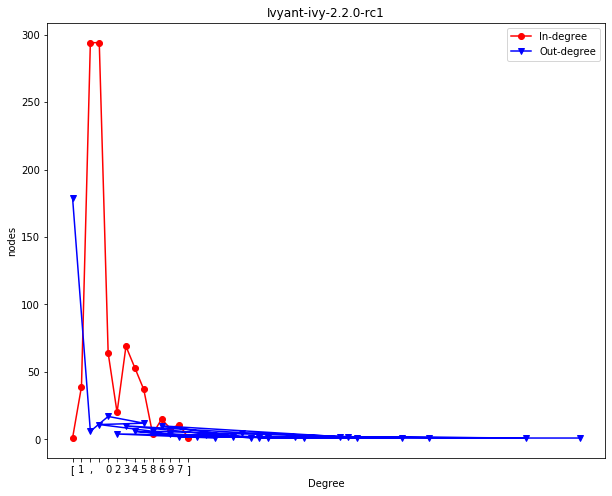

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.3.0.png
__________________


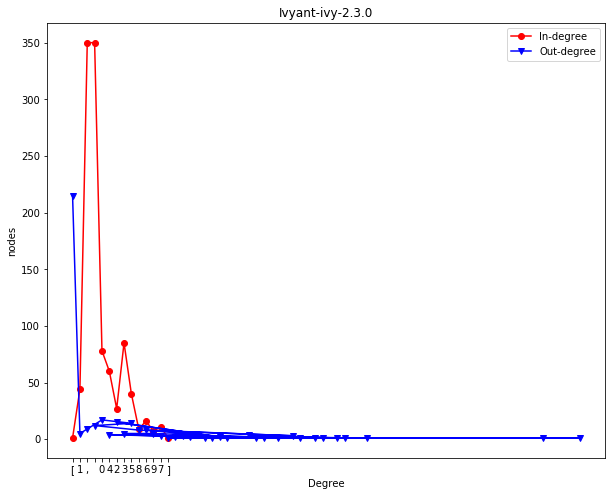

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.3.0-rc1.png
__________________


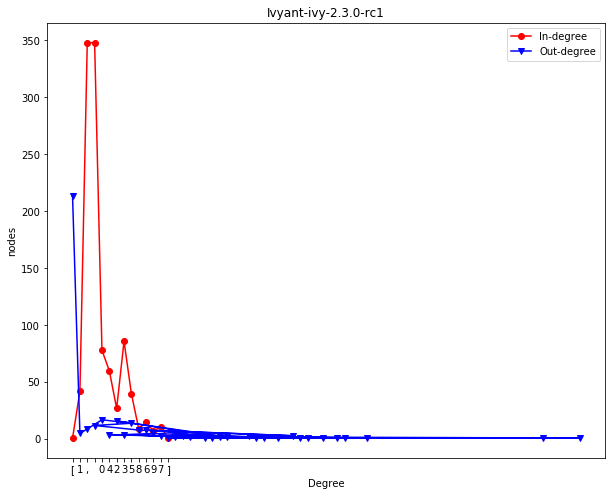

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.3.0-rc2.png
__________________


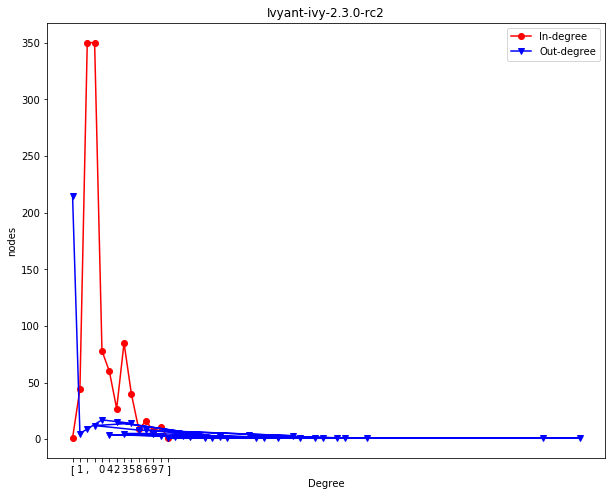

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.4.0.png
__________________


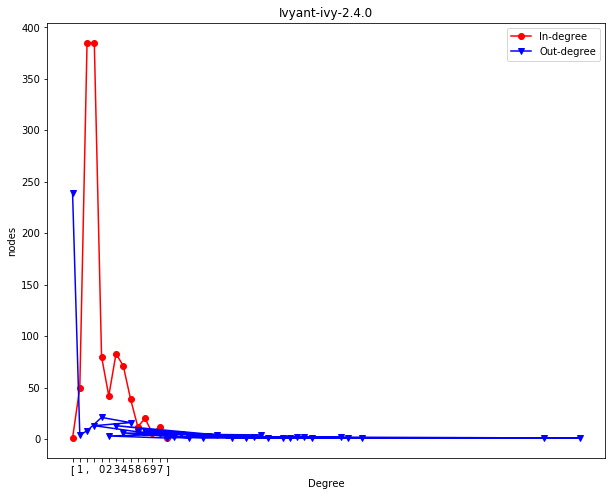

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.4.0-rc1_OLD.png
__________________


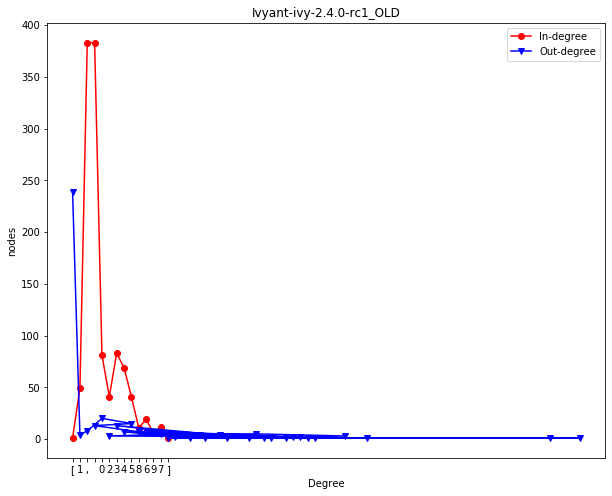

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Ivy/Degree_Inh/Ivyant-ivy-2.4.0-rc1.png
__________________


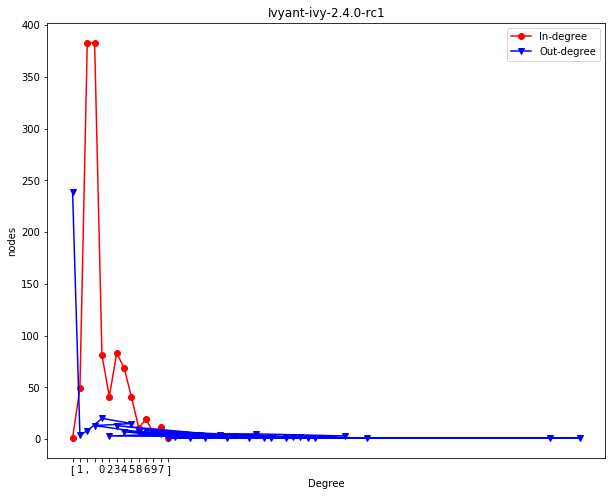

met_files  : ['Degree_cdot', 'Degree_coll', 'Degree_Inh', 'Jena_Call_mat.csv', 'jena_cdot_m.csv', 'jena_colldot_m.csv', 'Jena_Coll_mat.csv', 'Jena_heat_s_call_fixed.png', 'Jena_heat_s_collab_fixed.png', 'Jena_heat_s_Inh_fixed.png', 'jena_Inhdot_m.csv', 'Jena_Inh_mat.csv', 'jena_metrics.csv', 'scatter_plots']
s_path D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/jena_Inhdot_m.csv
D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.10.0.png
__________________


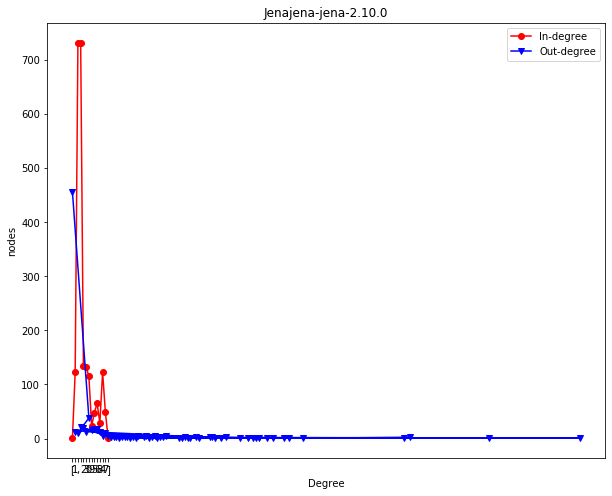

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.10.1.png
__________________


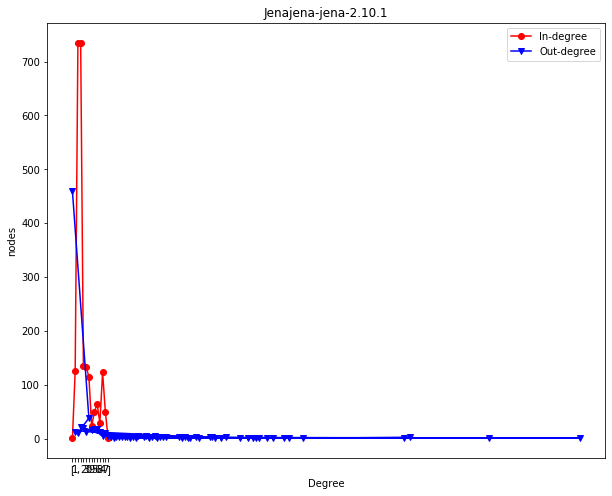

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.11.0.png
__________________


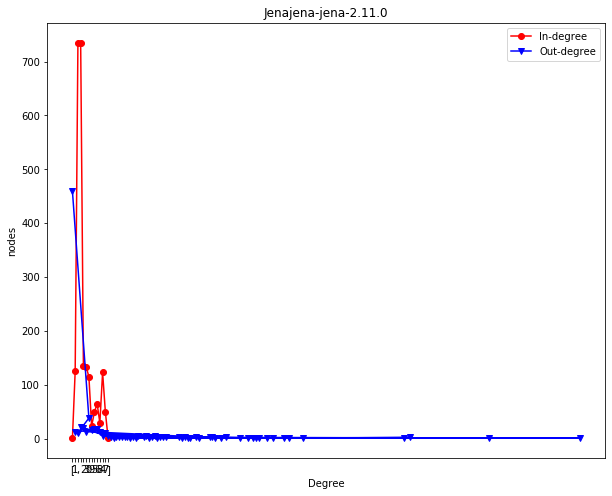

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.7.1.png
__________________


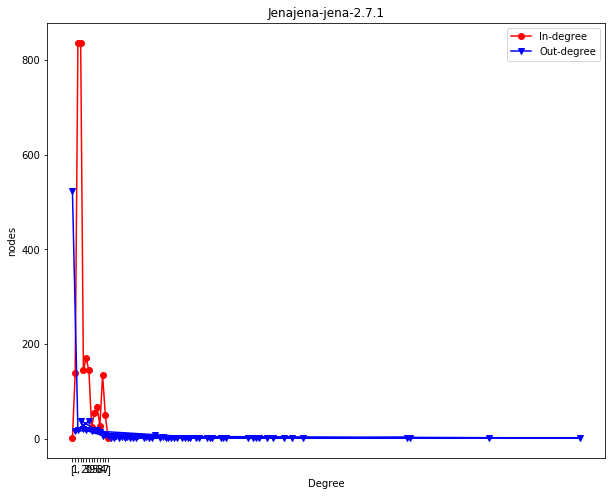

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.7.2.png
__________________


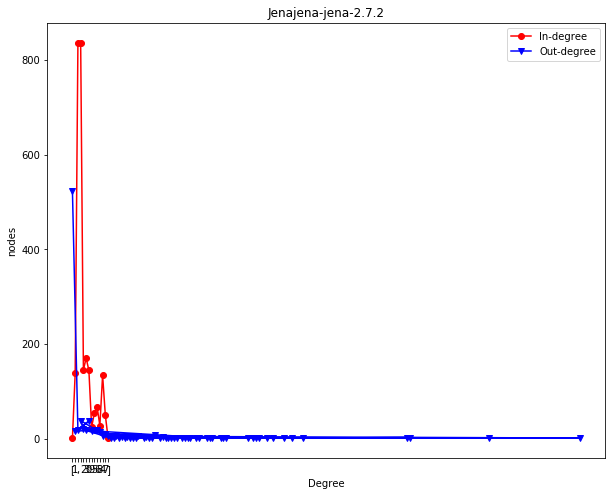

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.7.3.png
__________________


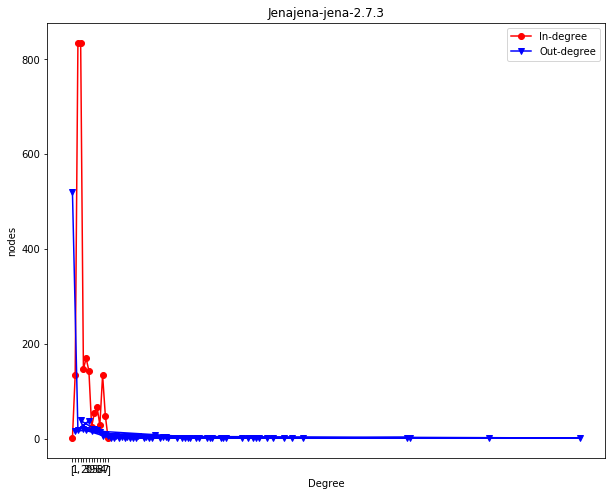

D:/mm_thesis/Software_graphs/D_graph/all_metrics/Jena/Degree_Inh/Jenajena-jena-2.7.4.png
__________________


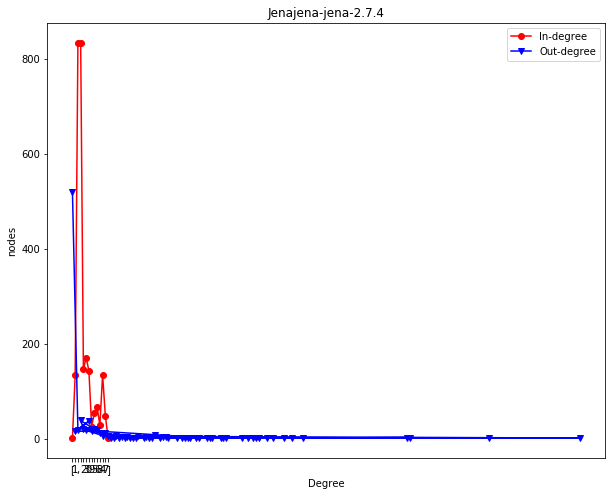

In [40]:
for p in c_path:
    met_files =  os.listdir(p)
    p1 = p[:-1]
    s1 = p1.rfind("/")
    f_name = p1[s1+1:] 
    print('met_files  :', met_files)
#     print(p)
#     print(met_files)
#     print(30*"__")

    f_m = [(os.path.join(p,i ))for i in met_files]
    s_path = [(os.path.join(p,i)+'/')for i in met_files if (os.path.isdir(os.path.join(p,i)) and i.find('Degree') != -1)]
    s_path= s_path[2]
    print('s_path',s_path)
        
#     print('s_path  :', s_path)
#     print(30*'_')
#     print('f_save',f_save)
# #     f_name = soft_name[f_pos +1:]
# #     print('f_name',f_name)
    

#     soft_m = [f for f in f_m if f.find('metrics.csv')!=-1]
 #### for the CdDOT   
#     network_graph = [f for f in f_m if f.find('cdot_m')!= -1]
#     print(network_graph[0])
#     network_metric = pd.read_csv(network_graph [0],converters={'inCOunt': eval, 'outCount' : eval})
    
 #### for the collabroation   
#     network_graph = [f for f in f_m if f.find('colldot_m')!= -1]
#     print(network_graph[0])
#     network_metric = pd.read_csv(network_graph [0],converters={'inCOunt': eval, 'outCount' : eval})
    
### for the Inhertence    
    
    network_graph = [f for f in f_m if f.find('Inhdot_m')!= -1]
    print(network_graph[0])
    network_metric = pd.read_csv(network_graph [0],converters={'inCOunt': eval, 'outCount' : eval})

#    
 
    
# #     print(network_metric.head())
    for i, row in network_metric.iterrows():
            
            version = row['Version']
#             print(i)
            t_name = f_name+ version
#             print(t_name)
            to_save = t_name+'.png'
            file_path = os.path.join(s_path,to_save)
            print(file_path)
            print('__________________')
            
            in_sequence  = row['inCount']
            in_degreeCount = collections.Counter(in_sequence)
            d_in, n_in = zip(*in_degreeCount.items())
            
                     
            
            out_sequence = row['outCount']
            out_degreeCount = collections.Counter(out_sequence)
            d_out, n_out = zip(*out_degreeCount.items())
            
########## printing the power laws
            fig = plt.figure(figsize=(10,8))
            ax = fig.add_subplot(111)
            ax.plot(d_in,n_in,'ro-')
            ax.plot(d_out,n_out,'bv-')
            ax.legend(['In-degree','Out-degree'])
            ax.set_ylabel('nodes')
            ax.set_xlabel('Degree')
            ax.set_title(t_name)
            plt.savefig(file_path)
            plt.show()